In [1]:
import numpy as np
import pandas as pd 
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rc("xtick", labelsize=16)
mpl.rc('ytick', labelsize=16)
mpl.rc('axes', labelsize=16)

Data preparation

In [3]:
df = pd.read_csv("diabetes.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
df = df.iloc[:,:-1]

# KMeans

In [6]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import time

In [105]:
inertia_score_km = []
s_score_km = []
time_arr_km = []
for k in range(2,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df.values)
    time_arr_km.append(time.time()-t1)
    inertia_score_km.append(kmeans.inertia_)
    s_score_km.append(silhouette_score(df.values, kmeans.labels_)) 

In [106]:
# plotting function

def plotting(x, y, xlabel=None, ylabel=None, color=None, label=None):
    
    plt.figure(figsize=(5,5))
    plt.plot(x, y, marker="o", color=color)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tick_params(length=5)
    ax = plt.gca()
    plt.savefig('{} vs. {}.png'.format(ylabel, xlabel), bbox_inches = 'tight', dpi=300)
    plt.tight_layout()
    
    return ax

<AxesSubplot: xlabel='No. of Clusters', ylabel='Inertia'>

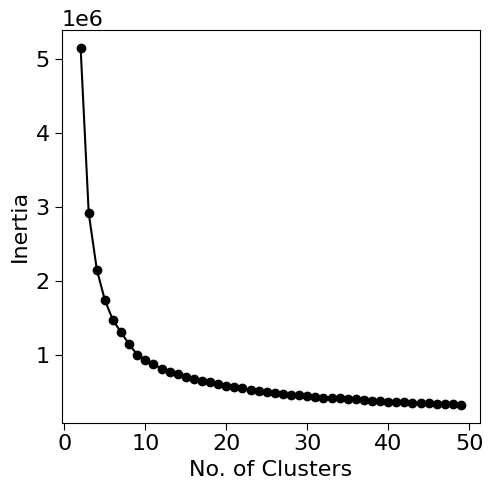

In [107]:
plotting(range(2,50),inertia_score_km, xlabel='No. of Clusters', ylabel='Inertia', color='black')

<AxesSubplot: xlabel='No. of Clusters', ylabel='Silhouette Score'>

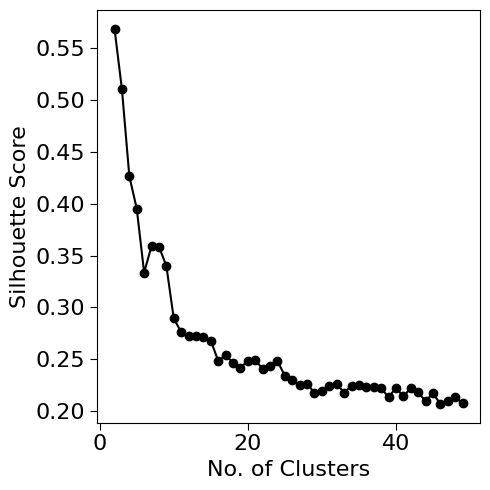

In [108]:
plotting(range(2,50),s_score_km, xlabel='No. of Clusters', ylabel='Silhouette Score', color='black')

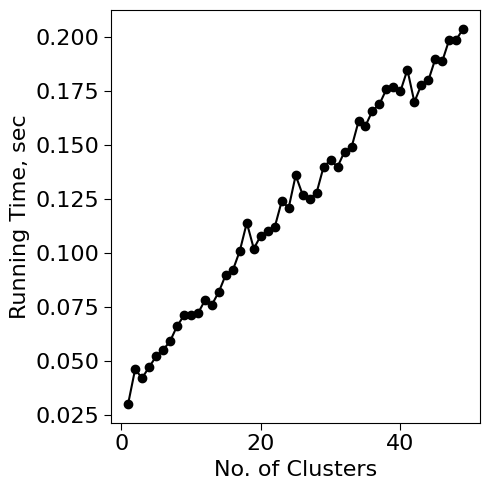

In [112]:
time_arr_km = []
for k in range(1,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df.values)
    time_arr_km.append(time.time()-t1) 
    
ax = plotting(range(1,50),time_arr_km, xlabel='No. of Clusters', ylabel='Running Time, sec', color='black', label='raw data')

# GMM

In [21]:
from sklearn.mixture import GaussianMixture

In [113]:
bic = []
aic = []
time_arr_gmm = []
for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k).fit(df.values)
    time_arr_gmm.append(time.time()-t1)

    bic.append(gm.bic(df.values))
    aic.append(gm.aic(df.values))

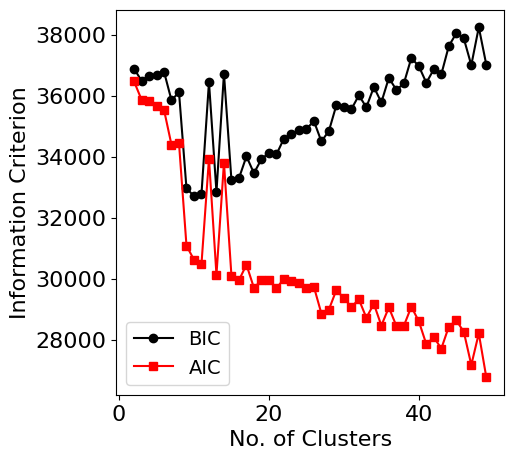

In [32]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50),bic, color='black', marker='o', label='BIC')
ax.plot(range(2,50),aic, color='red', marker='s', label='AIC')
ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Information Criterion')
ax.legend(fontsize=14)
plt.savefig('BIC and AIC.png', bbox_inches = 'tight', dpi=300)
plt.show()

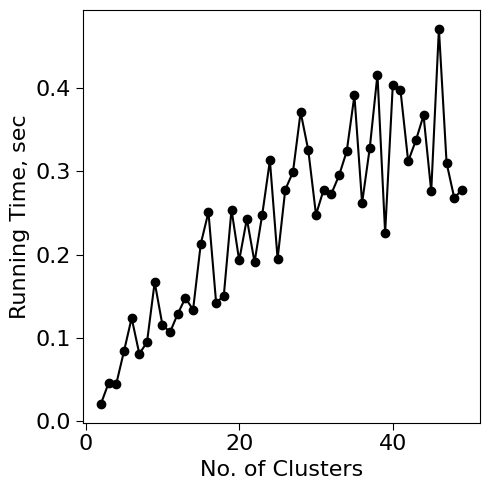

In [114]:
ax = plotting(range(2,50),time_arr_gmm, xlabel='No. of Clusters', ylabel='Running Time, sec', color='black')

In [115]:
s_score_gm = []

time_arr_gm_sil = []
for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k, n_init=10).fit(df.values)
    time_arr_gm_sil.append(time.time()-t1)
    s_score_gm.append(silhouette_score(df.values, gm.predict(df.values))) 

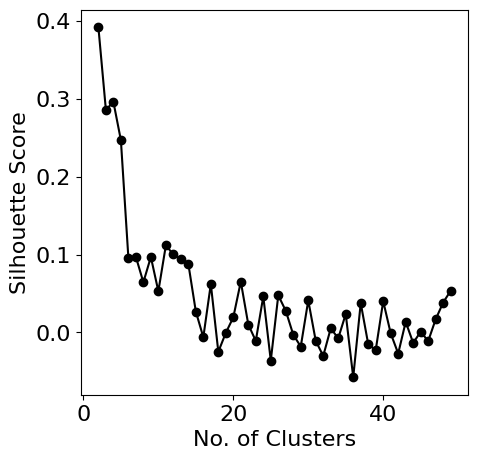

In [116]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50),s_score_gm,color='black', marker='o')
ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Silhouette Score')
plt.savefig('silhouette score_EM.png', bbox_inches = 'tight', dpi=300)

# PCA

In [45]:
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error

In [46]:
variance_arr_pca = []
error_arr_pca = []
for i in range(1, len(df.columns)+1):
    pca = PCA(n_components=i)
    pca.fit(df.values)
    variance_arr_pca.append(np.sum(pca.explained_variance_ratio_))
    
    X_reduced = pca.transform(df.values)
    X_prespace = pca.inverse_transform(X_reduced)
    error_arr_pca.append(mean_squared_error(df.values, X_prespace))

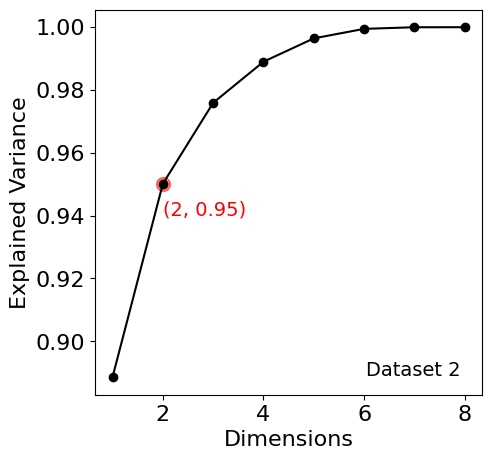

In [55]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), variance_arr_pca, color='black', marker='o')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Explained Variance')
ax.text(0.7, 0.05, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.scatter(2, 0.9501374183215019, c='red', s=100, alpha=0.5)
ax.text(2, 0.94, '(2, 0.95)', fontsize=14, color='red')


plt.savefig("variance_arr_pca.png", dpi=300, bbox_inches='tight')


In [51]:
[*zip(range(1, len(df.columns)+1), variance_arr_pca)]

[(1, 0.8885466345756247),
 (2, 0.9501374183215019),
 (3, 0.9759275372391624),
 (4, 0.9890136746543032),
 (5, 0.9964546132941908),
 (6, 0.9994807624824162),
 (7, 0.9999932073569858),
 (8, 0.9999999999999999)]

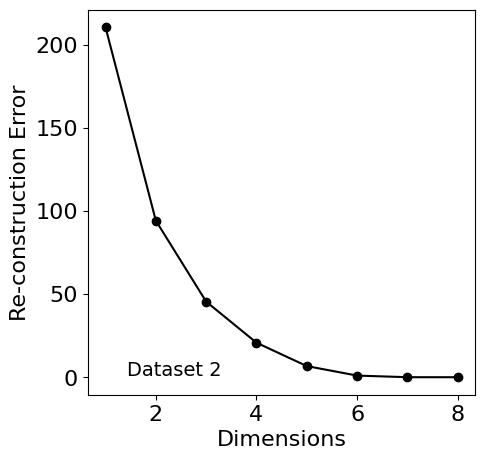

In [50]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), error_arr_pca, color='black', marker='o')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Re-construction Error')
ax.text(0.1, 0.05, 'Dataset 2', transform=ax.transAxes, fontsize=14)
plt.savefig("MSE_arr_pca.png", dpi=300, bbox_inches='tight')
plt.show()

# ICA

In [56]:
from sklearn.decomposition import FastICA
from scipy.stats import kurtosis

In [68]:
kur_arr = []
error_arr_ica = []
for i in range(1, len(df.columns)+1):
    ica = FastICA(n_components=i)
    ica.fit(df.values)
#     variance_arr.append(np.sum(pca.explained_variance_ratio_))
    
    X_reduced = ica.transform(df.values)
    kur_arr.append(np.mean(np.abs(kurtosis(X_reduced))))
    
    X_prespace = ica.inverse_transform(X_reduced)
    error_arr_ica.append(mean_squared_error(df.values, X_prespace))

C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='un

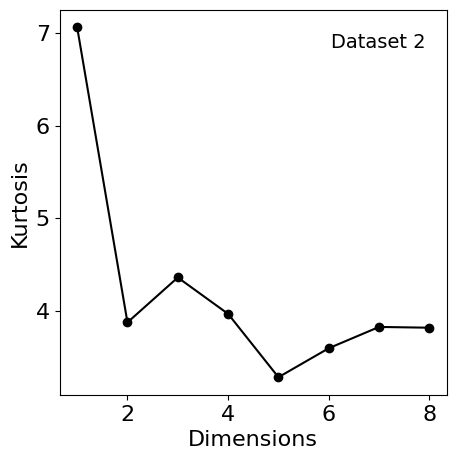

In [69]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), kur_arr, color='black', marker='o')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Kurtosis')
ax.text(0.7, 0.9, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig("kurtosis_ica.png", dpi=300, bbox_inches='tight')

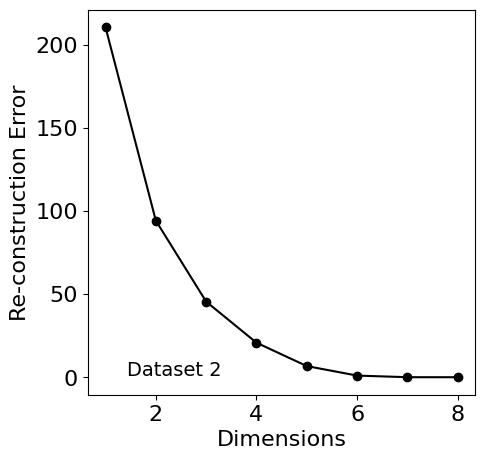

In [70]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), error_arr_ica, color='black', marker='o')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Re-construction Error')
ax.text(0.1, 0.05, 'Dataset 2', transform=ax.transAxes, fontsize=14)
plt.savefig("MSE_arr_ica.png", dpi=300, bbox_inches='tight')
plt.show()

# Randomized Projections -- RP

In [71]:
from sklearn import random_projection
from sklearn.random_projection import SparseRandomProjection, GaussianRandomProjection

In [72]:
error_arr_sRP = []
for i in range(1, len(df.columns)+1):
    rand_proj = SparseRandomProjection(n_components=i, compute_inverse_components=True)
    rand_proj.fit(df.values)
#     variance_arr.append(np.sum(pca.explained_variance_ratio_))
    
    X_reduced = rand_proj.transform(df.values)   
    X_prespace = rand_proj.inverse_transform(X_reduced)
    error_arr_sRP.append(mean_squared_error(df.values, X_prespace))

In [73]:
error_arr_gRP = []
for i in range(1, len(df.columns)+1):
    rand_proj = GaussianRandomProjection(n_components=i, compute_inverse_components=True)
    rand_proj.fit(df.values)
#     variance_arr.append(np.sum(pca.explained_variance_ratio_))
    
    X_reduced = rand_proj.transform(df.values)   
    X_prespace = rand_proj.inverse_transform(X_reduced)
    error_arr_gRP.append(mean_squared_error(df.values, X_prespace))

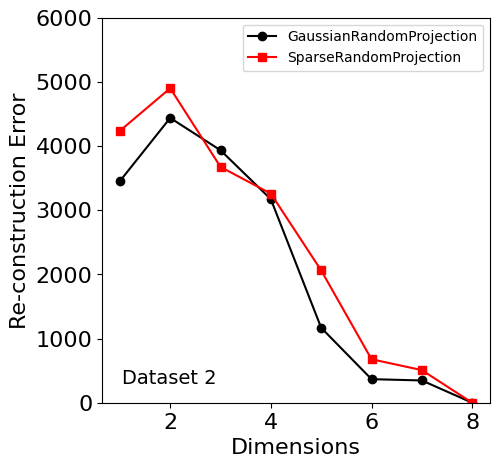

In [78]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), error_arr_gRP, color='black', marker='o', label='GaussianRandomProjection')
ax.plot(range(1, len(df.columns)+1), error_arr_sRP, color='red', marker='s', label='SparseRandomProjection')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Re-construction Error')
ax.text(0.05, 0.05, 'Dataset 2', transform=ax.transAxes, fontsize=14)
ax.set_ylim(0, 6000)
plt.legend()
plt.savefig("MSE_RP_both.png", dpi=300, bbox_inches='tight')

# Dictionary learning

In [79]:
from sklearn.decomposition import DictionaryLearning

In [80]:
error_arr_dl=[]
spars_arr_dl=[]
for i in range(1, len(df.columns)+1):
    dict_learner = DictionaryLearning(n_components=i)
    X_DL = dict_learner.fit_transform(df.values)
    X_hat = X_DL@dict_learner.components_
    loss = np.mean(np.sum((X_hat-df.values)**2, axis=1)/np.sum(df.values**2, axis=1))
    error_arr_dl.append(loss)
    spars_arr_dl.append(np.mean(X_DL==0))

<AxesSubplot: xlabel='Dimensions', ylabel='Level of Sparisity'>

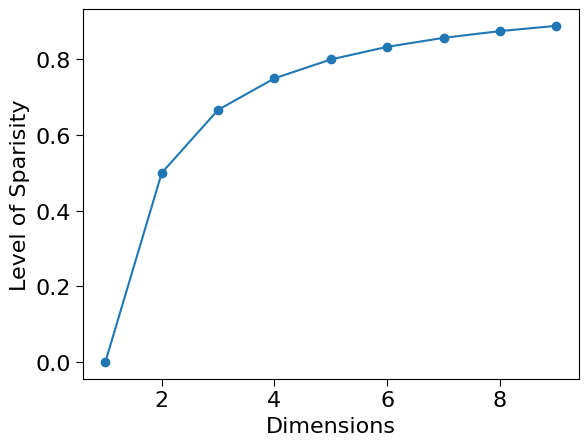

In [27]:
plotting(range(1, len(df.columns)+1), spars_arr, xlabel='Dimensions', ylabel='Level of Sparisity')

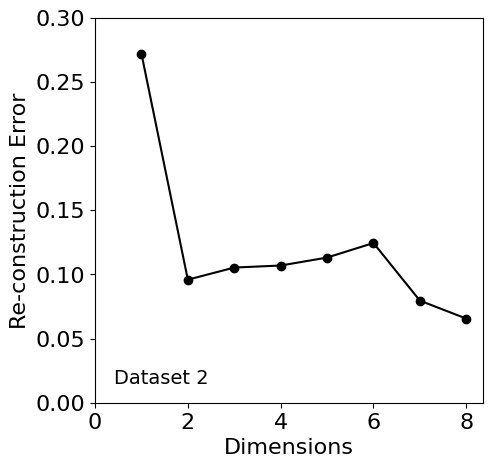

In [87]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(1, len(df.columns)+1), error_arr_dl, marker='o', color='black')
ax.set_xlabel('Dimensions')
ax.set_ylabel('Re-construction Error')
major_ticks = np.arange(0, 0.31, 0.05)
ax.set_yticks(major_ticks)
ax.set_xticks(np.arange(0, 8.1, 2 ))
ax.text(0.05, 0.05, 'Dataset 2', transform=ax.transAxes, fontsize=14)
plt.savefig('MSE_dl.png', bbox_inches='tight', dpi=300)
plt.show()

# Clustering after dim reduction

In [130]:
#datasets after dim reduction

#pca
t1 = time.time()
pca = PCA(n_components=2, random_state=4)
df_pca = pd.DataFrame(pca.fit_transform(df.values))
T_pca = time.time()-t1

#ICA
t1 = time.time()
ica = FastICA(n_components=2, random_state=4)
df_ica = pd.DataFrame(ica.fit_transform(df.values))
T_ica = time.time()-t1

#RCA
t1 = time.time()
rca = SparseRandomProjection(n_components=2, random_state=4)
df_rca = pd.DataFrame(rca.fit_transform(df.values))
T_rca = time.time()-t1

#dict learning
t1 = time.time()
dl = DictionaryLearning(n_components=2, random_state=4)
df_dl = pd.DataFrame(dl.fit_transform(df.values))
T_dl = time.time()-t1

C:\Users\Ruimin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


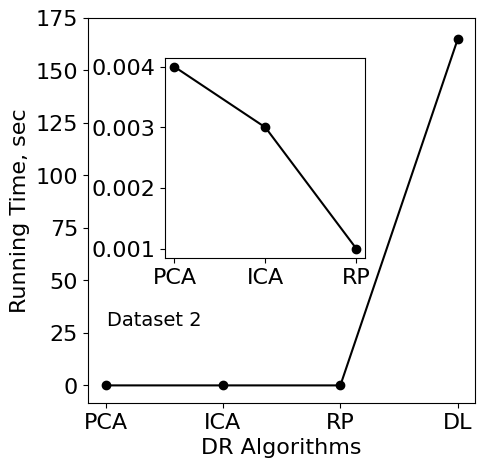

In [258]:
fig, ax = plt.subplots(figsize=(5,5))

ax.plot([1,2,3,4], [T_pca, T_ica, T_rca, T_dl], color='black', marker='o')
ax.set_xticks([1,2,3,4], labels=['PCA', 'ICA', 'RP', 'DL'])
ax.set_yticks(np.arange(-0, 175.1, 25))
ax.set_xlabel('DR Algorithms')
ax.set_ylabel('Running Time, sec')

ax.text(0.05, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

ax2 = fig.add_axes([0.28, 0.4, 0.4, 0.4])
ax2.plot([1,2,3], [T_pca, T_ica, T_rca], marker='o', color='black')
ax2.set_xticks([1,2,3], labels=['PCA', 'ICA', 'RP'])

plt.savefig('running time_all.png', dpi=300, bbox_inches='tight')

In [89]:
inertia_score_pca_km = []
s_score_pca_km = []
time_arr_pca_km = []

for k in range(2,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df_pca.values)
    time_arr_pca_km.append(time.time()-t1)
    inertia_score_pca_km.append(kmeans.inertia_)
    s_score_pca_km.append(silhouette_score(df_pca.values, kmeans.labels_)) 

In [92]:
inertia_score_ica_km = []
s_score_ica_km = []
time_arr_ica_km = []

for k in range(2,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df_ica.values)
    time_arr_ica_km.append(time.time()-t1)
    inertia_score_ica_km.append(kmeans.inertia_)
    s_score_ica_km.append(silhouette_score(df_ica.values, kmeans.labels_)) 

In [93]:
inertia_score_rca_km = []
s_score_rca_km = []
time_arr_rca_km = []

for k in range(2,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df_rca.values)
    time_arr_rca_km.append(time.time()-t1)
    inertia_score_rca_km.append(kmeans.inertia_)
    s_score_rca_km.append(silhouette_score(df_rca.values, kmeans.labels_)) 

In [94]:
inertia_score_dl_km = []
s_score_dl_km = []
time_arr_dl_km = []

for k in range(2,50):
    t1 = time.time()
    kmeans = KMeans(n_clusters=k).fit(df_dl.values)
    time_arr_dl_km.append(time.time()-t1)
    inertia_score_dl_km.append(kmeans.inertia_)
    s_score_dl_km.append(silhouette_score(df_dl.values, kmeans.labels_)) 

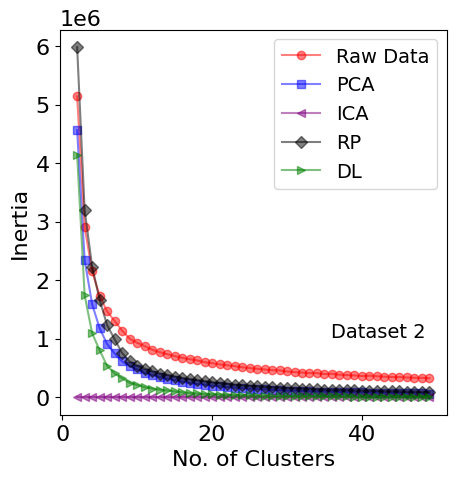

In [117]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50),inertia_score_km, color='red', marker='o', alpha=0.5, label='Raw Data')
ax.plot(range(2,50),inertia_score_pca_km, color='blue', marker='s', alpha=0.5, label='PCA')
ax.plot(range(2,50),inertia_score_ica_km, color='purple', marker='<', alpha=0.5, label='ICA')
ax.plot(range(2,50),inertia_score_rca_km, color='black', marker='D', alpha=0.5, label='RP')
ax.plot(range(2,50),inertia_score_dl_km, color='green', marker='>', alpha=0.5, label='DL')

ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Inertia')
ax.legend(fontsize=14)

ax.text(0.7, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig('Inertia for all_KM.png', dpi=300, bbox_inches='tight')
plt.show()

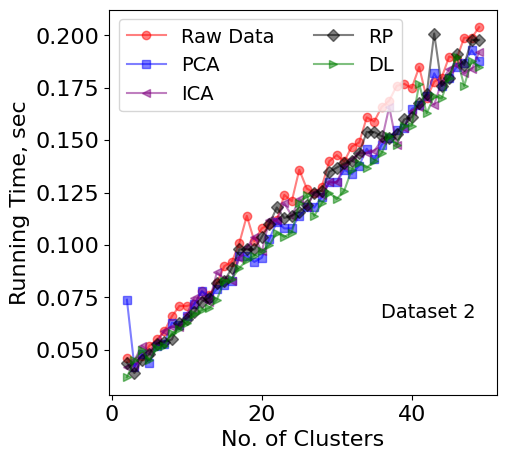

In [120]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50), time_arr_km[1:], color='red', marker='o', alpha=0.5, label='Raw Data')
ax.plot(range(2,50), time_arr_pca_km, color='blue', marker='s', alpha=0.5, label='PCA')
ax.plot(range(2,50), time_arr_ica_km, color='purple', marker='<', alpha=0.5, label='ICA')
ax.plot(range(2,50), time_arr_rca_km, color='black', marker='D', alpha=0.5, label='RP')
ax.plot(range(2,50), time_arr_dl_km, color='green', marker='>', alpha=0.5, label='DL')

ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Running Time, sec')
ax.legend(fontsize=14, ncols=2)

ax.text(0.7, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig('Running time for all_KM.png', dpi=300, bbox_inches='tight')
plt.show()

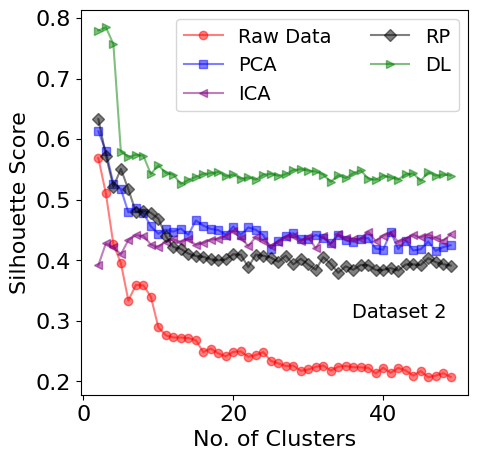

In [121]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50), s_score_km, color='red', marker='o', alpha=0.5, label='Raw Data')
ax.plot(range(2,50), s_score_pca_km, color='blue', marker='s', alpha=0.5, label='PCA')
ax.plot(range(2,50), s_score_ica_km, color='purple', marker='<', alpha=0.5, label='ICA')
ax.plot(range(2,50), s_score_rca_km, color='black', marker='D', alpha=0.5, label='RP')
ax.plot(range(2,50), s_score_dl_km, color='green', marker='>', alpha=0.5, label='DL')

ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Silhouette Score')
ax.legend(fontsize=14, ncols=2)

ax.text(0.7, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig('Sscore for all_KM.png', dpi=300, bbox_inches='tight')
plt.show()

In [122]:
s_score_pca_gm = []
time_arr_pca_gm = []

for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k, n_init=10).fit(df_pca.values)
    time_arr_pca_gm.append(time.time()-t1)
    s_score_pca_gm.append(silhouette_score(df_pca.values, gm.predict(df_pca.values))) 

In [123]:
s_score_ica_gm = []
time_arr_ica_gm = []

for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k, n_init=10).fit(df_ica.values)
    time_arr_ica_gm.append(time.time()-t1)
    s_score_ica_gm.append(silhouette_score(df_ica.values, gm.predict(df_ica.values))) 

In [124]:
s_score_rca_gm = []
time_arr_rca_gm = []

for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k, n_init=10).fit(df_rca.values)
    time_arr_rca_gm.append(time.time()-t1)
    s_score_rca_gm.append(silhouette_score(df_rca.values, gm.predict(df_rca.values))) 

In [125]:
s_score_dl_gm = []
time_arr_dl_gm = []

for k in range(2,50):
    t1 = time.time()
    gm = GaussianMixture(n_components=k, n_init=10).fit(df_dl.values)
    time_arr_dl_gm.append(time.time()-t1)
    s_score_dl_gm.append(silhouette_score(df_dl.values, gm.predict(df_dl.values))) 

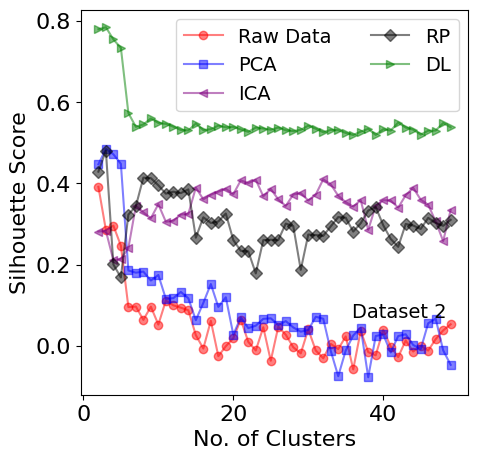

In [126]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50), s_score_gm, color='red', marker='o', alpha=0.5, label='Raw Data')
ax.plot(range(2,50), s_score_pca_gm, color='blue', marker='s', alpha=0.5, label='PCA')
ax.plot(range(2,50), s_score_ica_gm, color='purple', marker='<', alpha=0.5, label='ICA')
ax.plot(range(2,50), s_score_rca_gm, color='black', marker='D', alpha=0.5, label='RP')
ax.plot(range(2,50), s_score_dl_gm, color='green', marker='>', alpha=0.5, label='DL')

ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Silhouette Score')
ax.legend(fontsize=14, ncols=2)

ax.text(0.7, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig('Sscore for all_gM.png', dpi=300, bbox_inches='tight')
plt.show()

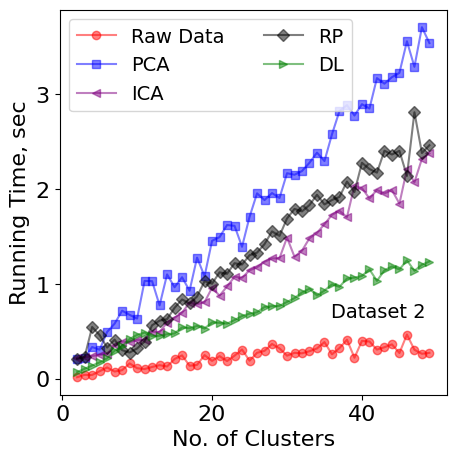

In [127]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(range(2,50), time_arr_gmm, color='red', marker='o', alpha=0.5, label='Raw Data')
ax.plot(range(2,50), time_arr_pca_gm, color='blue', marker='s', alpha=0.5, label='PCA')
ax.plot(range(2,50), time_arr_ica_gm, color='purple', marker='<', alpha=0.5, label='ICA')
ax.plot(range(2,50), time_arr_rca_gm, color='black', marker='D', alpha=0.5, label='RP')
ax.plot(range(2,50), time_arr_dl_gm, color='green', marker='>', alpha=0.5, label='DL')

ax.set_xlabel('No. of Clusters')
ax.set_ylabel('Running Time, sec')
ax.legend(fontsize=14, ncols=2)

ax.text(0.7, 0.2, 'Dataset 2', transform=ax.transAxes, fontsize=14)

plt.savefig('Running time for all_gM.png', dpi=300, bbox_inches='tight')
plt.show()

# Neural Network

In [175]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
import tensorflow_addons as tfa

In [178]:
y = pd.read_csv("diabetes.csv").iloc[:,-1]

In [176]:
dataset = [df, df_pca, df_ica, df_rca, df_dl]

In [182]:
dataset_norm = []
for f in dataset:
    f_norm = (f-f.min())/(f.max()-f.min())
    dataset_norm.append(f_norm)

df ---original dataset

In [184]:
from sklearn.model_selection import train_test_split as TTS

In [185]:
from tensorflow.keras.optimizers import SGD

In [205]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_norm[0], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(8,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6664 - f1_score: 0.0000e+00 - val_loss: 0.6667 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6561 - f1_score: 0.0000e+00 - val_loss: 0.6582 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6485 - f1_score: 0.0000e+00 - val_loss: 0.6508 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6423 - f1_score: 0.0000e+00 - val_loss: 0.6464 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6377 - f1_score: 0.0000e+00 - val_loss: 0.6425 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6341 - f1_score: 0.0000e+00 - val_loss: 0.6388 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6292 - f1_score: 0.0000

16/16 [==============================] - 0s 3ms/step - loss: 0.4655 - f1_score: 0.6263 - val_loss: 0.5598 - val_f1_score: 0.6598
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4681 - f1_score: 0.6205 - val_loss: 0.5314 - val_f1_score: 0.6341
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4659 - f1_score: 0.6601 - val_loss: 0.5338 - val_f1_score: 0.6279
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4621 - f1_score: 0.6382 - val_loss: 0.5378 - val_f1_score: 0.6207
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4637 - f1_score: 0.6488 - val_loss: 0.5373 - val_f1_score: 0.6279
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4639 - f1_score: 0.6492 - val_loss: 0.5352 - val_f1_score: 0.6279
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4601 - f1_score: 0.6376 - val_loss: 0.5466 - val_f1_score: 0.6593
Epoch 64/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4542 - f1_score: 0.6533 - val_loss: 0.5339 - val_f1_score: 0.6437
Epoch 115/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4507 - f1_score: 0.6536 - val_loss: 0.5761 - val_f1_score: 0.6535
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4475 - f1_score: 0.6752 - val_loss: 0.5425 - val_f1_score: 0.6292
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4497 - f1_score: 0.6472 - val_loss: 0.5444 - val_f1_score: 0.5946
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4524 - f1_score: 0.6327 - val_loss: 0.5320 - val_f1_score: 0.6588
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4496 - f1_score: 0.6532 - val_loss: 0.5352 - val_f1_score: 0.6437
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4466 - f1_score: 0.6403 - val_loss: 0.5351 - val_f1_score: 0.6437
Epoch 1

Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4414 - f1_score: 0.6536 - val_loss: 0.5363 - val_f1_score: 0.6304
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4418 - f1_score: 0.6731 - val_loss: 0.5187 - val_f1_score: 0.6512
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4397 - f1_score: 0.6579 - val_loss: 0.5397 - val_f1_score: 0.6237
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4403 - f1_score: 0.6513 - val_loss: 0.5420 - val_f1_score: 0.6383
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4371 - f1_score: 0.6794 - val_loss: 0.5556 - val_f1_score: 0.6392
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4459 - f1_score: 0.6561 - val_loss: 0.5244 - val_f1_score: 0.6512
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4437 - f1_score: 0.6579 - val_loss: 0.5181 - val_f1_score:

Epoch 228/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4356 - f1_score: 0.6709 - val_loss: 0.5243 - val_f1_score: 0.6585
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4346 - f1_score: 0.6754 - val_loss: 0.5259 - val_f1_score: 0.6429
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4417 - f1_score: 0.6601 - val_loss: 0.5446 - val_f1_score: 0.6250
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4354 - f1_score: 0.6814 - val_loss: 0.5216 - val_f1_score: 0.6506
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4319 - f1_score: 0.6733 - val_loss: 0.5323 - val_f1_score: 0.6437
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4384 - f1_score: 0.6471 - val_loss: 0.5276 - val_f1_score: 0.6512
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4357 - f1_score: 0.6494 - val_loss: 0.5274 - val_f1_score:

Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4334 - f1_score: 0.6711 - val_loss: 0.5370 - val_f1_score: 0.6067
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4351 - f1_score: 0.6837 - val_loss: 0.5295 - val_f1_score: 0.6429
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4333 - f1_score: 0.6557 - val_loss: 0.5545 - val_f1_score: 0.6458
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4332 - f1_score: 0.6773 - val_loss: 0.5323 - val_f1_score: 0.6250
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4369 - f1_score: 0.6305 - val_loss: 0.5323 - val_f1_score: 0.6279
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4321 - f1_score: 0.6667 - val_loss: 0.5345 - val_f1_score: 0.6329
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4380 - f1_score: 0.6667 - val_loss: 0.5725 - val_f1_score:

Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4303 - f1_score: 0.6536 - val_loss: 0.5401 - val_f1_score: 0.6067
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4323 - f1_score: 0.6556 - val_loss: 0.5278 - val_f1_score: 0.6506
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4294 - f1_score: 0.6623 - val_loss: 0.5284 - val_f1_score: 0.6506
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4341 - f1_score: 0.6623 - val_loss: 0.5303 - val_f1_score: 0.6329
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4312 - f1_score: 0.6532 - val_loss: 0.5310 - val_f1_score: 0.6420
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4294 - f1_score: 0.6441 - val_loss: 0.5330 - val_f1_score: 0.6279
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4306 - f1_score: 0.6688 - val_loss: 0.5346 - val_f1_score:

Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4306 - f1_score: 0.6752 - val_loss: 0.5957 - val_f1_score: 0.6667
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4358 - f1_score: 0.6730 - val_loss: 0.5385 - val_f1_score: 0.6279
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4289 - f1_score: 0.6623 - val_loss: 0.5496 - val_f1_score: 0.6237
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4255 - f1_score: 0.6645 - val_loss: 0.5492 - val_f1_score: 0.6022
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4303 - f1_score: 0.6557 - val_loss: 0.5415 - val_f1_score: 0.6329
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4252 - f1_score: 0.6797 - val_loss: 0.5372 - val_f1_score: 0.6279
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4282 - f1_score: 0.6645 - val_loss: 0.5370 - val_f1_score:

Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4265 - f1_score: 0.6645 - val_loss: 0.5386 - val_f1_score: 0.6136
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4275 - f1_score: 0.6579 - val_loss: 0.5486 - val_f1_score: 0.6237
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4244 - f1_score: 0.6689 - val_loss: 0.5617 - val_f1_score: 0.6392
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4272 - f1_score: 0.6535 - val_loss: 0.5958 - val_f1_score: 0.6667
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4281 - f1_score: 0.6730 - val_loss: 0.5358 - val_f1_score: 0.6353
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4304 - f1_score: 0.6469 - val_loss: 0.5389 - val_f1_score: 0.6067
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4264 - f1_score: 0.6753 - val_loss: 0.5353 - val_f1_score:

Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4254 - f1_score: 0.6772 - val_loss: 0.5396 - val_f1_score: 0.6279
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4239 - f1_score: 0.6577 - val_loss: 0.5727 - val_f1_score: 0.6327
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4253 - f1_score: 0.6730 - val_loss: 0.5472 - val_f1_score: 0.6222
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4229 - f1_score: 0.6689 - val_loss: 0.5390 - val_f1_score: 0.6353
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4214 - f1_score: 0.6943 - val_loss: 0.5434 - val_f1_score: 0.6494
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4257 - f1_score: 0.6577 - val_loss: 0.5373 - val_f1_score: 0.6420
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4275 - f1_score: 0.6463 - val_loss: 0.5518 - val_f1_score:

Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4218 - f1_score: 0.6689 - val_loss: 0.5440 - val_f1_score: 0.6410
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4232 - f1_score: 0.6689 - val_loss: 0.5672 - val_f1_score: 0.6316
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4238 - f1_score: 0.6623 - val_loss: 0.5381 - val_f1_score: 0.6279
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4223 - f1_score: 0.6622 - val_loss: 0.5559 - val_f1_score: 0.6383
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4227 - f1_score: 0.6645 - val_loss: 0.5396 - val_f1_score: 0.6292
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4232 - f1_score: 0.6689 - val_loss: 0.5443 - val_f1_score: 0.6222
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4255 - f1_score: 0.6515 - val_loss: 0.5388 - val_f1_score:

Epoch 627/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4178 - f1_score: 0.6837 - val_loss: 0.5748 - val_f1_score: 0.6263
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4218 - f1_score: 0.6730 - val_loss: 0.5374 - val_f1_score: 0.6364
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4198 - f1_score: 0.6800 - val_loss: 0.5354 - val_f1_score: 0.6585
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4197 - f1_score: 0.6579 - val_loss: 0.5363 - val_f1_score: 0.6437
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4206 - f1_score: 0.6601 - val_loss: 0.5361 - val_f1_score: 0.6341
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4227 - f1_score: 0.6821 - val_loss: 0.5459 - val_f1_score: 0.6374
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4196 - f1_score: 0.6689 - val_loss: 0.5576 - val_f1_score:

Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4176 - f1_score: 0.6623 - val_loss: 0.5375 - val_f1_score: 0.6517
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4169 - f1_score: 0.6711 - val_loss: 0.5519 - val_f1_score: 0.6237
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4214 - f1_score: 0.6903 - val_loss: 0.5873 - val_f1_score: 0.6346
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4191 - f1_score: 0.6752 - val_loss: 0.5353 - val_f1_score: 0.6588
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4139 - f1_score: 0.6622 - val_loss: 0.5655 - val_f1_score: 0.6458
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4166 - f1_score: 0.6859 - val_loss: 0.5374 - val_f1_score: 0.6364
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4132 - f1_score: 0.6758 - val_loss: 0.5468 - val_f1_score:

Epoch 741/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4149 - f1_score: 0.6775 - val_loss: 0.5367 - val_f1_score: 0.6420
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4158 - f1_score: 0.6667 - val_loss: 0.5846 - val_f1_score: 0.6542
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4155 - f1_score: 0.6987 - val_loss: 0.5386 - val_f1_score: 0.6517
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4121 - f1_score: 0.6710 - val_loss: 0.5323 - val_f1_score: 0.6667
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4145 - f1_score: 0.6903 - val_loss: 0.5355 - val_f1_score: 0.6517
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4123 - f1_score: 0.6818 - val_loss: 0.5307 - val_f1_score: 0.6667
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4149 - f1_score: 0.6623 - val_loss: 0.5332 - val_f1_score:

Epoch 798/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4130 - f1_score: 0.6839 - val_loss: 0.5310 - val_f1_score: 0.6506
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4125 - f1_score: 0.6776 - val_loss: 0.5319 - val_f1_score: 0.6512
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4081 - f1_score: 0.6971 - val_loss: 0.5343 - val_f1_score: 0.6364
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4098 - f1_score: 0.6903 - val_loss: 0.5330 - val_f1_score: 0.6506
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4105 - f1_score: 0.6821 - val_loss: 0.5372 - val_f1_score: 0.6437
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4109 - f1_score: 0.6689 - val_loss: 0.5614 - val_f1_score: 0.6392
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4154 - f1_score: 0.7000 - val_loss: 0.5301 - val_f1_score:

Epoch 855/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4108 - f1_score: 0.6667 - val_loss: 0.5266 - val_f1_score: 0.6588
Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4092 - f1_score: 0.6820 - val_loss: 0.5362 - val_f1_score: 0.6593
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4091 - f1_score: 0.6984 - val_loss: 0.5476 - val_f1_score: 0.6186
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4092 - f1_score: 0.6775 - val_loss: 0.5545 - val_f1_score: 0.6327
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4131 - f1_score: 0.6837 - val_loss: 0.5279 - val_f1_score: 0.6512
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4098 - f1_score: 0.6842 - val_loss: 0.5314 - val_f1_score: 0.6512
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4127 - f1_score: 0.6881 - val_loss: 0.5293 - val_f1_score:

Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4116 - f1_score: 0.6776 - val_loss: 0.5312 - val_f1_score: 0.6591
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4119 - f1_score: 0.6623 - val_loss: 0.5321 - val_f1_score: 0.6667
Epoch 914/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4118 - f1_score: 0.6733 - val_loss: 0.5268 - val_f1_score: 0.6588
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4093 - f1_score: 0.6775 - val_loss: 0.5343 - val_f1_score: 0.6742
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4107 - f1_score: 0.6796 - val_loss: 0.5303 - val_f1_score: 0.6744
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4045 - f1_score: 0.6667 - val_loss: 0.5432 - val_f1_score: 0.6522
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4088 - f1_score: 0.7025 - val_loss: 0.5512 - val_f1_score:

Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4080 - f1_score: 0.6926 - val_loss: 0.5294 - val_f1_score: 0.6667
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4091 - f1_score: 0.6916 - val_loss: 0.5293 - val_f1_score: 0.6667
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3991 - f1_score: 0.6867 - val_loss: 0.5739 - val_f1_score: 0.6538
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4086 - f1_score: 0.6794 - val_loss: 0.5409 - val_f1_score: 0.6591
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4044 - f1_score: 0.7040 - val_loss: 0.5324 - val_f1_score: 0.6500
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4054 - f1_score: 0.7055 - val_loss: 0.5793 - val_f1_score: 0.6415
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4075 - f1_score: 0.6943 - val_loss: 0.5381 - val_f1_score:

Epoch 1026/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4032 - f1_score: 0.6823 - val_loss: 0.5632 - val_f1_score: 0.6263
Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4066 - f1_score: 0.6817 - val_loss: 0.5306 - val_f1_score: 0.6585
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4132 - f1_score: 0.6601 - val_loss: 0.5502 - val_f1_score: 0.6526
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4024 - f1_score: 0.7070 - val_loss: 0.5475 - val_f1_score: 0.6452
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4040 - f1_score: 0.7029 - val_loss: 0.5316 - val_f1_score: 0.6420
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4066 - f1_score: 0.6689 - val_loss: 0.5311 - val_f1_score: 0.6744
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4049 - f1_score: 0.6797 - val_loss: 0.5339 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4030 - f1_score: 0.6861 - val_loss: 0.5365 - val_f1_score: 0.6585
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4022 - f1_score: 0.6865 - val_loss: 0.5407 - val_f1_score: 0.6517
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4064 - f1_score: 0.7006 - val_loss: 0.5338 - val_f1_score: 0.6744
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4120 - f1_score: 0.6510 - val_loss: 0.5625 - val_f1_score: 0.6200
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4044 - f1_score: 0.7117 - val_loss: 0.5325 - val_f1_score: 0.6500
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4001 - f1_score: 0.6801 - val_loss: 0.5339 - val_f1_score: 0.6588
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4011 - f1_score: 0.6890 - val_loss: 0.5460 - val_f1_score: 0.6444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3996 - f1_score: 0.6803 - val_loss: 0.5816 - val_f1_score: 0.6346
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4051 - f1_score: 0.6901 - val_loss: 0.5500 - val_f1_score: 0.6374
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4016 - f1_score: 0.6906 - val_loss: 0.5325 - val_f1_score: 0.6667
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3995 - f1_score: 0.6863 - val_loss: 0.5507 - val_f1_score: 0.6304
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4004 - f1_score: 0.6818 - val_loss: 0.5359 - val_f1_score: 0.6667
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3984 - f1_score: 0.7036 - val_loss: 0.5457 - val_f1_score: 0.6444
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4081 - f1_score: 0.6926 - val_loss: 0.5341 - val_f1_score: 0.6588
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4027 - f1_score: 0.7032 - val_loss: 0.5361 - val_f1_score: 0.6500
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4077 - f1_score: 0.6823 - val_loss: 0.5604 - val_f1_score: 0.6667
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4021 - f1_score: 0.6837 - val_loss: 0.5652 - val_f1_score: 0.6800
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3997 - f1_score: 0.6968 - val_loss: 0.5486 - val_f1_score: 0.6444
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4001 - f1_score: 0.7059 - val_loss: 0.5684 - val_f1_score: 0.6465
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3987 - f1_score: 0.6987 - val_loss: 0.5529 - val_f1_score: 0.6383
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3985 - f1_score: 0.6948 - val_loss: 0.5442 - val_f1_score: 0.6517
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3997 - f1_score: 0.6799 - val_loss: 0.5362 - val_f1_score: 0.6667
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3950 - f1_score: 0.6756 - val_loss: 0.5613 - val_f1_score: 0.6667
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3929 - f1_score: 0.6943 - val_loss: 0.5410 - val_f1_score: 0.6667
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3973 - f1_score: 0.6732 - val_loss: 0.5390 - val_f1_score: 0.6667
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3988 - f1_score: 0.6776 - val_loss: 0.5427 - val_f1_score: 0.6517
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3963 - f1_score: 0.7157 - val_loss: 0.5494 - val_f1_score: 0.6593
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3991 - f1_score: 0.7016 - val_loss: 0.5646 - val_f1_score: 0.6465
E

16/16 [==============================] - 0s 5ms/step - loss: 0.3990 - f1_score: 0.7085 - val_loss: 0.5398 - val_f1_score: 0.6667
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3938 - f1_score: 0.7048 - val_loss: 0.6065 - val_f1_score: 0.6667
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4056 - f1_score: 0.7059 - val_loss: 0.5483 - val_f1_score: 0.6593
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3938 - f1_score: 0.7302 - val_loss: 0.5364 - val_f1_score: 0.6744
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3989 - f1_score: 0.6820 - val_loss: 0.5390 - val_f1_score: 0.6517
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3973 - f1_score: 0.6855 - val_loss: 0.5382 - val_f1_score: 0.6420
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3962 - f1_score: 0.7020 - val_loss: 0.5422 - val_f1_score: 0.6517
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3979 - f1_score: 0.6818 - val_loss: 0.5400 - val_f1_score: 0.6667
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3961 - f1_score: 0.6881 - val_loss: 0.5393 - val_f1_score: 0.6420
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3958 - f1_score: 0.6977 - val_loss: 0.5870 - val_f1_score: 0.6606
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3990 - f1_score: 0.6794 - val_loss: 0.5421 - val_f1_score: 0.6420
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3991 - f1_score: 0.6903 - val_loss: 0.5434 - val_f1_score: 0.6250
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3917 - f1_score: 0.6968 - val_loss: 0.5478 - val_f1_score: 0.6250
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3937 - f1_score: 0.7133 - val_loss: 0.6140 - val_f1_score: 0.6545
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3953 - f1_score: 0.7278 - val_loss: 0.5371 - val_f1_score: 0.6341
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3982 - f1_score: 0.7036 - val_loss: 0.5483 - val_f1_score: 0.6374
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3957 - f1_score: 0.6965 - val_loss: 0.5383 - val_f1_score: 0.6517
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3979 - f1_score: 0.6881 - val_loss: 0.5333 - val_f1_score: 0.6506
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3937 - f1_score: 0.7070 - val_loss: 0.5419 - val_f1_score: 0.6420
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3921 - f1_score: 0.7020 - val_loss: 0.5597 - val_f1_score: 0.6526
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3929 - f1_score: 0.7003 - val_loss: 0.5370 - val_f1_score: 0.6341
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.6945 - val_loss: 0.5328 - val_f1_score: 0.6437
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3902 - f1_score: 0.7010 - val_loss: 0.5584 - val_f1_score: 0.6804
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3900 - f1_score: 0.7261 - val_loss: 0.5718 - val_f1_score: 0.6667
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3929 - f1_score: 0.7037 - val_loss: 0.5747 - val_f1_score: 0.5867
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3968 - f1_score: 0.6933 - val_loss: 0.5339 - val_f1_score: 0.6437
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3910 - f1_score: 0.7227 - val_loss: 0.5315 - val_f1_score: 0.6506
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3906 - f1_score: 0.7129 - val_loss: 0.5310 - val_f1_score: 0.6588
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3909 - f1_score: 0.7138 - val_loss: 0.5431 - val_f1_score: 0.6250
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3908 - f1_score: 0.7208 - val_loss: 0.5303 - val_f1_score: 0.6506
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3962 - f1_score: 0.7115 - val_loss: 0.5340 - val_f1_score: 0.6341
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3921 - f1_score: 0.7124 - val_loss: 0.5350 - val_f1_score: 0.6420
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3894 - f1_score: 0.7184 - val_loss: 0.5389 - val_f1_score: 0.6444
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3921 - f1_score: 0.7107 - val_loss: 0.5334 - val_f1_score: 0.6437
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3908 - f1_score: 0.7097 - val_loss: 0.5381 - val_f1_score: 0.6444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3908 - f1_score: 0.7226 - val_loss: 0.5501 - val_f1_score: 0.5974
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3956 - f1_score: 0.6993 - val_loss: 0.5330 - val_f1_score: 0.6444
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3906 - f1_score: 0.7085 - val_loss: 0.5289 - val_f1_score: 0.6190
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3906 - f1_score: 0.7097 - val_loss: 0.5457 - val_f1_score: 0.6667
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3936 - f1_score: 0.7227 - val_loss: 0.5516 - val_f1_score: 0.6600
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3869 - f1_score: 0.7368 - val_loss: 0.5378 - val_f1_score: 0.6506
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3886 - f1_score: 0.7101 - val_loss: 0.5309 - val_f1_score: 0.6364
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3913 - f1_score: 0.7256 - val_loss: 0.5370 - val_f1_score: 0.6364
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3917 - f1_score: 0.7244 - val_loss: 0.5371 - val_f1_score: 0.6437
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3923 - f1_score: 0.7032 - val_loss: 0.5330 - val_f1_score: 0.6429
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3908 - f1_score: 0.7124 - val_loss: 0.5709 - val_f1_score: 0.6538
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3850 - f1_score: 0.7455 - val_loss: 0.5700 - val_f1_score: 0.5946
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3963 - f1_score: 0.7143 - val_loss: 0.5351 - val_f1_score: 0.6506
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3930 - f1_score: 0.7101 - val_loss: 0.5365 - val_f1_score: 0.6222
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3848 - f1_score: 0.7256 - val_loss: 0.5420 - val_f1_score: 0.6437
Epoch 1699/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3953 - f1_score: 0.6881 - val_loss: 0.5371 - val_f1_score: 0.6364
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3879 - f1_score: 0.7070 - val_loss: 0.5501 - val_f1_score: 0.6327
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7261 - val_loss: 0.5639 - val_f1_score: 0.6731
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3931 - f1_score: 0.7197 - val_loss: 0.5549 - val_f1_score: 0.6535
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3895 - f1_score: 0.7346 - val_loss: 0.5342 - val_f1_score: 0.6429
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3861 - f1_score: 0.7051 - val_loss: 0.5315 - val_f1_score: 0.6588
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4004 - f1_score: 0.7044 - val_loss: 0.5423 - val_f1_score: 0.6374
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7078 - val_loss: 0.5334 - val_f1_score: 0.6292
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3953 - f1_score: 0.7051 - val_loss: 0.5475 - val_f1_score: 0.6304
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3916 - f1_score: 0.7134 - val_loss: 0.5336 - val_f1_score: 0.6364
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3867 - f1_score: 0.7074 - val_loss: 0.5361 - val_f1_score: 0.6585
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3865 - f1_score: 0.7244 - val_loss: 0.5621 - val_f1_score: 0.6602
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3891 - f1_score: 0.7157 - val_loss: 0.5476 - val_f1_score: 0.6667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3960 - f1_score: 0.6984 - val_loss: 0.5328 - val_f1_score: 0.6585
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3854 - f1_score: 0.7267 - val_loss: 0.5376 - val_f1_score: 0.6585
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3935 - f1_score: 0.7029 - val_loss: 0.5818 - val_f1_score: 0.6667
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3938 - f1_score: 0.7210 - val_loss: 0.5398 - val_f1_score: 0.6517
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3928 - f1_score: 0.6959 - val_loss: 0.5331 - val_f1_score: 0.6279
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3898 - f1_score: 0.7161 - val_loss: 0.5831 - val_f1_score: 0.6604
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3939 - f1_score: 0.7063 - val_loss: 0.5340 - val_f1_score: 0.6506
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3907 - f1_score: 0.7032 - val_loss: 0.5591 - val_f1_score: 0.6471
Epoch 1867/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3903 - f1_score: 0.7147 - val_loss: 0.5443 - val_f1_score: 0.6526
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3872 - f1_score: 0.7188 - val_loss: 0.5335 - val_f1_score: 0.6585
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3861 - f1_score: 0.7308 - val_loss: 0.5520 - val_f1_score: 0.6735
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3877 - f1_score: 0.7220 - val_loss: 0.5779 - val_f1_score: 0.6667
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3910 - f1_score: 0.7170 - val_loss: 0.5433 - val_f1_score: 0.6316
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3915 - f1_score: 0.7152 - val_loss: 0.5654 - val_f1_score: 0.6667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3854 - f1_score: 0.7215 - val_loss: 0.5595 - val_f1_score: 0.6471
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7227 - val_loss: 0.5740 - val_f1_score: 0.6667
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3892 - f1_score: 0.7074 - val_loss: 0.6035 - val_f1_score: 0.6729
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7372 - val_loss: 0.5373 - val_f1_score: 0.6585
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7179 - val_loss: 0.5840 - val_f1_score: 0.6542
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3900 - f1_score: 0.7432 - val_loss: 0.5355 - val_f1_score: 0.6585
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7302 - val_loss: 0.5420 - val_f1_score: 0.6329
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3871 - f1_score: 0.7233 - val_loss: 0.5413 - val_f1_score: 0.6154
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3882 - f1_score: 0.7074 - val_loss: 0.5338 - val_f1_score: 0.6279
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3824 - f1_score: 0.7134 - val_loss: 0.5349 - val_f1_score: 0.6506
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3860 - f1_score: 0.6987 - val_loss: 0.5424 - val_f1_score: 0.6517
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3884 - f1_score: 0.7143 - val_loss: 0.5380 - val_f1_score: 0.6374
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7342 - val_loss: 0.5352 - val_f1_score: 0.6444
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3853 - f1_score: 0.7044 - val_loss: 0.5606 - val_f1_score: 0.6735
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7089 - val_loss: 0.5457 - val_f1_score: 0.6452
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7307 - val_loss: 0.5368 - val_f1_score: 0.6506
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3890 - f1_score: 0.7107 - val_loss: 0.5408 - val_f1_score: 0.6364
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3874 - f1_score: 0.7152 - val_loss: 0.5383 - val_f1_score: 0.6374
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3904 - f1_score: 0.7147 - val_loss: 0.6682 - val_f1_score: 0.6609
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3915 - f1_score: 0.7372 - val_loss: 0.5496 - val_f1_score: 0.6667
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3896 - f1_score: 0.7085 - val_loss: 0.5749 - val_f1_score: 0.6731
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3825 - f1_score: 0.7319 - val_loss: 0.5372 - val_f1_score: 0.6292
Epoch 2091/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3890 - f1_score: 0.7152 - val_loss: 0.5355 - val_f1_score: 0.6207
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7192 - val_loss: 0.5362 - val_f1_score: 0.6667
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7398 - val_loss: 0.5684 - val_f1_score: 0.5753
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3877 - f1_score: 0.7161 - val_loss: 0.5562 - val_f1_score: 0.5974
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3871 - f1_score: 0.7097 - val_loss: 0.5348 - val_f1_score: 0.6364
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3834 - f1_score: 0.7161 - val_loss: 0.5420 - val_f1_score: 0.6522
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7238 - val_loss: 0.5758 - val_f1_score: 0.6602
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3880 - f1_score: 0.6935 - val_loss: 0.5497 - val_f1_score: 0.6667
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3951 - f1_score: 0.7165 - val_loss: 0.5391 - val_f1_score: 0.6429
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7331 - val_loss: 0.5421 - val_f1_score: 0.6591
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3886 - f1_score: 0.7175 - val_loss: 0.5505 - val_f1_score: 0.6667
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7391 - val_loss: 0.5473 - val_f1_score: 0.6420
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3854 - f1_score: 0.6945 - val_loss: 0.5688 - val_f1_score: 0.5867
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3855 - f1_score: 0.7302 - val_loss: 0.5647 - val_f1_score: 0.6400
Epoch 2203/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3831 - f1_score: 0.7307 - val_loss: 0.5443 - val_f1_score: 0.6279
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3880 - f1_score: 0.7244 - val_loss: 0.5410 - val_f1_score: 0.6364
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7215 - val_loss: 0.6020 - val_f1_score: 0.6729
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3860 - f1_score: 0.7239 - val_loss: 0.5378 - val_f1_score: 0.6207
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3918 - f1_score: 0.6918 - val_loss: 0.5714 - val_f1_score: 0.5946
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3936 - f1_score: 0.7238 - val_loss: 0.5450 - val_f1_score: 0.6517
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3885 - f1_score: 0.7398 - val_loss: 0.5692 - val_f1_score: 0.6186
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3847 - f1_score: 0.7183 - val_loss: 0.5498 - val_f1_score: 0.6304
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7348 - val_loss: 0.5549 - val_f1_score: 0.6452
Epoch 2261/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3853 - f1_score: 0.7233 - val_loss: 0.5450 - val_f1_score: 0.6207
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3887 - f1_score: 0.7308 - val_loss: 0.5683 - val_f1_score: 0.6531
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3914 - f1_score: 0.7117 - val_loss: 0.5569 - val_f1_score: 0.6000
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3878 - f1_score: 0.7329 - val_loss: 0.5640 - val_f1_score: 0.6122
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3847 - f1_score: 0.7197 - val_loss: 0.5438 - val_f1_score: 0.6517
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3817 - f1_score: 0.7203 - val_loss: 0.5789 - val_f1_score: 0.6471
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3857 - f1_score: 0.7296 - val_loss: 0.5442 - val_f1_score: 0.6517
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7267 - val_loss: 0.5617 - val_f1_score: 0.6667
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3895 - f1_score: 0.7183 - val_loss: 0.5438 - val_f1_score: 0.6364
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3913 - f1_score: 0.7256 - val_loss: 0.5443 - val_f1_score: 0.6222
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7152 - val_loss: 0.5511 - val_f1_score: 0.6374
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3822 - f1_score: 0.7278 - val_loss: 0.5511 - val_f1_score: 0.6304
Epoch 2371/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3874 - f1_score: 0.7125 - val_loss: 0.5488 - val_f1_score: 0.6374
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7296 - val_loss: 0.5564 - val_f1_score: 0.6237
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3825 - f1_score: 0.7197 - val_loss: 0.5444 - val_f1_score: 0.6437
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3853 - f1_score: 0.7138 - val_loss: 0.5531 - val_f1_score: 0.6374
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3834 - f1_score: 0.7352 - val_loss: 0.5456 - val_f1_score: 0.6429
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3911 - f1_score: 0.7342 - val_loss: 0.5458 - val_f1_score: 0.6444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3808 - f1_score: 0.7296 - val_loss: 0.5502 - val_f1_score: 0.6374
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3847 - f1_score: 0.7385 - val_loss: 0.5516 - val_f1_score: 0.6353
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7129 - val_loss: 0.5512 - val_f1_score: 0.6024
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3845 - f1_score: 0.7430 - val_loss: 0.5541 - val_f1_score: 0.6374
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3854 - f1_score: 0.7391 - val_loss: 0.5472 - val_f1_score: 0.6279
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3790 - f1_score: 0.7215 - val_loss: 0.5520 - val_f1_score: 0.6222
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3833 - f1_score: 0.7233 - val_loss: 0.5932 - val_f1_score: 0.5867
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3856 - f1_score: 0.7205 - val_loss: 0.5667 - val_f1_score: 0.5333
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7143 - val_loss: 0.5608 - val_f1_score: 0.6087
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3818 - f1_score: 0.7250 - val_loss: 0.5544 - val_f1_score: 0.6207
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7437 - val_loss: 0.5501 - val_f1_score: 0.6222
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7244 - val_loss: 0.6106 - val_f1_score: 0.6604
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7195 - val_loss: 0.5566 - val_f1_score: 0.6173
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3868 - f1_score: 0.7284 - val_loss: 0.5604 - val_f1_score: 0.6596
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3828 - f1_score: 0.6987 - val_loss: 0.5581 - val_f1_score: 0.5926
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7170 - val_loss: 0.5500 - val_f1_score: 0.6222
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7437 - val_loss: 0.5761 - val_f1_score: 0.5676
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3899 - f1_score: 0.7051 - val_loss: 0.5516 - val_f1_score: 0.5854
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7323 - val_loss: 0.5734 - val_f1_score: 0.5867
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3872 - f1_score: 0.7348 - val_loss: 0.5602 - val_f1_score: 0.6076
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3804 - f1_score: 0.7138 - val_loss: 0.5507 - val_f1_score: 0.6444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7195 - val_loss: 0.5537 - val_f1_score: 0.6118
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3826 - f1_score: 0.7267 - val_loss: 0.5544 - val_f1_score: 0.6098
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3840 - f1_score: 0.7220 - val_loss: 0.5639 - val_f1_score: 0.5714
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3806 - f1_score: 0.7203 - val_loss: 0.5549 - val_f1_score: 0.6222
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7250 - val_loss: 0.5562 - val_f1_score: 0.6207
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7296 - val_loss: 0.5648 - val_f1_score: 0.6234
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7290 - val_loss: 0.5561 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3749 - f1_score: 0.7516 - val_loss: 0.5540 - val_f1_score: 0.5909
Epoch 2651/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3822 - f1_score: 0.7335 - val_loss: 0.5797 - val_f1_score: 0.5479
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3840 - f1_score: 0.7261 - val_loss: 0.5577 - val_f1_score: 0.5854
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3839 - f1_score: 0.7192 - val_loss: 0.5609 - val_f1_score: 0.5823
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7375 - val_loss: 0.5589 - val_f1_score: 0.5926
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3778 - f1_score: 0.7325 - val_loss: 0.5527 - val_f1_score: 0.6136
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3766 - f1_score: 0.7375 - val_loss: 0.5673 - val_f1_score: 0.6383
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7414 - val_loss: 0.5597 - val_f1_score: 0.6374
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7391 - val_loss: 0.5575 - val_f1_score: 0.6136
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7492 - val_loss: 0.5978 - val_f1_score: 0.5278
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3854 - f1_score: 0.7203 - val_loss: 0.5833 - val_f1_score: 0.5676
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3852 - f1_score: 0.7382 - val_loss: 0.5643 - val_f1_score: 0.6237
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3821 - f1_score: 0.7342 - val_loss: 0.5656 - val_f1_score: 0.6292
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3794 - f1_score: 0.7405 - val_loss: 0.5546 - val_f1_score: 0.6136
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3882 - f1_score: 0.7037 - val_loss: 0.5711 - val_f1_score: 0.6522
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7323 - val_loss: 0.5651 - val_f1_score: 0.5926
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3817 - f1_score: 0.7290 - val_loss: 0.5674 - val_f1_score: 0.5854
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3831 - f1_score: 0.7445 - val_loss: 0.6433 - val_f1_score: 0.6852
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3826 - f1_score: 0.7378 - val_loss: 0.5675 - val_f1_score: 0.6154
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3767 - f1_score: 0.7179 - val_loss: 0.6018 - val_f1_score: 0.6602
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3803 - f1_score: 0.7313 - val_loss: 0.5603 - val_f1_score: 0.6024
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7352 - val_loss: 0.5728 - val_f1_score: 0.6596
Epoch 2819/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7485 - val_loss: 0.5860 - val_f1_score: 0.5676
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3830 - f1_score: 0.7452 - val_loss: 0.5596 - val_f1_score: 0.6067
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7296 - val_loss: 0.5642 - val_f1_score: 0.6222
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7335 - val_loss: 0.5596 - val_f1_score: 0.6136
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3860 - f1_score: 0.7085 - val_loss: 0.5601 - val_f1_score: 0.5882
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7342 - val_loss: 0.5560 - val_f1_score: 0.6222
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7375 - val_loss: 0.5786 - val_f1_score: 0.5676
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3790 - f1_score: 0.7226 - val_loss: 0.5671 - val_f1_score: 0.6222
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3866 - f1_score: 0.7273 - val_loss: 0.5864 - val_f1_score: 0.5867
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3867 - f1_score: 0.7331 - val_loss: 0.5788 - val_f1_score: 0.6383
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3786 - f1_score: 0.7414 - val_loss: 0.5904 - val_f1_score: 0.6526
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3796 - f1_score: 0.7175 - val_loss: 0.5625 - val_f1_score: 0.5977
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7278 - val_loss: 0.5682 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7452 - val_loss: 0.5666 - val_f1_score: 0.6222
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7152 - val_loss: 0.5619 - val_f1_score: 0.6136
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3791 - f1_score: 0.7307 - val_loss: 0.5670 - val_f1_score: 0.6222
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7391 - val_loss: 0.5999 - val_f1_score: 0.6602
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3740 - f1_score: 0.7530 - val_loss: 0.5707 - val_f1_score: 0.5823
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7314 - val_loss: 0.6014 - val_f1_score: 0.6667
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3881 - f1_score: 0.7362 - val_loss: 0.5695 - val_f1_score: 0.6154
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7233 - val_loss: 0.5696 - val_f1_score: 0.6374
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3862 - f1_score: 0.7227 - val_loss: 0.5698 - val_f1_score: 0.6374
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7307 - val_loss: 0.5632 - val_f1_score: 0.6136
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3772 - f1_score: 0.7412 - val_loss: 0.5683 - val_f1_score: 0.6374
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3776 - f1_score: 0.7516 - val_loss: 0.5800 - val_f1_score: 0.6316
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3909 - f1_score: 0.7307 - val_loss: 0.5659 - val_f1_score: 0.6136
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3829 - f1_score: 0.7414 - val_loss: 0.5620 - val_f1_score: 0.5977
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7398 - val_loss: 0.5808 - val_f1_score: 0.6458
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3755 - f1_score: 0.7317 - val_loss: 0.5988 - val_f1_score: 0.5479
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3910 - f1_score: 0.7179 - val_loss: 0.5739 - val_f1_score: 0.6237
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7436 - val_loss: 0.6075 - val_f1_score: 0.6602
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3740 - f1_score: 0.7164 - val_loss: 0.5665 - val_f1_score: 0.6292
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7342 - val_loss: 0.5697 - val_f1_score: 0.6292
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7580 - val_loss: 0.5702 - val_f1_score: 0.6222
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3829 - f1_score: 0.7414 - val_loss: 0.5637 - val_f1_score: 0.6222
Epoch 3099/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3750 - f1_score: 0.7595 - val_loss: 0.5658 - val_f1_score: 0.6222
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3740 - f1_score: 0.7469 - val_loss: 0.5878 - val_f1_score: 0.5600
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3837 - f1_score: 0.7325 - val_loss: 0.5680 - val_f1_score: 0.5679
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3805 - f1_score: 0.7365 - val_loss: 0.5794 - val_f1_score: 0.6316
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3811 - f1_score: 0.7446 - val_loss: 0.6008 - val_f1_score: 0.6667
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3673 - f1_score: 0.7217 - val_loss: 0.5633 - val_f1_score: 0.6136
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7238 - val_loss: 0.5682 - val_f1_score: 0.5882
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7325 - val_loss: 0.5748 - val_f1_score: 0.6237
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3984 - f1_score: 0.7339 - val_loss: 0.5666 - val_f1_score: 0.5974
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7445 - val_loss: 0.5793 - val_f1_score: 0.5600
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3879 - f1_score: 0.7215 - val_loss: 0.5617 - val_f1_score: 0.6024
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7412 - val_loss: 0.5699 - val_f1_score: 0.6087
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7157 - val_loss: 0.5715 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7215 - val_loss: 0.6011 - val_f1_score: 0.5753
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7348 - val_loss: 0.5911 - val_f1_score: 0.5676
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3798 - f1_score: 0.7261 - val_loss: 0.5753 - val_f1_score: 0.6222
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3820 - f1_score: 0.7385 - val_loss: 0.6159 - val_f1_score: 0.6667
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3851 - f1_score: 0.7329 - val_loss: 0.5745 - val_f1_score: 0.5641
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7302 - val_loss: 0.5691 - val_f1_score: 0.5783
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3829 - f1_score: 0.7389 - val_loss: 0.5906 - val_f1_score: 0.6458
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3760 - f1_score: 0.7331 - val_loss: 0.6170 - val_f1_score: 0.6600
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3827 - f1_score: 0.7178 - val_loss: 0.5764 - val_f1_score: 0.6237
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3798 - f1_score: 0.7446 - val_loss: 0.5964 - val_f1_score: 0.5600
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3872 - f1_score: 0.7348 - val_loss: 0.6045 - val_f1_score: 0.6735
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3807 - f1_score: 0.7262 - val_loss: 0.5711 - val_f1_score: 0.5977
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3750 - f1_score: 0.7485 - val_loss: 0.5769 - val_f1_score: 0.6067
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3821 - f1_score: 0.7500 - val_loss: 0.5711 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3791 - f1_score: 0.7423 - val_loss: 0.5772 - val_f1_score: 0.5570
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7210 - val_loss: 0.5846 - val_f1_score: 0.6087
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3783 - f1_score: 0.7485 - val_loss: 0.5895 - val_f1_score: 0.5789
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7190 - val_loss: 0.5888 - val_f1_score: 0.5600
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3809 - f1_score: 0.7261 - val_loss: 0.5770 - val_f1_score: 0.6237
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7375 - val_loss: 0.5690 - val_f1_score: 0.5679
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7375 - val_loss: 0.5759 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3776 - f1_score: 0.7066 - val_loss: 0.5703 - val_f1_score: 0.6222
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7302 - val_loss: 0.5747 - val_f1_score: 0.6222
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7290 - val_loss: 0.5869 - val_f1_score: 0.6316
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7352 - val_loss: 0.5919 - val_f1_score: 0.6316
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7446 - val_loss: 0.5781 - val_f1_score: 0.6087
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7492 - val_loss: 0.5658 - val_f1_score: 0.6136
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7554 - val_loss: 0.5667 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7329 - val_loss: 0.5682 - val_f1_score: 0.6118
Epoch 3435/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3767 - f1_score: 0.7445 - val_loss: 0.5720 - val_f1_score: 0.5897
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7476 - val_loss: 0.5705 - val_f1_score: 0.6222
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3814 - f1_score: 0.7273 - val_loss: 0.5781 - val_f1_score: 0.6237
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7414 - val_loss: 0.6165 - val_f1_score: 0.5278
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7285 - val_loss: 0.5955 - val_f1_score: 0.6598
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7296 - val_loss: 0.5885 - val_f1_score: 0.6316
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3818 - f1_score: 0.7267 - val_loss: 0.5753 - val_f1_score: 0.6173
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3793 - f1_score: 0.7107 - val_loss: 0.5703 - val_f1_score: 0.6207
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3748 - f1_score: 0.7492 - val_loss: 0.5818 - val_f1_score: 0.5526
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7421 - val_loss: 0.5692 - val_f1_score: 0.6222
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7335 - val_loss: 0.5906 - val_f1_score: 0.5455
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3827 - f1_score: 0.7208 - val_loss: 0.5687 - val_f1_score: 0.5952
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3784 - f1_score: 0.7453 - val_loss: 0.5813 - val_f1_score: 0.5526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3859 - f1_score: 0.7356 - val_loss: 0.5905 - val_f1_score: 0.6458
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3846 - f1_score: 0.7362 - val_loss: 0.5706 - val_f1_score: 0.5476
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3736 - f1_score: 0.7395 - val_loss: 0.5691 - val_f1_score: 0.6098
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3760 - f1_score: 0.7290 - val_loss: 0.5699 - val_f1_score: 0.5814
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3750 - f1_score: 0.7407 - val_loss: 0.5703 - val_f1_score: 0.5542
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3731 - f1_score: 0.7445 - val_loss: 0.5758 - val_f1_score: 0.6374
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7284 - val_loss: 0.5726 - val_f1_score: 0.6067
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7414 - val_loss: 0.5742 - val_f1_score: 0.5909
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3700 - f1_score: 0.7398 - val_loss: 0.5694 - val_f1_score: 0.5783
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3735 - f1_score: 0.7401 - val_loss: 0.5777 - val_f1_score: 0.5882
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3799 - f1_score: 0.7365 - val_loss: 0.5725 - val_f1_score: 0.5610
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7429 - val_loss: 0.5933 - val_f1_score: 0.6458
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7416 - val_loss: 0.5779 - val_f1_score: 0.5823
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3809 - f1_score: 0.7348 - val_loss: 0.6262 - val_f1_score: 0.6990
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3735 - f1_score: 0.7477 - val_loss: 0.5802 - val_f1_score: 0.5823
Epoch 3659/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3723 - f1_score: 0.7461 - val_loss: 0.5722 - val_f1_score: 0.5814
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7539 - val_loss: 0.5753 - val_f1_score: 0.6098
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7375 - val_loss: 0.6150 - val_f1_score: 0.5479
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3815 - f1_score: 0.7210 - val_loss: 0.5741 - val_f1_score: 0.5679
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3890 - f1_score: 0.7391 - val_loss: 0.5766 - val_f1_score: 0.5500
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3759 - f1_score: 0.7595 - val_loss: 0.5982 - val_f1_score: 0.6250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3897 - f1_score: 0.7183 - val_loss: 0.5828 - val_f1_score: 0.6000
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3757 - f1_score: 0.7368 - val_loss: 0.5768 - val_f1_score: 0.5647
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7423 - val_loss: 0.5857 - val_f1_score: 0.5641
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3654 - f1_score: 0.7362 - val_loss: 0.6222 - val_f1_score: 0.6733
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7212 - val_loss: 0.5859 - val_f1_score: 0.5789
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7358 - val_loss: 0.5842 - val_f1_score: 0.6237
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7352 - val_loss: 0.5755 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3830 - f1_score: 0.7238 - val_loss: 0.6179 - val_f1_score: 0.6800
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3836 - f1_score: 0.7273 - val_loss: 0.5723 - val_f1_score: 0.5476
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7461 - val_loss: 0.5858 - val_f1_score: 0.5789
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3755 - f1_score: 0.7468 - val_loss: 0.5785 - val_f1_score: 0.5882
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7313 - val_loss: 0.5755 - val_f1_score: 0.5366
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3812 - f1_score: 0.7389 - val_loss: 0.5875 - val_f1_score: 0.6087
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3746 - f1_score: 0.7508 - val_loss: 0.5719 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7358 - val_loss: 0.5704 - val_f1_score: 0.5854
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7389 - val_loss: 0.6054 - val_f1_score: 0.6667
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3758 - f1_score: 0.7394 - val_loss: 0.5679 - val_f1_score: 0.5854
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3726 - f1_score: 0.7469 - val_loss: 0.5848 - val_f1_score: 0.6383
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7356 - val_loss: 0.5761 - val_f1_score: 0.5909
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3712 - f1_score: 0.7445 - val_loss: 0.5725 - val_f1_score: 0.6098
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3793 - f1_score: 0.7508 - val_loss: 0.6007 - val_f1_score: 0.6598
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3840 - f1_score: 0.7339 - val_loss: 0.5815 - val_f1_score: 0.6383
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3811 - f1_score: 0.7445 - val_loss: 0.5745 - val_f1_score: 0.5641
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3723 - f1_score: 0.7382 - val_loss: 0.6034 - val_f1_score: 0.6869
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3752 - f1_score: 0.7636 - val_loss: 0.5907 - val_f1_score: 0.5600
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3771 - f1_score: 0.7238 - val_loss: 0.5770 - val_f1_score: 0.5714
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3749 - f1_score: 0.7389 - val_loss: 0.5883 - val_f1_score: 0.6526
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3662 - f1_score: 0.7477 - val_loss: 0.5746 - val_f1_score: 0.6067
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3781 - f1_score: 0.7262 - val_loss: 0.6036 - val_f1_score: 0.5867
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3757 - f1_score: 0.7220 - val_loss: 0.5875 - val_f1_score: 0.5823
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3744 - f1_score: 0.7375 - val_loss: 0.6198 - val_f1_score: 0.6931
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3758 - f1_score: 0.7414 - val_loss: 0.5752 - val_f1_score: 0.5854
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7453 - val_loss: 0.5768 - val_f1_score: 0.5679
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7290 - val_loss: 0.5888 - val_f1_score: 0.5789
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7256 - val_loss: 0.5930 - val_f1_score: 0.6526
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3685 - f1_score: 0.7531 - val_loss: 0.5742 - val_f1_score: 0.6098
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7244 - val_loss: 0.5837 - val_f1_score: 0.5823
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3706 - f1_score: 0.7352 - val_loss: 0.5755 - val_f1_score: 0.5783
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3736 - f1_score: 0.7437 - val_loss: 0.5946 - val_f1_score: 0.6067
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7365 - val_loss: 0.5843 - val_f1_score: 0.6304
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7531 - val_loss: 0.5814 - val_f1_score: 0.5909
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7414 - val_loss: 0.5833 - val_f1_score: 0.6237
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7407 - val_loss: 0.5768 - val_f1_score: 0.5750
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7290 - val_loss: 0.5789 - val_f1_score: 0.5641
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3706 - f1_score: 0.7469 - val_loss: 0.5834 - val_f1_score: 0.5854
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3775 - f1_score: 0.7389 - val_loss: 0.5898 - val_f1_score: 0.6383
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7391 - val_loss: 0.5781 - val_f1_score: 0.6000
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3733 - f1_score: 0.7391 - val_loss: 0.6186 - val_f1_score: 0.6735
Epoch 4056/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3707 - f1_score: 0.7440 - val_loss: 0.5879 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7319 - val_loss: 0.5861 - val_f1_score: 0.5500
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3723 - f1_score: 0.7445 - val_loss: 0.5812 - val_f1_score: 0.6292
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7532 - val_loss: 0.6047 - val_f1_score: 0.6598
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7492 - val_loss: 0.6287 - val_f1_score: 0.6800
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7492 - val_loss: 0.5961 - val_f1_score: 0.5714
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7365 - val_loss: 0.5798 - val_f1_score: 0.5926
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3719 - f1_score: 0.7313 - val_loss: 0.5808 - val_f1_score: 0.6067
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7103 - val_loss: 0.5860 - val_f1_score: 0.5814
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3701 - f1_score: 0.7407 - val_loss: 0.5834 - val_f1_score: 0.5641
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3752 - f1_score: 0.7414 - val_loss: 0.5976 - val_f1_score: 0.6383
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3700 - f1_score: 0.7477 - val_loss: 0.5863 - val_f1_score: 0.5909
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7188 - val_loss: 0.5797 - val_f1_score: 0.5814
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3740 - f1_score: 0.7407 - val_loss: 0.5911 - val_f1_score: 0.6222
Epoch 4168/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3735 - f1_score: 0.7339 - val_loss: 0.5807 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3701 - f1_score: 0.7352 - val_loss: 0.5839 - val_f1_score: 0.5542
Epoch 4219/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3685 - f1_score: 0.7296 - val_loss: 0.5881 - val_f1_score: 0.6000
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3703 - f1_score: 0.7317 - val_loss: 0.5863 - val_f1_score: 0.5641
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3742 - f1_score: 0.7385 - val_loss: 0.5842 - val_f1_score: 0.5641
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3687 - f1_score: 0.7516 - val_loss: 0.6098 - val_f1_score: 0.5789
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7405 - val_loss: 0.5868 - val_f1_score: 0.5977
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3709 - f1_score: 0.7531 - val_loss: 0.5929 - val_f1_score: 0.5909
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3665 - f1_score: 0.7296 - val_loss: 0.5983 - val_f1_score: 0.6383
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3705 - f1_score: 0.7329 - val_loss: 0.6046 - val_f1_score: 0.6526
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7485 - val_loss: 0.5869 - val_f1_score: 0.5432
Epoch 4277/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3684 - f1_score: 0.7407 - val_loss: 0.5861 - val_f1_score: 0.5882
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3692 - f1_score: 0.7430 - val_loss: 0.5928 - val_f1_score: 0.6383
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7339 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 4280/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3734 - f1_score: 0.7453 - val_loss: 0.5892 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3688 - f1_score: 0.7453 - val_loss: 0.5920 - val_f1_score: 0.6383
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3734 - f1_score: 0.7356 - val_loss: 0.5876 - val_f1_score: 0.5714
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7205 - val_loss: 0.5873 - val_f1_score: 0.6067
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7446 - val_loss: 0.5850 - val_f1_score: 0.5570
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7238 - val_loss: 0.5883 - val_f1_score: 0.5814
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3681 - f1_score: 0.7375 - val_loss: 0.5922 - val_f1_score: 0.5679
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3749 - f1_score: 0.7389 - val_loss: 0.6376 - val_f1_score: 0.6796
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3704 - f1_score: 0.7323 - val_loss: 0.5947 - val_f1_score: 0.6154
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3715 - f1_score: 0.7462 - val_loss: 0.5861 - val_f1_score: 0.5882
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7414 - val_loss: 0.5893 - val_f1_score: 0.5977
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3794 - f1_score: 0.7245 - val_loss: 0.6047 - val_f1_score: 0.6596
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3747 - f1_score: 0.7165 - val_loss: 0.6141 - val_f1_score: 0.6735
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3678 - f1_score: 0.7538 - val_loss: 0.5866 - val_f1_score: 0.5570
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3736 - f1_score: 0.7437 - val_loss: 0.5882 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3708 - f1_score: 0.7414 - val_loss: 0.5964 - val_f1_score: 0.5714
Epoch 4443/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3753 - f1_score: 0.7267 - val_loss: 0.6003 - val_f1_score: 0.6526
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3781 - f1_score: 0.7368 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7346 - val_loss: 0.5888 - val_f1_score: 0.5823
Epoch 4446/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3736 - f1_score: 0.7273 - val_loss: 0.6181 - val_f1_score: 0.6735
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3758 - f1_score: 0.7368 - val_loss: 0.5920 - val_f1_score: 0.5750
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3711 - f1_score: 0.7250 - val_loss: 0.5858 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3793 - f1_score: 0.7346 - val_loss: 0.5941 - val_f1_score: 0.5714
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7290 - val_loss: 0.5929 - val_f1_score: 0.5647
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3731 - f1_score: 0.7335 - val_loss: 0.6091 - val_f1_score: 0.6526
Epoch 4501/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3717 - f1_score: 0.7416 - val_loss: 0.5922 - val_f1_score: 0.5500
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3752 - f1_score: 0.7368 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3714 - f1_score: 0.7296 - val_loss: 0.5943 - val_f1_score: 0.5814
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7125 - val_loss: 0.5906 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3708 - f1_score: 0.7439 - val_loss: 0.5935 - val_f1_score: 0.5823
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3689 - f1_score: 0.7208 - val_loss: 0.6312 - val_f1_score: 0.6733
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3714 - f1_score: 0.7430 - val_loss: 0.5933 - val_f1_score: 0.5909
Epoch 4557/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3670 - f1_score: 0.7516 - val_loss: 0.6475 - val_f1_score: 0.6796
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3805 - f1_score: 0.7356 - val_loss: 0.5943 - val_f1_score: 0.5750
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7405 - val_loss: 0.6039 - val_f1_score: 0.6067
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7143 - val_loss: 0.6030 - val_f1_score: 0.6526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3684 - f1_score: 0.7385 - val_loss: 0.5929 - val_f1_score: 0.5641
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3705 - f1_score: 0.7358 - val_loss: 0.6004 - val_f1_score: 0.5823
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7484 - val_loss: 0.6528 - val_f1_score: 0.6981
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3749 - f1_score: 0.7173 - val_loss: 0.6039 - val_f1_score: 0.6154
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3731 - f1_score: 0.7484 - val_loss: 0.5939 - val_f1_score: 0.6136
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3724 - f1_score: 0.7200 - val_loss: 0.5916 - val_f1_score: 0.5679
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3696 - f1_score: 0.7382 - val_loss: 0.6054 - val_f1_score: 0.5897
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3812 - f1_score: 0.7307 - val_loss: 0.5876 - val_f1_score: 0.5747
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7296 - val_loss: 0.6414 - val_f1_score: 0.6733
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3728 - f1_score: 0.7403 - val_loss: 0.6291 - val_f1_score: 0.6800
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7576 - val_loss: 0.5937 - val_f1_score: 0.5542
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7391 - val_loss: 0.5915 - val_f1_score: 0.5641
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3722 - f1_score: 0.7273 - val_loss: 0.5920 - val_f1_score: 0.5750
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3688 - f1_score: 0.7421 - val_loss: 0.5911 - val_f1_score: 0.5432
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7414 - val_loss: 0.5906 - val_f1_score: 0.5476
Epoch 4723/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3750 - f1_score: 0.7477 - val_loss: 0.5908 - val_f1_score: 0.5714
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3707 - f1_score: 0.7445 - val_loss: 0.5944 - val_f1_score: 0.6087
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3699 - f1_score: 0.7375 - val_loss: 0.5922 - val_f1_score: 0.5647
Epoch 4726/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3687 - f1_score: 0.7335 - val_loss: 0.5995 - val_f1_score: 0.6383
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3651 - f1_score: 0.7410 - val_loss: 0.6470 - val_f1_score: 0.5278
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7203 - val_loss: 0.5939 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3703 - f1_score: 0.7469 - val_loss: 0.5949 - val_f1_score: 0.5647
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3676 - f1_score: 0.7391 - val_loss: 0.6094 - val_f1_score: 0.5714
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3697 - f1_score: 0.7414 - val_loss: 0.5936 - val_f1_score: 0.5647
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3759 - f1_score: 0.7222 - val_loss: 0.6004 - val_f1_score: 0.5641
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3681 - f1_score: 0.7352 - val_loss: 0.5980 - val_f1_score: 0.5432
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3701 - f1_score: 0.7524 - val_loss: 0.6185 - val_f1_score: 0.6735
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3662 - f1_score: 0.7410 - val_loss: 0.5957 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3724 - f1_score: 0.7492 - val_loss: 0.6005 - val_f1_score: 0.6374
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3655 - f1_score: 0.7346 - val_loss: 0.6100 - val_f1_score: 0.6526
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7439 - val_loss: 0.5975 - val_f1_score: 0.5747
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3733 - f1_score: 0.7410 - val_loss: 0.6018 - val_f1_score: 0.5641
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3685 - f1_score: 0.7462 - val_loss: 0.6049 - val_f1_score: 0.5641
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3612 - f1_score: 0.7492 - val_loss: 0.6365 - val_f1_score: 0.5205
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7192 - val_loss: 0.5940 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3644 - f1_score: 0.7391 - val_loss: 0.6026 - val_f1_score: 0.5476
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3729 - f1_score: 0.7362 - val_loss: 0.6084 - val_f1_score: 0.6000
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3708 - f1_score: 0.7362 - val_loss: 0.6203 - val_f1_score: 0.6170
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7138 - val_loss: 0.6005 - val_f1_score: 0.5714
Epoch 4894/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3674 - f1_score: 0.7554 - val_loss: 0.5986 - val_f1_score: 0.5581
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3688 - f1_score: 0.7531 - val_loss: 0.6195 - val_f1_score: 0.6304
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7455 - val_loss: 0.6065 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3755 - f1_score: 0.7382 - val_loss: 0.6514 - val_f1_score: 0.5278
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3775 - f1_score: 0.7308 - val_loss: 0.6354 - val_f1_score: 0.6733
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3695 - f1_score: 0.7387 - val_loss: 0.6018 - val_f1_score: 0.5641
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3719 - f1_score: 0.7233 - val_loss: 0.6244 - val_f1_score: 0.6667
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7508 - val_loss: 0.5990 - val_f1_score: 0.5909
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7250 - val_loss: 0.6025 - val_f1_score: 0.5641
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3770 - f1_score: 0.7233 - val_loss: 0.6335 - val_f1_score: 0.5205
E

In [188]:
history.history.keys()

dict_keys(['loss', 'f1_score', 'val_loss', 'val_f1_score'])

In [190]:
from sklearn.metrics import f1_score

In [206]:
res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

5/5 [==============================] - 0s 1ms/step


(array([0.76923084], dtype=float32),
 array([0.71153843], dtype=float32),
 0.7256637168141592,
 242.18305468559265)

df_pca

In [195]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_norm[1], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(2,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6793 - f1_score: 0.1825 - val_loss: 0.6490 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6333 - f1_score: 0.0000e+00 - val_loss: 0.6399 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6238 - f1_score: 0.0000e+00 - val_loss: 0.6334 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6173 - f1_score: 0.0000e+00 - val_loss: 0.6297 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.0000e+00 - val_loss: 0.6272 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.0000e+00 - val_loss: 0.6249 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.0000e+00

Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5083 - f1_score: 0.5606 - val_loss: 0.5899 - val_f1_score: 0.5682
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5071 - f1_score: 0.5498 - val_loss: 0.5831 - val_f1_score: 0.5542
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5536 - val_loss: 0.5826 - val_f1_score: 0.5263
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5071 - f1_score: 0.5544 - val_loss: 0.5815 - val_f1_score: 0.5641
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5075 - f1_score: 0.5625 - val_loss: 0.5817 - val_f1_score: 0.5750
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5544 - val_loss: 0.5825 - val_f1_score: 0.5679
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5552 - val_loss: 0.5836 - val_f1_score: 0.5679

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5657 - val_loss: 0.5883 - val_f1_score: 0.5641
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5066 - f1_score: 0.5654 - val_loss: 0.5888 - val_f1_score: 0.5610
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5067 - f1_score: 0.5548 - val_loss: 0.6050 - val_f1_score: 0.5778
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5411 - val_loss: 0.6040 - val_f1_score: 0.5778
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5084 - f1_score: 0.5600 - val_loss: 0.5910 - val_f1_score: 0.5714
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5510 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5695 - val_loss: 0.5883 - val_f1_score: 0.5641
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5474 - val_loss: 0.5875 - val_f1_score: 0.5679
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5067 - f1_score: 0.5616 - val_loss: 0.5934 - val_f1_score: 0.5882
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5529 - val_loss: 0.5886 - val_f1_score: 0.5455
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5069 - f1_score: 0.5524 - val_loss: 0.5877 - val_f1_score: 0.5823
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5575 - val_loss: 0.5960 - val_f1_score: 0.5747
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5753 - val_loss: 0.5892 - val_f1_score: 0.5455
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5575 - val_loss: 0.5916 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5567 - val_loss: 0.6184 - val_f1_score: 0.5957
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5789 - val_loss: 0.5887 - val_f1_score: 0.5823
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5606 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5063 - f1_score: 0.5578 - val_loss: 0.5889 - val_f1_score: 0.5641
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5080 - f1_score: 0.5512 - val_loss: 0.6047 - val_f1_score: 0.5843
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5629 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5802 - val_loss: 0.5894 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5724 - val_loss: 0.6019 - val_f1_score: 0.5682
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5657 - val_loss: 0.5891 - val_f1_score: 0.5823
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5575 - val_loss: 0.5939 - val_f1_score: 0.5882
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5510 - val_loss: 0.5908 - val_f1_score: 0.5542
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5467 - val_loss: 0.5947 - val_f1_score: 0.5882
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5556 - val_loss: 0.5939 - val_f1_score: 0.5882
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5608 - val_loss: 0.5888 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5666 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5655 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5517 - val_loss: 0.5931 - val_f1_score: 0.5882
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5548 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5616 - val_loss: 0.5885 - val_f1_score: 0.5823
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5556 - val_loss: 0.5889 - val_f1_score: 0.5823
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5753 - val_loss: 0.5904 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5544 - val_loss: 0.5968 - val_f1_score: 0.5747
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5734 - val_loss: 0.5883 - val_f1_score: 0.5823
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5694 - val_loss: 0.5921 - val_f1_score: 0.5714
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5567 - val_loss: 0.5939 - val_f1_score: 0.5882
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5608 - val_loss: 0.5900 - val_f1_score: 0.5542
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5657 - val_loss: 0.5889 - val_f1_score: 0.5641
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5544 - val_loss: 0.5907 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5567 - val_loss: 0.5891 - val_f1_score: 0.5750
Epoch 458/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5038 - f1_score: 0.5575 - val_loss: 0.5908 - val_f1_score: 0.5542
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5567 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5793 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5968 - val_f1_score: 0.5747
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5638 - val_loss: 0.5898 - val_f1_score: 0.5679
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5575 - val_loss: 0.5911 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5070 - f1_score: 0.5548 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5498 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5559 - val_loss: 0.5889 - val_f1_score: 0.5823
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5068 - f1_score: 0.5575 - val_loss: 0.5909 - val_f1_score: 0.5542
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5675 - val_loss: 0.5947 - val_f1_score: 0.5882
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5578 - val_loss: 0.6025 - val_f1_score: 0.5682
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5541 - val_loss: 0.5913 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5083 - f1_score: 0.5503 - val_loss: 0.6033 - val_f1_score: 0.5682
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5800 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5646 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5536 - val_loss: 0.5948 - val_f1_score: 0.5882
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5724 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5479 - val_loss: 0.5893 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5556 - val_loss: 0.5910 - val_f1_score: 0.5542
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5606 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5529 - val_loss: 0.5895 - val_f1_score: 0.5823
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5583 - val_loss: 0.6001 - val_f1_score: 0.5682
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5529 - val_loss: 0.5936 - val_f1_score: 0.5882
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5597 - val_loss: 0.5893 - val_f1_score: 0.5823
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5556 - val_loss: 0.5895 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5461 - val_loss: 0.5942 - val_f1_score: 0.5882
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5636 - val_loss: 0.5955 - val_f1_score: 0.5882
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5597 - val_loss: 0.5948 - val_f1_score: 0.5882
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5578 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5559 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5559 - val_loss: 0.5888 - val_f1_score: 0.5823
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5524 - val_loss: 0.5969 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5479 - val_loss: 0.5912 - val_f1_score: 0.5610
Epoch 743/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5030 - f1_score: 0.5556 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5510 - val_loss: 0.5896 - val_f1_score: 0.5823
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5614 - val_loss: 0.5947 - val_f1_score: 0.5882
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5586 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5567 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5559 - val_loss: 0.5903 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5597 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5517 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5536 - val_loss: 0.5948 - val_f1_score: 0.5882
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5548 - val_loss: 0.6004 - val_f1_score: 0.5682
Epoch 803/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5055 - f1_score: 0.5461 - val_loss: 0.5980 - val_f1_score: 0.5747
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5666 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5517 - val_loss: 0.5912 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5606 - val_loss: 0.5949 - val_f1_score: 0.5882
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5646 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5567 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5616 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5556 - val_loss: 0.5921 - val_f1_score: 0.5714
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5517 - val_loss: 0.5913 - val_f1_score: 0.5542
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5695 - val_loss: 0.5910 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5594 - val_loss: 0.5895 - val_f1_score: 0.5679
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5704 - val_loss: 0.5919 - val_f1_score: 0.5714
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5536 - val_loss: 0.6015 - val_f1_score: 0.5682
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5424 - val_loss: 0.5951 - val_f1_score: 0.5882
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5734 - val_loss: 0.5951 - val_f1_score: 0.5882
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5552 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5510 - val_loss: 0.5921 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5634 - val_loss: 0.6009 - val_f1_score: 0.5682
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5714 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5578 - val_loss: 0.5906 - val_f1_score: 0.5542
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5616 - val_loss: 0.5900 - val_f1_score: 0.5610
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5666 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5614 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5536 - val_loss: 0.5920 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5743 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5646 - val_loss: 0.5901 - val_f1_score: 0.5679
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5614 - val_loss: 0.5898 - val_f1_score: 0.5823
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5625 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5686 - val_loss: 0.5903 - val_f1_score: 0.5455
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5532 - val_loss: 0.5920 - val_f1_score: 0.5542
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5517 - val_loss: 0.5917 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5608 - val_loss: 0.5888 - val_f1_score: 0.5750
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5498 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5068 - f1_score: 0.5517 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5567 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5556 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5992 - val_f1_score: 0.5682
Epoch 1089/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5044 - f1_score: 0.5510 - val_loss: 0.5902 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5075 - f1_score: 0.5648 - val_loss: 0.5906 - val_f1_score: 0.5542
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5529 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5575 - val_loss: 0.5954 - val_f1_score: 0.5882
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5473 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5614 - val_loss: 0.5998 - val_f1_score: 0.5682
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5492 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5636 - val_loss: 0.5916 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5616 - val_loss: 0.5895 - val_f1_score: 0.5823
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5685 - val_loss: 0.5930 - val_f1_score: 0.5714
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5578 - val_loss: 0.5893 - val_f1_score: 0.5679
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5536 - val_loss: 0.5913 - val_f1_score: 0.5542
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5498 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5578 - val_loss: 0.5896 - val_f1_score: 0.5823
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5583 - val_loss: 0.5937 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5548 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5594 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5597 - val_loss: 0.5915 - val_f1_score: 0.5542
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5586 - val_loss: 0.5958 - val_f1_score: 0.5882
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5578 - val_loss: 0.5895 - val_f1_score: 0.5610
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5556 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5536 - val_loss: 0.5902 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5634 - val_loss: 0.5940 - val_f1_score: 0.5882
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5529 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5548 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.6040 - val_f1_score: 0.5682
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5619 - val_loss: 0.5912 - val_f1_score: 0.5542
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5763 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5559 - val_loss: 0.5899 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5536 - val_loss: 0.5937 - val_f1_score: 0.5714
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5529 - val_loss: 0.5904 - val_f1_score: 0.5679
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5536 - val_loss: 0.5913 - val_f1_score: 0.5610
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5436 - val_loss: 0.5916 - val_f1_score: 0.5610
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5556 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5541 - val_loss: 0.5900 - val_f1_score: 0.5823
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5654 - val_loss: 0.6009 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5567 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5586 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5594 - val_loss: 0.5938 - val_f1_score: 0.5882
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5559 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5517 - val_loss: 0.5904 - val_f1_score: 0.5610
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5536 - val_loss: 0.5911 - val_f1_score: 0.5610
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5594 - val_loss: 0.5974 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5594 - val_loss: 0.5950 - val_f1_score: 0.5882
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5442 - val_loss: 0.5893 - val_f1_score: 0.5679
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5597 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5536 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5461 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5505 - val_loss: 0.5924 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5594 - val_loss: 0.6010 - val_f1_score: 0.5682
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5600 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5714 - val_loss: 0.5900 - val_f1_score: 0.5610
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.5890 - val_f1_score: 0.5823
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5575 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5517 - val_loss: 0.5978 - val_f1_score: 0.5747
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5781 - val_loss: 0.5924 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5667 - val_loss: 0.5890 - val_f1_score: 0.5610
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5563 - val_loss: 0.6006 - val_f1_score: 0.5682
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5541 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5510 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5536 - val_loss: 0.5911 - val_f1_score: 0.5542
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5548 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5498 - val_loss: 0.5903 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5076 - f1_score: 0.5623 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5479 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5556 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5559 - val_loss: 0.5888 - val_f1_score: 0.5610
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5479 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5608 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5548 - val_loss: 0.5887 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5556 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5636 - val_loss: 0.6002 - val_f1_score: 0.5682
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5533 - val_loss: 0.5897 - val_f1_score: 0.5750
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5556 - val_loss: 0.6006 - val_f1_score: 0.5682
Epoch 1703/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5048 - f1_score: 0.5743 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5556 - val_loss: 0.5989 - val_f1_score: 0.5682
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5619 - val_loss: 0.5921 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5619 - val_loss: 0.5886 - val_f1_score: 0.5823
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5614 - val_loss: 0.5936 - val_f1_score: 0.5714
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5606 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5567 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5627 - val_loss: 0.5892 - val_f1_score: 0.5750
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5536 - val_loss: 0.5896 - val_f1_score: 0.5823
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5614 - val_loss: 0.5981 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5517 - val_loss: 0.6036 - val_f1_score: 0.5682
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5589 - val_loss: 0.5955 - val_f1_score: 0.5882
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5510 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5575 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5479 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5575 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5646 - val_loss: 0.5908 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5724 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5556 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5724 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5625 - val_loss: 0.5977 - val_f1_score: 0.5814
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5552 - val_loss: 0.5912 - val_f1_score: 0.5610
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5492 - val_loss: 0.5912 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5559 - val_loss: 0.5936 - val_f1_score: 0.5714
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5578 - val_loss: 0.5895 - val_f1_score: 0.5750
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5724 - val_loss: 0.5920 - val_f1_score: 0.5542
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5685 - val_loss: 0.5900 - val_f1_score: 0.5610
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5606 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5498 - val_loss: 0.5914 - val_f1_score: 0.5610
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5498 - val_loss: 0.5933 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5040 - f1_score: 0.5529 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5616 - val_loss: 0.6000 - val_f1_score: 0.5682
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5676 - val_loss: 0.5957 - val_f1_score: 0.5814
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5819 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5548 - val_loss: 0.5888 - val_f1_score: 0.5823
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5517 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5498 - val_loss: 0.5910 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5548 - val_loss: 0.5921 - val_f1_score: 0.5714
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5461 - val_loss: 0.5918 - val_f1_score: 0.5542
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5608 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5645 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5589 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5594 - val_loss: 0.5900 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5461 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5567 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5548 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5714 - val_loss: 0.5939 - val_f1_score: 0.5714
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5559 - val_loss: 0.5922 - val_f1_score: 0.5714
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5608 - val_loss: 0.5890 - val_f1_score: 0.5750
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5614 - val_loss: 0.5912 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5461 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5614 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5655 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5567 - val_loss: 0.5917 - val_f1_score: 0.5542
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5655 - val_loss: 0.5889 - val_f1_score: 0.5750
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5586 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5645 - val_loss: 0.5966 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5586 - val_loss: 0.6033 - val_f1_score: 0.5682
Epoch 2204/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5040 - f1_score: 0.5473 - val_loss: 0.5953 - val_f1_score: 0.5882
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5627 - val_loss: 0.5912 - val_f1_score: 0.5610
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5517 - val_loss: 0.5902 - val_f1_score: 0.5679
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5556 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5556 - val_loss: 0.5946 - val_f1_score: 0.5714
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5608 - val_loss: 0.5909 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5548 - val_loss: 0.5967 - val_f1_score: 0.5814
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5522 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5479 - val_loss: 0.5914 - val_f1_score: 0.5542
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5616 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5556 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5636 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5606 - val_loss: 0.5922 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5567 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5597 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5594 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5510 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5548 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5654 - val_loss: 0.6034 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5492 - val_loss: 0.5913 - val_f1_score: 0.5610
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5606 - val_loss: 0.5939 - val_f1_score: 0.5714
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5567 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5556 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5536 - val_loss: 0.5904 - val_f1_score: 0.5610
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5586 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5529 - val_loss: 0.5891 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5498 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5586 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5548 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5498 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5548 - val_loss: 0.5896 - val_f1_score: 0.5750
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5474 - val_loss: 0.5915 - val_f1_score: 0.5610
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5018 - f1_score: 0.5664 - val_loss: 0.5969 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5575 - val_loss: 0.5963 - val_f1_score: 0.5814
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5616 - val_loss: 0.5936 - val_f1_score: 0.5714
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5461 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5556 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5548 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5772 - val_loss: 0.5888 - val_f1_score: 0.5610
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5567 - val_loss: 0.5905 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5548 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5567 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5536 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5498 - val_loss: 0.5959 - val_f1_score: 0.5882
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5063 - f1_score: 0.5541 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5510 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5614 - val_loss: 0.5968 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5498 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5586 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5619 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5517 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5556 - val_loss: 0.5947 - val_f1_score: 0.5882
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5510 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5510 - val_loss: 0.5920 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5583 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5559 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5636 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5556 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5498 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5541 - val_loss: 0.5900 - val_f1_score: 0.5641
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5634 - val_loss: 0.5910 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5616 - val_loss: 0.5954 - val_f1_score: 0.5814
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5559 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5548 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5556 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5597 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5548 - val_loss: 0.5943 - val_f1_score: 0.5882
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5548 - val_loss: 0.5957 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5510 - val_loss: 0.5926 - val_f1_score: 0.5610
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5498 - val_loss: 0.5916 - val_f1_score: 0.5610
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5606 - val_loss: 0.5972 - val_f1_score: 0.5814
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5606 - val_loss: 0.5943 - val_f1_score: 0.5714
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5536 - val_loss: 0.5919 - val_f1_score: 0.5610
Epoch 2768/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5042 - f1_score: 0.5529 - val_loss: 0.5892 - val_f1_score: 0.5750
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5556 - val_loss: 0.5892 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5517 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5606 - val_loss: 0.5957 - val_f1_score: 0.5814
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5559 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5529 - val_loss: 0.5963 - val_f1_score: 0.5814
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5600 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5625 - val_loss: 0.5956 - val_f1_score: 0.5814
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5589 - val_loss: 0.5920 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5594 - val_loss: 0.5974 - val_f1_score: 0.5814
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5608 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5424 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5556 - val_loss: 0.6001 - val_f1_score: 0.5682
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5677 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5517 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5714 - val_loss: 0.5907 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5608 - val_loss: 0.5884 - val_f1_score: 0.5610
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5486 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5638 - val_loss: 0.5883 - val_f1_score: 0.5750
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5575 - val_loss: 0.5890 - val_f1_score: 0.5610
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5586 - val_loss: 0.5886 - val_f1_score: 0.5610
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5567 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5724 - val_loss: 0.5894 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5028 - f1_score: 0.5517 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5556 - val_loss: 0.5889 - val_f1_score: 0.5610
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5567 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5625 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5608 - val_loss: 0.5885 - val_f1_score: 0.5750
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5548 - val_loss: 0.5887 - val_f1_score: 0.5641
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5594 - val_loss: 0.5891 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5556 - val_loss: 0.5911 - val_f1_score: 0.5610
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5676 - val_loss: 0.5895 - val_f1_score: 0.5610
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5536 - val_loss: 0.5952 - val_f1_score: 0.5882
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5559 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5586 - val_loss: 0.5971 - val_f1_score: 0.5814
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5559 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5517 - val_loss: 0.5919 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5586 - val_loss: 0.5963 - val_f1_score: 0.5814
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5533 - val_loss: 0.5894 - val_f1_score: 0.5750
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5586 - val_loss: 0.5894 - val_f1_score: 0.5750
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5536 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5498 - val_loss: 0.5991 - val_f1_score: 0.5682
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5648 - val_loss: 0.5895 - val_f1_score: 0.5610
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5645 - val_loss: 0.5922 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5586 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5529 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5586 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5559 - val_loss: 0.5892 - val_f1_score: 0.5641
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5536 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5586 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5567 - val_loss: 0.5932 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5570 - val_loss: 0.5906 - val_f1_score: 0.5333
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5532 - val_loss: 0.5944 - val_f1_score: 0.5714
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5586 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5559 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5578 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5625 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5479 - val_loss: 0.5896 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5646 - val_loss: 0.5891 - val_f1_score: 0.5641
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5614 - val_loss: 0.5888 - val_f1_score: 0.5610
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5556 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5529 - val_loss: 0.5911 - val_f1_score: 0.5610
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5492 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5492 - val_loss: 0.5894 - val_f1_score: 0.5714
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5664 - val_loss: 0.5898 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5536 - val_loss: 0.5963 - val_f1_score: 0.5814
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5597 - val_loss: 0.5913 - val_f1_score: 0.5610
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5586 - val_loss: 0.5941 - val_f1_score: 0.5714
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5666 - val_loss: 0.5895 - val_f1_score: 0.5679
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5625 - val_loss: 0.5925 - val_f1_score: 0.5610
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5517 - val_loss: 0.5972 - val_f1_score: 0.5814
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5578 - val_loss: 0.6011 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5586 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5556 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5567 - val_loss: 0.6001 - val_f1_score: 0.5682
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5648 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5575 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5529 - val_loss: 0.5951 - val_f1_score: 0.5814
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5589 - val_loss: 0.5903 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5586 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5867 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5589 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5505 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5529 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5586 - val_loss: 0.5970 - val_f1_score: 0.5814
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5902 - val_loss: 0.5888 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5704 - val_loss: 0.5912 - val_f1_score: 0.5610
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5536 - val_loss: 0.6020 - val_f1_score: 0.5682
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5967 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5556 - val_loss: 0.5915 - val_f1_score: 0.5610
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5578 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5575 - val_loss: 0.5971 - val_f1_score: 0.5814
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5686 - val_loss: 0.5924 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5675 - val_loss: 0.5924 - val_f1_score: 0.5610
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5578 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5548 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5517 - val_loss: 0.5970 - val_f1_score: 0.5814
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5667 - val_loss: 0.5924 - val_f1_score: 0.5610
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5517 - val_loss: 0.5937 - val_f1_score: 0.5714
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5567 - val_loss: 0.5941 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5541 - val_loss: 0.5889 - val_f1_score: 0.5610
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5517 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5018 - f1_score: 0.5510 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5614 - val_loss: 0.5946 - val_f1_score: 0.5714
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5548 - val_loss: 0.5957 - val_f1_score: 0.5814
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5666 - val_loss: 0.5955 - val_f1_score: 0.5814
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5498 - val_loss: 0.5911 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 5ms/step - loss: 0.5042 - f1_score: 0.5536 - val_loss: 0.5913 - val_f1_score: 0.5610
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5498 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5594 - val_loss: 0.5976 - val_f1_score: 0.5814
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5589 - val_loss: 0.6040 - val_f1_score: 0.5618
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5677 - val_loss: 0.5987 - val_f1_score: 0.5747
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5541 - val_loss: 0.5889 - val_f1_score: 0.5610
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5536 - val_loss: 0.5902 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5586 - val_loss: 0.5927 - val_f1_score: 0.5783
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5695 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5556 - val_loss: 0.5927 - val_f1_score: 0.5610
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5510 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5498 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5578 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5536 - val_loss: 0.5916 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5575 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5559 - val_loss: 0.5883 - val_f1_score: 0.5610
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5529 - val_loss: 0.5880 - val_f1_score: 0.5570
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5606 - val_loss: 0.5886 - val_f1_score: 0.5610
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5614 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5570 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5586 - val_loss: 0.5895 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5724 - val_loss: 0.5895 - val_f1_score: 0.5679
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5654 - val_loss: 0.5919 - val_f1_score: 0.5610
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5461 - val_loss: 0.5911 - val_f1_score: 0.5610
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5544 - val_loss: 0.6025 - val_f1_score: 0.5682
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5581 - val_loss: 0.5911 - val_f1_score: 0.5610
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5548 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5597 - val_loss: 0.5901 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5510 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5567 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5575 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5559 - val_loss: 0.5915 - val_f1_score: 0.5610
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5567 - val_loss: 0.5982 - val_f1_score: 0.5814
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5648 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5578 - val_loss: 0.5923 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5548 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5510 - val_loss: 0.5914 - val_f1_score: 0.5610
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5646 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5575 - val_loss: 0.5946 - val_f1_score: 0.5714
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5498 - val_loss: 0.5942 - val_f1_score: 0.5714
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5597 - val_loss: 0.5927 - val_f1_score: 0.5610
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5498 - val_loss: 0.5910 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5548 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5492 - val_loss: 0.5926 - val_f1_score: 0.5610
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5586 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5704 - val_loss: 0.5921 - val_f1_score: 0.5610
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5567 - val_loss: 0.5942 - val_f1_score: 0.5714
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5619 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5586 - val_loss: 0.5922 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5575 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5578 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5567 - val_loss: 0.5887 - val_f1_score: 0.5610
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5548 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5890 - val_f1_score: 0.5641
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5614 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5931 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5548 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5517 - val_loss: 0.5913 - val_f1_score: 0.5610
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5498 - val_loss: 0.5968 - val_f1_score: 0.5814
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5479 - val_loss: 0.5924 - val_f1_score: 0.5610
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5522 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5575 - val_loss: 0.6087 - val_f1_score: 0.5934
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5724 - val_loss: 0.5885 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5524 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5510 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5536 - val_loss: 0.5912 - val_f1_score: 0.5610
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5578 - val_loss: 0.5886 - val_f1_score: 0.5610
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5556 - val_loss: 0.5994 - val_f1_score: 0.5682
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5608 - val_loss: 0.5904 - val_f1_score: 0.5610
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5578 - val_loss: 0.5890 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5030 - f1_score: 0.5597 - val_loss: 0.5906 - val_f1_score: 0.5714
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5524 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5567 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5461 - val_loss: 0.5914 - val_f1_score: 0.5610
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5517 - val_loss: 0.5935 - val_f1_score: 0.5783
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5559 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5575 - val_loss: 0.5895 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5559 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5492 - val_loss: 0.5888 - val_f1_score: 0.5641
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5536 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5695 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5586 - val_loss: 0.5904 - val_f1_score: 0.5610
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5586 - val_loss: 0.5920 - val_f1_score: 0.5610
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5567 - val_loss: 0.5959 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5603 - val_loss: 0.5922 - val_f1_score: 0.5714
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5510 - val_loss: 0.5882 - val_f1_score: 0.5610
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5559 - val_loss: 0.5879 - val_f1_score: 0.5610
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5536 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5556 - val_loss: 0.5949 - val_f1_score: 0.5814
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5619 - val_loss: 0.5890 - val_f1_score: 0.5610
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5897 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5645 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5536 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5578 - val_loss: 0.5883 - val_f1_score: 0.5750
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5548 - val_loss: 0.5883 - val_f1_score: 0.5750
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5548 - val_loss: 0.5884 - val_f1_score: 0.5610
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5586 - val_loss: 0.5941 - val_f1_score: 0.5714
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5578 - val_loss: 0.5907 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5578 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5614 - val_loss: 0.5937 - val_f1_score: 0.5783
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5567 - val_loss: 0.5980 - val_f1_score: 0.5814
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5473 - val_loss: 0.5935 - val_f1_score: 0.5783
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5479 - val_loss: 0.5921 - val_f1_score: 0.5610
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5625 - val_loss: 0.5950 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5627 - val_loss: 0.5936 - val_f1_score: 0.5647
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5847 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5529 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5556 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5567 - val_loss: 0.5943 - val_f1_score: 0.5814
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5629 - val_loss: 0.5940 - val_f1_score: 0.5647
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5646 - val_loss: 0.5894 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5510 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5924 - val_f1_score: 0.5610
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5492 - val_loss: 0.5887 - val_f1_score: 0.5610
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5512 - val_loss: 0.5981 - val_f1_score: 0.5814
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5503 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5541 - val_loss: 0.5883 - val_f1_score: 0.5750
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5575 - val_loss: 0.5939 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5608 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5586 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5548 - val_loss: 0.5900 - val_f1_score: 0.5610
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5529 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5606 - val_loss: 0.5925 - val_f1_score: 0.5610
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5505 - val_loss: 0.5977 - val_f1_score: 0.5814
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5529 - val_loss: 0.5912 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5586 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 4668/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5026 - f1_score: 0.5536 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5479 - val_loss: 0.5894 - val_f1_score: 0.5679
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5556 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5578 - val_loss: 0.5894 - val_f1_score: 0.5570
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5645 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5892 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5442 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5567 - val_loss: 0.5909 - val_f1_score: 0.5610
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5479 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5676 - val_loss: 0.5889 - val_f1_score: 0.5610
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5608 - val_loss: 0.5895 - val_f1_score: 0.5641
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5684 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5594 - val_loss: 0.5906 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5586 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5645 - val_loss: 0.5936 - val_f1_score: 0.5783
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5548 - val_loss: 0.5951 - val_f1_score: 0.5814
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5559 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5586 - val_loss: 0.5935 - val_f1_score: 0.5783
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5638 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5606 - val_loss: 0.5905 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5578 - val_loss: 0.5897 - val_f1_score: 0.5641
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5623 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5492 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5597 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5586 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5498 - val_loss: 0.5907 - val_f1_score: 0.5610
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5578 - val_loss: 0.5893 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.5940 - val_f1_score: 0.5783
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5616 - val_loss: 0.5990 - val_f1_score: 0.5747
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5638 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5636 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5586 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5510 - val_loss: 0.5933 - val_f1_score: 0.5783
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5498 - val_loss: 0.5957 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5536 - val_loss: 0.5944 - val_f1_score: 0.5647
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5529 - val_loss: 0.5887 - val_f1_score: 0.5610
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5586 - val_loss: 0.5887 - val_f1_score: 0.5570
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5655 - val_loss: 0.5901 - val_f1_score: 0.5610
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5517 - val_loss: 0.5925 - val_f1_score: 0.5610
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5686 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5645 - val_loss: 0.5949 - val_f1_score: 0.5814
E

df_ica

In [204]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_norm[2], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(2,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6925 - f1_score: 0.5130 - val_loss: 0.6638 - val_f1_score: 0.1200
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6496 - f1_score: 0.0000e+00 - val_loss: 0.6476 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6370 - f1_score: 0.0000e+00 - val_loss: 0.6417 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6318 - f1_score: 0.0000e+00 - val_loss: 0.6392 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6283 - f1_score: 0.0000e+00 - val_loss: 0.6374 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6258 - f1_score: 0.0000e+00 - val_loss: 0.6351 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6231 - f1_score: 0.0000e+00 - v

16/16 [==============================] - 0s 3ms/step - loss: 0.5120 - f1_score: 0.5614 - val_loss: 0.5763 - val_f1_score: 0.5263
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5132 - f1_score: 0.5600 - val_loss: 0.5802 - val_f1_score: 0.5610
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5121 - f1_score: 0.5480 - val_loss: 0.5793 - val_f1_score: 0.5750
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5106 - f1_score: 0.5512 - val_loss: 0.5816 - val_f1_score: 0.5542
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5103 - f1_score: 0.5505 - val_loss: 0.5776 - val_f1_score: 0.5263
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5110 - f1_score: 0.5409 - val_loss: 0.5781 - val_f1_score: 0.5641
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5105 - f1_score: 0.5591 - val_loss: 0.5794 - val_f1_score: 0.5823
Epoch 64/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5536 - val_loss: 0.5910 - val_f1_score: 0.5714
Epoch 115/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5070 - f1_score: 0.5734 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5079 - f1_score: 0.5753 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5567 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5705 - val_loss: 0.5889 - val_f1_score: 0.4932
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5069 - f1_score: 0.5583 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5063 - f1_score: 0.5467 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 1

Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5084 - f1_score: 0.5619 - val_loss: 0.5870 - val_f1_score: 0.5823
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5267 - val_loss: 0.5951 - val_f1_score: 0.5882
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5638 - val_loss: 0.5876 - val_f1_score: 0.5750
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5532 - val_loss: 0.6054 - val_f1_score: 0.5682
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5065 - f1_score: 0.5578 - val_loss: 0.5970 - val_f1_score: 0.5814
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5065 - f1_score: 0.5714 - val_loss: 0.5877 - val_f1_score: 0.5823
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5645 - val_loss: 0.5870 - val_f1_score:

Epoch 228/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5025 - f1_score: 0.5594 - val_loss: 0.6021 - val_f1_score: 0.5682
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5676 - val_loss: 0.5871 - val_f1_score: 0.5641
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5076 - f1_score: 0.5594 - val_loss: 0.5885 - val_f1_score: 0.5135
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5095 - f1_score: 0.5793 - val_loss: 0.5884 - val_f1_score: 0.5679
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5498 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5536 - val_loss: 0.5955 - val_f1_score: 0.5882
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5666 - val_loss: 0.5953 - val_f1_score:

Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5512 - val_loss: 0.5963 - val_f1_score: 0.5882
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5517 - val_loss: 0.6016 - val_f1_score: 0.5814
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5536 - val_loss: 0.5961 - val_f1_score: 0.5882
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5072 - f1_score: 0.5510 - val_loss: 0.6014 - val_f1_score: 0.5814
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5589 - val_loss: 0.5886 - val_f1_score: 0.5067
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5500 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5517 - val_loss: 0.6098 - val_f1_score:

Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5070 - f1_score: 0.5548 - val_loss: 0.5871 - val_f1_score: 0.5641
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5544 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5073 - f1_score: 0.5529 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5498 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5614 - val_loss: 0.6009 - val_f1_score: 0.5814
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5627 - val_loss: 0.5876 - val_f1_score: 0.5823
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5586 - val_loss: 0.5874 - val_f1_score:

Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5685 - val_loss: 0.6074 - val_f1_score: 0.5682
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5082 - f1_score: 0.5522 - val_loss: 0.6023 - val_f1_score: 0.5747
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5714 - val_loss: 0.5953 - val_f1_score: 0.5882
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5676 - val_loss: 0.5962 - val_f1_score: 0.5882
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5529 - val_loss: 0.5954 - val_f1_score: 0.5882
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5467 - val_loss: 0.5880 - val_f1_score: 0.5823
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5575 - val_loss: 0.5981 - val_f1_score:

Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5625 - val_loss: 0.5997 - val_f1_score: 0.5814
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5597 - val_loss: 0.5877 - val_f1_score: 0.5750
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5517 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5067 - f1_score: 0.5627 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5065 - f1_score: 0.5548 - val_loss: 0.5874 - val_f1_score: 0.5263
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5612 - val_loss: 0.5956 - val_f1_score: 0.5882
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5667 - val_loss: 0.5868 - val_f1_score:

Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5563 - val_loss: 0.5973 - val_f1_score: 0.5882
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5529 - val_loss: 0.5967 - val_f1_score: 0.5882
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5597 - val_loss: 0.6010 - val_f1_score: 0.5814
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5704 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5616 - val_loss: 0.5875 - val_f1_score: 0.5823
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5575 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5486 - val_loss: 0.6098 - val_f1_score:

Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5536 - val_loss: 0.5874 - val_f1_score: 0.5823
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5461 - val_loss: 0.5887 - val_f1_score: 0.5135
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5552 - val_loss: 0.5997 - val_f1_score: 0.5814
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5800 - val_loss: 0.5873 - val_f1_score: 0.5641
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5512 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5867 - val_loss: 0.5881 - val_f1_score: 0.5263
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5065 - f1_score: 0.5417 - val_loss: 0.5907 - val_f1_score:

Epoch 627/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5548 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5627 - val_loss: 0.5995 - val_f1_score: 0.5814
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5743 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5448 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5529 - val_loss: 0.5871 - val_f1_score: 0.5823
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5664 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5548 - val_loss: 0.5980 - val_f1_score:

Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5946 - val_loss: 0.5948 - val_f1_score: 0.5882
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5541 - val_loss: 0.5908 - val_f1_score: 0.5714
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5069 - f1_score: 0.5594 - val_loss: 0.5911 - val_f1_score: 0.5714
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5597 - val_loss: 0.5879 - val_f1_score: 0.5750
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5404 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5575 - val_loss: 0.6021 - val_f1_score: 0.5747
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5065 - f1_score: 0.5529 - val_loss: 0.6013 - val_f1_score:

Epoch 741/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5694 - val_loss: 0.6081 - val_f1_score: 0.5682
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5677 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5625 - val_loss: 0.6012 - val_f1_score: 0.5814
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5398 - val_loss: 0.6066 - val_f1_score: 0.5682
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5902 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5714 - val_loss: 0.6045 - val_f1_score: 0.5682
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5836 - val_loss: 0.5937 - val_f1_score:

Epoch 798/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5791 - val_loss: 0.5876 - val_f1_score: 0.5823
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5455 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5704 - val_loss: 0.5936 - val_f1_score: 0.5714
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5567 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5563 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5634 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5510 - val_loss: 0.5899 - val_f1_score:

Epoch 855/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5567 - val_loss: 0.5974 - val_f1_score: 0.5814
Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5638 - val_loss: 0.5960 - val_f1_score: 0.5882
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5676 - val_loss: 0.5939 - val_f1_score: 0.5714
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5714 - val_loss: 0.5868 - val_f1_score: 0.5823
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5563 - val_loss: 0.5880 - val_f1_score: 0.5679
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5536 - val_loss: 0.5943 - val_f1_score: 0.5882
Epoch 861/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5048 - f1_score: 0.5657 - val_loss: 0.5880 - val_f1_score:

Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5616 - val_loss: 0.5893 - val_f1_score: 0.5679
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5517 - val_loss: 0.5907 - val_f1_score: 0.5542
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5586 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5867 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5809 - val_loss: 0.5875 - val_f1_score: 0.5823
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5548 - val_loss: 0.5877 - val_f1_score: 0.5823
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5517 - val_loss: 0.5923 - val_f1_score:

Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5675 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5517 - val_loss: 0.6062 - val_f1_score: 0.5682
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5559 - val_loss: 0.5987 - val_f1_score: 0.5814
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5921 - val_loss: 0.5876 - val_f1_score: 0.5823
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5594 - val_loss: 0.5871 - val_f1_score: 0.5823
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5603 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5563 - val_loss: 0.5920 - val_f1_score:

Epoch 1026/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5529 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5764 - val_loss: 0.5988 - val_f1_score: 0.5814
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5479 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5578 - val_loss: 0.5878 - val_f1_score: 0.5823
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5064 - f1_score: 0.5606 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5548 - val_loss: 0.5904 - val_f1_score: 0.5542
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5548 - val_loss: 0.5875 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5627 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5529 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5675 - val_loss: 0.6087 - val_f1_score: 0.5682
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5066 - f1_score: 0.5616 - val_loss: 0.6179 - val_f1_score: 0.6022
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5955 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5536 - val_loss: 0.5972 - val_f1_score: 0.5882
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5627 - val_loss: 0.5878 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5724 - val_loss: 0.5900 - val_f1_score: 0.5542
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5666 - val_loss: 0.5997 - val_f1_score: 0.5814
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5461 - val_loss: 0.5876 - val_f1_score: 0.5823
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5675 - val_loss: 0.5871 - val_f1_score: 0.5823
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5625 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5575 - val_loss: 0.5997 - val_f1_score: 0.5814
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5076 - f1_score: 0.5473 - val_loss: 0.5906 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5529 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5498 - val_loss: 0.5990 - val_f1_score: 0.5814
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5589 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5578 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5479 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5606 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5616 - val_loss: 0.6004 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5627 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5597 - val_loss: 0.5950 - val_f1_score: 0.5882
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5695 - val_loss: 0.5873 - val_f1_score: 0.5823
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5606 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5567 - val_loss: 0.5900 - val_f1_score: 0.5542
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5498 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5529 - val_loss: 0.5873 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5479 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5548 - val_loss: 0.5984 - val_f1_score: 0.5814
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5781 - val_loss: 0.5881 - val_f1_score: 0.5823
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5512 - val_loss: 0.5977 - val_f1_score: 0.5882
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5781 - val_loss: 0.5873 - val_f1_score: 0.5641
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5532 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5636 - val_loss: 0.5877 - val_f1_score: 0.5263
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5498 - val_loss: 0.5952 - val_f1_score: 0.5882
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5068 - f1_score: 0.5517 - val_loss: 0.5969 - val_f1_score: 0.5882
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5724 - val_loss: 0.5964 - val_f1_score: 0.5882
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5638 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5536 - val_loss: 0.5941 - val_f1_score: 0.5882
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5424 - val_loss: 0.5868 - val_f1_score: 0.5641
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5614 - val_loss: 0.5917 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5685 - val_loss: 0.5877 - val_f1_score: 0.5679
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5764 - val_loss: 0.5919 - val_f1_score: 0.5714
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5578 - val_loss: 0.6003 - val_f1_score: 0.5814
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5667 - val_loss: 0.5930 - val_f1_score: 0.5714
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5666 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5606 - val_loss: 0.5894 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5666 - val_loss: 0.6076 - val_f1_score: 0.5682
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5608 - val_loss: 0.6073 - val_f1_score: 0.5682
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5867 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5578 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5636 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5695 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5597 - val_loss: 0.5888 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5627 - val_loss: 0.5866 - val_f1_score: 0.5641
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5563 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5517 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5068 - f1_score: 0.5589 - val_loss: 0.5866 - val_f1_score: 0.5823
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5745 - val_loss: 0.5910 - val_f1_score: 0.5714
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5548 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 1536/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5041 - f1_score: 0.5638 - val_loss: 0.5869 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5743 - val_loss: 0.5872 - val_f1_score: 0.5750
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5556 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5686 - val_loss: 0.5864 - val_f1_score: 0.5641
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5474 - val_loss: 0.5884 - val_f1_score: 0.5542
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5625 - val_loss: 0.5970 - val_f1_score: 0.5882
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5627 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5586 - val_loss: 0.5893 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5575 - val_loss: 0.5952 - val_f1_score: 0.5882
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5676 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5685 - val_loss: 0.6014 - val_f1_score: 0.5814
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5902 - val_loss: 0.5857 - val_f1_score: 0.5641
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5480 - val_loss: 0.5910 - val_f1_score: 0.5714
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5567 - val_loss: 0.5878 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5586 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 1699/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5636 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5724 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5536 - val_loss: 0.5957 - val_f1_score: 0.5882
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5517 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5646 - val_loss: 0.5877 - val_f1_score: 0.5750
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5594 - val_loss: 0.5950 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5636 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5532 - val_loss: 0.6094 - val_f1_score: 0.5618
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5955 - val_loss: 0.5862 - val_f1_score: 0.5263
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5540 - val_loss: 0.5988 - val_f1_score: 0.5814
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5753 - val_loss: 0.5873 - val_f1_score: 0.5679
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5479 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5694 - val_loss: 0.5931 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5570 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5479 - val_loss: 0.5866 - val_f1_score: 0.5823
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5556 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5567 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5544 - val_loss: 0.5939 - val_f1_score: 0.5714
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5597 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5498 - val_loss: 0.5944 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5586 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 1867/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5973 - val_f1_score: 0.5814
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5608 - val_loss: 0.5904 - val_f1_score: 0.5542
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5548 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5517 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5461 - val_loss: 0.5990 - val_f1_score: 0.5814
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5646 - val_loss: 0.5908 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5616 - val_loss: 0.5950 - val_f1_score: 0.5882
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5021 - f1_score: 0.5724 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5724 - val_loss: 0.5879 - val_f1_score: 0.5679
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5606 - val_loss: 0.5903 - val_f1_score: 0.5542
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5486 - val_loss: 0.6009 - val_f1_score: 0.5814
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5424 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5627 - val_loss: 0.5912 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5762 - val_loss: 0.6063 - val_f1_score: 0.5682
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5589 - val_loss: 0.5983 - val_f1_score: 0.5814
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5636 - val_loss: 0.5982 - val_f1_score: 0.5814
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5704 - val_loss: 0.5963 - val_f1_score: 0.5882
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5529 - val_loss: 0.5879 - val_f1_score: 0.5823
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5563 - val_loss: 0.6004 - val_f1_score: 0.5814
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5646 - val_loss: 0.5924 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5556 - val_loss: 0.5900 - val_f1_score: 0.5542
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5517 - val_loss: 0.5877 - val_f1_score: 0.5750
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5614 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5510 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5586 - val_loss: 0.5869 - val_f1_score: 0.5823
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5556 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5548 - val_loss: 0.5947 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5684 - val_loss: 0.5994 - val_f1_score: 0.5814
Epoch 2091/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5800 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5517 - val_loss: 0.5966 - val_f1_score: 0.5882
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5586 - val_loss: 0.5994 - val_f1_score: 0.5814
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5657 - val_loss: 0.6029 - val_f1_score: 0.5747
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5743 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5608 - val_loss: 0.5868 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5532 - val_loss: 0.5975 - val_f1_score: 0.5814
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5619 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5556 - val_loss: 0.5972 - val_f1_score: 0.5882
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5695 - val_loss: 0.5996 - val_f1_score: 0.5814
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5619 - val_loss: 0.5863 - val_f1_score: 0.5823
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5583 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5559 - val_loss: 0.5868 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5603 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 2203/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5385 - val_loss: 0.5991 - val_f1_score: 0.5814
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5059 - f1_score: 0.5695 - val_loss: 0.5876 - val_f1_score: 0.5750
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5556 - val_loss: 0.5878 - val_f1_score: 0.5750
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5575 - val_loss: 0.5943 - val_f1_score: 0.5714
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5479 - val_loss: 0.6026 - val_f1_score: 0.5747
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5578 - val_loss: 0.5965 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5498 - val_loss: 0.6061 - val_f1_score: 0.5682
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5057 - f1_score: 0.5789 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5559 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5694 - val_loss: 0.6001 - val_f1_score: 0.5814
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5882 - val_loss: 0.5865 - val_f1_score: 0.5263
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5448 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5636 - val_loss: 0.5890 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5498 - val_loss: 0.6030 - val_f1_score: 0.5747
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5743 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5548 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5714 - val_loss: 0.5874 - val_f1_score: 0.5823
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5594 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5685 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5676 - val_loss: 0.5891 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5486 - val_loss: 0.6056 - val_f1_score: 0.5682
Epoch 2371/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5753 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5586 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5575 - val_loss: 0.5943 - val_f1_score: 0.5882
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5498 - val_loss: 0.5972 - val_f1_score: 0.5882
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5636 - val_loss: 0.5934 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5567 - val_loss: 0.5860 - val_f1_score: 0.5823
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5544 - val_loss: 0.5859 - val_f1_score: 0.5641
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5575 - val_loss: 0.5941 - val_f1_score: 0.5882
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5529 - val_loss: 0.5881 - val_f1_score: 0.5542
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5556 - val_loss: 0.5953 - val_f1_score: 0.5882
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5657 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5597 - val_loss: 0.5996 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5536 - val_loss: 0.6025 - val_f1_score: 0.5747
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5608 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5548 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5646 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5594 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5625 - val_loss: 0.5964 - val_f1_score: 0.5882
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5676 - val_loss: 0.5925 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5442 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5517 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5498 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5455 - val_loss: 0.5971 - val_f1_score: 0.5882
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5686 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5536 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5448 - val_loss: 0.5980 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5455 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5833 - val_loss: 0.5996 - val_f1_score: 0.5814
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5762 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5517 - val_loss: 0.5905 - val_f1_score: 0.5542
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5548 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5575 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5548 - val_loss: 0.5932 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5563 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 2651/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5567 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5606 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5772 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5567 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5597 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5474 - val_loss: 0.5871 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5597 - val_loss: 0.5999 - val_f1_score: 0.5814
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5559 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5772 - val_loss: 0.5857 - val_f1_score: 0.5455
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5594 - val_loss: 0.6000 - val_f1_score: 0.5814
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5676 - val_loss: 0.5911 - val_f1_score: 0.5714
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5567 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5544 - val_loss: 0.5870 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5606 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5548 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5597 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5714 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5559 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5625 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5448 - val_loss: 0.5911 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5017 - f1_score: 0.5597 - val_loss: 0.5964 - val_f1_score: 0.5882
Epoch 2819/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5037 - f1_score: 0.5627 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5498 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5676 - val_loss: 0.5861 - val_f1_score: 0.5641
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5474 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5559 - val_loss: 0.5915 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5597 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5567 - val_loss: 0.5873 - val_f1_score: 0.5750
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5474 - val_loss: 0.5952 - val_f1_score: 0.5882
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5479 - val_loss: 0.5969 - val_f1_score: 0.5882
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5619 - val_loss: 0.5880 - val_f1_score: 0.5679
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5625 - val_loss: 0.5936 - val_f1_score: 0.5714
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5548 - val_loss: 0.5918 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5524 - val_loss: 0.5866 - val_f1_score: 0.5823
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5606 - val_loss: 0.5867 - val_f1_score: 0.5823
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5655 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5705 - val_loss: 0.5864 - val_f1_score: 0.5455
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5071 - f1_score: 0.5524 - val_loss: 0.5868 - val_f1_score: 0.5823
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5594 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5556 - val_loss: 0.6031 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5461 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5586 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5586 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5517 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5907 - val_f1_score: 0.5714
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5529 - val_loss: 0.5930 - val_f1_score: 0.5714
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5578 - val_loss: 0.5956 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5627 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5763 - val_loss: 0.5875 - val_f1_score: 0.5679
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5512 - val_loss: 0.6066 - val_f1_score: 0.5682
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5733 - val_loss: 0.5867 - val_f1_score: 0.5823
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5068 - f1_score: 0.5586 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5498 - val_loss: 0.5921 - val_f1_score: 0.5714
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5608 - val_loss: 0.5868 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5467 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 3099/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5517 - val_loss: 0.5982 - val_f1_score: 0.5814
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5541 - val_loss: 0.5952 - val_f1_score: 0.5882
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5597 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5597 - val_loss: 0.5863 - val_f1_score: 0.5823
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5062 - f1_score: 0.5474 - val_loss: 0.5938 - val_f1_score: 0.5714
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5559 - val_loss: 0.5882 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5686 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5529 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5586 - val_loss: 0.5976 - val_f1_score: 0.5882
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5529 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5517 - val_loss: 0.5877 - val_f1_score: 0.5750
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5517 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5498 - val_loss: 0.5919 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5684 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5448 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5616 - val_loss: 0.5907 - val_f1_score: 0.5714
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5606 - val_loss: 0.6014 - val_f1_score: 0.5814
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5839 - val_loss: 0.5949 - val_f1_score: 0.5882
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5498 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5479 - val_loss: 0.5879 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5536 - val_loss: 0.5928 - val_f1_score: 0.5714
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5448 - val_loss: 0.5922 - val_f1_score: 0.5714
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5510 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5567 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5586 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5517 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5636 - val_loss: 0.5891 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5556 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5597 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5627 - val_loss: 0.5872 - val_f1_score: 0.5823
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5616 - val_loss: 0.5862 - val_f1_score: 0.5641
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5480 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5536 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5548 - val_loss: 0.5894 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5038 - f1_score: 0.5524 - val_loss: 0.5879 - val_f1_score: 0.5823
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5517 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5594 - val_loss: 0.5975 - val_f1_score: 0.5882
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5529 - val_loss: 0.5937 - val_f1_score: 0.5714
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5529 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5638 - val_loss: 0.5879 - val_f1_score: 0.5750
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5625 - val_loss: 0.5884 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5498 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 3435/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5646 - val_loss: 0.5862 - val_f1_score: 0.5823
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5486 - val_loss: 0.5906 - val_f1_score: 0.5714
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5578 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5578 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5654 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5479 - val_loss: 0.5865 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5061 - f1_score: 0.5586 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5567 - val_loss: 0.5900 - val_f1_score: 0.5714
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5486 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5556 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5522 - val_loss: 0.5861 - val_f1_score: 0.5750
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5480 - val_loss: 0.5940 - val_f1_score: 0.5882
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5586 - val_loss: 0.5906 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5614 - val_loss: 0.5965 - val_f1_score: 0.5882
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5545 - val_loss: 0.5877 - val_f1_score: 0.5679
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5597 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5517 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5616 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5597 - val_loss: 0.5982 - val_f1_score: 0.5814
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5648 - val_loss: 0.5896 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5536 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5608 - val_loss: 0.5861 - val_f1_score: 0.5455
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5512 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5575 - val_loss: 0.5947 - val_f1_score: 0.5882
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5704 - val_loss: 0.5905 - val_f1_score: 0.5714
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5448 - val_loss: 0.5970 - val_f1_score: 0.5882
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5018 - f1_score: 0.5594 - val_loss: 0.6235 - val_f1_score: 0.5957
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5493 - val_loss: 0.5930 - val_f1_score: 0.5714
Epoch 3659/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5529 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5529 - val_loss: 0.5873 - val_f1_score: 0.5750
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5625 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5529 - val_loss: 0.5911 - val_f1_score: 0.5714
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5676 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5510 - val_loss: 0.5865 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5608 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5529 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5467 - val_loss: 0.5943 - val_f1_score: 0.5882
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5714 - val_loss: 0.5904 - val_f1_score: 0.5714
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5493 - val_loss: 0.5999 - val_f1_score: 0.5814
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5619 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5536 - val_loss: 0.5963 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5646 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5616 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5611 - val_loss: 0.5865 - val_f1_score: 0.5823
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5524 - val_loss: 0.5863 - val_f1_score: 0.5823
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5500 - val_loss: 0.5873 - val_f1_score: 0.5750
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5493 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5517 - val_loss: 0.5885 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5575 - val_loss: 0.5937 - val_f1_score: 0.5882
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5608 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5486 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5714 - val_loss: 0.5861 - val_f1_score: 0.5823
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5664 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5714 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5052 - f1_score: 0.5498 - val_loss: 0.5999 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5486 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5603 - val_loss: 0.5943 - val_f1_score: 0.5882
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5570 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5567 - val_loss: 0.5982 - val_f1_score: 0.5814
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5705 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5045 - f1_score: 0.5586 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5567 - val_loss: 0.5933 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5575 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5498 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5559 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5479 - val_loss: 0.5858 - val_f1_score: 0.5823
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5480 - val_loss: 0.5994 - val_f1_score: 0.5814
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5541 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5492 - val_loss: 0.5868 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5544 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5517 - val_loss: 0.5919 - val_f1_score: 0.5714
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5411 - val_loss: 0.5971 - val_f1_score: 0.5814
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5657 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5430 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5486 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5498 - val_loss: 0.5929 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5685 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5594 - val_loss: 0.5990 - val_f1_score: 0.5814
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5646 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5532 - val_loss: 0.5942 - val_f1_score: 0.5882
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5492 - val_loss: 0.5926 - val_f1_score: 0.5714
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5058 - f1_score: 0.5578 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5498 - val_loss: 0.5884 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5031 - f1_score: 0.5586 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5529 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5492 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5563 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5705 - val_loss: 0.5878 - val_f1_score: 0.5750
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5479 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5536 - val_loss: 0.5930 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5589 - val_loss: 0.5855 - val_f1_score: 0.5641
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5594 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5575 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5556 - val_loss: 0.5908 - val_f1_score: 0.5714
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5467 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5636 - val_loss: 0.5984 - val_f1_score: 0.5814
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5559 - val_loss: 0.5922 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5627 - val_loss: 0.5956 - val_f1_score: 0.5882
Epoch 4219/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5753 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5517 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5567 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5675 - val_loss: 0.5977 - val_f1_score: 0.5814
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5498 - val_loss: 0.5937 - val_f1_score: 0.5714
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5548 - val_loss: 0.5899 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5498 - val_loss: 0.5857 - val_f1_score: 0.5823
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5623 - val_loss: 0.5907 - val_f1_score: 0.5714
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5461 - val_loss: 0.5848 - val_f1_score: 0.5641
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5591 - val_loss: 0.5901 - val_f1_score: 0.5714
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5636 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5524 - val_loss: 0.5962 - val_f1_score: 0.5882
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5619 - val_loss: 0.5872 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5027 - f1_score: 0.5616 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5586 - val_loss: 0.5944 - val_f1_score: 0.5882
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5655 - val_loss: 0.6014 - val_f1_score: 0.5814
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5800 - val_loss: 0.5877 - val_f1_score: 0.5679
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5524 - val_loss: 0.5965 - val_f1_score: 0.5882
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5597 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5536 - val_loss: 0.5896 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5645 - val_loss: 0.5918 - val_f1_score: 0.5714
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5498 - val_loss: 0.5990 - val_f1_score: 0.5814
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5638 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5567 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5666 - val_loss: 0.5863 - val_f1_score: 0.5823
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5675 - val_loss: 0.5868 - val_f1_score: 0.5823
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5664 - val_loss: 0.6042 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5616 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 4443/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5608 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5704 - val_loss: 0.5964 - val_f1_score: 0.5882
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5733 - val_loss: 0.5875 - val_f1_score: 0.5750
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5536 - val_loss: 0.5913 - val_f1_score: 0.5714
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5638 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5500 - val_loss: 0.5923 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5586 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5517 - val_loss: 0.5961 - val_f1_score: 0.5882
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5705 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5684 - val_loss: 0.5911 - val_f1_score: 0.5714
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5467 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5625 - val_loss: 0.5933 - val_f1_score: 0.5714
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5510 - val_loss: 0.5863 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5505 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5627 - val_loss: 0.5946 - val_f1_score: 0.5882
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5586 - val_loss: 0.6053 - val_f1_score: 0.5682
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5839 - val_loss: 0.5992 - val_f1_score: 0.5814
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5928 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5498 - val_loss: 0.5871 - val_f1_score: 0.5610
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5589 - val_loss: 0.5870 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5031 - f1_score: 0.5763 - val_loss: 0.5999 - val_f1_score: 0.5814
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5695 - val_loss: 0.5922 - val_f1_score: 0.5714
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5060 - f1_score: 0.5492 - val_loss: 0.5878 - val_f1_score: 0.5679
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5556 - val_loss: 0.5979 - val_f1_score: 0.5814
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5541 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5586 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5676 - val_loss: 0.5885 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5850 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5567 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5575 - val_loss: 0.5964 - val_f1_score: 0.5882
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5510 - val_loss: 0.5953 - val_f1_score: 0.5882
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5479 - val_loss: 0.5945 - val_f1_score: 0.5882
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5529 - val_loss: 0.5965 - val_f1_score: 0.5882
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5578 - val_loss: 0.5911 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5597 - val_loss: 0.5911 - val_f1_score: 0.5714
Epoch 4723/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5655 - val_loss: 0.6043 - val_f1_score: 0.5682
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5054 - f1_score: 0.5809 - val_loss: 0.5941 - val_f1_score: 0.5882
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5589 - val_loss: 0.5860 - val_f1_score: 0.5750
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5536 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5645 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5567 - val_loss: 0.5906 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5583 - val_loss: 0.5874 - val_f1_score: 0.5750
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5510 - val_loss: 0.5879 - val_f1_score: 0.5679
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5567 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5586 - val_loss: 0.6071 - val_f1_score: 0.5682
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5677 - val_loss: 0.5963 - val_f1_score: 0.5882
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5411 - val_loss: 0.6028 - val_f1_score: 0.5814
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5627 - val_loss: 0.5992 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5041 - f1_score: 0.5524 - val_loss: 0.5955 - val_f1_score: 0.5882
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5657 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5714 - val_loss: 0.5873 - val_f1_score: 0.5750
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5019 - f1_score: 0.5571 - val_loss: 0.6031 - val_f1_score: 0.5747
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5770 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5044 - f1_score: 0.5603 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5041 - f1_score: 0.5498 - val_loss: 0.5932 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5724 - val_loss: 0.5870 - val_f1_score: 0.5679
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5675 - val_loss: 0.5866 - val_f1_score: 0.5750
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5033 - f1_score: 0.5524 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5625 - val_loss: 0.5906 - val_f1_score: 0.5714
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5567 - val_loss: 0.5914 - val_f1_score: 0.5714
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5597 - val_loss: 0.5927 - val_f1_score: 0.5714
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5646 - val_loss: 0.5877 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5517 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5039 - f1_score: 0.5627 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5036 - f1_score: 0.5676 - val_loss: 0.5874 - val_f1_score: 0.5750
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5505 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5567 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5636 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5038 - f1_score: 0.5753 - val_loss: 0.5863 - val_f1_score: 0.5823
E

df_rca

In [203]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_norm[3], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(2,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.7136 - f1_score: 0.4553 - val_loss: 0.6683 - val_f1_score: 0.1923
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6579 - f1_score: 0.0117 - val_loss: 0.6542 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6474 - f1_score: 0.0000e+00 - val_loss: 0.6496 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6429 - f1_score: 0.0000e+00 - val_loss: 0.6488 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6417 - f1_score: 0.0000e+00 - val_loss: 0.6488 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6409 - f1_score: 0.0000e+00 - val_loss: 0.6493 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6405 - f1_score: 0.0000e+00 - val_l

16/16 [==============================] - 0s 3ms/step - loss: 0.6293 - f1_score: 0.0682 - val_loss: 0.6536 - val_f1_score: 0.0435
Epoch 57/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6286 - f1_score: 0.0782 - val_loss: 0.6537 - val_f1_score: 0.0435
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6283 - f1_score: 0.0782 - val_loss: 0.6537 - val_f1_score: 0.0435
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6283 - f1_score: 0.0568 - val_loss: 0.6539 - val_f1_score: 0.0851
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6279 - f1_score: 0.0778 - val_loss: 0.6540 - val_f1_score: 0.0435
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6272 - f1_score: 0.0782 - val_loss: 0.6542 - val_f1_score: 0.0851
Epoch 62/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6270 - f1_score: 0.0778 - val_loss: 0.6543 - val_f1_score: 0.0851
Epoch 63/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.6216 - f1_score: 0.2233 - val_loss: 0.6576 - val_f1_score: 0.1200
Epoch 114/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6213 - f1_score: 0.1980 - val_loss: 0.6581 - val_f1_score: 0.1176
Epoch 115/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6209 - f1_score: 0.2297 - val_loss: 0.6593 - val_f1_score: 0.1538
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6207 - f1_score: 0.2069 - val_loss: 0.6577 - val_f1_score: 0.1538
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6212 - f1_score: 0.2146 - val_loss: 0.6594 - val_f1_score: 0.1538
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6215 - f1_score: 0.2308 - val_loss: 0.6585 - val_f1_score: 0.1538
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6212 - f1_score: 0.2535 - val_loss: 0.6573 - val_f1_score: 0.1176
Epoch 1

Epoch 170/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6178 - f1_score: 0.2778 - val_loss: 0.6563 - val_f1_score: 0.1176
Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6180 - f1_score: 0.2392 - val_loss: 0.6568 - val_f1_score: 0.1481
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6184 - f1_score: 0.2629 - val_loss: 0.6564 - val_f1_score: 0.1509
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6182 - f1_score: 0.2381 - val_loss: 0.6557 - val_f1_score: 0.1538
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6189 - f1_score: 0.2464 - val_loss: 0.6559 - val_f1_score: 0.1538
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6178 - f1_score: 0.2381 - val_loss: 0.6560 - val_f1_score: 0.1538
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6178 - f1_score: 0.2381 - val_loss: 0.6557 - val_f1_score:

Epoch 227/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6164 - f1_score: 0.2804 - val_loss: 0.6527 - val_f1_score: 0.1509
Epoch 228/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6163 - f1_score: 0.2547 - val_loss: 0.6528 - val_f1_score: 0.1509
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6161 - f1_score: 0.2559 - val_loss: 0.6522 - val_f1_score: 0.1818
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6165 - f1_score: 0.2710 - val_loss: 0.6543 - val_f1_score: 0.2414
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6165 - f1_score: 0.2896 - val_loss: 0.6532 - val_f1_score: 0.1538
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6163 - f1_score: 0.2476 - val_loss: 0.6534 - val_f1_score: 0.2414
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6164 - f1_score: 0.2752 - val_loss: 0.6527 - val_f1_score:

Epoch 284/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6152 - f1_score: 0.2523 - val_loss: 0.6505 - val_f1_score: 0.2143
Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.2535 - val_loss: 0.6545 - val_f1_score: 0.2712
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6162 - f1_score: 0.2960 - val_loss: 0.6501 - val_f1_score: 0.2143
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6166 - f1_score: 0.2922 - val_loss: 0.6495 - val_f1_score: 0.1509
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.3049 - val_loss: 0.6495 - val_f1_score: 0.1538
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6161 - f1_score: 0.2415 - val_loss: 0.6501 - val_f1_score: 0.2143
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6145 - f1_score: 0.3200 - val_loss: 0.6498 - val_f1_score:

Epoch 341/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.2909 - val_loss: 0.6485 - val_f1_score: 0.2143
Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.2831 - val_loss: 0.6485 - val_f1_score: 0.2143
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6146 - f1_score: 0.3063 - val_loss: 0.6481 - val_f1_score: 0.1818
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6139 - f1_score: 0.2986 - val_loss: 0.6490 - val_f1_score: 0.2143
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.2896 - val_loss: 0.6478 - val_f1_score: 0.1509
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6151 - f1_score: 0.2535 - val_loss: 0.6489 - val_f1_score: 0.2143
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6143 - f1_score: 0.2844 - val_loss: 0.6484 - val_f1_score:

Epoch 398/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3125 - val_loss: 0.6467 - val_f1_score: 0.1852
Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6139 - f1_score: 0.2818 - val_loss: 0.6457 - val_f1_score: 0.1852
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.2685 - val_loss: 0.6458 - val_f1_score: 0.1852
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2629 - val_loss: 0.6478 - val_f1_score: 0.2456
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.2896 - val_loss: 0.6464 - val_f1_score: 0.2143
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.2883 - val_loss: 0.6449 - val_f1_score: 0.1852
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.2547 - val_loss: 0.6463 - val_f1_score:

Epoch 455/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2752 - val_loss: 0.6466 - val_f1_score: 0.2143
Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6143 - f1_score: 0.2805 - val_loss: 0.6466 - val_f1_score: 0.2143
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.3009 - val_loss: 0.6461 - val_f1_score: 0.2143
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6146 - f1_score: 0.2870 - val_loss: 0.6461 - val_f1_score: 0.1818
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.2883 - val_loss: 0.6447 - val_f1_score: 0.1852
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2715 - val_loss: 0.6445 - val_f1_score: 0.1852
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2740 - val_loss: 0.6470 - val_f1_score:

Epoch 512/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2673 - val_loss: 0.6457 - val_f1_score: 0.2143
Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6139 - f1_score: 0.2960 - val_loss: 0.6455 - val_f1_score: 0.2143
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2870 - val_loss: 0.6452 - val_f1_score: 0.2143
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.2946 - val_loss: 0.6455 - val_f1_score: 0.2143
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2909 - val_loss: 0.6504 - val_f1_score: 0.3175
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6141 - f1_score: 0.3231 - val_loss: 0.6446 - val_f1_score: 0.1852
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.2883 - val_loss: 0.6442 - val_f1_score:

Epoch 569/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2793 - val_loss: 0.6481 - val_f1_score: 0.2951
Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.2996 - val_loss: 0.6473 - val_f1_score: 0.2456
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.3022 - val_loss: 0.6445 - val_f1_score: 0.1818
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3022 - val_loss: 0.6448 - val_f1_score: 0.1818
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2960 - val_loss: 0.6456 - val_f1_score: 0.1818
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2870 - val_loss: 0.6442 - val_f1_score: 0.1852
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2857 - val_loss: 0.6435 - val_f1_score:

Epoch 626/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2727 - val_loss: 0.6433 - val_f1_score: 0.2143
Epoch 627/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3022 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.2727 - val_loss: 0.6475 - val_f1_score: 0.3226
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6139 - f1_score: 0.3084 - val_loss: 0.6438 - val_f1_score: 0.1818
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2752 - val_loss: 0.6437 - val_f1_score: 0.1818
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2844 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.2870 - val_loss: 0.6428 - val_f1_score:

Epoch 683/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6143 - f1_score: 0.3036 - val_loss: 0.6450 - val_f1_score: 0.2143
Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.3084 - val_loss: 0.6454 - val_f1_score: 0.2456
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3036 - val_loss: 0.6453 - val_f1_score: 0.2143
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2727 - val_loss: 0.6480 - val_f1_score: 0.2951
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.3246 - val_loss: 0.6478 - val_f1_score: 0.2667
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3130 - val_loss: 0.6445 - val_f1_score: 0.1818
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3049 - val_loss: 0.6436 - val_f1_score:

Epoch 740/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2805 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 741/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2960 - val_loss: 0.6424 - val_f1_score: 0.1818
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2793 - val_loss: 0.6444 - val_f1_score: 0.2456
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3144 - val_loss: 0.6426 - val_f1_score: 0.1852
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.2629 - val_loss: 0.6422 - val_f1_score: 0.1818
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.2805 - val_loss: 0.6434 - val_f1_score: 0.1818
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2883 - val_loss: 0.6425 - val_f1_score:

Epoch 797/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2883 - val_loss: 0.6428 - val_f1_score: 0.1852
Epoch 798/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.2727 - val_loss: 0.6429 - val_f1_score: 0.1852
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6149 - f1_score: 0.2593 - val_loss: 0.6453 - val_f1_score: 0.2456
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6146 - f1_score: 0.3260 - val_loss: 0.6434 - val_f1_score: 0.1818
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.2883 - val_loss: 0.6450 - val_f1_score: 0.2456
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3022 - val_loss: 0.6427 - val_f1_score: 0.1852
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2752 - val_loss: 0.6434 - val_f1_score:

Epoch 854/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3246 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 855/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.2805 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6147 - f1_score: 0.3231 - val_loss: 0.6440 - val_f1_score: 0.2456
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2960 - val_loss: 0.6449 - val_f1_score: 0.2456
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3022 - val_loss: 0.6457 - val_f1_score: 0.2456
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3111 - val_loss: 0.6461 - val_f1_score: 0.2456
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.3022 - val_loss: 0.6446 - val_f1_score:

Epoch 911/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2698 - val_loss: 0.6454 - val_f1_score: 0.2456
Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2883 - val_loss: 0.6436 - val_f1_score: 0.2143
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2648 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2715 - val_loss: 0.6427 - val_f1_score: 0.1818
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2805 - val_loss: 0.6422 - val_f1_score: 0.1818
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2805 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2818 - val_loss: 0.6440 - val_f1_score:

Epoch 968/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3290 - val_loss: 0.6447 - val_f1_score: 0.1818
Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3172 - val_loss: 0.6449 - val_f1_score: 0.2143
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2960 - val_loss: 0.6441 - val_f1_score: 0.1818
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2818 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2805 - val_loss: 0.6455 - val_f1_score: 0.2456
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3246 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2805 - val_loss: 0.6454 - val_f1_score:

Epoch 1025/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2870 - val_loss: 0.6440 - val_f1_score: 0.2143
Epoch 1026/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3022 - val_loss: 0.6442 - val_f1_score: 0.1818
Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6136 - f1_score: 0.2818 - val_loss: 0.6440 - val_f1_score: 0.1818
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.2752 - val_loss: 0.6440 - val_f1_score: 0.2143
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3172 - val_loss: 0.6439 - val_f1_score: 0.1852
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2673 - val_loss: 0.6472 - val_f1_score: 0.3175
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3489 - val_loss: 0.6442 - val_f1

16/16 [==============================] - 0s 4ms/step - loss: 0.6136 - f1_score: 0.3036 - val_loss: 0.6430 - val_f1_score: 0.1818
Epoch 1082/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2727 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3186 - val_loss: 0.6441 - val_f1_score: 0.1818
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2805 - val_loss: 0.6457 - val_f1_score: 0.2759
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3217 - val_loss: 0.6434 - val_f1_score: 0.1852
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.2727 - val_loss: 0.6436 - val_f1_score: 0.1818
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2870 - val_loss: 0.6462 - val_f1_score: 0.2951
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3172 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 1138/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.2818 - val_loss: 0.6454 - val_f1_score: 0.2951
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.3246 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3097 - val_loss: 0.6425 - val_f1_score: 0.1818
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2883 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2727 - val_loss: 0.6441 - val_f1_score: 0.2456
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3111 - val_loss: 0.6430 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.2805 - val_loss: 0.6456 - val_f1_score: 0.2456
Epoch 1194/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3246 - val_loss: 0.6453 - val_f1_score: 0.2712
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3231 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2593 - val_loss: 0.6442 - val_f1_score: 0.2143
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3097 - val_loss: 0.6430 - val_f1_score: 0.1852
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2685 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2883 - val_loss: 0.6433 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2896 - val_loss: 0.6438 - val_f1_score: 0.2143
Epoch 1250/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3172 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2883 - val_loss: 0.6442 - val_f1_score: 0.2143
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2740 - val_loss: 0.6453 - val_f1_score: 0.2456
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3097 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2946 - val_loss: 0.6444 - val_f1_score: 0.2143
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.2960 - val_loss: 0.6447 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 5ms/step - loss: 0.6133 - f1_score: 0.3022 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 1306/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3333 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2727 - val_loss: 0.6447 - val_f1_score: 0.2456
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3097 - val_loss: 0.6446 - val_f1_score: 0.2456
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2946 - val_loss: 0.6447 - val_f1_score: 0.2456
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.3231 - val_loss: 0.6436 - val_f1_score: 0.2143
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2883 - val_loss: 0.6437 - val_f1_score: 0.1818
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2960 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 1362/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.2973 - val_loss: 0.6433 - val_f1_score: 0.2456
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3186 - val_loss: 0.6418 - val_f1_score: 0.2143
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2805 - val_loss: 0.6418 - val_f1_score: 0.2143
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.2805 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.2960 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3097 - val_loss: 0.6430 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3070 - val_loss: 0.6453 - val_f1_score: 0.2951
Epoch 1418/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.3144 - val_loss: 0.6446 - val_f1_score: 0.2456
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3231 - val_loss: 0.6435 - val_f1_score: 0.2143
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2740 - val_loss: 0.6438 - val_f1_score: 0.2456
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3111 - val_loss: 0.6422 - val_f1_score: 0.2143
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3036 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3186 - val_loss: 0.6431 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3231 - val_loss: 0.6425 - val_f1_score: 0.1818
Epoch 1474/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2805 - val_loss: 0.6435 - val_f1_score: 0.1818
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.2727 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.2805 - val_loss: 0.6457 - val_f1_score: 0.2951
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3036 - val_loss: 0.6450 - val_f1_score: 0.2759
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3009 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3009 - val_loss: 0.6426 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3097 - val_loss: 0.6451 - val_f1_score: 0.2456
Epoch 1530/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3362 - val_loss: 0.6443 - val_f1_score: 0.2143
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.3111 - val_loss: 0.6431 - val_f1_score: 0.1818
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.2960 - val_loss: 0.6432 - val_f1_score: 0.1852
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2605 - val_loss: 0.6461 - val_f1_score: 0.2951
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3290 - val_loss: 0.6451 - val_f1_score: 0.2456
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3158 - val_loss: 0.6433 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2896 - val_loss: 0.6445 - val_f1_score: 0.1818
Epoch 1586/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.2805 - val_loss: 0.6468 - val_f1_score: 0.2456
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.3504 - val_loss: 0.6449 - val_f1_score: 0.1818
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2727 - val_loss: 0.6448 - val_f1_score: 0.2456
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2960 - val_loss: 0.6444 - val_f1_score: 0.2456
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3036 - val_loss: 0.6445 - val_f1_score: 0.2143
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3304 - val_loss: 0.6444 - val_f1_score: 0.1818
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.3419 - val_loss: 0.6439 - val_f1_score: 0.2143
Epoch 1642/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.2896 - val_loss: 0.6469 - val_f1_score: 0.3226
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.3433 - val_loss: 0.6433 - val_f1_score: 0.2143
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2818 - val_loss: 0.6456 - val_f1_score: 0.2759
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3574 - val_loss: 0.6436 - val_f1_score: 0.1818
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.2805 - val_loss: 0.6422 - val_f1_score: 0.1852
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6142 - f1_score: 0.2960 - val_loss: 0.6434 - val_f1_score: 0.1818
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.2960 - val_loss: 0.6460 - val_f1_score: 0.3000
Epoch 1698/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3290 - val_loss: 0.6455 - val_f1_score: 0.2456
Epoch 1699/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3022 - val_loss: 0.6477 - val_f1_score: 0.3077
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6139 - f1_score: 0.2996 - val_loss: 0.6469 - val_f1_score: 0.3226
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3144 - val_loss: 0.6454 - val_f1_score: 0.2759
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3217 - val_loss: 0.6445 - val_f1_score: 0.2456
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2960 - val_loss: 0.6445 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3097 - val_loss: 0.6440 - val_f1_score: 0.2759
Epoch 1754/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3348 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2960 - val_loss: 0.6444 - val_f1_score: 0.2759
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.3144 - val_loss: 0.6445 - val_f1_score: 0.2456
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3172 - val_loss: 0.6439 - val_f1_score: 0.2456
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2946 - val_loss: 0.6432 - val_f1_score: 0.2143
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3049 - val_loss: 0.6448 - val_f1_score: 0.2712
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3172 - val_loss: 0.6449 - val_f1_score: 0.3000
Epoch 1810/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3246 - val_loss: 0.6441 - val_f1_score: 0.2759
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2960 - val_loss: 0.6457 - val_f1_score: 0.3226
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.3231 - val_loss: 0.6450 - val_f1_score: 0.3051
Epoch 1813/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6126 - f1_score: 0.3391 - val_loss: 0.6480 - val_f1_score: 0.3077
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3463 - val_loss: 0.6444 - val_f1_score: 0.2456
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3158 - val_loss: 0.6438 - val_f1_score: 0.1818
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3049 - val_loss: 0.6438 - val_f1_score: 0.2456
Epoch 1866/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3290 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 1867/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.2805 - val_loss: 0.6437 - val_f1_score: 0.2456
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.3036 - val_loss: 0.6432 - val_f1_score: 0.2456
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3009 - val_loss: 0.6432 - val_f1_score: 0.2456
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3111 - val_loss: 0.6423 - val_f1_score: 0.1818
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2883 - val_loss: 0.6432 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3111 - val_loss: 0.6432 - val_f1_score: 0.2456
Epoch 1922/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3111 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.2818 - val_loss: 0.6438 - val_f1_score: 0.3226
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3304 - val_loss: 0.6444 - val_f1_score: 0.3226
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3590 - val_loss: 0.6416 - val_f1_score: 0.2143
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2960 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3111 - val_loss: 0.6432 - val_f1_score: 0.1818
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3111 - val_loss: 0.6447 - val_f1_score: 0.3051
Epoch 1978/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.2920 - val_loss: 0.6438 - val_f1_score: 0.2143
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.2973 - val_loss: 0.6449 - val_f1_score: 0.3000
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3246 - val_loss: 0.6440 - val_f1_score: 0.2456
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3070 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2960 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3186 - val_loss: 0.6431 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3097 - val_loss: 0.6443 - val_f1_score: 0.2456
Epoch 2034/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3304 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2960 - val_loss: 0.6440 - val_f1_score: 0.2759
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3217 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3172 - val_loss: 0.6422 - val_f1_score: 0.2143
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2960 - val_loss: 0.6420 - val_f1_score: 0.1818
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.2805 - val_loss: 0.6421 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3186 - val_loss: 0.6436 - val_f1_score: 0.2143
Epoch 2090/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3260 - val_loss: 0.6443 - val_f1_score: 0.2759
Epoch 2091/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3333 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2883 - val_loss: 0.6429 - val_f1_score: 0.2456
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3022 - val_loss: 0.6441 - val_f1_score: 0.2759
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3419 - val_loss: 0.6441 - val_f1_score: 0.1818
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2883 - val_loss: 0.6435 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2960 - val_loss: 0.6420 - val_f1_score: 0.2143
Epoch 2146/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.2946 - val_loss: 0.6420 - val_f1_score: 0.3548
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3172 - val_loss: 0.6422 - val_f1_score: 0.2143
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3125 - val_loss: 0.6433 - val_f1_score: 0.2456
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3304 - val_loss: 0.6431 - val_f1_score: 0.1818
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3036 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3111 - val_loss: 0.6433 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2973 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 2202/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3036 - val_loss: 0.6443 - val_f1_score: 0.2456
Epoch 2203/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3022 - val_loss: 0.6445 - val_f1_score: 0.2759
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3260 - val_loss: 0.6449 - val_f1_score: 0.3051
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.3377 - val_loss: 0.6438 - val_f1_score: 0.2456
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3022 - val_loss: 0.6435 - val_f1_score: 0.2456
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.3111 - val_loss: 0.6437 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.2960 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 2258/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.2805 - val_loss: 0.6427 - val_f1_score: 0.2759
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3186 - val_loss: 0.6435 - val_f1_score: 0.3051
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3186 - val_loss: 0.6430 - val_f1_score: 0.2759
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3172 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3036 - val_loss: 0.6428 - val_f1_score: 0.2456
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3304 - val_loss: 0.6430 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2960 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2314/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3036 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3036 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3172 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3186 - val_loss: 0.6435 - val_f1_score: 0.2143
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.2883 - val_loss: 0.6435 - val_f1_score: 0.2759
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3231 - val_loss: 0.6436 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3036 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 2370/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.2896 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 2371/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3036 - val_loss: 0.6428 - val_f1_score: 0.2456
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3111 - val_loss: 0.6435 - val_f1_score: 0.3279
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3111 - val_loss: 0.6419 - val_f1_score: 0.2143
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.2960 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2896 - val_loss: 0.6445 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.2960 - val_loss: 0.6445 - val_f1_score: 0.2456
Epoch 2426/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3111 - val_loss: 0.6454 - val_f1_score: 0.3077
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.3333 - val_loss: 0.6425 - val_f1_score: 0.2456
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3260 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2429/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6116 - f1_score: 0.3519 - val_loss: 0.6432 - val_f1_score: 0.2143
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3172 - val_loss: 0.6449 - val_f1_score: 0.1818
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2818 - val_loss: 0.6445 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3504 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 2482/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3274 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.2896 - val_loss: 0.6434 - val_f1_score: 0.3051
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3172 - val_loss: 0.6432 - val_f1_score: 0.3279
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3682 - val_loss: 0.6438 - val_f1_score: 0.2143
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.2896 - val_loss: 0.6433 - val_f1_score: 0.3333
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3419 - val_loss: 0.6427 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3186 - val_loss: 0.6435 - val_f1_score: 0.2759
Epoch 2538/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3231 - val_loss: 0.6433 - val_f1_score: 0.2143
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3333 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.2857 - val_loss: 0.6442 - val_f1_score: 0.3051
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3231 - val_loss: 0.6434 - val_f1_score: 0.2456
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3097 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2960 - val_loss: 0.6434 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3022 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 2594/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2960 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3172 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.2883 - val_loss: 0.6431 - val_f1_score: 0.2456
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3172 - val_loss: 0.6436 - val_f1_score: 0.2143
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3246 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2960 - val_loss: 0.6428 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.2752 - val_loss: 0.6432 - val_f1_score: 0.2143
Epoch 2650/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3172 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 2651/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.2909 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3304 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2896 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3125 - val_loss: 0.6422 - val_f1_score: 0.2759
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3049 - val_loss: 0.6418 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.2896 - val_loss: 0.6430 - val_f1_score: 0.2759
Epoch 2706/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3319 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3333 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2805 - val_loss: 0.6434 - val_f1_score: 0.3051
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3186 - val_loss: 0.6440 - val_f1_score: 0.3333
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3362 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3186 - val_loss: 0.6432 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.3559 - val_loss: 0.6422 - val_f1_score: 0.3051
Epoch 2762/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.3036 - val_loss: 0.6431 - val_f1_score: 0.2759
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3036 - val_loss: 0.6424 - val_f1_score: 0.2759
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3036 - val_loss: 0.6429 - val_f1_score: 0.2456
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3125 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3022 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.2896 - val_loss: 0.6424 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.2973 - val_loss: 0.6435 - val_f1_score: 0.2456
Epoch 2818/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3260 - val_loss: 0.6431 - val_f1_score: 0.2143
Epoch 2819/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3172 - val_loss: 0.6441 - val_f1_score: 0.2456
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3186 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3049 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3186 - val_loss: 0.6434 - val_f1_score: 0.2759
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3049 - val_loss: 0.6442 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3390 - val_loss: 0.6440 - val_f1_score: 0.2143
Epoch 2874/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3172 - val_loss: 0.6446 - val_f1_score: 0.2143
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2960 - val_loss: 0.6437 - val_f1_score: 0.2759
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3036 - val_loss: 0.6447 - val_f1_score: 0.3226
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3348 - val_loss: 0.6434 - val_f1_score: 0.3279
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3186 - val_loss: 0.6430 - val_f1_score: 0.2759
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3022 - val_loss: 0.6437 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3186 - val_loss: 0.6434 - val_f1_score: 0.2456
Epoch 2930/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3260 - val_loss: 0.6427 - val_f1_score: 0.3279
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3260 - val_loss: 0.6432 - val_f1_score: 0.3333
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3172 - val_loss: 0.6447 - val_f1_score: 0.3279
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6132 - f1_score: 0.3186 - val_loss: 0.6436 - val_f1_score: 0.2759
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3504 - val_loss: 0.6432 - val_f1_score: 0.2143
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.2960 - val_loss: 0.6438 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3377 - val_loss: 0.6428 - val_f1_score: 0.3051
Epoch 2986/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3515 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.2896 - val_loss: 0.6426 - val_f1_score: 0.2456
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.2973 - val_loss: 0.6436 - val_f1_score: 0.3279
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3504 - val_loss: 0.6420 - val_f1_score: 0.2456
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3231 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.2986 - val_loss: 0.6433 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3049 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 3042/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.3036 - val_loss: 0.6424 - val_f1_score: 0.2759
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3111 - val_loss: 0.6423 - val_f1_score: 0.2759
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3290 - val_loss: 0.6424 - val_f1_score: 0.2759
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3009 - val_loss: 0.6433 - val_f1_score: 0.2759
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3319 - val_loss: 0.6435 - val_f1_score: 0.2759
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3319 - val_loss: 0.6429 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.2973 - val_loss: 0.6425 - val_f1_score: 0.2759
Epoch 3098/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3022 - val_loss: 0.6434 - val_f1_score: 0.3333
Epoch 3099/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3319 - val_loss: 0.6429 - val_f1_score: 0.3333
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3319 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3111 - val_loss: 0.6426 - val_f1_score: 0.2456
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3186 - val_loss: 0.6436 - val_f1_score: 0.3333
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3111 - val_loss: 0.6440 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3419 - val_loss: 0.6417 - val_f1_score: 0.2143
Epoch 3154/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.6114 - f1_score: 0.3111 - val_loss: 0.6422 - val_f1_score: 0.2143
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3036 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3111 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.2973 - val_loss: 0.6424 - val_f1_score: 0.2759
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3172 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3036 - val_loss: 0.6426 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3333 - val_loss: 0.6453 - val_f1_score: 0.1818
Epoch 3210/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.2752 - val_loss: 0.6435 - val_f1_score: 0.2759
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3172 - val_loss: 0.6426 - val_f1_score: 0.2759
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3022 - val_loss: 0.6436 - val_f1_score: 0.3279
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3448 - val_loss: 0.6428 - val_f1_score: 0.2456
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3172 - val_loss: 0.6430 - val_f1_score: 0.2456
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3172 - val_loss: 0.6435 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3186 - val_loss: 0.6418 - val_f1_score: 0.2456
Epoch 3266/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3097 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.2973 - val_loss: 0.6416 - val_f1_score: 0.2143
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3111 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3111 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6124 - f1_score: 0.3036 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3097 - val_loss: 0.6432 - val_f1_score: 0.3333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6129 - f1_score: 0.3417 - val_loss: 0.6409 - val_f1_score: 0.3548
Epoch 3322/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3319 - val_loss: 0.6419 - val_f1_score: 0.2143
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3049 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3036 - val_loss: 0.6426 - val_f1_score: 0.2759
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3186 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3097 - val_loss: 0.6434 - val_f1_score: 0.2759
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3246 - val_loss: 0.6441 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3172 - val_loss: 0.6432 - val_f1_score: 0.2759
Epoch 3378/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3186 - val_loss: 0.6428 - val_f1_score: 0.2759
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3246 - val_loss: 0.6436 - val_f1_score: 0.2759
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3333 - val_loss: 0.6442 - val_f1_score: 0.3279
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3348 - val_loss: 0.6444 - val_f1_score: 0.2143
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3036 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3246 - val_loss: 0.6437 - val_f1_score: 0.3279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3274 - val_loss: 0.6420 - val_f1_score: 0.2759
Epoch 3434/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3319 - val_loss: 0.6417 - val_f1_score: 0.2143
Epoch 3435/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3049 - val_loss: 0.6418 - val_f1_score: 0.2759
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3260 - val_loss: 0.6421 - val_f1_score: 0.2143
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.3036 - val_loss: 0.6409 - val_f1_score: 0.2143
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.2973 - val_loss: 0.6413 - val_f1_score: 0.3051
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3231 - val_loss: 0.6413 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3519 - val_loss: 0.6425 - val_f1_score: 0.2456
Epoch 3490/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3125 - val_loss: 0.6426 - val_f1_score: 0.2759
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3391 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3036 - val_loss: 0.6433 - val_f1_score: 0.2456
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3036 - val_loss: 0.6432 - val_f1_score: 0.3051
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.3097 - val_loss: 0.6429 - val_f1_score: 0.2143
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3172 - val_loss: 0.6427 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3348 - val_loss: 0.6435 - val_f1_score: 0.2143
Epoch 3546/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3097 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3125 - val_loss: 0.6421 - val_f1_score: 0.2759
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3172 - val_loss: 0.6418 - val_f1_score: 0.2456
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3036 - val_loss: 0.6425 - val_f1_score: 0.3175
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3448 - val_loss: 0.6423 - val_f1_score: 0.3333
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3290 - val_loss: 0.6420 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.2896 - val_loss: 0.6427 - val_f1_score: 0.2456
Epoch 3602/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3097 - val_loss: 0.6423 - val_f1_score: 0.2759
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3172 - val_loss: 0.6431 - val_f1_score: 0.2759
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3448 - val_loss: 0.6434 - val_f1_score: 0.2143
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3333 - val_loss: 0.6437 - val_f1_score: 0.2143
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3111 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3246 - val_loss: 0.6427 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3348 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 3658/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3246 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 3659/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.2973 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 3660/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6115 - f1_score: 0.2973 - val_loss: 0.6418 - val_f1_score: 0.2456
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3231 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.2896 - val_loss: 0.6423 - val_f1_score: 0.2456
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.2973 - val_loss: 0.6440 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3125 - val_loss: 0.6428 - val_f1_score: 0.3333
Epoch 3714/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3574 - val_loss: 0.6420 - val_f1_score: 0.2143
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3111 - val_loss: 0.6413 - val_f1_score: 0.2759
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3111 - val_loss: 0.6411 - val_f1_score: 0.2759
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3246 - val_loss: 0.6412 - val_f1_score: 0.2143
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3111 - val_loss: 0.6415 - val_f1_score: 0.2143
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3260 - val_loss: 0.6417 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.3172 - val_loss: 0.6425 - val_f1_score: 0.2143
Epoch 3770/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3049 - val_loss: 0.6436 - val_f1_score: 0.3051
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3304 - val_loss: 0.6426 - val_f1_score: 0.3051
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3125 - val_loss: 0.6414 - val_f1_score: 0.3051
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3433 - val_loss: 0.6417 - val_f1_score: 0.2143
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3333 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.2831 - val_loss: 0.6416 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3036 - val_loss: 0.6421 - val_f1_score: 0.2759
Epoch 3826/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3097 - val_loss: 0.6418 - val_f1_score: 0.2759
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.3231 - val_loss: 0.6423 - val_f1_score: 0.2143
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3478 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3111 - val_loss: 0.6417 - val_f1_score: 0.2456
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.2973 - val_loss: 0.6419 - val_f1_score: 0.2143
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3036 - val_loss: 0.6407 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3448 - val_loss: 0.6423 - val_f1_score: 0.3051
Epoch 3882/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3246 - val_loss: 0.6425 - val_f1_score: 0.2759
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3125 - val_loss: 0.6425 - val_f1_score: 0.3279
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3276 - val_loss: 0.6412 - val_f1_score: 0.2143
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3111 - val_loss: 0.6418 - val_f1_score: 0.3279
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3636 - val_loss: 0.6412 - val_f1_score: 0.2759
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3186 - val_loss: 0.6418 - val_f1_score: 0.3279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3304 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 3938/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.2960 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3172 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.2973 - val_loss: 0.6427 - val_f1_score: 0.2143
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3186 - val_loss: 0.6438 - val_f1_score: 0.2759
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3186 - val_loss: 0.6437 - val_f1_score: 0.3125
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3519 - val_loss: 0.6423 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3022 - val_loss: 0.6419 - val_f1_score: 0.2759
Epoch 3994/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3231 - val_loss: 0.6410 - val_f1_score: 0.2143
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3022 - val_loss: 0.6419 - val_f1_score: 0.2143
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3049 - val_loss: 0.6421 - val_f1_score: 0.3333
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3144 - val_loss: 0.6424 - val_f1_score: 0.3284
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3825 - val_loss: 0.6419 - val_f1_score: 0.3279
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3391 - val_loss: 0.6417 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3290 - val_loss: 0.6425 - val_f1_score: 0.3051
Epoch 4050/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3377 - val_loss: 0.6432 - val_f1_score: 0.2759
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3200 - val_loss: 0.6430 - val_f1_score: 0.3175
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6117 - f1_score: 0.3246 - val_loss: 0.6423 - val_f1_score: 0.3279
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3260 - val_loss: 0.6443 - val_f1_score: 0.3030
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3713 - val_loss: 0.6431 - val_f1_score: 0.3333
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3534 - val_loss: 0.6429 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3186 - val_loss: 0.6422 - val_f1_score: 0.2143
Epoch 4106/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.2818 - val_loss: 0.6422 - val_f1_score: 0.2759
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3036 - val_loss: 0.6435 - val_f1_score: 0.3175
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3231 - val_loss: 0.6449 - val_f1_score: 0.3030
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3544 - val_loss: 0.6422 - val_f1_score: 0.3051
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3519 - val_loss: 0.6421 - val_f1_score: 0.3051
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3559 - val_loss: 0.6415 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3406 - val_loss: 0.6410 - val_f1_score: 0.2143
Epoch 4162/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3111 - val_loss: 0.6419 - val_f1_score: 0.2143
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.2973 - val_loss: 0.6423 - val_f1_score: 0.3051
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3246 - val_loss: 0.6427 - val_f1_score: 0.2759
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3246 - val_loss: 0.6424 - val_f1_score: 0.2143
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3097 - val_loss: 0.6417 - val_f1_score: 0.2759
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3333 - val_loss: 0.6418 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3304 - val_loss: 0.6419 - val_f1_score: 0.2456
Epoch 4218/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3186 - val_loss: 0.6414 - val_f1_score: 0.3051
Epoch 4219/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3377 - val_loss: 0.6411 - val_f1_score: 0.2759
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3070 - val_loss: 0.6415 - val_f1_score: 0.2143
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3049 - val_loss: 0.6406 - val_f1_score: 0.3051
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.3246 - val_loss: 0.6412 - val_f1_score: 0.3051
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3448 - val_loss: 0.6410 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3097 - val_loss: 0.6441 - val_f1_score: 0.2143
Epoch 4274/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.2973 - val_loss: 0.6416 - val_f1_score: 0.2456
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.2973 - val_loss: 0.6419 - val_f1_score: 0.2759
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3478 - val_loss: 0.6413 - val_f1_score: 0.2456
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3172 - val_loss: 0.6422 - val_f1_score: 0.3051
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.3489 - val_loss: 0.6422 - val_f1_score: 0.2759
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3172 - val_loss: 0.6421 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3534 - val_loss: 0.6415 - val_f1_score: 0.3333
Epoch 4330/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3304 - val_loss: 0.6412 - val_f1_score: 0.3333
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3186 - val_loss: 0.6424 - val_f1_score: 0.3077
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3697 - val_loss: 0.6406 - val_f1_score: 0.2143
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3274 - val_loss: 0.6405 - val_f1_score: 0.2759
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3097 - val_loss: 0.6403 - val_f1_score: 0.4286
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3821 - val_loss: 0.6403 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3036 - val_loss: 0.6417 - val_f1_score: 0.3175
Epoch 4386/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3590 - val_loss: 0.6411 - val_f1_score: 0.2759
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3433 - val_loss: 0.6419 - val_f1_score: 0.3051
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3319 - val_loss: 0.6415 - val_f1_score: 0.2143
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3111 - val_loss: 0.6426 - val_f1_score: 0.2143
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3260 - val_loss: 0.6418 - val_f1_score: 0.2143
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.2973 - val_loss: 0.6408 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.3391 - val_loss: 0.6398 - val_f1_score: 0.3051
Epoch 4442/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.2996 - val_loss: 0.6407 - val_f1_score: 0.3175
Epoch 4443/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3849 - val_loss: 0.6403 - val_f1_score: 0.2759
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.2973 - val_loss: 0.6410 - val_f1_score: 0.2759
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.3377 - val_loss: 0.6410 - val_f1_score: 0.2143
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3111 - val_loss: 0.6408 - val_f1_score: 0.2143
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3049 - val_loss: 0.6412 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3260 - val_loss: 0.6416 - val_f1_score: 0.2143
Epoch 4498/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3448 - val_loss: 0.6408 - val_f1_score: 0.2143
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.2973 - val_loss: 0.6407 - val_f1_score: 0.2143
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.2896 - val_loss: 0.6400 - val_f1_score: 0.2143
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3036 - val_loss: 0.6401 - val_f1_score: 0.2143
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3125 - val_loss: 0.6404 - val_f1_score: 0.2759
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3246 - val_loss: 0.6415 - val_f1_score: 0.2143
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3463 - val_loss: 0.6397 - val_f1_score: 0.2759
Epoch 4554/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3097 - val_loss: 0.6397 - val_f1_score: 0.2143
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3070 - val_loss: 0.6390 - val_f1_score: 0.2143
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3186 - val_loss: 0.6394 - val_f1_score: 0.2456
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6101 - f1_score: 0.3404 - val_loss: 0.6407 - val_f1_score: 0.2143
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.2960 - val_loss: 0.6400 - val_f1_score: 0.3051
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3419 - val_loss: 0.6407 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3260 - val_loss: 0.6400 - val_f1_score: 0.2143
Epoch 4610/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3049 - val_loss: 0.6406 - val_f1_score: 0.2759
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3186 - val_loss: 0.6405 - val_f1_score: 0.3051
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6098 - f1_score: 0.3719 - val_loss: 0.6426 - val_f1_score: 0.1818
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.2752 - val_loss: 0.6397 - val_f1_score: 0.3051
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3319 - val_loss: 0.6385 - val_f1_score: 0.2759
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3203 - val_loss: 0.6390 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3613 - val_loss: 0.6409 - val_f1_score: 0.2143
Epoch 4666/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3186 - val_loss: 0.6418 - val_f1_score: 0.2143
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3111 - val_loss: 0.6422 - val_f1_score: 0.2759
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3574 - val_loss: 0.6430 - val_f1_score: 0.2143
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3186 - val_loss: 0.6427 - val_f1_score: 0.3051
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3419 - val_loss: 0.6434 - val_f1_score: 0.2456
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.3097 - val_loss: 0.6429 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3111 - val_loss: 0.6411 - val_f1_score: 0.3125
Epoch 4722/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3559 - val_loss: 0.6407 - val_f1_score: 0.2456
Epoch 4723/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.3304 - val_loss: 0.6409 - val_f1_score: 0.2456
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.3260 - val_loss: 0.6406 - val_f1_score: 0.2759
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.3419 - val_loss: 0.6415 - val_f1_score: 0.2143
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.2960 - val_loss: 0.6405 - val_f1_score: 0.2456
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.3231 - val_loss: 0.6402 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3559 - val_loss: 0.6423 - val_f1_score: 0.3175
Epoch 4778/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3544 - val_loss: 0.6422 - val_f1_score: 0.3279
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6098 - f1_score: 0.3319 - val_loss: 0.6427 - val_f1_score: 0.3226
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3475 - val_loss: 0.6428 - val_f1_score: 0.2143
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3333 - val_loss: 0.6417 - val_f1_score: 0.2759
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3290 - val_loss: 0.6418 - val_f1_score: 0.2143
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.2996 - val_loss: 0.6412 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6101 - f1_score: 0.3111 - val_loss: 0.6405 - val_f1_score: 0.3279
Epoch 4834/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3667 - val_loss: 0.6409 - val_f1_score: 0.2143
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.3036 - val_loss: 0.6401 - val_f1_score: 0.2143
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.2960 - val_loss: 0.6396 - val_f1_score: 0.2759
Epoch 4837/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6109 - f1_score: 0.3304 - val_loss: 0.6401 - val_f1_score: 0.2143
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.3246 - val_loss: 0.6404 - val_f1_score: 0.2759
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6101 - f1_score: 0.3097 - val_loss: 0.6410 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.3036 - val_loss: 0.6413 - val_f1_score: 0.3279
Epoch 4890/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.3036 - val_loss: 0.6416 - val_f1_score: 0.3333
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6100 - f1_score: 0.3276 - val_loss: 0.6403 - val_f1_score: 0.2456
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.2960 - val_loss: 0.6406 - val_f1_score: 0.3333
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3529 - val_loss: 0.6401 - val_f1_score: 0.3051
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.3111 - val_loss: 0.6401 - val_f1_score: 0.3333
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.3319 - val_loss: 0.6393 - val_f1_score: 0.3333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.3489 - val_loss: 0.6405 - val_f1_score: 0.2143
Epoch 4946/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.3421 - val_loss: 0.6399 - val_f1_score: 0.3051
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6097 - f1_score: 0.3172 - val_loss: 0.6404 - val_f1_score: 0.3051
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3534 - val_loss: 0.6407 - val_f1_score: 0.2143
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6100 - f1_score: 0.3377 - val_loss: 0.6411 - val_f1_score: 0.2143
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6105 - f1_score: 0.3036 - val_loss: 0.6409 - val_f1_score: 0.2143
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6106 - f1_score: 0.3333 - val_loss: 0.6413 - val_f1_score: 0.2143
E

df_dl

In [200]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_norm[4], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(2,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 13ms/step - loss: 0.6531 - f1_score: 0.0000e+00 - val_loss: 0.6525 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6441 - f1_score: 0.0000e+00 - val_loss: 0.6503 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6409 - f1_score: 0.0000e+00 - val_loss: 0.6497 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6391 - f1_score: 0.0000e+00 - val_loss: 0.6490 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6379 - f1_score: 0.0000e+00 - val_loss: 0.6483 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6368 - f1_score: 0.0000e+00 - val_loss: 0.6483 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6357 - f1_score: 0.0000

16/16 [==============================] - 0s 3ms/step - loss: 0.5902 - f1_score: 0.1919 - val_loss: 0.6288 - val_f1_score: 0.0816
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5890 - f1_score: 0.2010 - val_loss: 0.6321 - val_f1_score: 0.0851
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5918 - f1_score: 0.1717 - val_loss: 0.6292 - val_f1_score: 0.0816
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5900 - f1_score: 0.1910 - val_loss: 0.6302 - val_f1_score: 0.0833
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5874 - f1_score: 0.2167 - val_loss: 0.6314 - val_f1_score: 0.0833
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5897 - f1_score: 0.2079 - val_loss: 0.6276 - val_f1_score: 0.1154
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5873 - f1_score: 0.2500 - val_loss: 0.6284 - val_f1_score: 0.1200
Epoch 64/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.5636 - f1_score: 0.4066 - val_loss: 0.6302 - val_f1_score: 0.3947
Epoch 115/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5656 - f1_score: 0.4240 - val_loss: 0.6260 - val_f1_score: 0.3714
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5627 - f1_score: 0.4462 - val_loss: 0.6298 - val_f1_score: 0.2581
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5627 - f1_score: 0.4524 - val_loss: 0.6280 - val_f1_score: 0.2857
Epoch 118/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5626 - f1_score: 0.4198 - val_loss: 0.6252 - val_f1_score: 0.3284
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5597 - f1_score: 0.4444 - val_loss: 0.6340 - val_f1_score: 0.2069
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5622 - f1_score: 0.4132 - val_loss: 0.6246 - val_f1_score: 0.3529
Epoch 1

Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5523 - f1_score: 0.4715 - val_loss: 0.6271 - val_f1_score: 0.3768
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5478 - f1_score: 0.4944 - val_loss: 0.6329 - val_f1_score: 0.3125
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5541 - f1_score: 0.5075 - val_loss: 0.6546 - val_f1_score: 0.2069
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5544 - f1_score: 0.4524 - val_loss: 0.6247 - val_f1_score: 0.4000
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5522 - f1_score: 0.4848 - val_loss: 0.6235 - val_f1_score: 0.4324
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5515 - f1_score: 0.4907 - val_loss: 0.6223 - val_f1_score: 0.4444
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5505 - f1_score: 0.4776 - val_loss: 0.6269 - val_f1_score:

Epoch 228/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5451 - f1_score: 0.5125 - val_loss: 0.6193 - val_f1_score: 0.4324
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.5053 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5519 - f1_score: 0.4621 - val_loss: 0.6213 - val_f1_score: 0.4384
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.4776 - val_loss: 0.6247 - val_f1_score: 0.4444
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4908 - val_loss: 0.6382 - val_f1_score: 0.5773
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5505 - f1_score: 0.5000 - val_loss: 0.6312 - val_f1_score: 0.5393
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5466 - f1_score: 0.5196 - val_loss: 0.6229 - val_f1_score:

Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5196 - val_loss: 0.6196 - val_f1_score: 0.4250
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5263 - val_loss: 0.6385 - val_f1_score: 0.3529
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.5436 - val_loss: 0.6182 - val_f1_score: 0.4167
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.5000 - val_loss: 0.6154 - val_f1_score: 0.4167
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.4945 - val_loss: 0.6306 - val_f1_score: 0.4941
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5070 - val_loss: 0.6168 - val_f1_score: 0.4474
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5018 - val_loss: 0.6183 - val_f1_score:

Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5347 - f1_score: 0.5320 - val_loss: 0.6231 - val_f1_score: 0.5684
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5346 - f1_score: 0.5545 - val_loss: 0.6252 - val_f1_score: 0.5918
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5340 - f1_score: 0.5577 - val_loss: 0.6150 - val_f1_score: 0.4304
Epoch 345/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5310 - f1_score: 0.5233 - val_loss: 0.6258 - val_f1_score: 0.5532
Epoch 346/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5411 - f1_score: 0.5597 - val_loss: 0.6235 - val_f1_score: 0.4359
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5343 - f1_score: 0.5084 - val_loss: 0.6167 - val_f1_score: 0.5227
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5367 - f1_score: 0.5284 - val_loss: 0.6209 - val_f1_score:

Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5485 - val_loss: 0.6343 - val_f1_score: 0.5882
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5365 - f1_score: 0.5802 - val_loss: 0.6184 - val_f1_score: 0.4156
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5318 - f1_score: 0.5503 - val_loss: 0.6315 - val_f1_score: 0.6061
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5506 - val_loss: 0.6219 - val_f1_score: 0.4156
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5347 - val_loss: 0.6228 - val_f1_score: 0.4304
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5316 - f1_score: 0.5333 - val_loss: 0.6203 - val_f1_score: 0.5591
Epoch 405/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5346 - f1_score: 0.5316 - val_loss: 0.6238 - val_f1_score:

Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5334 - f1_score: 0.5333 - val_loss: 0.6271 - val_f1_score: 0.4156
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.5603 - val_loss: 0.6324 - val_f1_score: 0.6061
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5528 - val_loss: 0.6316 - val_f1_score: 0.6000
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5705 - val_loss: 0.6264 - val_f1_score: 0.5918
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5577 - val_loss: 0.6196 - val_f1_score: 0.5393
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5677 - val_loss: 0.6159 - val_f1_score: 0.5333
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5443 - val_loss: 0.6401 - val_f1_score:

Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5379 - f1_score: 0.5786 - val_loss: 0.6199 - val_f1_score: 0.4634
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.5580 - val_loss: 0.6313 - val_f1_score: 0.6000
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5325 - f1_score: 0.5776 - val_loss: 0.6206 - val_f1_score: 0.5455
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5340 - f1_score: 0.5651 - val_loss: 0.6231 - val_f1_score: 0.5176
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5732 - val_loss: 0.6200 - val_f1_score: 0.5227
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5705 - val_loss: 0.6220 - val_f1_score: 0.4500
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5759 - val_loss: 0.6181 - val_f1_score:

Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5334 - f1_score: 0.5581 - val_loss: 0.6652 - val_f1_score: 0.5536
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5322 - f1_score: 0.5774 - val_loss: 0.6357 - val_f1_score: 0.3733
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5595 - val_loss: 0.6234 - val_f1_score: 0.4156
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.5267 - val_loss: 0.6278 - val_f1_score: 0.6061
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5812 - val_loss: 0.6231 - val_f1_score: 0.5435
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5315 - f1_score: 0.5714 - val_loss: 0.6388 - val_f1_score: 0.5825
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5535 - val_loss: 0.6381 - val_f1_score:

Epoch 627/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5879 - val_loss: 0.6215 - val_f1_score: 0.4359
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5319 - f1_score: 0.5778 - val_loss: 0.6221 - val_f1_score: 0.5349
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5714 - val_loss: 0.6255 - val_f1_score: 0.6061
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5857 - val_loss: 0.6268 - val_f1_score: 0.6061
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5334 - f1_score: 0.5915 - val_loss: 0.6235 - val_f1_score: 0.5376
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5333 - f1_score: 0.5687 - val_loss: 0.6348 - val_f1_score: 0.4304
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5864 - val_loss: 0.6241 - val_f1_score:

Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5490 - val_loss: 0.6259 - val_f1_score: 0.6061
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5820 - val_loss: 0.6164 - val_f1_score: 0.5556
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5322 - f1_score: 0.5587 - val_loss: 0.6174 - val_f1_score: 0.5435
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5741 - val_loss: 0.6195 - val_f1_score: 0.5333
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5338 - val_loss: 0.6225 - val_f1_score: 0.5684
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5320 - f1_score: 0.6079 - val_loss: 0.6252 - val_f1_score: 0.6061
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5316 - f1_score: 0.5828 - val_loss: 0.6226 - val_f1_score:

Epoch 741/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5854 - val_loss: 0.6224 - val_f1_score: 0.5333
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5315 - f1_score: 0.5678 - val_loss: 0.6271 - val_f1_score: 0.6000
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5759 - val_loss: 0.6218 - val_f1_score: 0.5684
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5318 - f1_score: 0.5775 - val_loss: 0.6261 - val_f1_score: 0.5000
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5705 - val_loss: 0.6382 - val_f1_score: 0.5660
Epoch 746/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5280 - f1_score: 0.6030 - val_loss: 0.6329 - val_f1_score: 0.4444
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5340 - f1_score: 0.5882 - val_loss: 0.6240 - val_f1_score:

Epoch 798/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5623 - val_loss: 0.6373 - val_f1_score: 0.5714
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5325 - f1_score: 0.5810 - val_loss: 0.6416 - val_f1_score: 0.5688
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5335 - f1_score: 0.5714 - val_loss: 0.6207 - val_f1_score: 0.5918
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5828 - val_loss: 0.6214 - val_f1_score: 0.5833
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5344 - f1_score: 0.5617 - val_loss: 0.6234 - val_f1_score: 0.6061
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5660 - val_loss: 0.6316 - val_f1_score: 0.5941
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5921 - val_loss: 0.6238 - val_f1_score:

Epoch 855/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5749 - val_loss: 0.6209 - val_f1_score: 0.5833
Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5776 - val_loss: 0.6291 - val_f1_score: 0.5000
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5802 - val_loss: 0.6226 - val_f1_score: 0.5435
Epoch 858/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5316 - f1_score: 0.5828 - val_loss: 0.6232 - val_f1_score: 0.5376
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5886 - val_loss: 0.6364 - val_f1_score: 0.4444
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5321 - f1_score: 0.5759 - val_loss: 0.6257 - val_f1_score: 0.6061
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5893 - val_loss: 0.6203 - val_f1_score:

Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5861 - val_loss: 0.6233 - val_f1_score: 0.5495
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5793 - val_loss: 0.6216 - val_f1_score: 0.5435
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5836 - val_loss: 0.6294 - val_f1_score: 0.5000
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5314 - f1_score: 0.5723 - val_loss: 0.6257 - val_f1_score: 0.5349
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5670 - val_loss: 0.6228 - val_f1_score: 0.5833
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5946 - val_loss: 0.6280 - val_f1_score: 0.5393
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5759 - val_loss: 0.6245 - val_f1_score:

Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5964 - val_loss: 0.6359 - val_f1_score: 0.4103
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5306 - f1_score: 0.5926 - val_loss: 0.6304 - val_f1_score: 0.5000
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5872 - val_loss: 0.6556 - val_f1_score: 0.3733
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5643 - val_loss: 0.6232 - val_f1_score: 0.5684
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5313 - f1_score: 0.5808 - val_loss: 0.6247 - val_f1_score: 0.5287
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5776 - val_loss: 0.6220 - val_f1_score: 0.5435
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.6006 - val_loss: 0.6270 - val_f1_score:

Epoch 1026/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5324 - f1_score: 0.5982 - val_loss: 0.6226 - val_f1_score: 0.5376
Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5890 - val_loss: 0.6248 - val_f1_score: 0.5684
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5994 - val_loss: 0.6243 - val_f1_score: 0.6061
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5946 - val_loss: 0.6267 - val_f1_score: 0.6061
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5886 - val_loss: 0.6225 - val_f1_score: 0.5684
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5854 - val_loss: 0.6311 - val_f1_score: 0.3947
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5334 - f1_score: 0.5678 - val_loss: 0.6263 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5908 - val_loss: 0.6282 - val_f1_score: 0.6061
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5946 - val_loss: 0.6258 - val_f1_score: 0.6061
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.6030 - val_loss: 0.6316 - val_f1_score: 0.4819
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5812 - val_loss: 0.6463 - val_f1_score: 0.5586
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5324 - f1_score: 0.6082 - val_loss: 0.6462 - val_f1_score: 0.4103
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5776 - val_loss: 0.6239 - val_f1_score: 0.5333
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.6030 - val_loss: 0.6237 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5908 - val_loss: 0.6238 - val_f1_score: 0.5684
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.6006 - val_loss: 0.6448 - val_f1_score: 0.4103
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.5767 - val_loss: 0.6232 - val_f1_score: 0.5376
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5617 - val_loss: 0.6246 - val_f1_score: 0.6061
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5339 - f1_score: 0.6108 - val_loss: 0.6276 - val_f1_score: 0.5349
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5300 - f1_score: 0.5749 - val_loss: 0.6598 - val_f1_score: 0.5536
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5900 - val_loss: 0.6213 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.6000 - val_loss: 0.6243 - val_f1_score: 0.5495
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5767 - val_loss: 0.6222 - val_f1_score: 0.5918
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5321 - f1_score: 0.5689 - val_loss: 0.6202 - val_f1_score: 0.5376
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5786 - val_loss: 0.6239 - val_f1_score: 0.6061
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.6048 - val_loss: 0.6332 - val_f1_score: 0.4819
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5741 - val_loss: 0.6204 - val_f1_score: 0.5532
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5897 - val_loss: 0.6328 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5976 - val_loss: 0.6221 - val_f1_score: 0.5376
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5854 - val_loss: 0.6221 - val_f1_score: 0.5833
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5879 - val_loss: 0.6221 - val_f1_score: 0.6061
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5939 - val_loss: 0.6239 - val_f1_score: 0.5495
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5316 - f1_score: 0.5750 - val_loss: 0.6217 - val_f1_score: 0.6061
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5904 - val_loss: 0.6238 - val_f1_score: 0.5275
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5740 - val_loss: 0.6275 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5705 - val_loss: 0.6212 - val_f1_score: 0.6061
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5921 - val_loss: 0.6229 - val_f1_score: 0.5435
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5732 - val_loss: 0.6246 - val_f1_score: 0.5979
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5818 - val_loss: 0.6255 - val_f1_score: 0.6061
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5841 - val_loss: 0.6208 - val_f1_score: 0.5376
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5904 - val_loss: 0.6258 - val_f1_score: 0.5393
Epoch 1312/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5274 - f1_score: 0.5758 - val_loss: 0.6218 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.6030 - val_loss: 0.6275 - val_f1_score: 0.6061
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.6122 - val_loss: 0.6353 - val_f1_score: 0.4819
Epoch 1364/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5229 - f1_score: 0.5901 - val_loss: 0.6229 - val_f1_score: 0.5532
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5976 - val_loss: 0.6219 - val_f1_score: 0.5532
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5843 - val_loss: 0.6238 - val_f1_score: 0.6061
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5988 - val_loss: 0.6254 - val_f1_score: 0.5495
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5794 - val_loss: 0.6616 - val_f1_score: 0.5536
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5305 - f1_score: 0.5858 - val_loss: 0.6281 - val_f1_score: 0.5349
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5776 - val_loss: 0.6292 - val_f1_score: 0.5176
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5732 - val_loss: 0.6245 - val_f1_score: 0.5495
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5872 - val_loss: 0.6222 - val_f1_score: 0.5495
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5921 - val_loss: 0.6229 - val_f1_score: 0.6061
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.6053 - val_loss: 0.6281 - val_f1_score: 0.5176
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5915 - val_loss: 0.6249 - val_f1_score: 0.5349
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5908 - val_loss: 0.6202 - val_f1_score: 0.5833
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5732 - val_loss: 0.6341 - val_f1_score: 0.5000
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5812 - val_loss: 0.6378 - val_f1_score: 0.5825
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5946 - val_loss: 0.6222 - val_f1_score: 0.5684
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5900 - val_loss: 0.6246 - val_f1_score: 0.5393
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5750 - val_loss: 0.6223 - val_f1_score: 0.5376
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5868 - val_loss: 0.6338 - val_f1_score: 0.4819
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.6037 - val_loss: 0.6233 - val_f1_score: 0.5532
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5793 - val_loss: 0.6213 - val_f1_score: 0.5376
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5826 - val_loss: 0.6198 - val_f1_score: 0.5376
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5325 - f1_score: 0.5988 - val_loss: 0.6225 - val_f1_score: 0.5435
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5301 - f1_score: 0.5759 - val_loss: 0.6563 - val_f1_score: 0.5536
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.6045 - val_loss: 0.6923 - val_f1_score: 0.3333
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5416 - f1_score: 0.5577 - val_loss: 0.6229 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.6018 - val_loss: 0.6258 - val_f1_score: 0.5349
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5750 - val_loss: 0.6282 - val_f1_score: 0.6000
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5921 - val_loss: 0.6237 - val_f1_score: 0.5376
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5976 - val_loss: 0.6679 - val_f1_score: 0.3562
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5776 - val_loss: 0.6417 - val_f1_score: 0.4051
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5785 - val_loss: 0.6271 - val_f1_score: 0.5393
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5872 - val_loss: 0.6252 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5776 - val_loss: 0.6400 - val_f1_score: 0.5714
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5988 - val_loss: 0.6263 - val_f1_score: 0.5333
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5944 - val_loss: 0.6412 - val_f1_score: 0.5660
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5952 - val_loss: 0.6309 - val_f1_score: 0.5941
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.6030 - val_loss: 0.6218 - val_f1_score: 0.5435
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5820 - val_loss: 0.6222 - val_f1_score: 0.6061
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5861 - val_loss: 0.6224 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5732 - val_loss: 0.6221 - val_f1_score: 0.5684
Epoch 1699/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5959 - val_loss: 0.6325 - val_f1_score: 0.4819
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5662 - val_loss: 0.6211 - val_f1_score: 0.5435
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5915 - val_loss: 0.6223 - val_f1_score: 0.5684
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5861 - val_loss: 0.6273 - val_f1_score: 0.5227
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5794 - val_loss: 0.6278 - val_f1_score: 0.6061
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5313 - f1_score: 0.5893 - val_loss: 0.6255 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5826 - val_loss: 0.6220 - val_f1_score: 0.5684
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5928 - val_loss: 0.6218 - val_f1_score: 0.5376
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5828 - val_loss: 0.6227 - val_f1_score: 0.5435
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5886 - val_loss: 0.6248 - val_f1_score: 0.5393
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5759 - val_loss: 0.6465 - val_f1_score: 0.5536
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5935 - val_loss: 0.6230 - val_f1_score: 0.5376
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5836 - val_loss: 0.6226 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5818 - val_loss: 0.6213 - val_f1_score: 0.5532
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5886 - val_loss: 0.6265 - val_f1_score: 0.6061
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5946 - val_loss: 0.6252 - val_f1_score: 0.5435
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5872 - val_loss: 0.6256 - val_f1_score: 0.6061
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5321 - f1_score: 0.5921 - val_loss: 0.6195 - val_f1_score: 0.5532
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5846 - val_loss: 0.6247 - val_f1_score: 0.6061
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5964 - val_loss: 0.6299 - val_f1_score: 0.5941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5935 - val_loss: 0.6278 - val_f1_score: 0.5393
Epoch 1867/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5688 - val_loss: 0.6226 - val_f1_score: 0.5435
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5957 - val_loss: 0.6203 - val_f1_score: 0.5833
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5872 - val_loss: 0.6234 - val_f1_score: 0.5435
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5915 - val_loss: 0.6288 - val_f1_score: 0.5941
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5976 - val_loss: 0.6207 - val_f1_score: 0.5376
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5939 - val_loss: 0.6229 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5994 - val_loss: 0.6397 - val_f1_score: 0.3733
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5311 - f1_score: 0.5714 - val_loss: 0.6240 - val_f1_score: 0.5376
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5768 - val_loss: 0.6479 - val_f1_score: 0.5636
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.6052 - val_loss: 0.6242 - val_f1_score: 0.5376
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.6024 - val_loss: 0.6239 - val_f1_score: 0.5918
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5801 - val_loss: 0.6249 - val_f1_score: 0.5169
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5820 - val_loss: 0.6224 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5313 - f1_score: 0.6213 - val_loss: 0.6213 - val_f1_score: 0.5532
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5793 - val_loss: 0.6248 - val_f1_score: 0.5275
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5976 - val_loss: 0.6244 - val_f1_score: 0.5435
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.6061 - val_loss: 0.6278 - val_f1_score: 0.5435
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5982 - val_loss: 0.6276 - val_f1_score: 0.6061
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5314 - f1_score: 0.6012 - val_loss: 0.6246 - val_f1_score: 0.5275
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5714 - val_loss: 0.6297 - val_f1_score: 0.5941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.6090 - val_loss: 0.6239 - val_f1_score: 0.5435
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5310 - f1_score: 0.5758 - val_loss: 0.6220 - val_f1_score: 0.5918
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5810 - val_loss: 0.6199 - val_f1_score: 0.5435
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5705 - val_loss: 0.6244 - val_f1_score: 0.5393
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5836 - val_loss: 0.6269 - val_f1_score: 0.5393
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5908 - val_loss: 0.6253 - val_f1_score: 0.5435
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5297 - f1_score: 0.5741 - val_loss: 0.6245 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5915 - val_loss: 0.6229 - val_f1_score: 0.5376
Epoch 2091/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5801 - val_loss: 0.6279 - val_f1_score: 0.6000
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.6176 - val_loss: 0.6308 - val_f1_score: 0.3733
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5643 - val_loss: 0.6255 - val_f1_score: 0.5333
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5857 - val_loss: 0.6222 - val_f1_score: 0.5684
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5810 - val_loss: 0.6209 - val_f1_score: 0.5833
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5904 - val_loss: 0.6215 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5858 - val_loss: 0.6273 - val_f1_score: 0.5393
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5758 - val_loss: 0.6419 - val_f1_score: 0.4051
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5879 - val_loss: 0.6241 - val_f1_score: 0.5918
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5818 - val_loss: 0.6283 - val_f1_score: 0.6061
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5893 - val_loss: 0.6262 - val_f1_score: 0.6061
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5843 - val_loss: 0.6237 - val_f1_score: 0.6061
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5304 - f1_score: 0.5886 - val_loss: 0.6190 - val_f1_score: 0.5532
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5946 - val_loss: 0.6296 - val_f1_score: 0.5176
Epoch 2203/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5305 - f1_score: 0.5812 - val_loss: 0.6234 - val_f1_score: 0.5376
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5723 - val_loss: 0.6354 - val_f1_score: 0.5941
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5948 - val_loss: 0.6230 - val_f1_score: 0.5435
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5854 - val_loss: 0.6244 - val_f1_score: 0.5376
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5915 - val_loss: 0.6229 - val_f1_score: 0.5833
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5988 - val_loss: 0.6266 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5741 - val_loss: 0.6225 - val_f1_score: 0.5979
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5767 - val_loss: 0.6240 - val_f1_score: 0.5833
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.6018 - val_loss: 0.6251 - val_f1_score: 0.5979
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.6012 - val_loss: 0.6362 - val_f1_score: 0.4819
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5818 - val_loss: 0.6226 - val_f1_score: 0.5684
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5775 - val_loss: 0.6286 - val_f1_score: 0.5116
Epoch 2264/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5303 - f1_score: 0.5933 - val_loss: 0.6242 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5741 - val_loss: 0.6190 - val_f1_score: 0.5532
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5854 - val_loss: 0.6312 - val_f1_score: 0.6000
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5793 - val_loss: 0.6229 - val_f1_score: 0.6061
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5897 - val_loss: 0.6220 - val_f1_score: 0.5684
Epoch 2318/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5240 - f1_score: 0.5861 - val_loss: 0.6258 - val_f1_score: 0.5333
Epoch 2319/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5268 - f1_score: 0.6000 - val_loss: 0.6246 - val_f1_score: 0.5495
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5854 - val_loss: 0.6256 - val_f1_score: 0.5349
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5836 - val_loss: 0.6219 - val_f1_score: 0.5684
Epoch 2371/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5946 - val_loss: 0.6228 - val_f1_score: 0.5684
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5861 - val_loss: 0.6234 - val_f1_score: 0.5918
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5890 - val_loss: 0.6247 - val_f1_score: 0.5918
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5982 - val_loss: 0.6276 - val_f1_score: 0.5393
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5688 - val_loss: 0.6263 - val_f1_score: 0.5393
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5908 - val_loss: 0.6220 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5302 - f1_score: 0.5935 - val_loss: 0.6294 - val_f1_score: 0.5057
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5843 - val_loss: 0.6256 - val_f1_score: 0.5227
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5872 - val_loss: 0.6230 - val_f1_score: 0.5435
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5897 - val_loss: 0.6193 - val_f1_score: 0.5376
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5982 - val_loss: 0.6291 - val_f1_score: 0.5176
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5749 - val_loss: 0.6194 - val_f1_score: 0.5979
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5969 - val_loss: 0.6217 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5759 - val_loss: 0.6224 - val_f1_score: 0.5376
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5904 - val_loss: 0.6295 - val_f1_score: 0.5349
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5750 - val_loss: 0.6242 - val_f1_score: 0.5532
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5890 - val_loss: 0.6309 - val_f1_score: 0.6000
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5946 - val_loss: 0.6264 - val_f1_score: 0.5435
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5300 - f1_score: 0.5915 - val_loss: 0.6278 - val_f1_score: 0.5393
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5801 - val_loss: 0.6253 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5908 - val_loss: 0.6287 - val_f1_score: 0.6061
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.6030 - val_loss: 0.6266 - val_f1_score: 0.6061
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5952 - val_loss: 0.6218 - val_f1_score: 0.5532
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5820 - val_loss: 0.6295 - val_f1_score: 0.5349
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5812 - val_loss: 0.6289 - val_f1_score: 0.6061
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5818 - val_loss: 0.6243 - val_f1_score: 0.6061
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5315 - f1_score: 0.5799 - val_loss: 0.6229 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5864 - val_loss: 0.6258 - val_f1_score: 0.5684
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5982 - val_loss: 0.6283 - val_f1_score: 0.6061
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.6000 - val_loss: 0.6314 - val_f1_score: 0.5176
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5785 - val_loss: 0.6275 - val_f1_score: 0.5349
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5828 - val_loss: 0.6230 - val_f1_score: 0.5376
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5818 - val_loss: 0.6260 - val_f1_score: 0.5275
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5879 - val_loss: 0.6256 - val_f1_score: 0.5333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5915 - val_loss: 0.6307 - val_f1_score: 0.5349
Epoch 2651/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5263 - f1_score: 0.5969 - val_loss: 0.6252 - val_f1_score: 0.6061
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5939 - val_loss: 0.6227 - val_f1_score: 0.6122
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5775 - val_loss: 0.6271 - val_f1_score: 0.6000
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5959 - val_loss: 0.6232 - val_f1_score: 0.5376
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5828 - val_loss: 0.6240 - val_f1_score: 0.5376
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5994 - val_loss: 0.6321 - val_f1_score: 0.5176
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5970 - val_loss: 0.6265 - val_f1_score: 0.5435
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5732 - val_loss: 0.6344 - val_f1_score: 0.5714
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5965 - val_loss: 0.6214 - val_f1_score: 0.5684
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5810 - val_loss: 0.6224 - val_f1_score: 0.5376
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5941 - val_loss: 0.6322 - val_f1_score: 0.4156
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5723 - val_loss: 0.6209 - val_f1_score: 0.5918
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5893 - val_loss: 0.6210 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5741 - val_loss: 0.6218 - val_f1_score: 0.5376
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5872 - val_loss: 0.6240 - val_f1_score: 0.5435
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5890 - val_loss: 0.6227 - val_f1_score: 0.5376
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5820 - val_loss: 0.6392 - val_f1_score: 0.5607
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.6082 - val_loss: 0.6246 - val_f1_score: 0.5376
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5783 - val_loss: 0.6234 - val_f1_score: 0.5376
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5897 - val_loss: 0.6244 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5812 - val_loss: 0.6317 - val_f1_score: 0.6000
Epoch 2819/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5332 - f1_score: 0.5799 - val_loss: 0.6241 - val_f1_score: 0.5918
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5957 - val_loss: 0.6274 - val_f1_score: 0.5227
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5723 - val_loss: 0.6242 - val_f1_score: 0.5918
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5302 - f1_score: 0.5749 - val_loss: 0.6244 - val_f1_score: 0.5376
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5861 - val_loss: 0.6260 - val_f1_score: 0.5435
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5846 - val_loss: 0.6254 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.6030 - val_loss: 0.6226 - val_f1_score: 0.5376
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5836 - val_loss: 0.6229 - val_f1_score: 0.5376
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.6037 - val_loss: 0.6223 - val_f1_score: 0.6061
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5921 - val_loss: 0.6210 - val_f1_score: 0.5376
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5826 - val_loss: 0.6218 - val_f1_score: 0.5376
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5758 - val_loss: 0.6227 - val_f1_score: 0.5376
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5939 - val_loss: 0.6250 - val_f1_score: 0.5532
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5783 - val_loss: 0.6241 - val_f1_score: 0.6061
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5890 - val_loss: 0.6545 - val_f1_score: 0.5536
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5302 - f1_score: 0.5965 - val_loss: 0.6213 - val_f1_score: 0.5376
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5288 - f1_score: 0.5776 - val_loss: 0.6330 - val_f1_score: 0.5882
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.6000 - val_loss: 0.6224 - val_f1_score: 0.5376
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5298 - f1_score: 0.6018 - val_loss: 0.6221 - val_f1_score: 0.5376
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5969 - val_loss: 0.6212 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5768 - val_loss: 0.6248 - val_f1_score: 0.5435
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5820 - val_loss: 0.6233 - val_f1_score: 0.5376
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5861 - val_loss: 0.6289 - val_f1_score: 0.5393
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5908 - val_loss: 0.6275 - val_f1_score: 0.5349
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5828 - val_loss: 0.6241 - val_f1_score: 0.5275
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5820 - val_loss: 0.6215 - val_f1_score: 0.5376
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5836 - val_loss: 0.6232 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5900 - val_loss: 0.6206 - val_f1_score: 0.5376
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5802 - val_loss: 0.6238 - val_f1_score: 0.5435
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5879 - val_loss: 0.6217 - val_f1_score: 0.5833
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5915 - val_loss: 0.6212 - val_f1_score: 0.5684
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5915 - val_loss: 0.6257 - val_f1_score: 0.5333
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5818 - val_loss: 0.6287 - val_f1_score: 0.5227
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5864 - val_loss: 0.6228 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5820 - val_loss: 0.6245 - val_f1_score: 0.6061
Epoch 3099/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5988 - val_loss: 0.6304 - val_f1_score: 0.6061
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5952 - val_loss: 0.6252 - val_f1_score: 0.6061
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5858 - val_loss: 0.6216 - val_f1_score: 0.5376
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5820 - val_loss: 0.6217 - val_f1_score: 0.5376
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.6006 - val_loss: 0.6262 - val_f1_score: 0.5227
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5810 - val_loss: 0.6244 - val_f1_score: 0.5333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5976 - val_loss: 0.6275 - val_f1_score: 0.5393
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5901 - val_loss: 0.6281 - val_f1_score: 0.6061
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5939 - val_loss: 0.6255 - val_f1_score: 0.5376
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5836 - val_loss: 0.6228 - val_f1_score: 0.5376
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5928 - val_loss: 0.6265 - val_f1_score: 0.5393
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5879 - val_loss: 0.6374 - val_f1_score: 0.4819
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5776 - val_loss: 0.6281 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5238 - f1_score: 0.5897 - val_loss: 0.6364 - val_f1_score: 0.5714
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5910 - val_loss: 0.6226 - val_f1_score: 0.5684
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5893 - val_loss: 0.6216 - val_f1_score: 0.5376
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5915 - val_loss: 0.6253 - val_f1_score: 0.5275
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5248 - f1_score: 0.6024 - val_loss: 0.6223 - val_f1_score: 0.5435
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5864 - val_loss: 0.6248 - val_f1_score: 0.5376
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5935 - val_loss: 0.6255 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.6000 - val_loss: 0.6260 - val_f1_score: 0.5333
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5687 - val_loss: 0.6214 - val_f1_score: 0.5532
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5982 - val_loss: 0.6268 - val_f1_score: 0.5979
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5879 - val_loss: 0.6273 - val_f1_score: 0.6000
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.6095 - val_loss: 0.6226 - val_f1_score: 0.5532
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5836 - val_loss: 0.6214 - val_f1_score: 0.5376
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5864 - val_loss: 0.6291 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5957 - val_loss: 0.6223 - val_f1_score: 0.5532
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.6000 - val_loss: 0.6302 - val_f1_score: 0.5116
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5732 - val_loss: 0.6228 - val_f1_score: 0.5979
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5970 - val_loss: 0.6254 - val_f1_score: 0.5532
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.5928 - val_loss: 0.6274 - val_f1_score: 0.5275
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5775 - val_loss: 0.6269 - val_f1_score: 0.5333
Epoch 3328/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5265 - f1_score: 0.5897 - val_loss: 0.6277 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5879 - val_loss: 0.6244 - val_f1_score: 0.5435
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5904 - val_loss: 0.6221 - val_f1_score: 0.5376
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5864 - val_loss: 0.6213 - val_f1_score: 0.6122
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5646 - val_loss: 0.6305 - val_f1_score: 0.5227
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5912 - val_loss: 0.6277 - val_f1_score: 0.6000
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.6140 - val_loss: 0.6225 - val_f1_score: 0.5435
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5879 - val_loss: 0.6303 - val_f1_score: 0.5000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5924 - val_loss: 0.6234 - val_f1_score: 0.5376
Epoch 3435/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5864 - val_loss: 0.6234 - val_f1_score: 0.5376
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5897 - val_loss: 0.6232 - val_f1_score: 0.5376
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5882 - val_loss: 0.6242 - val_f1_score: 0.6061
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.6024 - val_loss: 0.6255 - val_f1_score: 0.5918
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5793 - val_loss: 0.6302 - val_f1_score: 0.6061
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5723 - val_loss: 0.6333 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5890 - val_loss: 0.6234 - val_f1_score: 0.5376
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.6000 - val_loss: 0.6230 - val_f1_score: 0.5833
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5243 - f1_score: 0.5839 - val_loss: 0.6225 - val_f1_score: 0.5918
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5988 - val_loss: 0.6242 - val_f1_score: 0.5435
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5801 - val_loss: 0.6243 - val_f1_score: 0.5275
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5846 - val_loss: 0.6232 - val_f1_score: 0.5376
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.5890 - val_loss: 0.6225 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5994 - val_loss: 0.6279 - val_f1_score: 0.5227
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5812 - val_loss: 0.6200 - val_f1_score: 0.5532
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5939 - val_loss: 0.6214 - val_f1_score: 0.5684
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5872 - val_loss: 0.6252 - val_f1_score: 0.5684
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.6024 - val_loss: 0.6239 - val_f1_score: 0.5275
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5810 - val_loss: 0.6231 - val_f1_score: 0.5918
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5706 - val_loss: 0.6215 - val_f1_score: 0.5918
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5982 - val_loss: 0.6234 - val_f1_score: 0.5435
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5776 - val_loss: 0.6189 - val_f1_score: 0.5376
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5828 - val_loss: 0.6220 - val_f1_score: 0.5376
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5890 - val_loss: 0.6247 - val_f1_score: 0.5435
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5793 - val_loss: 0.6230 - val_f1_score: 0.5376
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5886 - val_loss: 0.6242 - val_f1_score: 0.5435
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5915 - val_loss: 0.6257 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.6084 - val_loss: 0.6345 - val_f1_score: 0.4156
Epoch 3659/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5282 - f1_score: 0.5969 - val_loss: 0.6315 - val_f1_score: 0.4444
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5305 - f1_score: 0.5662 - val_loss: 0.6260 - val_f1_score: 0.5393
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5904 - val_loss: 0.6242 - val_f1_score: 0.5435
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5861 - val_loss: 0.6224 - val_f1_score: 0.5376
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5886 - val_loss: 0.6280 - val_f1_score: 0.5333
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.6018 - val_loss: 0.6251 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5776 - val_loss: 0.6304 - val_f1_score: 0.6000
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5816 - val_loss: 0.6224 - val_f1_score: 0.5918
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.6030 - val_loss: 0.6238 - val_f1_score: 0.5495
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5846 - val_loss: 0.6214 - val_f1_score: 0.5532
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5861 - val_loss: 0.6224 - val_f1_score: 0.5532
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5861 - val_loss: 0.6258 - val_f1_score: 0.5333
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5794 - val_loss: 0.6338 - val_f1_score: 0.5941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5988 - val_loss: 0.6257 - val_f1_score: 0.5435
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5732 - val_loss: 0.6240 - val_f1_score: 0.5979
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5976 - val_loss: 0.6256 - val_f1_score: 0.5532
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.6071 - val_loss: 0.6241 - val_f1_score: 0.5376
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.6000 - val_loss: 0.6275 - val_f1_score: 0.5227
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5775 - val_loss: 0.6280 - val_f1_score: 0.5393
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5697 - val_loss: 0.6246 - val_f1_score: 0.5495
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5311 - f1_score: 0.5846 - val_loss: 0.6263 - val_f1_score: 0.6061
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5775 - val_loss: 0.6272 - val_f1_score: 0.6061
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5295 - f1_score: 0.5749 - val_loss: 0.6239 - val_f1_score: 0.5532
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5964 - val_loss: 0.6244 - val_f1_score: 0.5435
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5901 - val_loss: 0.6213 - val_f1_score: 0.5979
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5946 - val_loss: 0.6233 - val_f1_score: 0.5376
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5933 - val_loss: 0.6235 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5808 - val_loss: 0.6235 - val_f1_score: 0.6061
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5793 - val_loss: 0.6244 - val_f1_score: 0.5979
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5843 - val_loss: 0.6242 - val_f1_score: 0.5376
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5810 - val_loss: 0.6234 - val_f1_score: 0.5918
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5858 - val_loss: 0.6309 - val_f1_score: 0.5176
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5687 - val_loss: 0.6244 - val_f1_score: 0.5918
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5861 - val_loss: 0.6356 - val_f1_score: 0.5941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5723 - val_loss: 0.6194 - val_f1_score: 0.5833
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5836 - val_loss: 0.6224 - val_f1_score: 0.5684
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5749 - val_loss: 0.6261 - val_f1_score: 0.5435
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5836 - val_loss: 0.6250 - val_f1_score: 0.5435
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5836 - val_loss: 0.6253 - val_f1_score: 0.5435
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5872 - val_loss: 0.6252 - val_f1_score: 0.5376
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5714 - val_loss: 0.6259 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5897 - val_loss: 0.6227 - val_f1_score: 0.5376
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5951 - val_loss: 0.6254 - val_f1_score: 0.5349
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5653 - val_loss: 0.6204 - val_f1_score: 0.5376
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5890 - val_loss: 0.6232 - val_f1_score: 0.5979
Epoch 3998/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5257 - f1_score: 0.5957 - val_loss: 0.6274 - val_f1_score: 0.6061
Epoch 3999/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5265 - f1_score: 0.5964 - val_loss: 0.6238 - val_f1_score: 0.5376
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5246 - f1_score: 0.5944 - val_loss: 0.6248 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5904 - val_loss: 0.6235 - val_f1_score: 0.5918
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5836 - val_loss: 0.6243 - val_f1_score: 0.6061
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5801 - val_loss: 0.6232 - val_f1_score: 0.6061
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5957 - val_loss: 0.6272 - val_f1_score: 0.5393
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5897 - val_loss: 0.6410 - val_f1_score: 0.4634
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5714 - val_loss: 0.6228 - val_f1_score: 0.5833
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5843 - val_loss: 0.6203 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5846 - val_loss: 0.6244 - val_f1_score: 0.5376
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5854 - val_loss: 0.6283 - val_f1_score: 0.5333
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5839 - val_loss: 0.6233 - val_f1_score: 0.5979
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.6000 - val_loss: 0.6360 - val_f1_score: 0.5000
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5812 - val_loss: 0.6209 - val_f1_score: 0.5376
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5759 - val_loss: 0.6235 - val_f1_score: 0.5435
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5868 - val_loss: 0.6196 - val_f1_score: 0.5532
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5994 - val_loss: 0.6274 - val_f1_score: 0.5393
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5750 - val_loss: 0.6233 - val_f1_score: 0.5532
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5893 - val_loss: 0.6244 - val_f1_score: 0.5333
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5732 - val_loss: 0.6190 - val_f1_score: 0.5532
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5846 - val_loss: 0.6226 - val_f1_score: 0.5435
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5785 - val_loss: 0.6223 - val_f1_score: 0.5435
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5741 - val_loss: 0.6226 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5921 - val_loss: 0.6263 - val_f1_score: 0.5376
Epoch 4219/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5263 - f1_score: 0.5933 - val_loss: 0.6242 - val_f1_score: 0.5684
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5868 - val_loss: 0.6235 - val_f1_score: 0.5376
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5921 - val_loss: 0.6253 - val_f1_score: 0.6061
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5732 - val_loss: 0.6287 - val_f1_score: 0.6061
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5826 - val_loss: 0.6294 - val_f1_score: 0.6061
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5261 - f1_score: 0.5917 - val_loss: 0.6283 - val_f1_score: 0.5333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5828 - val_loss: 0.6228 - val_f1_score: 0.5455
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5750 - val_loss: 0.6229 - val_f1_score: 0.5376
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5836 - val_loss: 0.6252 - val_f1_score: 0.5532
Epoch 4277/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5249 - f1_score: 0.5957 - val_loss: 0.6247 - val_f1_score: 0.5376
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5846 - val_loss: 0.6261 - val_f1_score: 0.5532
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5237 - f1_score: 0.6023 - val_loss: 0.6290 - val_f1_score: 0.5176
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5714 - val_loss: 0.6246 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5783 - val_loss: 0.6233 - val_f1_score: 0.5918
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5910 - val_loss: 0.6189 - val_f1_score: 0.5684
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5886 - val_loss: 0.6300 - val_f1_score: 0.5000
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5285 - f1_score: 0.5846 - val_loss: 0.6266 - val_f1_score: 0.5333
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5882 - val_loss: 0.6245 - val_f1_score: 0.5833
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5976 - val_loss: 0.6214 - val_f1_score: 0.5376
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5890 - val_loss: 0.6239 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5248 - f1_score: 0.5879 - val_loss: 0.6243 - val_f1_score: 0.5684
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5964 - val_loss: 0.6260 - val_f1_score: 0.5376
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5785 - val_loss: 0.6276 - val_f1_score: 0.6061
Epoch 4389/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5276 - f1_score: 0.5924 - val_loss: 0.6237 - val_f1_score: 0.5376
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5872 - val_loss: 0.6259 - val_f1_score: 0.5275
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5230 - f1_score: 0.5882 - val_loss: 0.6332 - val_f1_score: 0.5882
Epoch 4392/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5269 - f1_score: 0.6012 - val_loss: 0.6220 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5311 - f1_score: 0.5785 - val_loss: 0.6187 - val_f1_score: 0.4634
Epoch 4443/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5285 - f1_score: 0.5714 - val_loss: 0.6203 - val_f1_score: 0.5833
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5976 - val_loss: 0.6221 - val_f1_score: 0.5376
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5240 - f1_score: 0.5908 - val_loss: 0.6208 - val_f1_score: 0.5918
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5826 - val_loss: 0.6245 - val_f1_score: 0.5435
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5839 - val_loss: 0.6358 - val_f1_score: 0.5882
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5315 - f1_score: 0.5886 - val_loss: 0.6299 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5284 - f1_score: 0.5952 - val_loss: 0.6297 - val_f1_score: 0.6061
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5917 - val_loss: 0.6222 - val_f1_score: 0.5435
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.6108 - val_loss: 0.6264 - val_f1_score: 0.5393
Epoch 4501/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5270 - f1_score: 0.5846 - val_loss: 0.6278 - val_f1_score: 0.5227
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5759 - val_loss: 0.6236 - val_f1_score: 0.5979
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5267 - f1_score: 0.5854 - val_loss: 0.6219 - val_f1_score: 0.5376
Epoch 4504/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5298 - f1_score: 0.5723 - val_loss: 0.6209 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5723 - val_loss: 0.6258 - val_f1_score: 0.5275
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5915 - val_loss: 0.6236 - val_f1_score: 0.5684
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5836 - val_loss: 0.6213 - val_f1_score: 0.5684
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.5839 - val_loss: 0.6252 - val_f1_score: 0.6061
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5868 - val_loss: 0.6225 - val_f1_score: 0.5376
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5802 - val_loss: 0.6219 - val_f1_score: 0.6061
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5843 - val_loss: 0.6228 - val_f1_score: 0.5287
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5257 - f1_score: 0.5886 - val_loss: 0.6242 - val_f1_score: 0.5275
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5750 - val_loss: 0.6288 - val_f1_score: 0.6061
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5970 - val_loss: 0.6249 - val_f1_score: 0.5532
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.6030 - val_loss: 0.6249 - val_f1_score: 0.5275
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5864 - val_loss: 0.6236 - val_f1_score: 0.5833
Epoch 4615/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5253 - f1_score: 0.5908 - val_loss: 0.6245 - val_f1_score: 0.5435
Epoch 4616/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5257 - f1_score: 0.5864 - val_loss: 0.6230 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.6077 - val_loss: 0.6220 - val_f1_score: 0.5376
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5828 - val_loss: 0.6235 - val_f1_score: 0.6061
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5921 - val_loss: 0.6226 - val_f1_score: 0.5833
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5758 - val_loss: 0.6247 - val_f1_score: 0.5684
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5240 - f1_score: 0.5875 - val_loss: 0.6270 - val_f1_score: 0.5333
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5820 - val_loss: 0.6228 - val_f1_score: 0.5376
Epoch 4672/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5252 - f1_score: 0.5861 - val_loss: 0.6290 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5935 - val_loss: 0.6324 - val_f1_score: 0.3947
Epoch 4723/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5277 - f1_score: 0.5741 - val_loss: 0.6222 - val_f1_score: 0.5376
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5802 - val_loss: 0.6241 - val_f1_score: 0.5376
Epoch 4725/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5235 - f1_score: 0.6024 - val_loss: 0.6281 - val_f1_score: 0.5393
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5759 - val_loss: 0.6259 - val_f1_score: 0.5532
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5879 - val_loss: 0.6257 - val_f1_score: 0.5684
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5810 - val_loss: 0.6291 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.6000 - val_loss: 0.6268 - val_f1_score: 0.4819
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5868 - val_loss: 0.6243 - val_f1_score: 0.6061
Epoch 4780/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5263 - f1_score: 0.5861 - val_loss: 0.6259 - val_f1_score: 0.6061
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5994 - val_loss: 0.6261 - val_f1_score: 0.5333
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5802 - val_loss: 0.6235 - val_f1_score: 0.6061
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5917 - val_loss: 0.6288 - val_f1_score: 0.5227
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5687 - val_loss: 0.6216 - val_f1_score: 0.5532
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5928 - val_loss: 0.6235 - val_f1_score: 0.5376
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5793 - val_loss: 0.6240 - val_f1_score: 0.5376
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5879 - val_loss: 0.6278 - val_f1_score: 0.5393
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5732 - val_loss: 0.6315 - val_f1_score: 0.5287
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5750 - val_loss: 0.6313 - val_f1_score: 0.6000
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5994 - val_loss: 0.6237 - val_f1_score: 0.5376
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5946 - val_loss: 0.6242 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5939 - val_loss: 0.6233 - val_f1_score: 0.5376
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.6030 - val_loss: 0.6239 - val_f1_score: 0.5435
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5901 - val_loss: 0.6258 - val_f1_score: 0.5376
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.5946 - val_loss: 0.6239 - val_f1_score: 0.5376
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5957 - val_loss: 0.6248 - val_f1_score: 0.5376
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5242 - f1_score: 0.5890 - val_loss: 0.6254 - val_f1_score: 0.6061
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5982 - val_loss: 0.6233 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5935 - val_loss: 0.6272 - val_f1_score: 0.5393
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5915 - val_loss: 0.6225 - val_f1_score: 0.5376
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5775 - val_loss: 0.6271 - val_f1_score: 0.6061
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5939 - val_loss: 0.6209 - val_f1_score: 0.5532
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5269 - f1_score: 0.5793 - val_loss: 0.6254 - val_f1_score: 0.5979
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5915 - val_loss: 0.6272 - val_f1_score: 0.6061
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5910 - val_loss: 0.6261 - val_f1_score: 0.6061
E

re-run PR with more dimensions

In [221]:
#RCA
t1 = time.time()
# 3 dimensions/components
rca_3dim = SparseRandomProjection(n_components=3, random_state=4)
df_rca_3dim = pd.DataFrame(rca_3dim.fit_transform(df.values))
T_rca_3 = time.time()-t1

df_rca_3dim_norm = (df_rca_3dim-df_rca_3dim.min())/(df_rca_3dim.max()-df_rca_3dim.min())

In [224]:
Xtrain, Xtest, Ytrain, Ytest = TTS(df_rca_3dim_norm, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 14ms/step - loss: 0.6349 - f1_score: 0.0118 - val_loss: 0.6417 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6304 - f1_score: 0.0000e+00 - val_loss: 0.6420 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6304 - f1_score: 0.0000e+00 - val_loss: 0.6398 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6280 - f1_score: 0.0000e+00 - val_loss: 0.6387 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6289 - f1_score: 0.0000e+00 - val_loss: 0.6386 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6278 - f1_score: 0.0000e+00 - val_loss: 0.6380 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6272 - f1_score: 0.0000e+00

16/16 [==============================] - 0s 3ms/step - loss: 0.6145 - f1_score: 0.1852 - val_loss: 0.6346 - val_f1_score: 0.0000e+00
Epoch 57/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6153 - f1_score: 0.2130 - val_loss: 0.6334 - val_f1_score: 0.0000e+00
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.1818 - val_loss: 0.6317 - val_f1_score: 0.0000e+00
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.1887 - val_loss: 0.6295 - val_f1_score: 0.0400
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6143 - f1_score: 0.1776 - val_loss: 0.6289 - val_f1_score: 0.0400
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.1546 - val_loss: 0.6271 - val_f1_score: 0.1132
Epoch 62/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6128 - f1_score: 0.2091 - val_loss: 0.6309 - val_f1_score: 0.0000e+

16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.2326 - val_loss: 0.6200 - val_f1_score: 0.1481
Epoch 114/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6048 - f1_score: 0.2731 - val_loss: 0.6226 - val_f1_score: 0.1132
Epoch 115/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6047 - f1_score: 0.2212 - val_loss: 0.6197 - val_f1_score: 0.1481
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6029 - f1_score: 0.2966 - val_loss: 0.6226 - val_f1_score: 0.1132
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6043 - f1_score: 0.2304 - val_loss: 0.6200 - val_f1_score: 0.2414
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6050 - f1_score: 0.2821 - val_loss: 0.6283 - val_f1_score: 0.0400
Epoch 119/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6015 - f1_score: 0.2432 - val_loss: 0.6230 - val_f1_score: 0.1132
Epoch 1

Epoch 170/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6007 - f1_score: 0.2684 - val_loss: 0.6161 - val_f1_score: 0.1754
Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5979 - f1_score: 0.2979 - val_loss: 0.6312 - val_f1_score: 0.0784
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5973 - f1_score: 0.3051 - val_loss: 0.6221 - val_f1_score: 0.1509
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5969 - f1_score: 0.2845 - val_loss: 0.6255 - val_f1_score: 0.1154
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5961 - f1_score: 0.2756 - val_loss: 0.6177 - val_f1_score: 0.1786
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5959 - f1_score: 0.2696 - val_loss: 0.6213 - val_f1_score: 0.1509
Epoch 176/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5958 - f1_score: 0.2906 - val_loss: 0.6179 - val_f1_score:

Epoch 227/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5943 - f1_score: 0.3171 - val_loss: 0.6155 - val_f1_score: 0.2105
Epoch 228/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5909 - f1_score: 0.2969 - val_loss: 0.6162 - val_f1_score: 0.3881
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5936 - f1_score: 0.3213 - val_loss: 0.6230 - val_f1_score: 0.1509
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5932 - f1_score: 0.2946 - val_loss: 0.6143 - val_f1_score: 0.2667
Epoch 231/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5921 - f1_score: 0.3417 - val_loss: 0.6150 - val_f1_score: 0.2105
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5898 - f1_score: 0.3468 - val_loss: 0.6215 - val_f1_score: 0.1481
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5899 - f1_score: 0.3162 - val_loss: 0.6153 - val_f1_score:

Epoch 284/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5866 - f1_score: 0.3583 - val_loss: 0.6260 - val_f1_score: 0.1154
Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5871 - f1_score: 0.3190 - val_loss: 0.6055 - val_f1_score: 0.3881
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5854 - f1_score: 0.3735 - val_loss: 0.6074 - val_f1_score: 0.3385
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5840 - f1_score: 0.3825 - val_loss: 0.6224 - val_f1_score: 0.1852
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5885 - f1_score: 0.3361 - val_loss: 0.6282 - val_f1_score: 0.1176
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5838 - f1_score: 0.3009 - val_loss: 0.6101 - val_f1_score: 0.3582
Epoch 290/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5859 - f1_score: 0.3651 - val_loss: 0.6116 - val_f1_score:

Epoch 341/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5793 - f1_score: 0.3887 - val_loss: 0.6038 - val_f1_score: 0.3188
Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5811 - f1_score: 0.3904 - val_loss: 0.6240 - val_f1_score: 0.2456
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5805 - f1_score: 0.3361 - val_loss: 0.6212 - val_f1_score: 0.5057
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5839 - f1_score: 0.3926 - val_loss: 0.6135 - val_f1_score: 0.2456
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5798 - f1_score: 0.3697 - val_loss: 0.6064 - val_f1_score: 0.2951
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5786 - f1_score: 0.3682 - val_loss: 0.6047 - val_f1_score: 0.3385
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5791 - f1_score: 0.3613 - val_loss: 0.6036 - val_f1_score:

Epoch 398/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5790 - f1_score: 0.3605 - val_loss: 0.6044 - val_f1_score: 0.3492
Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5726 - f1_score: 0.3814 - val_loss: 0.6088 - val_f1_score: 0.3279
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5766 - f1_score: 0.3667 - val_loss: 0.6049 - val_f1_score: 0.4054
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5739 - f1_score: 0.4016 - val_loss: 0.6029 - val_f1_score: 0.3944
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5733 - f1_score: 0.4080 - val_loss: 0.6015 - val_f1_score: 0.3333
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5702 - f1_score: 0.3953 - val_loss: 0.6114 - val_f1_score: 0.3000
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5768 - f1_score: 0.3697 - val_loss: 0.6067 - val_f1_score:

Epoch 455/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5736 - f1_score: 0.4506 - val_loss: 0.6005 - val_f1_score: 0.3077
Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5703 - f1_score: 0.4245 - val_loss: 0.6350 - val_f1_score: 0.2500
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5784 - f1_score: 0.3782 - val_loss: 0.6146 - val_f1_score: 0.3279
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5707 - f1_score: 0.3734 - val_loss: 0.6117 - val_f1_score: 0.4500
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5706 - f1_score: 0.4240 - val_loss: 0.6002 - val_f1_score: 0.3944
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5705 - f1_score: 0.4160 - val_loss: 0.6033 - val_f1_score: 0.3226
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5701 - f1_score: 0.3983 - val_loss: 0.6119 - val_f1_score:

Epoch 512/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5741 - f1_score: 0.3866 - val_loss: 0.6066 - val_f1_score: 0.2951
Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5672 - f1_score: 0.4000 - val_loss: 0.6007 - val_f1_score: 0.3889
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5745 - f1_score: 0.4365 - val_loss: 0.6191 - val_f1_score: 0.3333
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5667 - f1_score: 0.3866 - val_loss: 0.6133 - val_f1_score: 0.3226
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5739 - f1_score: 0.4232 - val_loss: 0.6019 - val_f1_score: 0.3333
Epoch 517/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5703 - f1_score: 0.4194 - val_loss: 0.6326 - val_f1_score: 0.5631
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5705 - f1_score: 0.5000 - val_loss: 0.6282 - val_f1_score:

Epoch 569/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5641 - f1_score: 0.4362 - val_loss: 0.6496 - val_f1_score: 0.5586
Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5775 - f1_score: 0.4231 - val_loss: 0.6493 - val_f1_score: 0.5818
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5737 - f1_score: 0.4710 - val_loss: 0.6021 - val_f1_score: 0.3478
Epoch 572/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5687 - f1_score: 0.4211 - val_loss: 0.6053 - val_f1_score: 0.4474
Epoch 573/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5650 - f1_score: 0.4747 - val_loss: 0.6015 - val_f1_score: 0.4054
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5693 - f1_score: 0.4576 - val_loss: 0.6201 - val_f1_score: 0.5800
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5624 - f1_score: 0.4794 - val_loss: 0.6103 - val_f1_score:

Epoch 626/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5701 - f1_score: 0.4392 - val_loss: 0.6222 - val_f1_score: 0.3000
Epoch 627/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5612 - f1_score: 0.4245 - val_loss: 0.6229 - val_f1_score: 0.4198
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5656 - f1_score: 0.4355 - val_loss: 0.6134 - val_f1_score: 0.2414
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5659 - f1_score: 0.4408 - val_loss: 0.6058 - val_f1_score: 0.3333
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5617 - f1_score: 0.4400 - val_loss: 0.6122 - val_f1_score: 0.3279
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5628 - f1_score: 0.4180 - val_loss: 0.6113 - val_f1_score: 0.3226
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5626 - f1_score: 0.4674 - val_loss: 0.6239 - val_f1_score:

Epoch 683/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5628 - f1_score: 0.4621 - val_loss: 0.6272 - val_f1_score: 0.2456
Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5686 - f1_score: 0.4206 - val_loss: 0.6274 - val_f1_score: 0.4719
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5605 - f1_score: 0.4924 - val_loss: 0.6048 - val_f1_score: 0.3733
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5642 - f1_score: 0.4514 - val_loss: 0.6091 - val_f1_score: 0.5057
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5671 - f1_score: 0.4697 - val_loss: 0.6051 - val_f1_score: 0.3611
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5627 - f1_score: 0.4274 - val_loss: 0.6202 - val_f1_score: 0.5435
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5649 - f1_score: 0.4521 - val_loss: 0.6131 - val_f1_score:

Epoch 740/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5658 - f1_score: 0.4344 - val_loss: 0.6206 - val_f1_score: 0.4444
Epoch 741/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5614 - f1_score: 0.4776 - val_loss: 0.6091 - val_f1_score: 0.3125
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5644 - f1_score: 0.4659 - val_loss: 0.6606 - val_f1_score: 0.6018
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5608 - f1_score: 0.4840 - val_loss: 0.6158 - val_f1_score: 0.2712
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5603 - f1_score: 0.4542 - val_loss: 0.6264 - val_f1_score: 0.2414
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5628 - f1_score: 0.4064 - val_loss: 0.6168 - val_f1_score: 0.2667
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5617 - f1_score: 0.4315 - val_loss: 0.6091 - val_f1_score:

Epoch 797/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5628 - f1_score: 0.4375 - val_loss: 0.6095 - val_f1_score: 0.3429
Epoch 798/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5596 - f1_score: 0.4639 - val_loss: 0.6124 - val_f1_score: 0.3692
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5612 - f1_score: 0.4567 - val_loss: 0.6236 - val_f1_score: 0.2951
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5584 - f1_score: 0.4402 - val_loss: 0.6116 - val_f1_score: 0.4557
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5624 - f1_score: 0.4604 - val_loss: 0.6169 - val_f1_score: 0.4533
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5636 - f1_score: 0.4498 - val_loss: 0.6101 - val_f1_score: 0.4750
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5587 - f1_score: 0.4733 - val_loss: 0.6145 - val_f1_score:

Epoch 854/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5634 - f1_score: 0.4262 - val_loss: 0.6156 - val_f1_score: 0.5333
Epoch 855/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5657 - f1_score: 0.4925 - val_loss: 0.6108 - val_f1_score: 0.4750
Epoch 856/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5611 - f1_score: 0.4741 - val_loss: 0.6170 - val_f1_score: 0.3582
Epoch 857/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5623 - f1_score: 0.4409 - val_loss: 0.6111 - val_f1_score: 0.4941
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5662 - f1_score: 0.4765 - val_loss: 0.6106 - val_f1_score: 0.3944
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5611 - f1_score: 0.4598 - val_loss: 0.6136 - val_f1_score: 0.3438
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5609 - f1_score: 0.4400 - val_loss: 0.6256 - val_f1_score:

Epoch 911/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5628 - f1_score: 0.4944 - val_loss: 0.6240 - val_f1_score: 0.3438
Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5568 - f1_score: 0.4269 - val_loss: 0.6181 - val_f1_score: 0.3636
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5570 - f1_score: 0.4337 - val_loss: 0.6690 - val_f1_score: 0.5690
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5701 - f1_score: 0.4615 - val_loss: 0.6168 - val_f1_score: 0.5556
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5592 - f1_score: 0.5105 - val_loss: 0.6179 - val_f1_score: 0.3939
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5606 - f1_score: 0.4982 - val_loss: 0.6174 - val_f1_score: 0.3175
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5604 - f1_score: 0.4400 - val_loss: 0.6211 - val_f1_score:

Epoch 968/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5580 - f1_score: 0.4644 - val_loss: 0.6142 - val_f1_score: 0.4058
Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5570 - f1_score: 0.4524 - val_loss: 0.6142 - val_f1_score: 0.4615
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5635 - f1_score: 0.4538 - val_loss: 0.6320 - val_f1_score: 0.5376
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5616 - f1_score: 0.4737 - val_loss: 0.6372 - val_f1_score: 0.2105
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5597 - f1_score: 0.4710 - val_loss: 0.6146 - val_f1_score: 0.4058
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5593 - f1_score: 0.4567 - val_loss: 0.6220 - val_f1_score: 0.4444
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5625 - f1_score: 0.4769 - val_loss: 0.6128 - val_f1_score:

Epoch 1025/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5602 - f1_score: 0.4549 - val_loss: 0.6388 - val_f1_score: 0.2414
Epoch 1026/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5589 - f1_score: 0.4427 - val_loss: 0.6211 - val_f1_score: 0.4615
Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5613 - f1_score: 0.4419 - val_loss: 0.6205 - val_f1_score: 0.3000
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5565 - f1_score: 0.4567 - val_loss: 0.6247 - val_f1_score: 0.3492
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5584 - f1_score: 0.4633 - val_loss: 0.6145 - val_f1_score: 0.4444
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5612 - f1_score: 0.4610 - val_loss: 0.6200 - val_f1_score: 0.3226
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5591 - f1_score: 0.4534 - val_loss: 0.6173 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5590 - f1_score: 0.4684 - val_loss: 0.6156 - val_f1_score: 0.4058
Epoch 1082/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5550 - f1_score: 0.4662 - val_loss: 0.6263 - val_f1_score: 0.5556
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5647 - f1_score: 0.5126 - val_loss: 0.6184 - val_f1_score: 0.3824
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5568 - f1_score: 0.4776 - val_loss: 0.6203 - val_f1_score: 0.3750
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5621 - f1_score: 0.4409 - val_loss: 0.6138 - val_f1_score: 0.4267
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5570 - f1_score: 0.4848 - val_loss: 0.6228 - val_f1_score: 0.3492
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5579 - f1_score: 0.4688 - val_loss: 0.6247 - val_f1_score: 0.3438
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5633 - f1_score: 0.4964 - val_loss: 0.6782 - val_f1_score: 0.5913
Epoch 1138/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5664 - f1_score: 0.4626 - val_loss: 0.6300 - val_f1_score: 0.2712
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5618 - f1_score: 0.4542 - val_loss: 0.6171 - val_f1_score: 0.3438
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5586 - f1_score: 0.4337 - val_loss: 0.6155 - val_f1_score: 0.4225
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5582 - f1_score: 0.4488 - val_loss: 0.6210 - val_f1_score: 0.4444
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5595 - f1_score: 0.4755 - val_loss: 0.6320 - val_f1_score: 0.4524
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5516 - f1_score: 0.5145 - val_loss: 0.6298 - val_f1_score: 0.3438
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5548 - f1_score: 0.4751 - val_loss: 0.6206 - val_f1_score: 0.4634
Epoch 1194/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5605 - f1_score: 0.4875 - val_loss: 0.6206 - val_f1_score: 0.5652
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5586 - f1_score: 0.5088 - val_loss: 0.6346 - val_f1_score: 0.3226
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5611 - f1_score: 0.4885 - val_loss: 0.6354 - val_f1_score: 0.5567
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5668 - f1_score: 0.4627 - val_loss: 0.6231 - val_f1_score: 0.2951
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5579 - f1_score: 0.4365 - val_loss: 0.6293 - val_f1_score: 0.2712
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5579 - f1_score: 0.4362 - val_loss: 0.6572 - val_f1_score: 0.5490
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5653 - f1_score: 0.4286 - val_loss: 0.6164 - val_f1_score: 0.4110
Epoch 1250/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5542 - f1_score: 0.4869 - val_loss: 0.6260 - val_f1_score: 0.5495
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5561 - f1_score: 0.4838 - val_loss: 0.6282 - val_f1_score: 0.3438
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5615 - f1_score: 0.4436 - val_loss: 0.6208 - val_f1_score: 0.3939
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5575 - f1_score: 0.4320 - val_loss: 0.6229 - val_f1_score: 0.3636
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5625 - f1_score: 0.4392 - val_loss: 0.6191 - val_f1_score: 0.4058
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5630 - f1_score: 0.4873 - val_loss: 0.6187 - val_f1_score: 0.3944
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5548 - f1_score: 0.4679 - val_loss: 0.6218 - val_f1_score: 0.4416
Epoch 1306/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5518 - f1_score: 0.4773 - val_loss: 0.6265 - val_f1_score: 0.3051
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5569 - f1_score: 0.4382 - val_loss: 0.6584 - val_f1_score: 0.5524
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5604 - f1_score: 0.4748 - val_loss: 0.6391 - val_f1_score: 0.2712
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5552 - f1_score: 0.4677 - val_loss: 0.6299 - val_f1_score: 0.4444
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5550 - f1_score: 0.4496 - val_loss: 0.6212 - val_f1_score: 0.3939
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5563 - f1_score: 0.4981 - val_loss: 0.6224 - val_f1_score: 0.3438
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4598 - val_loss: 0.6278 - val_f1_score: 0.3492
Epoch 1362/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5540 - f1_score: 0.4269 - val_loss: 0.6196 - val_f1_score: 0.4750
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5546 - f1_score: 0.4945 - val_loss: 0.6320 - val_f1_score: 0.3000
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5561 - f1_score: 0.4082 - val_loss: 0.6469 - val_f1_score: 0.5882
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5599 - f1_score: 0.4706 - val_loss: 0.6304 - val_f1_score: 0.3226
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4257 - val_loss: 0.6181 - val_f1_score: 0.4000
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5564 - f1_score: 0.4479 - val_loss: 0.6207 - val_f1_score: 0.3692
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5583 - f1_score: 0.4574 - val_loss: 0.6269 - val_f1_score: 0.2951
Epoch 1418/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5590 - f1_score: 0.4365 - val_loss: 0.6178 - val_f1_score: 0.4225
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5566 - f1_score: 0.4737 - val_loss: 0.6216 - val_f1_score: 0.4507
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5529 - f1_score: 0.4574 - val_loss: 0.6276 - val_f1_score: 0.3226
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5520 - f1_score: 0.4286 - val_loss: 0.6289 - val_f1_score: 0.5000
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5520 - f1_score: 0.4521 - val_loss: 0.6186 - val_f1_score: 0.4179
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5573 - f1_score: 0.4549 - val_loss: 0.6253 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5554 - f1_score: 0.4656 - val_loss: 0.6179 - val_f1_score: 0.3881
Epoch 1474/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5549 - f1_score: 0.4615 - val_loss: 0.6168 - val_f1_score: 0.3881
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5571 - f1_score: 0.4828 - val_loss: 0.6274 - val_f1_score: 0.3000
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5564 - f1_score: 0.4184 - val_loss: 0.6243 - val_f1_score: 0.5000
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5565 - f1_score: 0.4812 - val_loss: 0.6182 - val_f1_score: 0.3944
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5552 - f1_score: 0.4574 - val_loss: 0.6214 - val_f1_score: 0.4416
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4598 - val_loss: 0.6231 - val_f1_score: 0.3636
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4427 - val_loss: 0.6178 - val_f1_score: 0.4058
Epoch 1530/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5568 - f1_score: 0.4797 - val_loss: 0.6441 - val_f1_score: 0.2414
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5602 - f1_score: 0.4180 - val_loss: 0.6491 - val_f1_score: 0.5306
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5546 - f1_score: 0.4674 - val_loss: 0.6187 - val_f1_score: 0.4058
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.4656 - val_loss: 0.6246 - val_f1_score: 0.3226
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5588 - f1_score: 0.4462 - val_loss: 0.6261 - val_f1_score: 0.5618
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5520 - f1_score: 0.4779 - val_loss: 0.6223 - val_f1_score: 0.3824
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5591 - f1_score: 0.4488 - val_loss: 0.6210 - val_f1_score: 0.3692
Epoch 1586/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5545 - f1_score: 0.4444 - val_loss: 0.6179 - val_f1_score: 0.4000
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5499 - f1_score: 0.4697 - val_loss: 0.6281 - val_f1_score: 0.3492
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5545 - f1_score: 0.4710 - val_loss: 0.6284 - val_f1_score: 0.3492
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4664 - val_loss: 0.6210 - val_f1_score: 0.3939
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5508 - f1_score: 0.4286 - val_loss: 0.6207 - val_f1_score: 0.4167
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5562 - f1_score: 0.4656 - val_loss: 0.6186 - val_f1_score: 0.4110
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5552 - f1_score: 0.4580 - val_loss: 0.6201 - val_f1_score: 0.3881
Epoch 1642/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5537 - f1_score: 0.4651 - val_loss: 0.6654 - val_f1_score: 0.5472
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5611 - f1_score: 0.4706 - val_loss: 0.6245 - val_f1_score: 0.5000
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5519 - f1_score: 0.4910 - val_loss: 0.6237 - val_f1_score: 0.2712
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5606 - f1_score: 0.4480 - val_loss: 0.6192 - val_f1_score: 0.4286
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5518 - f1_score: 0.4580 - val_loss: 0.6200 - val_f1_score: 0.3881
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5539 - f1_score: 0.4598 - val_loss: 0.6230 - val_f1_score: 0.3750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5539 - f1_score: 0.4848 - val_loss: 0.6183 - val_f1_score: 0.4058
Epoch 1698/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4419 - val_loss: 0.6321 - val_f1_score: 0.5495
Epoch 1699/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5537 - f1_score: 0.4892 - val_loss: 0.6192 - val_f1_score: 0.4000
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5487 - f1_score: 0.4603 - val_loss: 0.6258 - val_f1_score: 0.4557
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5555 - f1_score: 0.4556 - val_loss: 0.6213 - val_f1_score: 0.4324
Epoch 1702/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5529 - f1_score: 0.4375 - val_loss: 0.6222 - val_f1_score: 0.3881
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.4639 - val_loss: 0.6353 - val_f1_score: 0.2951
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4769 - val_loss: 0.6230 - val_f1_score: 0.4416
Epoch 1754/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5532 - f1_score: 0.4639 - val_loss: 0.6264 - val_f1_score: 0.3226
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5529 - f1_score: 0.4567 - val_loss: 0.6255 - val_f1_score: 0.2759
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5539 - f1_score: 0.4280 - val_loss: 0.6205 - val_f1_score: 0.4211
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5514 - f1_score: 0.4419 - val_loss: 0.6280 - val_f1_score: 0.5495
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5556 - f1_score: 0.4964 - val_loss: 0.6243 - val_f1_score: 0.3824
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.4729 - val_loss: 0.6621 - val_f1_score: 0.5385
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5524 - f1_score: 0.4603 - val_loss: 0.6187 - val_f1_score: 0.3881
Epoch 1810/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5551 - f1_score: 0.4697 - val_loss: 0.6214 - val_f1_score: 0.4286
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.4710 - val_loss: 0.6227 - val_f1_score: 0.4167
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5502 - f1_score: 0.4737 - val_loss: 0.6231 - val_f1_score: 0.3492
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.4471 - val_loss: 0.6245 - val_f1_score: 0.3714
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5531 - f1_score: 0.4751 - val_loss: 0.6262 - val_f1_score: 0.4615
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5513 - f1_score: 0.4751 - val_loss: 0.6263 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5510 - f1_score: 0.4943 - val_loss: 0.6227 - val_f1_score: 0.4118
Epoch 1866/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5527 - f1_score: 0.4598 - val_loss: 0.6241 - val_f1_score: 0.3692
Epoch 1867/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5511 - f1_score: 0.4418 - val_loss: 0.6255 - val_f1_score: 0.4557
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.5019 - val_loss: 0.6264 - val_f1_score: 0.4384
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5557 - f1_score: 0.4514 - val_loss: 0.6216 - val_f1_score: 0.4658
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.4815 - val_loss: 0.6281 - val_f1_score: 0.3492
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5507 - f1_score: 0.4825 - val_loss: 0.6233 - val_f1_score: 0.4058
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5511 - f1_score: 0.4715 - val_loss: 0.6314 - val_f1_score: 0.3279
Epoch 1922/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5532 - f1_score: 0.4348 - val_loss: 0.6227 - val_f1_score: 0.3881
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5511 - f1_score: 0.4471 - val_loss: 0.6488 - val_f1_score: 0.5400
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5570 - f1_score: 0.4755 - val_loss: 0.6312 - val_f1_score: 0.5495
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.5175 - val_loss: 0.6221 - val_f1_score: 0.4000
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4656 - val_loss: 0.6232 - val_f1_score: 0.4474
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5496 - f1_score: 0.5290 - val_loss: 0.6288 - val_f1_score: 0.3692
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5508 - f1_score: 0.4830 - val_loss: 0.6239 - val_f1_score: 0.3939
Epoch 1978/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5516 - f1_score: 0.4633 - val_loss: 0.6278 - val_f1_score: 0.4500
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.4427 - val_loss: 0.6241 - val_f1_score: 0.4474
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5484 - f1_score: 0.4235 - val_loss: 0.6511 - val_f1_score: 0.5263
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5504 - f1_score: 0.4758 - val_loss: 0.6277 - val_f1_score: 0.3692
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5536 - f1_score: 0.4488 - val_loss: 0.6293 - val_f1_score: 0.3226
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5525 - f1_score: 0.4633 - val_loss: 0.6206 - val_f1_score: 0.4225
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.4743 - val_loss: 0.6232 - val_f1_score: 0.4286
Epoch 2034/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4674 - val_loss: 0.6278 - val_f1_score: 0.4500
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4235 - val_loss: 0.6434 - val_f1_score: 0.5376
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5525 - f1_score: 0.4982 - val_loss: 0.6234 - val_f1_score: 0.3939
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.4480 - val_loss: 0.6247 - val_f1_score: 0.4384
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5531 - f1_score: 0.4669 - val_loss: 0.6963 - val_f1_score: 0.5690
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5530 - f1_score: 0.5106 - val_loss: 0.6202 - val_f1_score: 0.4118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5502 - f1_score: 0.4496 - val_loss: 0.6241 - val_f1_score: 0.3692
Epoch 2090/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.4627 - val_loss: 0.6247 - val_f1_score: 0.4118
Epoch 2091/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.4549 - val_loss: 0.6272 - val_f1_score: 0.3438
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5507 - f1_score: 0.4627 - val_loss: 0.6245 - val_f1_score: 0.3881
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5479 - f1_score: 0.4688 - val_loss: 0.6374 - val_f1_score: 0.3000
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.4688 - val_loss: 0.6668 - val_f1_score: 0.5769
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.4871 - val_loss: 0.6377 - val_f1_score: 0.4884
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.4427 - val_loss: 0.6258 - val_f1_score: 0.3226
Epoch 2146/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5528 - f1_score: 0.4320 - val_loss: 0.6246 - val_f1_score: 0.3939
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5488 - f1_score: 0.4444 - val_loss: 0.6383 - val_f1_score: 0.3279
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5487 - f1_score: 0.3967 - val_loss: 0.6440 - val_f1_score: 0.5376
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5473 - f1_score: 0.4908 - val_loss: 0.6276 - val_f1_score: 0.4384
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.4524 - val_loss: 0.6308 - val_f1_score: 0.4304
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5520 - f1_score: 0.4769 - val_loss: 0.6226 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5517 - f1_score: 0.4715 - val_loss: 0.6226 - val_f1_score: 0.4444
Epoch 2202/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5504 - f1_score: 0.4567 - val_loss: 0.6262 - val_f1_score: 0.4267
Epoch 2203/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5519 - f1_score: 0.4851 - val_loss: 0.6394 - val_f1_score: 0.3051
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5502 - f1_score: 0.4480 - val_loss: 0.6418 - val_f1_score: 0.2759
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.4066 - val_loss: 0.6309 - val_f1_score: 0.4500
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5516 - f1_score: 0.4479 - val_loss: 0.6296 - val_f1_score: 0.3000
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5562 - f1_score: 0.4498 - val_loss: 0.6271 - val_f1_score: 0.3438
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.4803 - val_loss: 0.6279 - val_f1_score: 0.3438
Epoch 2258/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.4514 - val_loss: 0.6540 - val_f1_score: 0.5510
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5444 - f1_score: 0.4535 - val_loss: 0.6281 - val_f1_score: 0.4324
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.4809 - val_loss: 0.6246 - val_f1_score: 0.4118
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5490 - f1_score: 0.4815 - val_loss: 0.6282 - val_f1_score: 0.3226
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5466 - f1_score: 0.4578 - val_loss: 0.6262 - val_f1_score: 0.4507
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5489 - f1_score: 0.4733 - val_loss: 0.6275 - val_f1_score: 0.4595
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.4674 - val_loss: 0.6203 - val_f1_score: 0.4507
Epoch 2314/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5476 - f1_score: 0.4788 - val_loss: 0.6278 - val_f1_score: 0.4384
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.4751 - val_loss: 0.6264 - val_f1_score: 0.4286
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.4715 - val_loss: 0.6299 - val_f1_score: 0.3548
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5444 - f1_score: 0.4659 - val_loss: 0.6349 - val_f1_score: 0.4941
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5484 - f1_score: 0.4719 - val_loss: 0.6274 - val_f1_score: 0.4167
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.4885 - val_loss: 0.6312 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5468 - f1_score: 0.4560 - val_loss: 0.6236 - val_f1_score: 0.4225
Epoch 2370/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5493 - f1_score: 0.5074 - val_loss: 0.6338 - val_f1_score: 0.2712
Epoch 2371/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.4444 - val_loss: 0.6304 - val_f1_score: 0.3000
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5501 - f1_score: 0.4303 - val_loss: 0.6267 - val_f1_score: 0.4179
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.4591 - val_loss: 0.6241 - val_f1_score: 0.4384
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5505 - f1_score: 0.4766 - val_loss: 0.6255 - val_f1_score: 0.4507
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.4766 - val_loss: 0.6276 - val_f1_score: 0.4118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5474 - f1_score: 0.4496 - val_loss: 0.6251 - val_f1_score: 0.4384
Epoch 2426/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5480 - f1_score: 0.4563 - val_loss: 0.6343 - val_f1_score: 0.4359
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.4733 - val_loss: 0.6315 - val_f1_score: 0.2951
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.4480 - val_loss: 0.6245 - val_f1_score: 0.3438
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5488 - f1_score: 0.4563 - val_loss: 0.6357 - val_f1_score: 0.2712
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.4462 - val_loss: 0.6275 - val_f1_score: 0.4595
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5474 - f1_score: 0.4615 - val_loss: 0.6299 - val_f1_score: 0.4507
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5524 - f1_score: 0.4815 - val_loss: 0.6288 - val_f1_score: 0.4557
Epoch 2482/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5469 - f1_score: 0.5074 - val_loss: 0.6354 - val_f1_score: 0.4167
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5479 - f1_score: 0.4651 - val_loss: 0.6318 - val_f1_score: 0.3051
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5504 - f1_score: 0.4567 - val_loss: 0.6306 - val_f1_score: 0.3607
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.4355 - val_loss: 0.6344 - val_f1_score: 0.4225
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5057 - val_loss: 0.6323 - val_f1_score: 0.3279
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.4688 - val_loss: 0.6362 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.4479 - val_loss: 0.6346 - val_f1_score: 0.3051
Epoch 2538/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5451 - f1_score: 0.4380 - val_loss: 0.6355 - val_f1_score: 0.4416
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.4846 - val_loss: 0.6301 - val_f1_score: 0.3492
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.4683 - val_loss: 0.6281 - val_f1_score: 0.3939
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5505 - f1_score: 0.4462 - val_loss: 0.6303 - val_f1_score: 0.3692
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5511 - f1_score: 0.4506 - val_loss: 0.6358 - val_f1_score: 0.4474
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5482 - f1_score: 0.5037 - val_loss: 0.6317 - val_f1_score: 0.3279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.5072 - val_loss: 0.6368 - val_f1_score: 0.3492
Epoch 2594/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.4372 - val_loss: 0.7035 - val_f1_score: 0.5714
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5560 - f1_score: 0.4966 - val_loss: 0.6314 - val_f1_score: 0.4533
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5454 - f1_score: 0.4830 - val_loss: 0.6304 - val_f1_score: 0.4478
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5510 - f1_score: 0.4506 - val_loss: 0.6296 - val_f1_score: 0.4638
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.4769 - val_loss: 0.6303 - val_f1_score: 0.4412
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.4633 - val_loss: 0.6278 - val_f1_score: 0.3939
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.4567 - val_loss: 0.6282 - val_f1_score: 0.4179
Epoch 2650/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.4633 - val_loss: 0.6252 - val_f1_score: 0.3636
Epoch 2651/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5488 - f1_score: 0.4646 - val_loss: 0.6479 - val_f1_score: 0.2456
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5555 - f1_score: 0.4646 - val_loss: 0.6291 - val_f1_score: 0.4571
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.4651 - val_loss: 0.6287 - val_f1_score: 0.4384
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.4791 - val_loss: 0.6312 - val_f1_score: 0.4384
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.4776 - val_loss: 0.6332 - val_f1_score: 0.4444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5444 - f1_score: 0.4688 - val_loss: 0.6312 - val_f1_score: 0.4242
Epoch 2706/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4701 - val_loss: 0.6873 - val_f1_score: 0.5607
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.5455 - val_loss: 0.6327 - val_f1_score: 0.4571
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5448 - f1_score: 0.4627 - val_loss: 0.6395 - val_f1_score: 0.4390
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.4755 - val_loss: 0.6405 - val_f1_score: 0.4359
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5466 - f1_score: 0.4806 - val_loss: 0.6283 - val_f1_score: 0.4118
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.4791 - val_loss: 0.6426 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5453 - f1_score: 0.4885 - val_loss: 0.6290 - val_f1_score: 0.3939
Epoch 2762/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5460 - f1_score: 0.4784 - val_loss: 0.6313 - val_f1_score: 0.4533
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.4825 - val_loss: 0.6301 - val_f1_score: 0.4416
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5019 - val_loss: 0.6270 - val_f1_score: 0.3881
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.4922 - val_loss: 0.6329 - val_f1_score: 0.4444
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.4812 - val_loss: 0.6380 - val_f1_score: 0.3768
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5489 - f1_score: 0.4869 - val_loss: 0.6345 - val_f1_score: 0.4384
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5450 - f1_score: 0.4962 - val_loss: 0.6455 - val_f1_score: 0.2759
Epoch 2818/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.4867 - val_loss: 0.6465 - val_f1_score: 0.2456
Epoch 2819/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.4337 - val_loss: 0.6496 - val_f1_score: 0.4828
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.4873 - val_loss: 0.6328 - val_f1_score: 0.4722
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.4788 - val_loss: 0.6374 - val_f1_score: 0.4557
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5444 - f1_score: 0.4865 - val_loss: 0.6314 - val_f1_score: 0.4000
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.4794 - val_loss: 0.6314 - val_f1_score: 0.4533
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5462 - f1_score: 0.4706 - val_loss: 0.6292 - val_f1_score: 0.4658
Epoch 2874/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.4825 - val_loss: 0.6375 - val_f1_score: 0.4691
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5453 - f1_score: 0.5290 - val_loss: 0.6360 - val_f1_score: 0.4384
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.4981 - val_loss: 0.6327 - val_f1_score: 0.4179
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.4542 - val_loss: 0.6321 - val_f1_score: 0.3810
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5512 - f1_score: 0.4471 - val_loss: 0.6353 - val_f1_score: 0.4348
Epoch 2879/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5460 - f1_score: 0.5075 - val_loss: 0.6582 - val_f1_score: 0.4524
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.4627 - val_loss: 0.6311 - val_f1_score: 0.3939
Epoch 2930/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.4627 - val_loss: 0.6408 - val_f1_score: 0.3051
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.4659 - val_loss: 0.6357 - val_f1_score: 0.4000
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5440 - f1_score: 0.4724 - val_loss: 0.6329 - val_f1_score: 0.4789
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5466 - f1_score: 0.4981 - val_loss: 0.6328 - val_f1_score: 0.4242
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5452 - f1_score: 0.4903 - val_loss: 0.6332 - val_f1_score: 0.4412
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.4729 - val_loss: 0.6329 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.4981 - val_loss: 0.6385 - val_f1_score: 0.3051
Epoch 2986/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.4560 - val_loss: 0.6337 - val_f1_score: 0.4800
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5443 - f1_score: 0.4943 - val_loss: 0.6317 - val_f1_score: 0.4000
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5454 - f1_score: 0.4710 - val_loss: 0.6331 - val_f1_score: 0.3548
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.4743 - val_loss: 0.6343 - val_f1_score: 0.3438
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.4830 - val_loss: 0.6346 - val_f1_score: 0.3492
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.4869 - val_loss: 0.6300 - val_f1_score: 0.4348
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5482 - f1_score: 0.4885 - val_loss: 0.6353 - val_f1_score: 0.4474
Epoch 3042/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.5512 - val_loss: 0.6299 - val_f1_score: 0.4179
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.4585 - val_loss: 0.6652 - val_f1_score: 0.5361
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.4851 - val_loss: 0.6323 - val_f1_score: 0.3125
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5057 - val_loss: 0.6355 - val_f1_score: 0.3279
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.4490 - val_loss: 0.6708 - val_f1_score: 0.5385
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.4745 - val_loss: 0.6366 - val_f1_score: 0.4242
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.4904 - val_loss: 0.6387 - val_f1_score: 0.4250
Epoch 3098/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5450 - f1_score: 0.4851 - val_loss: 0.6719 - val_f1_score: 0.5437
Epoch 3099/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.5352 - val_loss: 0.6328 - val_f1_score: 0.3750
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5456 - f1_score: 0.4788 - val_loss: 0.6483 - val_f1_score: 0.4651
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.5071 - val_loss: 0.6336 - val_f1_score: 0.4722
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4462 - val_loss: 0.6357 - val_f1_score: 0.4789
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.4904 - val_loss: 0.6336 - val_f1_score: 0.4416
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5440 - f1_score: 0.4944 - val_loss: 0.6335 - val_f1_score: 0.3548
Epoch 3154/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.4669 - val_loss: 0.6384 - val_f1_score: 0.3000
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.4781 - val_loss: 0.6411 - val_f1_score: 0.5116
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.5074 - val_loss: 0.6349 - val_f1_score: 0.3939
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5440 - f1_score: 0.5038 - val_loss: 0.6471 - val_f1_score: 0.3279
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.4884 - val_loss: 0.6369 - val_f1_score: 0.3548
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4762 - val_loss: 0.6330 - val_f1_score: 0.4474
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.5271 - val_loss: 0.6395 - val_f1_score: 0.2414
Epoch 3210/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5466 - f1_score: 0.4882 - val_loss: 0.6331 - val_f1_score: 0.4000
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.4962 - val_loss: 0.6353 - val_f1_score: 0.4412
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.5019 - val_loss: 0.6360 - val_f1_score: 0.4412
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.4788 - val_loss: 0.6359 - val_f1_score: 0.3438
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.4633 - val_loss: 0.6375 - val_f1_score: 0.3438
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.4962 - val_loss: 0.6455 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.4769 - val_loss: 0.6335 - val_f1_score: 0.4412
Epoch 3266/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5441 - f1_score: 0.4867 - val_loss: 0.6442 - val_f1_score: 0.4390
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.5000 - val_loss: 0.6362 - val_f1_score: 0.4412
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.4889 - val_loss: 0.6369 - val_f1_score: 0.3492
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.4679 - val_loss: 0.6320 - val_f1_score: 0.4062
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.4846 - val_loss: 0.6348 - val_f1_score: 0.4658
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.4924 - val_loss: 0.6284 - val_f1_score: 0.3939
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.5057 - val_loss: 0.6402 - val_f1_score: 0.3438
Epoch 3322/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5433 - f1_score: 0.4943 - val_loss: 0.6331 - val_f1_score: 0.3692
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5434 - f1_score: 0.5077 - val_loss: 0.6637 - val_f1_score: 0.5510
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5000 - val_loss: 0.6335 - val_f1_score: 0.4348
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.4887 - val_loss: 0.6380 - val_f1_score: 0.4478
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.4747 - val_loss: 0.6399 - val_f1_score: 0.4267
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5425 - f1_score: 0.5111 - val_loss: 0.6403 - val_f1_score: 0.4474
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5437 - f1_score: 0.4496 - val_loss: 0.6375 - val_f1_score: 0.3226
Epoch 3378/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5415 - f1_score: 0.4809 - val_loss: 0.6485 - val_f1_score: 0.2456
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5438 - f1_score: 0.4803 - val_loss: 0.6420 - val_f1_score: 0.4444
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5415 - f1_score: 0.4945 - val_loss: 0.6376 - val_f1_score: 0.4179
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5018 - val_loss: 0.6356 - val_f1_score: 0.4675
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5385 - f1_score: 0.5109 - val_loss: 0.6640 - val_f1_score: 0.1176
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5473 - f1_score: 0.4788 - val_loss: 0.6526 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.4963 - val_loss: 0.6478 - val_f1_score: 0.3662
Epoch 3434/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5447 - f1_score: 0.4962 - val_loss: 0.6401 - val_f1_score: 0.3051
Epoch 3435/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.4882 - val_loss: 0.6467 - val_f1_score: 0.4286
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.4965 - val_loss: 0.6429 - val_f1_score: 0.4156
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.4981 - val_loss: 0.6446 - val_f1_score: 0.3492
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.5152 - val_loss: 0.6487 - val_f1_score: 0.2456
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.5038 - val_loss: 0.6604 - val_f1_score: 0.1481
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.5000 - val_loss: 0.6422 - val_f1_score: 0.3000
Epoch 3490/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5410 - f1_score: 0.4724 - val_loss: 0.6386 - val_f1_score: 0.3881
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5000 - val_loss: 0.6322 - val_f1_score: 0.4412
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.4863 - val_loss: 0.6432 - val_f1_score: 0.4444
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5054 - val_loss: 0.6351 - val_f1_score: 0.3750
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5382 - f1_score: 0.4981 - val_loss: 0.6341 - val_f1_score: 0.4444
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.4925 - val_loss: 0.6410 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5430 - f1_score: 0.4674 - val_loss: 0.6720 - val_f1_score: 0.5545
Epoch 3546/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.5309 - val_loss: 0.6409 - val_f1_score: 0.2667
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.5204 - val_loss: 0.6360 - val_f1_score: 0.4658
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5410 - f1_score: 0.4891 - val_loss: 0.6468 - val_f1_score: 0.2414
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.5134 - val_loss: 0.6333 - val_f1_score: 0.3492
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5427 - f1_score: 0.4809 - val_loss: 0.6522 - val_f1_score: 0.4471
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.5000 - val_loss: 0.6361 - val_f1_score: 0.4384
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.5077 - val_loss: 0.6577 - val_f1_score: 0.5714
Epoch 3602/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.5245 - val_loss: 0.6467 - val_f1_score: 0.3000
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.4791 - val_loss: 0.6366 - val_f1_score: 0.3279
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5418 - f1_score: 0.4887 - val_loss: 0.6343 - val_f1_score: 0.4000
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.5130 - val_loss: 0.6574 - val_f1_score: 0.1818
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5443 - f1_score: 0.4903 - val_loss: 0.6530 - val_f1_score: 0.2759
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5452 - f1_score: 0.4791 - val_loss: 0.6476 - val_f1_score: 0.5000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5451 - f1_score: 0.4755 - val_loss: 0.6446 - val_f1_score: 0.3279
Epoch 3658/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.4766 - val_loss: 0.6347 - val_f1_score: 0.4675
Epoch 3659/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.4723 - val_loss: 0.6395 - val_f1_score: 0.4359
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5072 - val_loss: 0.6348 - val_f1_score: 0.4595
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.5248 - val_loss: 0.6449 - val_f1_score: 0.4384
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.4788 - val_loss: 0.6387 - val_f1_score: 0.3692
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5019 - val_loss: 0.6500 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5419 - f1_score: 0.4766 - val_loss: 0.6383 - val_f1_score: 0.3939
Epoch 3714/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5385 - f1_score: 0.4621 - val_loss: 0.6377 - val_f1_score: 0.3438
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.4667 - val_loss: 0.6379 - val_f1_score: 0.4348
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.4885 - val_loss: 0.7738 - val_f1_score: 0.5581
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.5274 - val_loss: 0.6464 - val_f1_score: 0.4691
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.4887 - val_loss: 0.6414 - val_f1_score: 0.4359
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5000 - val_loss: 0.6377 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.4867 - val_loss: 0.6448 - val_f1_score: 0.2414
Epoch 3770/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5423 - f1_score: 0.4715 - val_loss: 0.6380 - val_f1_score: 0.4179
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.4884 - val_loss: 0.6427 - val_f1_score: 0.4819
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5358 - f1_score: 0.4945 - val_loss: 0.7195 - val_f1_score: 0.5714
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.5139 - val_loss: 0.6395 - val_f1_score: 0.4324
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5434 - f1_score: 0.4926 - val_loss: 0.6419 - val_f1_score: 0.3548
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.4941 - val_loss: 0.6391 - val_f1_score: 0.3492
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5456 - f1_score: 0.5126 - val_loss: 0.6431 - val_f1_score: 0.3000
Epoch 3826/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5019 - val_loss: 0.6346 - val_f1_score: 0.4533
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5393 - f1_score: 0.5230 - val_loss: 0.6526 - val_f1_score: 0.2759
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.4769 - val_loss: 0.6420 - val_f1_score: 0.3881
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.4925 - val_loss: 0.7041 - val_f1_score: 0.5688
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.4964 - val_loss: 0.6567 - val_f1_score: 0.2759
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.4981 - val_loss: 0.6431 - val_f1_score: 0.4103
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.5199 - val_loss: 0.6382 - val_f1_score: 0.4286
Epoch 3882/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.4942 - val_loss: 0.6351 - val_f1_score: 0.4118
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.4942 - val_loss: 0.6378 - val_f1_score: 0.4444
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.5217 - val_loss: 0.6617 - val_f1_score: 0.2143
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.4710 - val_loss: 0.6443 - val_f1_score: 0.3548
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5431 - f1_score: 0.4867 - val_loss: 0.6529 - val_f1_score: 0.5055
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.5201 - val_loss: 0.6423 - val_f1_score: 0.3000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.5361 - val_loss: 0.6423 - val_f1_score: 0.4384
Epoch 3938/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.5347 - val_loss: 0.6422 - val_f1_score: 0.3438
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.4809 - val_loss: 0.6384 - val_f1_score: 0.4267
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.4907 - val_loss: 0.6502 - val_f1_score: 0.5053
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5344 - f1_score: 0.4876 - val_loss: 0.6383 - val_f1_score: 0.4348
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5354 - f1_score: 0.4773 - val_loss: 0.6426 - val_f1_score: 0.3175
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.4828 - val_loss: 0.6434 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5376 - f1_score: 0.4981 - val_loss: 0.6423 - val_f1_score: 0.4444
Epoch 3994/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5409 - f1_score: 0.4794 - val_loss: 0.6395 - val_f1_score: 0.3750
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5344 - f1_score: 0.5113 - val_loss: 0.6409 - val_f1_score: 0.4416
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5389 - f1_score: 0.4981 - val_loss: 0.7150 - val_f1_score: 0.5739
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.5248 - val_loss: 0.6398 - val_f1_score: 0.4058
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.5161 - val_loss: 0.6757 - val_f1_score: 0.1481
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.4846 - val_loss: 0.6740 - val_f1_score: 0.1481
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5451 - f1_score: 0.4942 - val_loss: 0.6337 - val_f1_score: 0.3944
Epoch 4050/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5333 - val_loss: 0.7078 - val_f1_score: 0.5636
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.4982 - val_loss: 0.6520 - val_f1_score: 0.5111
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5433 - f1_score: 0.4889 - val_loss: 0.6415 - val_f1_score: 0.4179
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.5314 - val_loss: 0.6405 - val_f1_score: 0.3714
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.4797 - val_loss: 0.6382 - val_f1_score: 0.4878
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.4889 - val_loss: 0.6452 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.4851 - val_loss: 0.6412 - val_f1_score: 0.3662
Epoch 4106/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5019 - val_loss: 0.6466 - val_f1_score: 0.4198
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.5130 - val_loss: 0.6422 - val_f1_score: 0.3279
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5320 - f1_score: 0.4710 - val_loss: 0.6404 - val_f1_score: 0.4348
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.4943 - val_loss: 0.6554 - val_f1_score: 0.5161
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.4964 - val_loss: 0.6432 - val_f1_score: 0.3000
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5415 - f1_score: 0.4651 - val_loss: 0.6628 - val_f1_score: 0.5347
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5036 - val_loss: 0.6510 - val_f1_score: 0.2456
Epoch 4162/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.4791 - val_loss: 0.6381 - val_f1_score: 0.3750
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.4841 - val_loss: 0.7202 - val_f1_score: 0.5902
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5344 - f1_score: 0.5563 - val_loss: 0.6444 - val_f1_score: 0.2812
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5055 - val_loss: 0.6344 - val_f1_score: 0.3636
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.4788 - val_loss: 0.6685 - val_f1_score: 0.5474
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5299 - val_loss: 0.6802 - val_f1_score: 0.5600
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.4835 - val_loss: 0.6438 - val_f1_score: 0.3714
Epoch 4218/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5088 - val_loss: 0.6514 - val_f1_score: 0.2759
Epoch 4219/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.4651 - val_loss: 0.6482 - val_f1_score: 0.3279
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.4633 - val_loss: 0.6406 - val_f1_score: 0.3226
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.4943 - val_loss: 0.6429 - val_f1_score: 0.4167
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5364 - f1_score: 0.5111 - val_loss: 0.6526 - val_f1_score: 0.3000
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5438 - f1_score: 0.4981 - val_loss: 0.6434 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.4910 - val_loss: 0.6408 - val_f1_score: 0.3824
Epoch 4274/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.4945 - val_loss: 0.6461 - val_f1_score: 0.4167
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.4889 - val_loss: 0.6378 - val_f1_score: 0.4000
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5389 - f1_score: 0.4924 - val_loss: 0.6473 - val_f1_score: 0.3582
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5373 - f1_score: 0.4846 - val_loss: 0.6381 - val_f1_score: 0.3692
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.4674 - val_loss: 0.6390 - val_f1_score: 0.3881
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5376 - f1_score: 0.5092 - val_loss: 0.6460 - val_f1_score: 0.3051
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5342 - f1_score: 0.4692 - val_loss: 0.6360 - val_f1_score: 0.4384
Epoch 4330/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.5396 - val_loss: 0.6452 - val_f1_score: 0.3175
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.4830 - val_loss: 0.6529 - val_f1_score: 0.2105
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.4943 - val_loss: 0.6403 - val_f1_score: 0.4000
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5341 - f1_score: 0.5461 - val_loss: 0.6429 - val_f1_score: 0.4250
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5418 - f1_score: 0.5145 - val_loss: 0.6442 - val_f1_score: 0.3279
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5379 - f1_score: 0.5095 - val_loss: 0.6460 - val_f1_score: 0.4946
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.4755 - val_loss: 0.6522 - val_f1_score: 0.2759
Epoch 4386/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5392 - f1_score: 0.5094 - val_loss: 0.6444 - val_f1_score: 0.3768
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5382 - f1_score: 0.4773 - val_loss: 0.6460 - val_f1_score: 0.4500
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.5000 - val_loss: 0.6841 - val_f1_score: 0.5333
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5090 - val_loss: 0.6536 - val_f1_score: 0.2759
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.4794 - val_loss: 0.6481 - val_f1_score: 0.3175
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5354 - f1_score: 0.4865 - val_loss: 0.6533 - val_f1_score: 0.5161
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5438 - f1_score: 0.4751 - val_loss: 0.6412 - val_f1_score: 0.3662
Epoch 4442/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.4851 - val_loss: 0.6410 - val_f1_score: 0.3077
Epoch 4443/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5199 - val_loss: 0.6434 - val_f1_score: 0.4884
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5318 - f1_score: 0.5522 - val_loss: 0.6508 - val_f1_score: 0.2951
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5450 - f1_score: 0.4962 - val_loss: 0.6654 - val_f1_score: 0.5155
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.5430 - val_loss: 0.6483 - val_f1_score: 0.2667
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.4924 - val_loss: 0.6533 - val_f1_score: 0.5055
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5415 - f1_score: 0.4766 - val_loss: 0.6611 - val_f1_score: 0.4946
Epoch 4498/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5389 - f1_score: 0.5111 - val_loss: 0.6366 - val_f1_score: 0.3824
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5315 - val_loss: 0.6631 - val_f1_score: 0.2456
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.4769 - val_loss: 0.6470 - val_f1_score: 0.3226
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.4809 - val_loss: 0.6403 - val_f1_score: 0.4179
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.4906 - val_loss: 0.6514 - val_f1_score: 0.4419
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5053 - val_loss: 0.6562 - val_f1_score: 0.2759
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5393 - f1_score: 0.5000 - val_loss: 0.6492 - val_f1_score: 0.3175
Epoch 4554/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.4982 - val_loss: 0.6477 - val_f1_score: 0.3947
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.4719 - val_loss: 0.6431 - val_f1_score: 0.3175
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5094 - val_loss: 0.6577 - val_f1_score: 0.2456
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5367 - f1_score: 0.4710 - val_loss: 0.6526 - val_f1_score: 0.4750
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.4964 - val_loss: 0.6411 - val_f1_score: 0.3492
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5358 - f1_score: 0.5000 - val_loss: 0.6435 - val_f1_score: 0.3279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5329 - f1_score: 0.5493 - val_loss: 0.6457 - val_f1_score: 0.3000
Epoch 4610/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.4743 - val_loss: 0.6476 - val_f1_score: 0.4337
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5425 - f1_score: 0.4928 - val_loss: 0.6559 - val_f1_score: 0.4828
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.4981 - val_loss: 0.6430 - val_f1_score: 0.3125
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5166 - val_loss: 0.6381 - val_f1_score: 0.4500
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5365 - f1_score: 0.5180 - val_loss: 0.6452 - val_f1_score: 0.3226
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5319 - f1_score: 0.4833 - val_loss: 0.6428 - val_f1_score: 0.3846
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5427 - f1_score: 0.4964 - val_loss: 0.6419 - val_f1_score: 0.3226
Epoch 4666/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5056 - val_loss: 0.6402 - val_f1_score: 0.3333
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5360 - f1_score: 0.5115 - val_loss: 0.6483 - val_f1_score: 0.4304
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.4982 - val_loss: 0.6542 - val_f1_score: 0.5319
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.5430 - val_loss: 0.6659 - val_f1_score: 0.1132
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.4715 - val_loss: 0.6441 - val_f1_score: 0.4304
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5390 - f1_score: 0.5141 - val_loss: 0.6431 - val_f1_score: 0.4324
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5378 - f1_score: 0.4871 - val_loss: 0.6531 - val_f1_score: 0.4691
Epoch 4722/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5362 - f1_score: 0.4962 - val_loss: 0.6493 - val_f1_score: 0.4578
Epoch 4723/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5263 - val_loss: 0.6520 - val_f1_score: 0.2373
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5392 - f1_score: 0.5018 - val_loss: 0.6645 - val_f1_score: 0.5455
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5342 - f1_score: 0.5498 - val_loss: 0.6491 - val_f1_score: 0.4889
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5161 - val_loss: 0.6418 - val_f1_score: 0.3714
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.4981 - val_loss: 0.6699 - val_f1_score: 0.5437
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5037 - val_loss: 0.6458 - val_f1_score: 0.4884
Epoch 4778/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5412 - f1_score: 0.5052 - val_loss: 0.6421 - val_f1_score: 0.3438
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5332 - f1_score: 0.5076 - val_loss: 0.6441 - val_f1_score: 0.3714
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5333 - f1_score: 0.5190 - val_loss: 0.6432 - val_f1_score: 0.3750
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5406 - f1_score: 0.4963 - val_loss: 0.6463 - val_f1_score: 0.4578
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5338 - f1_score: 0.5224 - val_loss: 0.6498 - val_f1_score: 0.4250
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.5055 - val_loss: 0.6686 - val_f1_score: 0.2456
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5361 - f1_score: 0.5038 - val_loss: 0.6397 - val_f1_score: 0.4359
Epoch 4834/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5092 - val_loss: 0.6801 - val_f1_score: 0.5524
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5376 - f1_score: 0.5271 - val_loss: 0.6564 - val_f1_score: 0.5319
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5578 - val_loss: 0.6499 - val_f1_score: 0.3175
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.4922 - val_loss: 0.6528 - val_f1_score: 0.4390
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5196 - val_loss: 0.6450 - val_f1_score: 0.4250
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.4779 - val_loss: 0.6455 - val_f1_score: 0.3824
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.5074 - val_loss: 0.6470 - val_f1_score: 0.3125
Epoch 4890/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.4981 - val_loss: 0.6780 - val_f1_score: 0.5053
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5347 - f1_score: 0.5314 - val_loss: 0.6431 - val_f1_score: 0.3611
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.4982 - val_loss: 0.6578 - val_f1_score: 0.2667
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.4889 - val_loss: 0.6524 - val_f1_score: 0.3030
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.4885 - val_loss: 0.7020 - val_f1_score: 0.5714
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5034 - val_loss: 0.6407 - val_f1_score: 0.3582
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5227 - val_loss: 0.6593 - val_f1_score: 0.5055
Epoch 4946/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5217 - val_loss: 0.6489 - val_f1_score: 0.3077
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5378 - f1_score: 0.5240 - val_loss: 0.6485 - val_f1_score: 0.3284
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5310 - f1_score: 0.4923 - val_loss: 0.6789 - val_f1_score: 0.5686
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5448 - f1_score: 0.5190 - val_loss: 0.6645 - val_f1_score: 0.1818
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5038 - val_loss: 0.6666 - val_f1_score: 0.2143
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5334 - f1_score: 0.5019 - val_loss: 0.6655 - val_f1_score: 0.4946
E

# Clustering and NN

In [225]:
y_pred = KMeans(n_clusters=2).fit_predict(df.values)
y_pred

array([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,

In [236]:
dataset_clustering = []
for i in dataset:
    i['clustering'] = y_pred      
    i_norm = (i-i.min())/(i.max()-i.min())
    dataset_clustering.append(i_norm)

In [237]:
dataset_clustering[1]

,0,1,clustering
0,0.018381,0.250015,0.0
1,0.010647,0.572409,0.0
2,0.019643,0.091173,0.0
3,0.119422,0.602185,0.0
4,0.211003,0.415061,1.0
...,...,...,...
763,0.222056,0.553385,1.0
764,0.014974,0.390501,0.0
765,0.143911,0.445500,0.0
766,0.013142,0.358201,0.0


----------------------------------------------------------------------------
df+clustering

In [244]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[0].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(9,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6606 - f1_score: 0.4013 - val_loss: 0.6366 - val_f1_score: 0.3158
Epoch 2/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6282 - f1_score: 0.2059 - val_loss: 0.6267 - val_f1_score: 0.2000
Epoch 3/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6193 - f1_score: 0.1891 - val_loss: 0.6199 - val_f1_score: 0.2353
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6133 - f1_score: 0.2019 - val_loss: 0.6145 - val_f1_score: 0.3667
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.2996 - val_loss: 0.6116 - val_f1_score: 0.4533
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6016 - f1_score: 0.3953 - val_loss: 0.6050 - val_f1_score: 0.4478
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5959 - f1_score: 0.3740 - val_loss: 0.6012 - val_f1_score: 0.4595
Epoch

16/16 [==============================] - 0s 3ms/step - loss: 0.4717 - f1_score: 0.6084 - val_loss: 0.5386 - val_f1_score: 0.6279
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4661 - f1_score: 0.6295 - val_loss: 0.5339 - val_f1_score: 0.6429
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4682 - f1_score: 0.6280 - val_loss: 0.5352 - val_f1_score: 0.6341
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4692 - f1_score: 0.6048 - val_loss: 0.5569 - val_f1_score: 0.6667
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4681 - f1_score: 0.6337 - val_loss: 0.5775 - val_f1_score: 0.6667
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4708 - f1_score: 0.6343 - val_loss: 0.5358 - val_f1_score: 0.6429
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4607 - f1_score: 0.6492 - val_loss: 0.5576 - val_f1_score: 0.6522
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4570 - f1_score: 0.6601 - val_loss: 0.5480 - val_f1_score: 0.6420
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4567 - f1_score: 0.6558 - val_loss: 0.5473 - val_f1_score: 0.6500
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4502 - f1_score: 0.6578 - val_loss: 0.5472 - val_f1_score: 0.6500
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4538 - f1_score: 0.6246 - val_loss: 0.5460 - val_f1_score: 0.6265
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4566 - f1_score: 0.6622 - val_loss: 0.5461 - val_f1_score: 0.6500
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4571 - f1_score: 0.6419 - val_loss: 0.5504 - val_f1_score: 0.6279
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4568 - f1_score: 0.6512 - val_loss: 0.5483 - val_f1_score: 0.6118
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4492 - f1_score: 0.6645 - val_loss: 0.5482 - val_f1_score: 0.6420
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4515 - f1_score: 0.6757 - val_loss: 0.5480 - val_f1_score: 0.6420
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4497 - f1_score: 0.6488 - val_loss: 0.5474 - val_f1_score: 0.6420
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4483 - f1_score: 0.6601 - val_loss: 0.5628 - val_f1_score: 0.6444
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4462 - f1_score: 0.6513 - val_loss: 0.5484 - val_f1_score: 0.6420
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4492 - f1_score: 0.6486 - val_loss: 0.5829 - val_f1_score: 0.6598
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4515 - f1_score: 0.6624 - val_loss: 0.5536 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4453 - f1_score: 0.6754 - val_loss: 0.5494 - val_f1_score: 0.6506
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4439 - f1_score: 0.6486 - val_loss: 0.5655 - val_f1_score: 0.6452
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4424 - f1_score: 0.6601 - val_loss: 0.5720 - val_f1_score: 0.6452
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4444 - f1_score: 0.6454 - val_loss: 0.5493 - val_f1_score: 0.6250
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4480 - f1_score: 0.6510 - val_loss: 0.5564 - val_f1_score: 0.6667
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4488 - f1_score: 0.6622 - val_loss: 0.5559 - val_f1_score: 0.6588
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4463 - f1_score: 0.6536 - val_loss: 0.5847 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4444 - f1_score: 0.6465 - val_loss: 0.5707 - val_f1_score: 0.6304
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4414 - f1_score: 0.6556 - val_loss: 0.5960 - val_f1_score: 0.6392
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4403 - f1_score: 0.6667 - val_loss: 0.5597 - val_f1_score: 0.6667
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4427 - f1_score: 0.6512 - val_loss: 0.5819 - val_f1_score: 0.6316
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4416 - f1_score: 0.6495 - val_loss: 0.5595 - val_f1_score: 0.6667
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4390 - f1_score: 0.6645 - val_loss: 0.5598 - val_f1_score: 0.6410
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4457 - f1_score: 0.6441 - val_loss: 0.5839 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4445 - f1_score: 0.6395 - val_loss: 0.5943 - val_f1_score: 0.6392
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4405 - f1_score: 0.6623 - val_loss: 0.6139 - val_f1_score: 0.6600
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4433 - f1_score: 0.6408 - val_loss: 0.5978 - val_f1_score: 0.6392
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4418 - f1_score: 0.6623 - val_loss: 0.6424 - val_f1_score: 0.6542
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4419 - f1_score: 0.6688 - val_loss: 0.5609 - val_f1_score: 0.6744
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4388 - f1_score: 0.6536 - val_loss: 0.5576 - val_f1_score: 0.6744
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4408 - f1_score: 0.6622 - val_loss: 0.5852 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4442 - f1_score: 0.6532 - val_loss: 0.5601 - val_f1_score: 0.6588
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4414 - f1_score: 0.6512 - val_loss: 0.5625 - val_f1_score: 0.6744
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4406 - f1_score: 0.6512 - val_loss: 0.5855 - val_f1_score: 0.6304
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4413 - f1_score: 0.6645 - val_loss: 0.5609 - val_f1_score: 0.6429
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4377 - f1_score: 0.6577 - val_loss: 0.6195 - val_f1_score: 0.6465
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4371 - f1_score: 0.6897 - val_loss: 0.5613 - val_f1_score: 0.6588
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4419 - f1_score: 0.6465 - val_loss: 0.5706 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4368 - f1_score: 0.6533 - val_loss: 0.6011 - val_f1_score: 0.6392
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4395 - f1_score: 0.6710 - val_loss: 0.5766 - val_f1_score: 0.6517
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4414 - f1_score: 0.6623 - val_loss: 0.5905 - val_f1_score: 0.6517
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4369 - f1_score: 0.6710 - val_loss: 0.5615 - val_f1_score: 0.6265
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4360 - f1_score: 0.6554 - val_loss: 0.5680 - val_f1_score: 0.6591
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4355 - f1_score: 0.6689 - val_loss: 0.5799 - val_f1_score: 0.6517
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4383 - f1_score: 0.6645 - val_loss: 0.5719 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4389 - f1_score: 0.6558 - val_loss: 0.5630 - val_f1_score: 0.6265
Epoch 515/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4412 - f1_score: 0.6711 - val_loss: 0.5693 - val_f1_score: 0.6517
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4372 - f1_score: 0.6645 - val_loss: 0.5624 - val_f1_score: 0.6265
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4387 - f1_score: 0.6510 - val_loss: 0.5614 - val_f1_score: 0.6265
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4361 - f1_score: 0.6443 - val_loss: 0.5625 - val_f1_score: 0.6588
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4350 - f1_score: 0.6443 - val_loss: 0.5724 - val_f1_score: 0.6591
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4403 - f1_score: 0.6601 - val_loss: 0.5678 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4347 - f1_score: 0.6490 - val_loss: 0.5674 - val_f1_score: 0.6429
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4345 - f1_score: 0.6577 - val_loss: 0.5696 - val_f1_score: 0.6512
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4346 - f1_score: 0.6776 - val_loss: 0.5710 - val_f1_score: 0.6512
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4410 - f1_score: 0.6555 - val_loss: 0.5815 - val_f1_score: 0.6517
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4341 - f1_score: 0.6689 - val_loss: 0.5683 - val_f1_score: 0.6588
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4337 - f1_score: 0.6600 - val_loss: 0.5666 - val_f1_score: 0.6429
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4364 - f1_score: 0.6623 - val_loss: 0.5659 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4323 - f1_score: 0.6943 - val_loss: 0.5659 - val_f1_score: 0.6429
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4319 - f1_score: 0.6711 - val_loss: 0.5663 - val_f1_score: 0.6429
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4357 - f1_score: 0.6533 - val_loss: 0.5811 - val_f1_score: 0.6437
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4334 - f1_score: 0.6732 - val_loss: 0.5685 - val_f1_score: 0.6588
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4319 - f1_score: 0.6820 - val_loss: 0.5687 - val_f1_score: 0.6429
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4377 - f1_score: 0.6623 - val_loss: 0.5794 - val_f1_score: 0.6517
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4311 - f1_score: 0.6775 - val_loss: 0.5673 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4333 - f1_score: 0.6753 - val_loss: 0.5834 - val_f1_score: 0.6517
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4306 - f1_score: 0.6732 - val_loss: 0.5720 - val_f1_score: 0.6512
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4388 - f1_score: 0.6732 - val_loss: 0.6151 - val_f1_score: 0.6458
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4369 - f1_score: 0.6795 - val_loss: 0.6316 - val_f1_score: 0.6535
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4335 - f1_score: 0.6796 - val_loss: 0.5781 - val_f1_score: 0.6364
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4295 - f1_score: 0.6645 - val_loss: 0.6407 - val_f1_score: 0.6535
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4375 - f1_score: 0.6667 - val_loss: 0.5707 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4282 - f1_score: 0.6731 - val_loss: 0.5686 - val_f1_score: 0.6173
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4338 - f1_score: 0.6576 - val_loss: 0.5782 - val_f1_score: 0.6364
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4274 - f1_score: 0.6667 - val_loss: 0.5723 - val_f1_score: 0.6512
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4295 - f1_score: 0.6820 - val_loss: 0.5715 - val_f1_score: 0.6364
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4268 - f1_score: 0.6645 - val_loss: 0.5947 - val_f1_score: 0.6667
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4288 - f1_score: 0.6901 - val_loss: 0.5729 - val_f1_score: 0.6512
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4283 - f1_score: 0.6644 - val_loss: 0.5699 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4259 - f1_score: 0.6689 - val_loss: 0.5676 - val_f1_score: 0.6517
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4228 - f1_score: 0.6796 - val_loss: 0.5652 - val_f1_score: 0.6588
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4234 - f1_score: 0.6774 - val_loss: 0.5744 - val_f1_score: 0.6173
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4236 - f1_score: 0.6597 - val_loss: 0.6033 - val_f1_score: 0.6452
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4246 - f1_score: 0.6774 - val_loss: 0.5751 - val_f1_score: 0.6517
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4270 - f1_score: 0.6881 - val_loss: 0.5770 - val_f1_score: 0.6517
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4241 - f1_score: 0.6943 - val_loss: 0.5655 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4208 - f1_score: 0.6794 - val_loss: 0.5703 - val_f1_score: 0.6437
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4194 - f1_score: 0.6754 - val_loss: 0.5660 - val_f1_score: 0.6353
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4265 - f1_score: 0.6776 - val_loss: 0.5695 - val_f1_score: 0.6512
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4254 - f1_score: 0.6971 - val_loss: 0.5715 - val_f1_score: 0.6437
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4247 - f1_score: 0.6689 - val_loss: 0.5840 - val_f1_score: 0.6517
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4266 - f1_score: 0.6903 - val_loss: 0.5656 - val_f1_score: 0.6353
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4252 - f1_score: 0.6910 - val_loss: 0.5842 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4210 - f1_score: 0.6755 - val_loss: 0.5936 - val_f1_score: 0.6593
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4236 - f1_score: 0.6987 - val_loss: 0.5700 - val_f1_score: 0.6437
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4194 - f1_score: 0.7016 - val_loss: 0.5793 - val_f1_score: 0.6517
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4227 - f1_score: 0.6859 - val_loss: 0.5733 - val_f1_score: 0.6517
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4180 - f1_score: 0.6968 - val_loss: 0.5693 - val_f1_score: 0.6512
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4184 - f1_score: 0.6887 - val_loss: 0.5782 - val_f1_score: 0.6517
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4185 - f1_score: 0.6945 - val_loss: 0.5699 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4159 - f1_score: 0.7013 - val_loss: 0.5721 - val_f1_score: 0.6512
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4175 - f1_score: 0.6948 - val_loss: 0.5695 - val_f1_score: 0.6512
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4187 - f1_score: 0.6885 - val_loss: 0.5914 - val_f1_score: 0.6739
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4187 - f1_score: 0.6926 - val_loss: 0.5699 - val_f1_score: 0.6512
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4180 - f1_score: 0.6928 - val_loss: 0.5716 - val_f1_score: 0.6512
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4175 - f1_score: 0.6906 - val_loss: 0.5740 - val_f1_score: 0.6512
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4160 - f1_score: 0.6928 - val_loss: 0.5807 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4203 - f1_score: 0.6867 - val_loss: 0.5799 - val_f1_score: 0.6437
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4161 - f1_score: 0.6923 - val_loss: 0.5802 - val_f1_score: 0.6512
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4101 - f1_score: 0.7006 - val_loss: 0.5778 - val_f1_score: 0.6265
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4154 - f1_score: 0.6931 - val_loss: 0.5800 - val_f1_score: 0.6000
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4129 - f1_score: 0.6667 - val_loss: 0.5842 - val_f1_score: 0.6517
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4122 - f1_score: 0.6926 - val_loss: 0.5801 - val_f1_score: 0.6437
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4122 - f1_score: 0.6987 - val_loss: 0.5753 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4108 - f1_score: 0.7020 - val_loss: 0.5864 - val_f1_score: 0.6437
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4087 - f1_score: 0.6990 - val_loss: 0.5818 - val_f1_score: 0.6512
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4135 - f1_score: 0.6906 - val_loss: 0.5809 - val_f1_score: 0.6437
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4121 - f1_score: 0.6997 - val_loss: 0.6433 - val_f1_score: 0.6471
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4138 - f1_score: 0.6984 - val_loss: 0.5977 - val_f1_score: 0.6667
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4088 - f1_score: 0.7074 - val_loss: 0.5795 - val_f1_score: 0.6265
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4197 - f1_score: 0.6908 - val_loss: 0.5810 - val_f1_score: 0.6512
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4078 - f1_score: 0.6997 - val_loss: 0.6015 - val_f1_score: 0.6813
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4097 - f1_score: 0.7210 - val_loss: 0.5825 - val_f1_score: 0.6190
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4098 - f1_score: 0.6861 - val_loss: 0.5832 - val_f1_score: 0.6429
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4084 - f1_score: 0.6931 - val_loss: 0.5865 - val_f1_score: 0.6190
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4119 - f1_score: 0.7016 - val_loss: 0.5862 - val_f1_score: 0.6265
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4067 - f1_score: 0.6732 - val_loss: 0.5934 - val_f1_score: 0.6512
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4033 - f1_score: 0.7051 - val_loss: 0.5875 - val_f1_score: 0.6437
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4066 - f1_score: 0.7016 - val_loss: 0.5979 - val_f1_score: 0.6517
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4030 - f1_score: 0.7267 - val_loss: 0.5855 - val_f1_score: 0.6265
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4071 - f1_score: 0.7036 - val_loss: 0.5862 - val_f1_score: 0.6437
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4098 - f1_score: 0.7036 - val_loss: 0.5918 - val_f1_score: 0.6591
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4079 - f1_score: 0.7115 - val_loss: 0.5938 - val_f1_score: 0.6437
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4057 - f1_score: 0.7016 - val_loss: 0.5999 - val_f1_score: 0.6517
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4061 - f1_score: 0.7093 - val_loss: 0.5915 - val_f1_score: 0.6437
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4083 - f1_score: 0.6993 - val_loss: 0.6110 - val_f1_score: 0.6739
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4049 - f1_score: 0.7097 - val_loss: 0.6132 - val_f1_score: 0.6593
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4043 - f1_score: 0.7184 - val_loss: 0.6045 - val_f1_score: 0.6667
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4031 - f1_score: 0.7111 - val_loss: 0.5882 - val_f1_score: 0.6190
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4055 - f1_score: 0.7013 - val_loss: 0.5997 - val_f1_score: 0.6591
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4028 - f1_score: 0.7138 - val_loss: 0.6039 - val_f1_score: 0.6667
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4069 - f1_score: 0.7093 - val_loss: 0.6337 - val_f1_score: 0.6667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7195 - val_loss: 0.6055 - val_f1_score: 0.6517
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4016 - f1_score: 0.7036 - val_loss: 0.5980 - val_f1_score: 0.6437
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4043 - f1_score: 0.7093 - val_loss: 0.5980 - val_f1_score: 0.6353
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7101 - val_loss: 0.5960 - val_f1_score: 0.6353
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4016 - f1_score: 0.7074 - val_loss: 0.5962 - val_f1_score: 0.6512
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4005 - f1_score: 0.7148 - val_loss: 0.6372 - val_f1_score: 0.6804
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4052 - f1_score: 0.7022 - val_loss: 0.6015 - val_f1_score: 0.6591
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4084 - f1_score: 0.7097 - val_loss: 0.5930 - val_f1_score: 0.6190
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4009 - f1_score: 0.7203 - val_loss: 0.5995 - val_f1_score: 0.6512
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4046 - f1_score: 0.7055 - val_loss: 0.6432 - val_f1_score: 0.6735
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4094 - f1_score: 0.7121 - val_loss: 0.6005 - val_f1_score: 0.6353
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4051 - f1_score: 0.7197 - val_loss: 0.5991 - val_f1_score: 0.6024
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4007 - f1_score: 0.7279 - val_loss: 0.6432 - val_f1_score: 0.6804
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4052 - f1_score: 0.7261 - val_loss: 0.6119 - val_f1_score: 0.6593
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3986 - f1_score: 0.7226 - val_loss: 0.6174 - val_f1_score: 0.6667
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3996 - f1_score: 0.7197 - val_loss: 0.6054 - val_f1_score: 0.6667
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3974 - f1_score: 0.7120 - val_loss: 0.6062 - val_f1_score: 0.6591
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3998 - f1_score: 0.7093 - val_loss: 0.6157 - val_f1_score: 0.6593
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4015 - f1_score: 0.7055 - val_loss: 0.6036 - val_f1_score: 0.6512
Epoch 1424/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4020 - f1_score: 0.7208 - val_loss: 0.6044 - val_f1_score: 0.6437
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4003 - f1_score: 0.7036 - val_loss: 0.6314 - val_f1_score: 0.6522
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3993 - f1_score: 0.7184 - val_loss: 0.6071 - val_f1_score: 0.6437
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4002 - f1_score: 0.7115 - val_loss: 0.6052 - val_f1_score: 0.6098
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3996 - f1_score: 0.7255 - val_loss: 0.6107 - val_f1_score: 0.6591
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4004 - f1_score: 0.7115 - val_loss: 0.6122 - val_f1_score: 0.6591
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3966 - f1_score: 0.7179 - val_loss: 0.6174 - val_f1_score: 0.6517
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3986 - f1_score: 0.7184 - val_loss: 0.6082 - val_f1_score: 0.6265
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4023 - f1_score: 0.7226 - val_loss: 0.6271 - val_f1_score: 0.6593
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3990 - f1_score: 0.7082 - val_loss: 0.6353 - val_f1_score: 0.6593
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3952 - f1_score: 0.7453 - val_loss: 0.6143 - val_f1_score: 0.5926
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4005 - f1_score: 0.7296 - val_loss: 0.6119 - val_f1_score: 0.6591
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3932 - f1_score: 0.7175 - val_loss: 0.6084 - val_f1_score: 0.6591
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3956 - f1_score: 0.7134 - val_loss: 0.6072 - val_f1_score: 0.6353
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7161 - val_loss: 0.6522 - val_f1_score: 0.6667
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4002 - f1_score: 0.7188 - val_loss: 0.6427 - val_f1_score: 0.6739
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3953 - f1_score: 0.7208 - val_loss: 0.6217 - val_f1_score: 0.6517
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3971 - f1_score: 0.7302 - val_loss: 0.6195 - val_f1_score: 0.6517
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7331 - val_loss: 0.6243 - val_f1_score: 0.6517
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4020 - f1_score: 0.7203 - val_loss: 0.6416 - val_f1_score: 0.6882
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3966 - f1_score: 0.7325 - val_loss: 0.6201 - val_f1_score: 0.6292
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3943 - f1_score: 0.7331 - val_loss: 0.6102 - val_f1_score: 0.6024
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3958 - f1_score: 0.7249 - val_loss: 0.6141 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3959 - f1_score: 0.7101 - val_loss: 0.6318 - val_f1_score: 0.6437
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7175 - val_loss: 0.6312 - val_f1_score: 0.6667
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3979 - f1_score: 0.7267 - val_loss: 0.6223 - val_f1_score: 0.6517
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4054 - f1_score: 0.7203 - val_loss: 0.6204 - val_f1_score: 0.6517
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3921 - f1_score: 0.7314 - val_loss: 0.6158 - val_f1_score: 0.6190
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3952 - f1_score: 0.7179 - val_loss: 0.6190 - val_f1_score: 0.6024
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3921 - f1_score: 0.7129 - val_loss: 0.6778 - val_f1_score: 0.6465
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3925 - f1_score: 0.7148 - val_loss: 0.6169 - val_f1_score: 0.6353
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4029 - f1_score: 0.7355 - val_loss: 0.6186 - val_f1_score: 0.6024
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3963 - f1_score: 0.7190 - val_loss: 0.6214 - val_f1_score: 0.6437
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3941 - f1_score: 0.7500 - val_loss: 0.6169 - val_f1_score: 0.6207
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4000 - f1_score: 0.7157 - val_loss: 0.6297 - val_f1_score: 0.6444
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3913 - f1_score: 0.7319 - val_loss: 0.6179 - val_f1_score: 0.6118
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3956 - f1_score: 0.7279 - val_loss: 0.6466 - val_f1_score: 0.6882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3948 - f1_score: 0.7419 - val_loss: 0.6251 - val_f1_score: 0.5854
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3913 - f1_score: 0.7331 - val_loss: 0.6196 - val_f1_score: 0.6024
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3964 - f1_score: 0.7290 - val_loss: 0.6214 - val_f1_score: 0.6190
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3945 - f1_score: 0.7082 - val_loss: 0.6245 - val_f1_score: 0.6364
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3905 - f1_score: 0.7244 - val_loss: 0.6365 - val_f1_score: 0.6444
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3950 - f1_score: 0.7238 - val_loss: 0.6325 - val_f1_score: 0.6437
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3931 - f1_score: 0.7184 - val_loss: 0.6255 - val_f1_score: 0.6279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3976 - f1_score: 0.7331 - val_loss: 0.6211 - val_f1_score: 0.5854
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3938 - f1_score: 0.7296 - val_loss: 0.6245 - val_f1_score: 0.6207
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3908 - f1_score: 0.7115 - val_loss: 0.6297 - val_f1_score: 0.6292
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3933 - f1_score: 0.7226 - val_loss: 0.6266 - val_f1_score: 0.6292
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3873 - f1_score: 0.7419 - val_loss: 0.6875 - val_f1_score: 0.6471
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3931 - f1_score: 0.7325 - val_loss: 0.6348 - val_f1_score: 0.6444
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3951 - f1_score: 0.7170 - val_loss: 0.6202 - val_f1_score: 0.6024
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3898 - f1_score: 0.7213 - val_loss: 0.6410 - val_f1_score: 0.6444
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3900 - f1_score: 0.7524 - val_loss: 0.6355 - val_f1_score: 0.6517
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3910 - f1_score: 0.7325 - val_loss: 0.6293 - val_f1_score: 0.6279
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3907 - f1_score: 0.7302 - val_loss: 0.6325 - val_f1_score: 0.5926
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3901 - f1_score: 0.7190 - val_loss: 0.6729 - val_f1_score: 0.6531
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3954 - f1_score: 0.7476 - val_loss: 0.6340 - val_f1_score: 0.6292
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3901 - f1_score: 0.7179 - val_loss: 0.6488 - val_f1_score: 0.6444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3922 - f1_score: 0.7261 - val_loss: 0.6268 - val_f1_score: 0.6190
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3909 - f1_score: 0.7203 - val_loss: 0.6477 - val_f1_score: 0.6667
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3967 - f1_score: 0.7115 - val_loss: 0.6408 - val_f1_score: 0.6444
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3943 - f1_score: 0.7331 - val_loss: 0.6248 - val_f1_score: 0.6279
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3895 - f1_score: 0.7244 - val_loss: 0.6266 - val_f1_score: 0.6279
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3893 - f1_score: 0.7284 - val_loss: 0.6306 - val_f1_score: 0.6136
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3891 - f1_score: 0.7238 - val_loss: 0.6289 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3945 - f1_score: 0.7342 - val_loss: 0.6280 - val_f1_score: 0.5854
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3922 - f1_score: 0.7296 - val_loss: 0.6474 - val_f1_score: 0.6444
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3919 - f1_score: 0.7203 - val_loss: 0.6736 - val_f1_score: 0.6531
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3940 - f1_score: 0.7227 - val_loss: 0.6263 - val_f1_score: 0.6118
Epoch 1983/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3924 - f1_score: 0.7403 - val_loss: 0.6496 - val_f1_score: 0.6522
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3927 - f1_score: 0.7203 - val_loss: 0.6894 - val_f1_score: 0.6535
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3994 - f1_score: 0.7391 - val_loss: 0.6487 - val_f1_score: 0.6593
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3912 - f1_score: 0.7296 - val_loss: 0.6279 - val_f1_score: 0.6024
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3895 - f1_score: 0.7152 - val_loss: 0.6393 - val_f1_score: 0.6444
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3880 - f1_score: 0.7210 - val_loss: 0.6325 - val_f1_score: 0.6118
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3892 - f1_score: 0.7226 - val_loss: 0.6306 - val_f1_score: 0.6207
Epoch 2039/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3912 - f1_score: 0.7143 - val_loss: 0.6283 - val_f1_score: 0.6207
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7184 - val_loss: 0.6273 - val_f1_score: 0.5952
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3911 - f1_score: 0.7261 - val_loss: 0.6379 - val_f1_score: 0.6437
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3865 - f1_score: 0.7342 - val_loss: 0.6339 - val_f1_score: 0.6207
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3848 - f1_score: 0.7203 - val_loss: 0.6396 - val_f1_score: 0.6136
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3865 - f1_score: 0.7175 - val_loss: 0.6347 - val_f1_score: 0.6190
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3894 - f1_score: 0.7267 - val_loss: 0.6311 - val_f1_score: 0.6118
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3924 - f1_score: 0.7078 - val_loss: 0.6334 - val_f1_score: 0.6279
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3865 - f1_score: 0.7249 - val_loss: 0.6295 - val_f1_score: 0.6118
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3855 - f1_score: 0.7213 - val_loss: 0.6649 - val_f1_score: 0.6526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3861 - f1_score: 0.7237 - val_loss: 0.6582 - val_f1_score: 0.6596
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3954 - f1_score: 0.7029 - val_loss: 0.6231 - val_f1_score: 0.5952
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3889 - f1_score: 0.7179 - val_loss: 0.6281 - val_f1_score: 0.5679
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3824 - f1_score: 0.7395 - val_loss: 0.6334 - val_f1_score: 0.5750
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3894 - f1_score: 0.7166 - val_loss: 0.6826 - val_f1_score: 0.6263
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3947 - f1_score: 0.7175 - val_loss: 0.6271 - val_f1_score: 0.6118
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3848 - f1_score: 0.7285 - val_loss: 0.6313 - val_f1_score: 0.6279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7296 - val_loss: 0.6302 - val_f1_score: 0.5854
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3858 - f1_score: 0.7255 - val_loss: 0.6398 - val_f1_score: 0.6292
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7190 - val_loss: 0.7348 - val_f1_score: 0.6542
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3905 - f1_score: 0.7273 - val_loss: 0.6299 - val_f1_score: 0.5854
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3904 - f1_score: 0.7290 - val_loss: 0.6333 - val_f1_score: 0.6279
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7355 - val_loss: 0.6317 - val_f1_score: 0.5854
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3878 - f1_score: 0.7296 - val_loss: 0.6299 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3817 - f1_score: 0.7171 - val_loss: 0.6328 - val_f1_score: 0.6364
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3827 - f1_score: 0.7290 - val_loss: 0.6328 - val_f1_score: 0.5783
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3852 - f1_score: 0.7063 - val_loss: 0.6294 - val_f1_score: 0.5610
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3850 - f1_score: 0.7078 - val_loss: 0.6440 - val_f1_score: 0.6444
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3805 - f1_score: 0.7331 - val_loss: 0.7025 - val_f1_score: 0.6337
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7215 - val_loss: 0.6281 - val_f1_score: 0.5610
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7200 - val_loss: 0.6395 - val_f1_score: 0.6292
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3824 - f1_score: 0.7133 - val_loss: 0.6368 - val_f1_score: 0.6279
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3809 - f1_score: 0.7138 - val_loss: 0.6343 - val_f1_score: 0.6047
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7238 - val_loss: 0.6295 - val_f1_score: 0.5854
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3865 - f1_score: 0.7020 - val_loss: 0.6390 - val_f1_score: 0.6207
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3820 - f1_score: 0.7273 - val_loss: 0.6495 - val_f1_score: 0.6444
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3881 - f1_score: 0.7029 - val_loss: 0.6286 - val_f1_score: 0.5952
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3857 - f1_score: 0.7255 - val_loss: 0.6386 - val_f1_score: 0.6207
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3764 - f1_score: 0.7445 - val_loss: 0.6299 - val_f1_score: 0.5882
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7261 - val_loss: 0.6293 - val_f1_score: 0.5952
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7279 - val_loss: 0.6351 - val_f1_score: 0.5952
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3931 - f1_score: 0.7105 - val_loss: 0.6358 - val_f1_score: 0.5952
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3837 - f1_score: 0.7220 - val_loss: 0.6526 - val_f1_score: 0.6444
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3796 - f1_score: 0.7342 - val_loss: 0.6305 - val_f1_score: 0.5952
Epoch 2377/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3877 - f1_score: 0.7220 - val_loss: 0.6327 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3809 - f1_score: 0.7192 - val_loss: 0.6791 - val_f1_score: 0.6809
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3873 - f1_score: 0.7319 - val_loss: 0.6355 - val_f1_score: 0.5952
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7184 - val_loss: 0.6354 - val_f1_score: 0.5952
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3801 - f1_score: 0.7110 - val_loss: 0.6408 - val_f1_score: 0.5882
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3784 - f1_score: 0.7249 - val_loss: 0.6406 - val_f1_score: 0.5952
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3841 - f1_score: 0.7231 - val_loss: 0.6440 - val_f1_score: 0.6047
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7226 - val_loss: 0.6339 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7375 - val_loss: 0.6443 - val_f1_score: 0.5750
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3863 - f1_score: 0.7129 - val_loss: 0.6490 - val_f1_score: 0.6207
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3818 - f1_score: 0.7238 - val_loss: 0.6344 - val_f1_score: 0.5783
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3815 - f1_score: 0.7105 - val_loss: 0.6397 - val_f1_score: 0.5952
Epoch 2487/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3796 - f1_score: 0.7255 - val_loss: 0.6375 - val_f1_score: 0.5952
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3820 - f1_score: 0.7190 - val_loss: 0.6401 - val_f1_score: 0.5952
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3799 - f1_score: 0.7203 - val_loss: 0.6412 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7365 - val_loss: 0.6414 - val_f1_score: 0.5714
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7308 - val_loss: 0.6495 - val_f1_score: 0.6364
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7273 - val_loss: 0.6362 - val_f1_score: 0.5783
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7231 - val_loss: 0.6396 - val_f1_score: 0.5882
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3756 - f1_score: 0.7344 - val_loss: 0.6875 - val_f1_score: 0.6735
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3785 - f1_score: 0.7492 - val_loss: 0.6479 - val_f1_score: 0.5750
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3826 - f1_score: 0.7110 - val_loss: 0.6758 - val_f1_score: 0.6735
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7208 - val_loss: 0.6772 - val_f1_score: 0.6947
Epoch 2596/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3824 - f1_score: 0.7267 - val_loss: 0.6459 - val_f1_score: 0.6207
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3754 - f1_score: 0.7255 - val_loss: 0.6415 - val_f1_score: 0.6047
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3915 - f1_score: 0.7308 - val_loss: 0.6455 - val_f1_score: 0.5952
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3843 - f1_score: 0.7261 - val_loss: 0.6407 - val_f1_score: 0.5783
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7086 - val_loss: 0.6380 - val_f1_score: 0.5783
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7355 - val_loss: 0.6404 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3785 - f1_score: 0.7255 - val_loss: 0.6582 - val_f1_score: 0.6207
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7386 - val_loss: 0.6675 - val_f1_score: 0.6667
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3834 - f1_score: 0.7190 - val_loss: 0.6647 - val_f1_score: 0.6444
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7138 - val_loss: 0.6749 - val_f1_score: 0.6593
Epoch 2655/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3790 - f1_score: 0.7403 - val_loss: 0.7018 - val_f1_score: 0.6600
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3807 - f1_score: 0.7179 - val_loss: 0.6409 - val_f1_score: 0.5952
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7231 - val_loss: 0.6473 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7273 - val_loss: 0.6447 - val_f1_score: 0.5952
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3733 - f1_score: 0.7320 - val_loss: 0.6443 - val_f1_score: 0.5783
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7203 - val_loss: 0.6406 - val_f1_score: 0.5783
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3744 - f1_score: 0.7303 - val_loss: 0.6946 - val_f1_score: 0.6598
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3793 - f1_score: 0.7227 - val_loss: 0.6500 - val_f1_score: 0.5783
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7220 - val_loss: 0.6470 - val_f1_score: 0.5783
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7143 - val_loss: 0.6562 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3820 - f1_score: 0.7325 - val_loss: 0.6533 - val_f1_score: 0.5926
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3750 - f1_score: 0.7208 - val_loss: 0.6500 - val_f1_score: 0.5882
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7215 - val_loss: 0.6426 - val_f1_score: 0.5783
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7284 - val_loss: 0.6520 - val_f1_score: 0.6047
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3773 - f1_score: 0.7115 - val_loss: 0.6554 - val_f1_score: 0.6292
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3758 - f1_score: 0.7314 - val_loss: 0.6910 - val_f1_score: 0.6400
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3768 - f1_score: 0.7452 - val_loss: 0.6484 - val_f1_score: 0.6024
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7284 - val_loss: 0.6446 - val_f1_score: 0.5783
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3728 - f1_score: 0.7138 - val_loss: 0.6504 - val_f1_score: 0.5882
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3738 - f1_score: 0.7220 - val_loss: 0.6987 - val_f1_score: 0.6600
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3756 - f1_score: 0.7429 - val_loss: 0.6547 - val_f1_score: 0.5882
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3748 - f1_score: 0.7308 - val_loss: 0.6500 - val_f1_score: 0.5882
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3814 - f1_score: 0.7355 - val_loss: 0.6762 - val_f1_score: 0.5641
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7032 - val_loss: 0.6455 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3778 - f1_score: 0.7188 - val_loss: 0.6508 - val_f1_score: 0.5854
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3696 - f1_score: 0.7190 - val_loss: 0.6556 - val_f1_score: 0.5952
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3702 - f1_score: 0.7320 - val_loss: 0.6458 - val_f1_score: 0.5882
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3722 - f1_score: 0.7580 - val_loss: 0.6603 - val_f1_score: 0.5679
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3756 - f1_score: 0.7290 - val_loss: 0.6636 - val_f1_score: 0.6207
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7231 - val_loss: 0.6641 - val_f1_score: 0.6207
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7461 - val_loss: 0.6536 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3724 - f1_score: 0.7179 - val_loss: 0.7005 - val_f1_score: 0.6735
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3786 - f1_score: 0.7152 - val_loss: 0.6591 - val_f1_score: 0.6207
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7256 - val_loss: 0.6685 - val_f1_score: 0.6207
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3738 - f1_score: 0.7273 - val_loss: 0.6566 - val_f1_score: 0.5783
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7166 - val_loss: 0.6571 - val_f1_score: 0.5882
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3715 - f1_score: 0.7524 - val_loss: 0.6882 - val_f1_score: 0.6667
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7222 - val_loss: 0.6552 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3726 - f1_score: 0.7308 - val_loss: 0.6704 - val_f1_score: 0.6136
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3767 - f1_score: 0.7197 - val_loss: 0.6574 - val_f1_score: 0.5783
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3704 - f1_score: 0.7190 - val_loss: 0.6534 - val_f1_score: 0.5783
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3700 - f1_score: 0.7355 - val_loss: 0.6669 - val_f1_score: 0.5977
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3731 - f1_score: 0.7138 - val_loss: 0.6550 - val_f1_score: 0.6118
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7195 - val_loss: 0.7936 - val_f1_score: 0.6786
Epoch 2993/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3820 - f1_score: 0.7538 - val_loss: 0.6687 - val_f1_score: 0.5977
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3704 - f1_score: 0.7233 - val_loss: 0.6611 - val_f1_score: 0.5750
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3708 - f1_score: 0.7237 - val_loss: 0.6707 - val_f1_score: 0.6292
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7184 - val_loss: 0.6965 - val_f1_score: 0.6400
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7375 - val_loss: 0.6720 - val_f1_score: 0.5823
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3748 - f1_score: 0.6971 - val_loss: 0.6603 - val_f1_score: 0.5714
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7215 - val_loss: 0.6694 - val_f1_score: 0.5814
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3807 - f1_score: 0.7412 - val_loss: 0.6800 - val_f1_score: 0.6596
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3680 - f1_score: 0.7319 - val_loss: 0.7059 - val_f1_score: 0.4932
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7285 - val_loss: 0.6616 - val_f1_score: 0.5714
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3778 - f1_score: 0.7395 - val_loss: 0.6624 - val_f1_score: 0.5882
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3730 - f1_score: 0.7314 - val_loss: 0.6624 - val_f1_score: 0.5783
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3676 - f1_score: 0.7120 - val_loss: 0.7168 - val_f1_score: 0.6465
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3691 - f1_score: 0.7586 - val_loss: 0.6719 - val_f1_score: 0.5823
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7290 - val_loss: 0.6571 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7255 - val_loss: 0.6797 - val_f1_score: 0.5750
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7273 - val_loss: 0.6781 - val_f1_score: 0.5823
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3766 - f1_score: 0.7443 - val_loss: 0.6705 - val_f1_score: 0.5882
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3695 - f1_score: 0.7184 - val_loss: 0.6605 - val_f1_score: 0.6047
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7166 - val_loss: 0.6769 - val_f1_score: 0.6136
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3675 - f1_score: 0.7429 - val_loss: 0.6784 - val_f1_score: 0.6136
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3709 - f1_score: 0.7436 - val_loss: 0.6651 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7308 - val_loss: 0.6669 - val_f1_score: 0.6047
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3692 - f1_score: 0.7226 - val_loss: 0.6558 - val_f1_score: 0.6047
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3726 - f1_score: 0.7421 - val_loss: 0.6566 - val_f1_score: 0.5783
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3747 - f1_score: 0.7308 - val_loss: 0.6664 - val_f1_score: 0.6000
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7220 - val_loss: 0.6656 - val_f1_score: 0.6136
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7365 - val_loss: 0.6755 - val_f1_score: 0.5823
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7508 - val_loss: 0.6602 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3690 - f1_score: 0.7348 - val_loss: 0.6726 - val_f1_score: 0.5882
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3710 - f1_score: 0.7220 - val_loss: 0.6856 - val_f1_score: 0.6087
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3756 - f1_score: 0.7233 - val_loss: 0.6772 - val_f1_score: 0.5843
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7256 - val_loss: 0.6880 - val_f1_score: 0.6170
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3733 - f1_score: 0.7365 - val_loss: 0.6620 - val_f1_score: 0.6118
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3763 - f1_score: 0.7338 - val_loss: 0.6654 - val_f1_score: 0.5783
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3644 - f1_score: 0.7355 - val_loss: 0.7439 - val_f1_score: 0.6476
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3665 - f1_score: 0.7203 - val_loss: 0.6676 - val_f1_score: 0.6047
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3712 - f1_score: 0.7382 - val_loss: 0.6827 - val_f1_score: 0.6154
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7319 - val_loss: 0.6831 - val_f1_score: 0.6222
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3628 - f1_score: 0.7492 - val_loss: 0.6720 - val_f1_score: 0.5926
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3729 - f1_score: 0.7314 - val_loss: 0.6724 - val_f1_score: 0.5714
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3628 - f1_score: 0.7484 - val_loss: 0.7041 - val_f1_score: 0.6170
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3706 - f1_score: 0.7468 - val_loss: 0.6643 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3727 - f1_score: 0.7220 - val_loss: 0.6930 - val_f1_score: 0.6022
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3742 - f1_score: 0.7205 - val_loss: 0.6624 - val_f1_score: 0.5783
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3736 - f1_score: 0.7249 - val_loss: 0.6730 - val_f1_score: 0.6207
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3651 - f1_score: 0.7302 - val_loss: 0.7215 - val_f1_score: 0.6275
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3698 - f1_score: 0.7547 - val_loss: 0.6938 - val_f1_score: 0.6526
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3625 - f1_score: 0.7412 - val_loss: 0.6738 - val_f1_score: 0.6190
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3642 - f1_score: 0.7358 - val_loss: 0.6919 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3654 - f1_score: 0.7429 - val_loss: 0.7398 - val_f1_score: 0.6471
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7407 - val_loss: 0.6784 - val_f1_score: 0.5882
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3638 - f1_score: 0.7678 - val_loss: 0.6764 - val_f1_score: 0.5882
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3821 - f1_score: 0.6987 - val_loss: 0.6695 - val_f1_score: 0.5714
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3695 - f1_score: 0.7382 - val_loss: 0.6669 - val_f1_score: 0.5783
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3675 - f1_score: 0.7314 - val_loss: 0.6868 - val_f1_score: 0.6222
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3752 - f1_score: 0.7238 - val_loss: 0.7034 - val_f1_score: 0.6374
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3778 - f1_score: 0.7226 - val_loss: 0.6846 - val_f1_score: 0.6292
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3691 - f1_score: 0.7412 - val_loss: 0.6725 - val_f1_score: 0.5714
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3638 - f1_score: 0.7389 - val_loss: 0.6931 - val_f1_score: 0.6136
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3734 - f1_score: 0.7437 - val_loss: 0.6776 - val_f1_score: 0.5570
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3704 - f1_score: 0.7290 - val_loss: 0.6773 - val_f1_score: 0.6047
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3735 - f1_score: 0.7215 - val_loss: 0.6799 - val_f1_score: 0.5679
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3712 - f1_score: 0.7427 - val_loss: 0.6726 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3777 - f1_score: 0.7161 - val_loss: 0.6893 - val_f1_score: 0.5641
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3684 - f1_score: 0.7148 - val_loss: 0.6996 - val_f1_score: 0.5600
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3702 - f1_score: 0.7231 - val_loss: 0.6744 - val_f1_score: 0.5783
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3666 - f1_score: 0.7556 - val_loss: 0.6830 - val_f1_score: 0.5750
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7203 - val_loss: 0.6766 - val_f1_score: 0.5952
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7403 - val_loss: 0.6815 - val_f1_score: 0.6136
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3695 - f1_score: 0.7342 - val_loss: 0.6741 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3711 - f1_score: 0.7437 - val_loss: 0.6923 - val_f1_score: 0.6000
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3788 - f1_score: 0.7222 - val_loss: 0.6878 - val_f1_score: 0.5952
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3681 - f1_score: 0.7290 - val_loss: 0.7217 - val_f1_score: 0.6200
Epoch 3606/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3705 - f1_score: 0.7290 - val_loss: 0.6842 - val_f1_score: 0.5783
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7278 - val_loss: 0.6745 - val_f1_score: 0.5882
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3736 - f1_score: 0.7365 - val_loss: 0.6762 - val_f1_score: 0.5750
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3625 - f1_score: 0.7331 - val_loss: 0.6840 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7165 - val_loss: 0.6794 - val_f1_score: 0.5714
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7460 - val_loss: 0.6811 - val_f1_score: 0.5882
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7412 - val_loss: 0.6852 - val_f1_score: 0.5854
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3629 - f1_score: 0.7484 - val_loss: 0.6943 - val_f1_score: 0.6136
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7578 - val_loss: 0.6798 - val_f1_score: 0.5783
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3667 - f1_score: 0.7290 - val_loss: 0.6884 - val_f1_score: 0.6207
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3661 - f1_score: 0.7389 - val_loss: 0.6859 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3692 - f1_score: 0.7302 - val_loss: 0.6895 - val_f1_score: 0.6207
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3638 - f1_score: 0.7389 - val_loss: 0.6875 - val_f1_score: 0.5814
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3657 - f1_score: 0.7302 - val_loss: 0.6863 - val_f1_score: 0.6207
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3684 - f1_score: 0.7278 - val_loss: 0.6873 - val_f1_score: 0.5714
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3651 - f1_score: 0.7625 - val_loss: 0.6905 - val_f1_score: 0.5750
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7358 - val_loss: 0.6841 - val_f1_score: 0.5679
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3629 - f1_score: 0.7429 - val_loss: 0.6862 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3592 - f1_score: 0.7640 - val_loss: 0.6873 - val_f1_score: 0.5750
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3658 - f1_score: 0.7273 - val_loss: 0.6974 - val_f1_score: 0.6237
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3678 - f1_score: 0.7250 - val_loss: 0.6924 - val_f1_score: 0.5952
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3701 - f1_score: 0.7249 - val_loss: 0.7033 - val_f1_score: 0.6170
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3634 - f1_score: 0.7365 - val_loss: 0.8479 - val_f1_score: 0.6667
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3860 - f1_score: 0.7152 - val_loss: 0.7004 - val_f1_score: 0.6170
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7352 - val_loss: 0.7059 - val_f1_score: 0.5385
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3628 - f1_score: 0.7461 - val_loss: 0.6881 - val_f1_score: 0.5610
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3717 - f1_score: 0.7319 - val_loss: 0.6867 - val_f1_score: 0.6136
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3645 - f1_score: 0.7382 - val_loss: 0.7014 - val_f1_score: 0.5641
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3713 - f1_score: 0.7419 - val_loss: 0.6831 - val_f1_score: 0.5882
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3606 - f1_score: 0.7358 - val_loss: 0.6880 - val_f1_score: 0.5977
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3624 - f1_score: 0.7325 - val_loss: 0.7012 - val_f1_score: 0.6237
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7539 - val_loss: 0.7149 - val_f1_score: 0.6250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3621 - f1_score: 0.7308 - val_loss: 0.6920 - val_f1_score: 0.6136
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3622 - f1_score: 0.7284 - val_loss: 0.6969 - val_f1_score: 0.6292
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3644 - f1_score: 0.7342 - val_loss: 0.6860 - val_f1_score: 0.5714
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3670 - f1_score: 0.7161 - val_loss: 0.6933 - val_f1_score: 0.6207
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3657 - f1_score: 0.7437 - val_loss: 0.6942 - val_f1_score: 0.5750
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3582 - f1_score: 0.7500 - val_loss: 0.6978 - val_f1_score: 0.5570
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3673 - f1_score: 0.7452 - val_loss: 0.7068 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7386 - val_loss: 0.6844 - val_f1_score: 0.5854
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3603 - f1_score: 0.7412 - val_loss: 0.6925 - val_f1_score: 0.6207
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3573 - f1_score: 0.7419 - val_loss: 0.7282 - val_f1_score: 0.6105
Epoch 3942/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3647 - f1_score: 0.7423 - val_loss: 0.6836 - val_f1_score: 0.5926
Epoch 3943/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3604 - f1_score: 0.7362 - val_loss: 0.7046 - val_f1_score: 0.6154
Epoch 3944/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3612 - f1_score: 0.7398 - val_loss: 0.6896 - val_f1_score: 0.5714
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7540 - val_loss: 0.6889 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3734 - f1_score: 0.7220 - val_loss: 0.6968 - val_f1_score: 0.5714
Epoch 3996/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3658 - f1_score: 0.7398 - val_loss: 0.6893 - val_f1_score: 0.5610
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3658 - f1_score: 0.7436 - val_loss: 0.7185 - val_f1_score: 0.6444
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3669 - f1_score: 0.7278 - val_loss: 0.7696 - val_f1_score: 0.6481
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3697 - f1_score: 0.7439 - val_loss: 0.6817 - val_f1_score: 0.6118
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3590 - f1_score: 0.7382 - val_loss: 0.6839 - val_f1_score: 0.5854
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7244 - val_loss: 0.7173 - val_f1_score: 0.6105
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3592 - f1_score: 0.7267 - val_loss: 0.7622 - val_f1_score: 0.6667
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3675 - f1_score: 0.7335 - val_loss: 0.7111 - val_f1_score: 0.6087
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3591 - f1_score: 0.7532 - val_loss: 0.6912 - val_f1_score: 0.6047
Epoch 4054/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3618 - f1_score: 0.7468 - val_loss: 0.7084 - val_f1_score: 0.6237
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3596 - f1_score: 0.7238 - val_loss: 0.7028 - val_f1_score: 0.6237
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3657 - f1_score: 0.7643 - val_loss: 0.7349 - val_f1_score: 0.6061
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3559 - f1_score: 0.7301 - val_loss: 0.7126 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3638 - f1_score: 0.7355 - val_loss: 0.6977 - val_f1_score: 0.5750
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3629 - f1_score: 0.7249 - val_loss: 0.6914 - val_f1_score: 0.6047
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3573 - f1_score: 0.7563 - val_loss: 0.6956 - val_f1_score: 0.6207
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3655 - f1_score: 0.7244 - val_loss: 0.6964 - val_f1_score: 0.5750
Epoch 4111/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3662 - f1_score: 0.7179 - val_loss: 0.7052 - val_f1_score: 0.6154
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3631 - f1_score: 0.7437 - val_loss: 0.8037 - val_f1_score: 0.6538
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3605 - f1_score: 0.7706 - val_loss: 0.6977 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3633 - f1_score: 0.7421 - val_loss: 0.6895 - val_f1_score: 0.6279
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3555 - f1_score: 0.7362 - val_loss: 0.6917 - val_f1_score: 0.5610
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3630 - f1_score: 0.7539 - val_loss: 0.7004 - val_f1_score: 0.5500
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3605 - f1_score: 0.7355 - val_loss: 0.7060 - val_f1_score: 0.5349
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3529 - f1_score: 0.7571 - val_loss: 0.7489 - val_f1_score: 0.6122
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7625 - val_loss: 0.6991 - val_f1_score: 0.5750
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3665 - f1_score: 0.7342 - val_loss: 0.7014 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3588 - f1_score: 0.7203 - val_loss: 0.7004 - val_f1_score: 0.5679
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3790 - f1_score: 0.7249 - val_loss: 0.6947 - val_f1_score: 0.5952
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3603 - f1_score: 0.7348 - val_loss: 0.7137 - val_f1_score: 0.6237
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3588 - f1_score: 0.7539 - val_loss: 0.6965 - val_f1_score: 0.5783
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3533 - f1_score: 0.7389 - val_loss: 0.7492 - val_f1_score: 0.6275
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3655 - f1_score: 0.7323 - val_loss: 0.7100 - val_f1_score: 0.5570
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7284 - val_loss: 0.7016 - val_f1_score: 0.6207
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3595 - f1_score: 0.7547 - val_loss: 0.6865 - val_f1_score: 0.6118
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3576 - f1_score: 0.7524 - val_loss: 0.7152 - val_f1_score: 0.5455
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3648 - f1_score: 0.7443 - val_loss: 0.7061 - val_f1_score: 0.6136
Epoch 4278/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3561 - f1_score: 0.7532 - val_loss: 0.6986 - val_f1_score: 0.5909
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3640 - f1_score: 0.7233 - val_loss: 0.7204 - val_f1_score: 0.6170
Epoch 4280/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3631 - f1_score: 0.7554 - val_loss: 0.6932 - val_f1_score: 0.5952
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3577 - f1_score: 0.7215 - val_loss: 0.6915 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3607 - f1_score: 0.7477 - val_loss: 0.7005 - val_f1_score: 0.5500
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3533 - f1_score: 0.7597 - val_loss: 0.7583 - val_f1_score: 0.6392
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3618 - f1_score: 0.7516 - val_loss: 0.6962 - val_f1_score: 0.5952
Epoch 4334/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3623 - f1_score: 0.7372 - val_loss: 0.7022 - val_f1_score: 0.5500
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3619 - f1_score: 0.7460 - val_loss: 0.7007 - val_f1_score: 0.5679
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3581 - f1_score: 0.7452 - val_loss: 0.7099 - val_f1_score: 0.5570
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3665 - f1_score: 0.7115 - val_loss: 0.6918 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7319 - val_loss: 0.6965 - val_f1_score: 0.5679
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3579 - f1_score: 0.7452 - val_loss: 0.6912 - val_f1_score: 0.5750
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3627 - f1_score: 0.7395 - val_loss: 0.7037 - val_f1_score: 0.5750
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3667 - f1_score: 0.7372 - val_loss: 0.6927 - val_f1_score: 0.5952
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3593 - f1_score: 0.7405 - val_loss: 0.7005 - val_f1_score: 0.5679
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3609 - f1_score: 0.7320 - val_loss: 0.7076 - val_f1_score: 0.6154
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3586 - f1_score: 0.7256 - val_loss: 0.6962 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3648 - f1_score: 0.7412 - val_loss: 0.7223 - val_f1_score: 0.5979
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3626 - f1_score: 0.7278 - val_loss: 0.7584 - val_f1_score: 0.6200
Epoch 4445/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3590 - f1_score: 0.7368 - val_loss: 0.6949 - val_f1_score: 0.5783
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3606 - f1_score: 0.7412 - val_loss: 0.7012 - val_f1_score: 0.5750
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3579 - f1_score: 0.7476 - val_loss: 0.6994 - val_f1_score: 0.5783
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3552 - f1_score: 0.7508 - val_loss: 0.6966 - val_f1_score: 0.5783
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3610 - f1_score: 0.7451 - val_loss: 0.7019 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3555 - f1_score: 0.7267 - val_loss: 0.6939 - val_f1_score: 0.5679
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3570 - f1_score: 0.7468 - val_loss: 0.7008 - val_f1_score: 0.6118
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3582 - f1_score: 0.7461 - val_loss: 0.7043 - val_f1_score: 0.5747
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7372 - val_loss: 0.7008 - val_f1_score: 0.5814
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3605 - f1_score: 0.7452 - val_loss: 0.7194 - val_f1_score: 0.6047
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7074 - val_loss: 0.6944 - val_f1_score: 0.5952
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3550 - f1_score: 0.7391 - val_loss: 0.7085 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3601 - f1_score: 0.7319 - val_loss: 0.6960 - val_f1_score: 0.6118
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3542 - f1_score: 0.7429 - val_loss: 0.7101 - val_f1_score: 0.5682
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3601 - f1_score: 0.7352 - val_loss: 0.7290 - val_f1_score: 0.5895
Epoch 4558/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3616 - f1_score: 0.7664 - val_loss: 0.7010 - val_f1_score: 0.5610
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3626 - f1_score: 0.7302 - val_loss: 0.7571 - val_f1_score: 0.5859
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3660 - f1_score: 0.7319 - val_loss: 0.7354 - val_f1_score: 0.5895
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3674 - f1_score: 0.7485 - val_loss: 0.7001 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3569 - f1_score: 0.7453 - val_loss: 0.7096 - val_f1_score: 0.5517
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3622 - f1_score: 0.7524 - val_loss: 0.7069 - val_f1_score: 0.5750
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3675 - f1_score: 0.7210 - val_loss: 0.6992 - val_f1_score: 0.5952
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3564 - f1_score: 0.7484 - val_loss: 0.6959 - val_f1_score: 0.5783
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3607 - f1_score: 0.7278 - val_loss: 0.7042 - val_f1_score: 0.5783
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3571 - f1_score: 0.7325 - val_loss: 0.7082 - val_f1_score: 0.5783
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3607 - f1_score: 0.7586 - val_loss: 0.7493 - val_f1_score: 0.6170
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3635 - f1_score: 0.7516 - val_loss: 0.7299 - val_f1_score: 0.5641
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3619 - f1_score: 0.7338 - val_loss: 0.7188 - val_f1_score: 0.5778
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3551 - f1_score: 0.7547 - val_loss: 0.7401 - val_f1_score: 0.5800
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3647 - f1_score: 0.7233 - val_loss: 0.7037 - val_f1_score: 0.5783
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3567 - f1_score: 0.7398 - val_loss: 0.7055 - val_f1_score: 0.5747
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3542 - f1_score: 0.7398 - val_loss: 0.7029 - val_f1_score: 0.5882
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3513 - f1_score: 0.7342 - val_loss: 0.7126 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3634 - f1_score: 0.7389 - val_loss: 0.7137 - val_f1_score: 0.6000
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3576 - f1_score: 0.7407 - val_loss: 0.7097 - val_f1_score: 0.5500
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3572 - f1_score: 0.7308 - val_loss: 0.7157 - val_f1_score: 0.6000
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3579 - f1_score: 0.7382 - val_loss: 0.7102 - val_f1_score: 0.5747
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3570 - f1_score: 0.7640 - val_loss: 0.7277 - val_f1_score: 0.5641
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3596 - f1_score: 0.7331 - val_loss: 0.7072 - val_f1_score: 0.5882
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3547 - f1_score: 0.7429 - val_loss: 0.7144 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3537 - f1_score: 0.7405 - val_loss: 0.8130 - val_f1_score: 0.6168
Epoch 4780/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.3569 - f1_score: 0.7210 - val_loss: 0.8449 - val_f1_score: 0.6261
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3629 - f1_score: 0.7365 - val_loss: 0.7233 - val_f1_score: 0.5641
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3633 - f1_score: 0.7398 - val_loss: 0.7052 - val_f1_score: 0.5610
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7461 - val_loss: 0.7067 - val_f1_score: 0.5750
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3585 - f1_score: 0.7421 - val_loss: 0.7080 - val_f1_score: 0.5679
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3538 - f1_score: 0.7492 - val_loss: 0.7261 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3605 - f1_score: 0.7531 - val_loss: 0.7143 - val_f1_score: 0.5843
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3561 - f1_score: 0.7335 - val_loss: 0.7080 - val_f1_score: 0.5909
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3513 - f1_score: 0.7407 - val_loss: 0.7044 - val_f1_score: 0.5882
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3529 - f1_score: 0.7563 - val_loss: 0.7234 - val_f1_score: 0.5570
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7547 - val_loss: 0.7098 - val_f1_score: 0.5542
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3551 - f1_score: 0.7524 - val_loss: 0.7144 - val_f1_score: 0.5570
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3653 - f1_score: 0.7308 - val_loss: 0.7168 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3518 - f1_score: 0.7249 - val_loss: 0.8139 - val_f1_score: 0.6606
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3623 - f1_score: 0.7477 - val_loss: 0.7645 - val_f1_score: 0.5941
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3635 - f1_score: 0.7188 - val_loss: 0.7222 - val_f1_score: 0.5778
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3539 - f1_score: 0.7468 - val_loss: 0.7086 - val_f1_score: 0.5679
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3576 - f1_score: 0.7382 - val_loss: 0.7105 - val_f1_score: 0.5679
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3668 - f1_score: 0.7405 - val_loss: 0.7090 - val_f1_score: 0.5682
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3512 - f1_score: 0.7508 - val_loss: 0.7080 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3633 - f1_score: 0.7352 - val_loss: 0.7118 - val_f1_score: 0.5412
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3546 - f1_score: 0.7532 - val_loss: 0.7142 - val_f1_score: 0.5814
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3619 - f1_score: 0.7375 - val_loss: 0.7244 - val_f1_score: 0.5977
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3538 - f1_score: 0.7469 - val_loss: 0.7266 - val_f1_score: 0.5641
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3609 - f1_score: 0.7516 - val_loss: 0.7073 - val_f1_score: 0.5610
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3571 - f1_score: 0.7398 - val_loss: 0.7104 - val_f1_score: 0.5476
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3520 - f1_score: 0.7484 - val_loss: 0.7181 - val_f1_score: 0.5349
E

In [246]:
res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

5/5 [==============================] - 0s 1ms/step
[0.7746032] [0.70212764] 0.6666666666666666 248.9260196685791


df_pca+clustering

In [247]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[1], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

Epoch 1/5000
16/16 [==============================] - 1s 13ms/step - loss: 0.6831 - f1_score: 0.4148 - val_loss: 0.6551 - val_f1_score: 0.2647
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6252 - f1_score: 0.1600 - val_loss: 0.6368 - val_f1_score: 0.0435
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.0230 - val_loss: 0.6307 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6040 - f1_score: 0.0233 - val_loss: 0.6277 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5999 - f1_score: 0.0000e+00 - val_loss: 0.6256 - val_f1_score: 0.0851
Epoch 6/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5958 - f1_score: 0.1413 - val_loss: 0.6234 - val_f1_score: 0.2857
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5922 - f1_score: 0.3303 - val_loss: 0.6212 - val_f1_score: 

16/16 [==============================] - 0s 3ms/step - loss: 0.5076 - f1_score: 0.5643 - val_loss: 0.5687 - val_f1_score: 0.5455
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5053 - f1_score: 0.5455 - val_loss: 0.5683 - val_f1_score: 0.5263
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5055 - f1_score: 0.5512 - val_loss: 0.5691 - val_f1_score: 0.5823
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5048 - f1_score: 0.5625 - val_loss: 0.5685 - val_f1_score: 0.5333
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5520 - val_loss: 0.5673 - val_f1_score: 0.5333
Epoch 63/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5038 - f1_score: 0.5474 - val_loss: 0.5687 - val_f1_score: 0.5455
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5645 - val_loss: 0.5697 - val_f1_score: 0.5641
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.5028 - f1_score: 0.5473 - val_loss: 0.5772 - val_f1_score: 0.5500
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5666 - val_loss: 0.5779 - val_f1_score: 0.5542
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5485 - val_loss: 0.5755 - val_f1_score: 0.5714
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5536 - val_loss: 0.5863 - val_f1_score: 0.5556
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5752 - val_loss: 0.5772 - val_f1_score: 0.5500
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5646 - val_loss: 0.5779 - val_f1_score: 0.5432
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5529 - val_loss: 0.5788 - val_f1_score: 0.5714
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5941 - val_loss: 0.5790 - val_f1_score: 0.5570
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5017 - f1_score: 0.5627 - val_loss: 0.5797 - val_f1_score: 0.5455
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5012 - f1_score: 0.5704 - val_loss: 0.5820 - val_f1_score: 0.5405
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5583 - val_loss: 0.5856 - val_f1_score: 0.5581
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5541 - val_loss: 0.5792 - val_f1_score: 0.5432
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5473 - val_loss: 0.5889 - val_f1_score: 0.5556
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5819 - val_loss: 0.5856 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5479 - val_loss: 0.5856 - val_f1_score: 0.5647
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5559 - val_loss: 0.5970 - val_f1_score: 0.5435
Epoch 231/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5024 - f1_score: 0.5657 - val_loss: 0.5873 - val_f1_score: 0.5682
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5705 - val_loss: 0.5801 - val_f1_score: 0.5570
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5638 - val_loss: 0.5796 - val_f1_score: 0.5789
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5029 - f1_score: 0.5498 - val_loss: 0.5791 - val_f1_score: 0.5789
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5575 - val_loss: 0.5824 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5548 - val_loss: 0.5796 - val_f1_score: 0.5789
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5020 - f1_score: 0.5586 - val_loss: 0.5791 - val_f1_score: 0.5789
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5474 - val_loss: 0.6013 - val_f1_score: 0.5474
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5515 - val_loss: 0.5857 - val_f1_score: 0.5647
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5467 - val_loss: 0.5828 - val_f1_score: 0.5610
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5498 - val_loss: 0.5835 - val_f1_score: 0.5714
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5017 - f1_score: 0.5578 - val_loss: 0.5931 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5548 - val_loss: 0.5868 - val_f1_score: 0.5747
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5559 - val_loss: 0.5887 - val_f1_score: 0.5747
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5724 - val_loss: 0.5848 - val_f1_score: 0.5714
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5608 - val_loss: 0.5841 - val_f1_score: 0.5542
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5529 - val_loss: 0.5921 - val_f1_score: 0.5556
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5006 - f1_score: 0.5545 - val_loss: 0.5833 - val_f1_score: 0.5610
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5492 - val_loss: 0.5909 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5600 - val_loss: 0.5808 - val_f1_score: 0.5600
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5505 - val_loss: 0.5808 - val_f1_score: 0.5500
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5695 - val_loss: 0.5951 - val_f1_score: 0.5556
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5714 - val_loss: 0.5962 - val_f1_score: 0.5556
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5705 - val_loss: 0.5927 - val_f1_score: 0.5556
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5833 - val_loss: 0.5825 - val_f1_score: 0.5750
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5586 - val_loss: 0.5845 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5597 - val_loss: 0.5825 - val_f1_score: 0.5432
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5473 - val_loss: 0.5818 - val_f1_score: 0.5432
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5529 - val_loss: 0.5860 - val_f1_score: 0.5714
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5597 - val_loss: 0.5870 - val_f1_score: 0.5747
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5563 - val_loss: 0.5824 - val_f1_score: 0.5432
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5522 - val_loss: 0.5847 - val_f1_score: 0.5542
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5448 - val_loss: 0.6100 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5529 - val_loss: 0.5832 - val_f1_score: 0.5542
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5608 - val_loss: 0.5837 - val_f1_score: 0.5610
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5627 - val_loss: 0.5818 - val_f1_score: 0.5570
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5606 - val_loss: 0.5870 - val_f1_score: 0.5647
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5600 - val_loss: 0.5866 - val_f1_score: 0.5714
Epoch 519/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5035 - f1_score: 0.5646 - val_loss: 0.5833 - val_f1_score: 0.5542
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5616 - val_loss: 0.5818 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5529 - val_loss: 0.5816 - val_f1_score: 0.5432
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5461 - val_loss: 0.5825 - val_f1_score: 0.5610
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5529 - val_loss: 0.5887 - val_f1_score: 0.5647
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5559 - val_loss: 0.5904 - val_f1_score: 0.5682
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5552 - val_loss: 0.5838 - val_f1_score: 0.5610
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5589 - val_loss: 0.5828 - val_f1_score: 0.5641
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5559 - val_loss: 0.5827 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5032 - f1_score: 0.5559 - val_loss: 0.5825 - val_f1_score: 0.5542
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5461 - val_loss: 0.5855 - val_f1_score: 0.5714
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5522 - val_loss: 0.5830 - val_f1_score: 0.5610
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5581 - val_loss: 0.5837 - val_f1_score: 0.5600
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5436 - val_loss: 0.5900 - val_f1_score: 0.5581
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5705 - val_loss: 0.5835 - val_f1_score: 0.5600
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5018 - f1_score: 0.5616 - val_loss: 0.5817 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5512 - val_loss: 0.5858 - val_f1_score: 0.5647
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5589 - val_loss: 0.5831 - val_f1_score: 0.5610
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5586 - val_loss: 0.5832 - val_f1_score: 0.5610
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5677 - val_loss: 0.5815 - val_f1_score: 0.5600
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5529 - val_loss: 0.5841 - val_f1_score: 0.5205
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5479 - val_loss: 0.5812 - val_f1_score: 0.5714
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5616 - val_loss: 0.5856 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5503 - val_loss: 0.5846 - val_f1_score: 0.5610
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5548 - val_loss: 0.5868 - val_f1_score: 0.5647
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5025 - f1_score: 0.5503 - val_loss: 0.5823 - val_f1_score: 0.5610
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5503 - val_loss: 0.5893 - val_f1_score: 0.5581
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5485 - val_loss: 0.5852 - val_f1_score: 0.5714
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5657 - val_loss: 0.5829 - val_f1_score: 0.5610
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5570 - val_loss: 0.5819 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5789 - val_loss: 0.5862 - val_f1_score: 0.5714
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5570 - val_loss: 0.5857 - val_f1_score: 0.5714
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5498 - val_loss: 0.5883 - val_f1_score: 0.5647
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5611 - val_loss: 0.5834 - val_f1_score: 0.5542
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5529 - val_loss: 0.5914 - val_f1_score: 0.5682
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5490 - val_loss: 0.5829 - val_f1_score: 0.5641
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5675 - val_loss: 0.5991 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5548 - val_loss: 0.5850 - val_f1_score: 0.5610
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5600 - val_loss: 0.5841 - val_f1_score: 0.5750
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5627 - val_loss: 0.5897 - val_f1_score: 0.5581
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5570 - val_loss: 0.6011 - val_f1_score: 0.5376
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5724 - val_loss: 0.5836 - val_f1_score: 0.5610
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5589 - val_loss: 0.5807 - val_f1_score: 0.5789
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5505 - val_loss: 0.5870 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5581 - val_loss: 0.5830 - val_f1_score: 0.5542
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5608 - val_loss: 0.5830 - val_f1_score: 0.5610
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5676 - val_loss: 0.5832 - val_f1_score: 0.5679
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5559 - val_loss: 0.5837 - val_f1_score: 0.5750
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5517 - val_loss: 0.5900 - val_f1_score: 0.5581
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5515 - val_loss: 0.5851 - val_f1_score: 0.5542
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5619 - val_loss: 0.5817 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5570 - val_loss: 0.5830 - val_f1_score: 0.5789
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5606 - val_loss: 0.5860 - val_f1_score: 0.5714
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5492 - val_loss: 0.5858 - val_f1_score: 0.5714
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5762 - val_loss: 0.5835 - val_f1_score: 0.5405
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5347 - val_loss: 0.5827 - val_f1_score: 0.5542
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5522 - val_loss: 0.5815 - val_f1_score: 0.5432
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5570 - val_loss: 0.5809 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5578 - val_loss: 0.5890 - val_f1_score: 0.5581
Epoch 1028/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4998 - f1_score: 0.5621 - val_loss: 0.5840 - val_f1_score: 0.5641
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5559 - val_loss: 0.5838 - val_f1_score: 0.5610
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5461 - val_loss: 0.5880 - val_f1_score: 0.5647
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5485 - val_loss: 0.5971 - val_f1_score: 0.5435
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5595 - val_loss: 0.5840 - val_f1_score: 0.5679
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5608 - val_loss: 0.5856 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5968 - val_loss: 0.5815 - val_f1_score: 0.5500
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5657 - val_loss: 0.5814 - val_f1_score: 0.5714
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5548 - val_loss: 0.5817 - val_f1_score: 0.5714
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5448 - val_loss: 0.5824 - val_f1_score: 0.5432
Epoch 1087/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4988 - f1_score: 0.5492 - val_loss: 0.5843 - val_f1_score: 0.5610
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5578 - val_loss: 0.5881 - val_f1_score: 0.5647
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5589 - val_loss: 0.5859 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4974 - f1_score: 0.5614 - val_loss: 0.5924 - val_f1_score: 0.5556
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5686 - val_loss: 0.5830 - val_f1_score: 0.5789
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5442 - val_loss: 0.5941 - val_f1_score: 0.5556
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5695 - val_loss: 0.5835 - val_f1_score: 0.5610
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5589 - val_loss: 0.5834 - val_f1_score: 0.5610
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5559 - val_loss: 0.5822 - val_f1_score: 0.5641
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5548 - val_loss: 0.5818 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5467 - val_loss: 0.5829 - val_f1_score: 0.5610
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5541 - val_loss: 0.5851 - val_f1_score: 0.5542
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5638 - val_loss: 0.5821 - val_f1_score: 0.5610
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5586 - val_loss: 0.5841 - val_f1_score: 0.5542
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5619 - val_loss: 0.5826 - val_f1_score: 0.5610
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5636 - val_loss: 0.5942 - val_f1_score: 0.5556
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5629 - val_loss: 0.5881 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4980 - f1_score: 0.5589 - val_loss: 0.5874 - val_f1_score: 0.5647
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5522 - val_loss: 0.5854 - val_f1_score: 0.5610
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5559 - val_loss: 0.5926 - val_f1_score: 0.5393
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5639 - val_loss: 0.5855 - val_f1_score: 0.5750
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5666 - val_loss: 0.5869 - val_f1_score: 0.5714
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5714 - val_loss: 0.5836 - val_f1_score: 0.5610
Epoch 1257/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4978 - f1_score: 0.5570 - val_loss: 0.5838 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5657 - val_loss: 0.5883 - val_f1_score: 0.5647
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5686 - val_loss: 0.5835 - val_f1_score: 0.5714
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5616 - val_loss: 0.5837 - val_f1_score: 0.5750
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5567 - val_loss: 0.5840 - val_f1_score: 0.5750
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5586 - val_loss: 0.5954 - val_f1_score: 0.5556
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5592 - val_loss: 0.5847 - val_f1_score: 0.5542
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5510 - val_loss: 0.5835 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5695 - val_loss: 0.5845 - val_f1_score: 0.5542
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5515 - val_loss: 0.5818 - val_f1_score: 0.5789
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5517 - val_loss: 0.5829 - val_f1_score: 0.5542
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5619 - val_loss: 0.5838 - val_f1_score: 0.5542
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5541 - val_loss: 0.5826 - val_f1_score: 0.5570
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5581 - val_loss: 0.5823 - val_f1_score: 0.5714
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5548 - val_loss: 0.5845 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5648 - val_loss: 0.5862 - val_f1_score: 0.5542
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5552 - val_loss: 0.5847 - val_f1_score: 0.5542
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5619 - val_loss: 0.5832 - val_f1_score: 0.5641
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5567 - val_loss: 0.5871 - val_f1_score: 0.5714
Epoch 1423/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4987 - f1_score: 0.5570 - val_loss: 0.5905 - val_f1_score: 0.5581
Epoch 1424/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4981 - f1_score: 0.5600 - val_loss: 0.5973 - val_f1_score: 0.5435
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5981 - val_loss: 0.5925 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5570 - val_loss: 0.5890 - val_f1_score: 0.5581
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5646 - val_loss: 0.5989 - val_f1_score: 0.5376
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5815 - val_loss: 0.5900 - val_f1_score: 0.5517
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5589 - val_loss: 0.5948 - val_f1_score: 0.5556
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5789 - val_loss: 0.5854 - val_f1_score: 0.5610
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5559 - val_loss: 0.5904 - val_f1_score: 0.5682
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5552 - val_loss: 0.5894 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5559 - val_loss: 0.5875 - val_f1_score: 0.5647
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5600 - val_loss: 0.5891 - val_f1_score: 0.5581
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5563 - val_loss: 0.5831 - val_f1_score: 0.5610
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5676 - val_loss: 0.5884 - val_f1_score: 0.5647
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5522 - val_loss: 0.5889 - val_f1_score: 0.5581
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5798 - val_loss: 0.5830 - val_f1_score: 0.5714
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5597 - val_loss: 0.5820 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5510 - val_loss: 0.5897 - val_f1_score: 0.5581
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5705 - val_loss: 0.5833 - val_f1_score: 0.5714
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5505 - val_loss: 0.5898 - val_f1_score: 0.5517
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5563 - val_loss: 0.5878 - val_f1_score: 0.5714
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5600 - val_loss: 0.5873 - val_f1_score: 0.5714
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5503 - val_loss: 0.5894 - val_f1_score: 0.5647
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5686 - val_loss: 0.5845 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5556 - val_loss: 0.5931 - val_f1_score: 0.5556
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5619 - val_loss: 0.5910 - val_f1_score: 0.5556
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5743 - val_loss: 0.5879 - val_f1_score: 0.5647
Epoch 1646/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4973 - f1_score: 0.5522 - val_loss: 0.5893 - val_f1_score: 0.5581
Epoch 1647/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4981 - f1_score: 0.5592 - val_loss: 0.5837 - val_f1_score: 0.5542
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5648 - val_loss: 0.5843 - val_f1_score: 0.5542
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5567 - val_loss: 0.5913 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5639 - val_loss: 0.5830 - val_f1_score: 0.5679
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5529 - val_loss: 0.5851 - val_f1_score: 0.5542
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5533 - val_loss: 0.5834 - val_f1_score: 0.5714
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5405 - val_loss: 0.5835 - val_f1_score: 0.5789
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5646 - val_loss: 0.5851 - val_f1_score: 0.5610
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5498 - val_loss: 0.5915 - val_f1_score: 0.5393
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5752 - val_loss: 0.5901 - val_f1_score: 0.5517
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5497 - val_loss: 0.5903 - val_f1_score: 0.5682
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5589 - val_loss: 0.5859 - val_f1_score: 0.5542
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5658 - val_loss: 0.5829 - val_f1_score: 0.5570
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5517 - val_loss: 0.5947 - val_f1_score: 0.5556
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5526 - val_loss: 0.5830 - val_f1_score: 0.5679
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5461 - val_loss: 0.5855 - val_f1_score: 0.5542
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5533 - val_loss: 0.5848 - val_f1_score: 0.5405
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4968 - f1_score: 0.5621 - val_loss: 0.5829 - val_f1_score: 0.5570
Epoch 1812/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4990 - f1_score: 0.5522 - val_loss: 0.5852 - val_f1_score: 0.5542
Epoch 1813/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4982 - f1_score: 0.5522 - val_loss: 0.5855 - val_f1_score: 0.5542
Epoch 1814/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4975 - f1_score: 0.5570 - val_loss: 0.5861 - val_f1_score: 0.5542
Epoch 1815/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4986 - f1_score: 0.5455 - val_loss: 0.5875 - val_f1_score: 0.5714
Epoch 1816/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4991 - f1_score: 0.5819 - val_loss: 0.5858 - val_f1_score: 0.5542
Epoch 1817/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4960 - f1_score: 0.5761 - val_loss: 0.5839 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 7ms/step - loss: 0.4962 - f1_score: 0.5473 - val_loss: 0.5866 - val_f1_score: 0.5714
Epoch 1868/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4971 - f1_score: 0.5608 - val_loss: 0.5875 - val_f1_score: 0.5647
Epoch 1869/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4968 - f1_score: 0.5638 - val_loss: 0.5883 - val_f1_score: 0.5647
Epoch 1870/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4994 - f1_score: 0.5600 - val_loss: 0.5933 - val_f1_score: 0.5393
Epoch 1871/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4993 - f1_score: 0.5621 - val_loss: 0.5845 - val_f1_score: 0.5679
Epoch 1872/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4972 - f1_score: 0.5510 - val_loss: 0.5936 - val_f1_score: 0.5556
Epoch 1873/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4981 - f1_score: 0.5592 - val_loss: 0.5834 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5658 - val_loss: 0.5887 - val_f1_score: 0.5647
Epoch 1924/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4976 - f1_score: 0.5563 - val_loss: 0.5833 - val_f1_score: 0.5570
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5505 - val_loss: 0.5886 - val_f1_score: 0.5581
Epoch 1926/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4995 - f1_score: 0.5563 - val_loss: 0.5827 - val_f1_score: 0.5570
Epoch 1927/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4987 - f1_score: 0.5578 - val_loss: 0.5830 - val_f1_score: 0.5432
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5809 - val_loss: 0.5822 - val_f1_score: 0.5526
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5510 - val_loss: 0.5825 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5648 - val_loss: 0.5884 - val_f1_score: 0.5714
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5503 - val_loss: 0.5842 - val_f1_score: 0.5610
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5374 - val_loss: 0.5887 - val_f1_score: 0.5647
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5515 - val_loss: 0.5894 - val_f1_score: 0.5581
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5570 - val_loss: 0.5861 - val_f1_score: 0.5610
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5570 - val_loss: 0.5921 - val_f1_score: 0.5556
Epoch 1985/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4964 - f1_score: 0.5753 - val_loss: 0.5908 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4968 - f1_score: 0.5455 - val_loss: 0.5987 - val_f1_score: 0.5474
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5641 - val_loss: 0.5947 - val_f1_score: 0.5393
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5962 - val_loss: 0.5855 - val_f1_score: 0.5600
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5498 - val_loss: 0.5905 - val_f1_score: 0.5581
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5515 - val_loss: 0.5861 - val_f1_score: 0.5679
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5570 - val_loss: 0.5858 - val_f1_score: 0.5714
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5570 - val_loss: 0.5873 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5473 - val_loss: 0.5846 - val_f1_score: 0.5542
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5461 - val_loss: 0.5934 - val_f1_score: 0.5556
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5574 - val_loss: 0.5871 - val_f1_score: 0.5542
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5545 - val_loss: 0.5843 - val_f1_score: 0.5750
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5479 - val_loss: 0.5863 - val_f1_score: 0.5542
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5608 - val_loss: 0.5856 - val_f1_score: 0.5542
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5418 - val_loss: 0.5833 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5619 - val_loss: 0.5862 - val_f1_score: 0.5542
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5479 - val_loss: 0.5857 - val_f1_score: 0.5610
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5567 - val_loss: 0.5939 - val_f1_score: 0.5556
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5581 - val_loss: 0.5962 - val_f1_score: 0.5435
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5931 - val_loss: 0.5846 - val_f1_score: 0.5750
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5498 - val_loss: 0.5874 - val_f1_score: 0.5542
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5563 - val_loss: 0.5840 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5497 - val_loss: 0.5879 - val_f1_score: 0.5714
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5705 - val_loss: 0.5853 - val_f1_score: 0.5542
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5533 - val_loss: 0.5846 - val_f1_score: 0.5600
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5486 - val_loss: 0.5863 - val_f1_score: 0.5542
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5424 - val_loss: 0.5910 - val_f1_score: 0.5682
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5761 - val_loss: 0.5855 - val_f1_score: 0.5679
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5608 - val_loss: 0.5876 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5387 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5467 - val_loss: 0.5885 - val_f1_score: 0.5714
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5510 - val_loss: 0.6083 - val_f1_score: 0.5714
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5849 - val_loss: 0.5904 - val_f1_score: 0.5647
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5619 - val_loss: 0.5854 - val_f1_score: 0.5542
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5442 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5545 - val_loss: 0.5846 - val_f1_score: 0.5526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5770 - val_loss: 0.5899 - val_f1_score: 0.5747
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5473 - val_loss: 0.5860 - val_f1_score: 0.5542
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5567 - val_loss: 0.5851 - val_f1_score: 0.5610
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5541 - val_loss: 0.5846 - val_f1_score: 0.5570
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5616 - val_loss: 0.5844 - val_f1_score: 0.5750
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5548 - val_loss: 0.5890 - val_f1_score: 0.5714
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5589 - val_loss: 0.5885 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5485 - val_loss: 0.5847 - val_f1_score: 0.5714
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5486 - val_loss: 0.5947 - val_f1_score: 0.5435
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5621 - val_loss: 0.5990 - val_f1_score: 0.5625
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5677 - val_loss: 0.5912 - val_f1_score: 0.5517
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5686 - val_loss: 0.5999 - val_f1_score: 0.5625
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5841 - val_loss: 0.5862 - val_f1_score: 0.5610
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5733 - val_loss: 0.5867 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5578 - val_loss: 0.5867 - val_f1_score: 0.5542
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5510 - val_loss: 0.5928 - val_f1_score: 0.5556
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5788 - val_loss: 0.5845 - val_f1_score: 0.5570
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5510 - val_loss: 0.5850 - val_f1_score: 0.5823
Epoch 2431/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4963 - f1_score: 0.5522 - val_loss: 0.5850 - val_f1_score: 0.5641
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5575 - val_loss: 0.5990 - val_f1_score: 0.5474
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5723 - val_loss: 0.5859 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5342 - val_loss: 0.5873 - val_f1_score: 0.5542
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5714 - val_loss: 0.5901 - val_f1_score: 0.5814
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5529 - val_loss: 0.5965 - val_f1_score: 0.5435
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5686 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5324 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5536 - val_loss: 0.5873 - val_f1_score: 0.5542
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5570 - val_loss: 0.5872 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5455 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5405 - val_loss: 0.5873 - val_f1_score: 0.5542
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5559 - val_loss: 0.5865 - val_f1_score: 0.5542
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5424 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5529 - val_loss: 0.5882 - val_f1_score: 0.5647
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5392 - val_loss: 0.5899 - val_f1_score: 0.5814
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5436 - val_loss: 0.5853 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5366 - val_loss: 0.5912 - val_f1_score: 0.5581
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5584 - val_loss: 0.5864 - val_f1_score: 0.5750
Epoch 2597/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4972 - f1_score: 0.5455 - val_loss: 0.6000 - val_f1_score: 0.5625
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5623 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5430 - val_loss: 0.5929 - val_f1_score: 0.5455
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5629 - val_loss: 0.5891 - val_f1_score: 0.5714
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5570 - val_loss: 0.5897 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5592 - val_loss: 0.5855 - val_f1_score: 0.5750
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5455 - val_loss: 0.5938 - val_f1_score: 0.5556
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5621 - val_loss: 0.5865 - val_f1_score: 0.5542
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5619 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5646 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5586 - val_loss: 0.5943 - val_f1_score: 0.5556
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5631 - val_loss: 0.5864 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5492 - val_loss: 0.5872 - val_f1_score: 0.5542
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5479 - val_loss: 0.5844 - val_f1_score: 0.5570
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5448 - val_loss: 0.5850 - val_f1_score: 0.5750
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5638 - val_loss: 0.5855 - val_f1_score: 0.5750
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5492 - val_loss: 0.5856 - val_f1_score: 0.5750
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5536 - val_loss: 0.5871 - val_f1_score: 0.5542
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5627 - val_loss: 0.5895 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5455 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5742 - val_loss: 0.5852 - val_f1_score: 0.5750
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5854 - val_loss: 0.6016 - val_f1_score: 0.5625
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5761 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5413 - val_loss: 0.5856 - val_f1_score: 0.5750
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5559 - val_loss: 0.5853 - val_f1_score: 0.5526
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5430 - val_loss: 0.5861 - val_f1_score: 0.5600
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5361 - val_loss: 0.5856 - val_f1_score: 0.5610
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5430 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5533 - val_loss: 0.5855 - val_f1_score: 0.5610
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5430 - val_loss: 0.5853 - val_f1_score: 0.5679
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5541 - val_loss: 0.5843 - val_f1_score: 0.5679
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5467 - val_loss: 0.5842 - val_f1_score: 0.5570
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5529 - val_loss: 0.5907 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5733 - val_loss: 0.5848 - val_f1_score: 0.5385
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5541 - val_loss: 0.5850 - val_f1_score: 0.5385
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5492 - val_loss: 0.5861 - val_f1_score: 0.5600
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5417 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5649 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5581 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5467 - val_loss: 0.5875 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5860 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5467 - val_loss: 0.5861 - val_f1_score: 0.5679
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5586 - val_loss: 0.5862 - val_f1_score: 0.5679
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5424 - val_loss: 0.5852 - val_f1_score: 0.5570
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5417 - val_loss: 0.5848 - val_f1_score: 0.5526
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5544 - val_loss: 0.5884 - val_f1_score: 0.5476
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5552 - val_loss: 0.5849 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5638 - val_loss: 0.5858 - val_f1_score: 0.5679
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5448 - val_loss: 0.5872 - val_f1_score: 0.5542
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5379 - val_loss: 0.5884 - val_f1_score: 0.5542
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5405 - val_loss: 0.5863 - val_f1_score: 0.5679
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5492 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5536 - val_loss: 0.5909 - val_f1_score: 0.5814
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5603 - val_loss: 0.5847 - val_f1_score: 0.5385
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5686 - val_loss: 0.5845 - val_f1_score: 0.5526
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5529 - val_loss: 0.5852 - val_f1_score: 0.5526
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5366 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5398 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5563 - val_loss: 0.5861 - val_f1_score: 0.5542
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5567 - val_loss: 0.5861 - val_f1_score: 0.5542
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5515 - val_loss: 0.5838 - val_f1_score: 0.5316
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5563 - val_loss: 0.5865 - val_f1_score: 0.5679
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5600 - val_loss: 0.5873 - val_f1_score: 0.5542
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5600 - val_loss: 0.5849 - val_f1_score: 0.5455
Epoch 3102/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4958 - f1_score: 0.5517 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5485 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5548 - val_loss: 0.5867 - val_f1_score: 0.5542
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5442 - val_loss: 0.5855 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5559 - val_loss: 0.5866 - val_f1_score: 0.5750
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5411 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5666 - val_loss: 0.5960 - val_f1_score: 0.5435
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5705 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5485 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5474 - val_loss: 0.6039 - val_f1_score: 0.5625
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5649 - val_loss: 0.5903 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5455 - val_loss: 0.5913 - val_f1_score: 0.5814
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5723 - val_loss: 0.5852 - val_f1_score: 0.5455
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5436 - val_loss: 0.5912 - val_f1_score: 0.5647
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5461 - val_loss: 0.5921 - val_f1_score: 0.5682
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5552 - val_loss: 0.5855 - val_f1_score: 0.5570
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5536 - val_loss: 0.5867 - val_f1_score: 0.5679
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5486 - val_loss: 0.5953 - val_f1_score: 0.5495
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5611 - val_loss: 0.5848 - val_f1_score: 0.5385
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5430 - val_loss: 0.5857 - val_f1_score: 0.5679
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5559 - val_loss: 0.5860 - val_f1_score: 0.5679
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5498 - val_loss: 0.5872 - val_f1_score: 0.5679
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5392 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5695 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5379 - val_loss: 0.5933 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5600 - val_loss: 0.5921 - val_f1_score: 0.5747
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5570 - val_loss: 0.5864 - val_f1_score: 0.5679
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5461 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5522 - val_loss: 0.5855 - val_f1_score: 0.5750
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5436 - val_loss: 0.6070 - val_f1_score: 0.5657
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5677 - val_loss: 0.5914 - val_f1_score: 0.5682
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5658 - val_loss: 0.5856 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5905 - val_loss: 0.5854 - val_f1_score: 0.5385
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5532 - val_loss: 0.5952 - val_f1_score: 0.5556
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5461 - val_loss: 0.5932 - val_f1_score: 0.5747
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5714 - val_loss: 0.5861 - val_f1_score: 0.5385
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5442 - val_loss: 0.5865 - val_f1_score: 0.5750
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5404 - val_loss: 0.5936 - val_f1_score: 0.5455
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5686 - val_loss: 0.5890 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5413 - val_loss: 0.5871 - val_f1_score: 0.5679
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5589 - val_loss: 0.5854 - val_f1_score: 0.5385
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5398 - val_loss: 0.5861 - val_f1_score: 0.5570
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5492 - val_loss: 0.5859 - val_f1_score: 0.5570
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5442 - val_loss: 0.5849 - val_f1_score: 0.5385
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5532 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5461 - val_loss: 0.5975 - val_f1_score: 0.5376
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5515 - val_loss: 0.5899 - val_f1_score: 0.5476
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5411 - val_loss: 0.5920 - val_f1_score: 0.5814
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5461 - val_loss: 0.5960 - val_f1_score: 0.5495
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5479 - val_loss: 0.5848 - val_f1_score: 0.5316
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5524 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5461 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5467 - val_loss: 0.5936 - val_f1_score: 0.5618
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5762 - val_loss: 0.5878 - val_f1_score: 0.5600
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5417 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5329 - val_loss: 0.5994 - val_f1_score: 0.5625
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5723 - val_loss: 0.5856 - val_f1_score: 0.5570
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5371 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5510 - val_loss: 0.6000 - val_f1_score: 0.5625
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5779 - val_loss: 0.5924 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 5ms/step - loss: 0.4963 - f1_score: 0.5417 - val_loss: 0.5877 - val_f1_score: 0.5679
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5467 - val_loss: 0.5914 - val_f1_score: 0.5814
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5541 - val_loss: 0.6034 - val_f1_score: 0.5714
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5502 - val_loss: 0.5854 - val_f1_score: 0.5679
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5385 - val_loss: 0.5864 - val_f1_score: 0.5679
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5461 - val_loss: 0.5999 - val_f1_score: 0.5625
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5490 - val_loss: 0.5855 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5510 - val_loss: 0.5940 - val_f1_score: 0.5556
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5563 - val_loss: 0.5870 - val_f1_score: 0.5679
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5486 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5356 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5694 - val_loss: 0.5986 - val_f1_score: 0.5532
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5563 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5398 - val_loss: 0.5859 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5310 - val_loss: 0.5871 - val_f1_score: 0.5679
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5260 - val_loss: 0.5918 - val_f1_score: 0.5647
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5374 - val_loss: 0.5900 - val_f1_score: 0.5542
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5492 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5473 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5583 - val_loss: 0.5956 - val_f1_score: 0.5495
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5778 - val_loss: 0.5864 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4949 - f1_score: 0.5473 - val_loss: 0.5870 - val_f1_score: 0.5679
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5498 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5448 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5361 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5548 - val_loss: 0.5895 - val_f1_score: 0.5542
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5479 - val_loss: 0.5887 - val_f1_score: 0.5679
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5347 - val_loss: 0.5897 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5417 - val_loss: 0.5871 - val_f1_score: 0.5750
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5461 - val_loss: 0.5938 - val_f1_score: 0.5556
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5798 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5411 - val_loss: 0.5895 - val_f1_score: 0.5647
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5405 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5611 - val_loss: 0.5876 - val_f1_score: 0.5750
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5366 - val_loss: 0.5876 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5676 - val_loss: 0.5861 - val_f1_score: 0.5500
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5436 - val_loss: 0.5886 - val_f1_score: 0.5610
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5498 - val_loss: 0.5879 - val_f1_score: 0.5679
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5366 - val_loss: 0.5938 - val_f1_score: 0.5747
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5592 - val_loss: 0.5863 - val_f1_score: 0.5500
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5442 - val_loss: 0.5853 - val_f1_score: 0.5316
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5493 - val_loss: 0.5875 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5468 - val_loss: 0.5912 - val_f1_score: 0.5542
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5648 - val_loss: 0.5908 - val_f1_score: 0.5542
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5503 - val_loss: 0.5864 - val_f1_score: 0.5679
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5347 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5371 - val_loss: 0.5926 - val_f1_score: 0.5647
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5529 - val_loss: 0.5947 - val_f1_score: 0.5455
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5860 - val_loss: 0.5877 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5392 - val_loss: 0.5911 - val_f1_score: 0.5542
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5442 - val_loss: 0.5906 - val_f1_score: 0.5542
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5505 - val_loss: 0.5960 - val_f1_score: 0.5376
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5556 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5455 - val_loss: 0.6021 - val_f1_score: 0.5625
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5696 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5366 - val_loss: 0.5955 - val_f1_score: 0.5495
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5411 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5417 - val_loss: 0.5906 - val_f1_score: 0.5542
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5361 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5338 - val_loss: 0.5873 - val_f1_score: 0.5679
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5486 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5390 - val_loss: 0.5941 - val_f1_score: 0.5747
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5556 - val_loss: 0.5881 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5423 - val_loss: 0.5897 - val_f1_score: 0.5610
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5448 - val_loss: 0.5944 - val_f1_score: 0.5747
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5508 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5424 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5324 - val_loss: 0.5873 - val_f1_score: 0.5526
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5512 - val_loss: 0.5879 - val_f1_score: 0.5750
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5448 - val_loss: 0.5877 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5559 - val_loss: 0.5905 - val_f1_score: 0.5542
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5342 - val_loss: 0.5909 - val_f1_score: 0.5542
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5473 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5533 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5430 - val_loss: 0.5886 - val_f1_score: 0.5750
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5552 - val_loss: 0.5874 - val_f1_score: 0.5385
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5333 - val_loss: 0.5886 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5629 - val_loss: 0.5860 - val_f1_score: 0.5500
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5474 - val_loss: 0.5998 - val_f1_score: 0.5684
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5490 - val_loss: 0.5872 - val_f1_score: 0.5679
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5366 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5361 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5310 - val_loss: 0.5886 - val_f1_score: 0.5610
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5430 - val_loss: 0.5914 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5686 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5379 - val_loss: 0.5942 - val_f1_score: 0.5747
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5545 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5361 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5436 - val_loss: 0.5906 - val_f1_score: 0.5647
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5392 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5392 - val_loss: 0.5910 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5329 - val_loss: 0.5886 - val_f1_score: 0.5750
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5430 - val_loss: 0.5886 - val_f1_score: 0.5641
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5347 - val_loss: 0.5880 - val_f1_score: 0.5570
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5436 - val_loss: 0.5900 - val_f1_score: 0.5679
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5589 - val_loss: 0.5874 - val_f1_score: 0.5500
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5385 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5559 - val_loss: 0.5912 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5467 - val_loss: 0.5884 - val_f1_score: 0.5750
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5536 - val_loss: 0.5920 - val_f1_score: 0.5647
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5361 - val_loss: 0.5904 - val_f1_score: 0.5542
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5541 - val_loss: 0.5913 - val_f1_score: 0.5542
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5629 - val_loss: 0.5882 - val_f1_score: 0.5641
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5385 - val_loss: 0.5930 - val_f1_score: 0.5647
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5611 - val_loss: 0.5877 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5296 - val_loss: 0.5898 - val_f1_score: 0.5610
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5529 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5366 - val_loss: 0.5901 - val_f1_score: 0.5714
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5485 - val_loss: 0.5868 - val_f1_score: 0.5385
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5548 - val_loss: 0.5870 - val_f1_score: 0.5385
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5487 - val_loss: 0.5952 - val_f1_score: 0.5747
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5545 - val_loss: 0.5871 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5338 - val_loss: 0.5990 - val_f1_score: 0.5376
Epoch 4500/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4965 - f1_score: 0.5695 - val_loss: 0.5912 - val_f1_score: 0.5647
Epoch 4501/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4961 - f1_score: 0.5522 - val_loss: 0.5876 - val_f1_score: 0.5500
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5398 - val_loss: 0.5868 - val_f1_score: 0.5455
Epoch 4503/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4961 - f1_score: 0.5390 - val_loss: 0.5955 - val_f1_score: 0.5556
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5552 - val_loss: 0.5934 - val_f1_score: 0.5747
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5418 - val_loss: 0.5883 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5376 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5570 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5417 - val_loss: 0.5874 - val_f1_score: 0.5570
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5371 - val_loss: 0.5977 - val_f1_score: 0.5684
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5659 - val_loss: 0.5875 - val_f1_score: 0.5570
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5385 - val_loss: 0.5879 - val_f1_score: 0.5570
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5461 - val_loss: 0.5936 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5627 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5493 - val_loss: 0.5968 - val_f1_score: 0.5556
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5424 - val_loss: 0.5935 - val_f1_score: 0.5647
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5361 - val_loss: 0.5937 - val_f1_score: 0.5647
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5392 - val_loss: 0.5922 - val_f1_score: 0.5647
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5619 - val_loss: 0.5884 - val_f1_score: 0.5679
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5292 - val_loss: 0.5881 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5474 - val_loss: 0.5878 - val_f1_score: 0.5570
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5385 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5379 - val_loss: 0.5893 - val_f1_score: 0.5750
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5666 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5442 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5492 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5417 - val_loss: 0.5899 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5310 - val_loss: 0.5938 - val_f1_score: 0.5647
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5667 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5498 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5342 - val_loss: 0.5918 - val_f1_score: 0.5647
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5379 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5467 - val_loss: 0.5918 - val_f1_score: 0.5647
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5667 - val_loss: 0.5879 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5586 - val_loss: 0.5920 - val_f1_score: 0.5542
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5828 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5411 - val_loss: 0.5878 - val_f1_score: 0.5316
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5436 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5529 - val_loss: 0.5901 - val_f1_score: 0.5679
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5333 - val_loss: 0.5935 - val_f1_score: 0.5647
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5467 - val_loss: 0.5885 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5474 - val_loss: 0.5940 - val_f1_score: 0.5747
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5510 - val_loss: 0.5903 - val_f1_score: 0.5679
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5385 - val_loss: 0.5955 - val_f1_score: 0.5747
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5695 - val_loss: 0.5928 - val_f1_score: 0.5647
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5592 - val_loss: 0.5873 - val_f1_score: 0.5500
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5486 - val_loss: 0.5899 - val_f1_score: 0.5679
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5614 - val_loss: 0.5956 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5430 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5436 - val_loss: 0.5977 - val_f1_score: 0.5684
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5541 - val_loss: 0.5973 - val_f1_score: 0.5376
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5742 - val_loss: 0.5918 - val_f1_score: 0.5542
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5455 - val_loss: 0.5904 - val_f1_score: 0.5679
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5374 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5423 - val_loss: 0.5910 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5398 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5342 - val_loss: 0.5893 - val_f1_score: 0.5679
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5467 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5398 - val_loss: 0.5909 - val_f1_score: 0.5542
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5379 - val_loss: 0.5880 - val_f1_score: 0.5750
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5455 - val_loss: 0.5873 - val_f1_score: 0.5385
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5529 - val_loss: 0.5867 - val_f1_score: 0.5526
E

In [248]:
res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

5/5 [==============================] - 0s 1ms/step
[0.617284] [0.6078431] 0.58 252.31972885131836


df_ica+clustering

In [241]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[2], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1
res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6718 - f1_score: 0.5190 - val_loss: 0.6503 - val_f1_score: 0.3333
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6305 - f1_score: 0.2222 - val_loss: 0.6390 - val_f1_score: 0.0444
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6209 - f1_score: 0.0904 - val_loss: 0.6357 - val_f1_score: 0.2353
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6161 - f1_score: 0.1856 - val_loss: 0.6327 - val_f1_score: 0.0870
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.1702 - val_loss: 0.6311 - val_f1_score: 0.3051
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3000 - val_loss: 0.6284 - val_f1_score: 0.2909
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6038 - f1_score: 0.2817 - val_loss: 0.6265 - val_f1_score: 0.3279
Epoch

16/16 [==============================] - 0s 3ms/step - loss: 0.5037 - f1_score: 0.5448 - val_loss: 0.5756 - val_f1_score: 0.5750
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5043 - f1_score: 0.5586 - val_loss: 0.5716 - val_f1_score: 0.5455
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5486 - val_loss: 0.5708 - val_f1_score: 0.5333
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5024 - f1_score: 0.5552 - val_loss: 0.5930 - val_f1_score: 0.5217
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5064 - f1_score: 0.5705 - val_loss: 0.5746 - val_f1_score: 0.5500
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5022 - f1_score: 0.5505 - val_loss: 0.5849 - val_f1_score: 0.5287
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5056 - f1_score: 0.5486 - val_loss: 0.5924 - val_f1_score: 0.5055
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5754 - val_loss: 0.5897 - val_f1_score: 0.5814
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5686 - val_loss: 0.5768 - val_f1_score: 0.5278
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5487 - val_loss: 0.5776 - val_f1_score: 0.5570
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5035 - f1_score: 0.5448 - val_loss: 0.5817 - val_f1_score: 0.5366
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5424 - val_loss: 0.5860 - val_f1_score: 0.5476
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5424 - val_loss: 0.5886 - val_f1_score: 0.5747
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5639 - val_loss: 0.5801 - val_f1_score: 0.5278
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5417 - val_loss: 0.5863 - val_f1_score: 0.5542
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5600 - val_loss: 0.5831 - val_f1_score: 0.5679
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5548 - val_loss: 0.5946 - val_f1_score: 0.5747
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5424 - val_loss: 0.5896 - val_f1_score: 0.5647
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5695 - val_loss: 0.5826 - val_f1_score: 0.5679
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5498 - val_loss: 0.5820 - val_f1_score: 0.5679
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5510 - val_loss: 0.5805 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5556 - val_loss: 0.5813 - val_f1_score: 0.5600
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5467 - val_loss: 0.5975 - val_f1_score: 0.5747
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5497 - val_loss: 0.5852 - val_f1_score: 0.5278
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5614 - val_loss: 0.5914 - val_f1_score: 0.5647
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5686 - val_loss: 0.5854 - val_f1_score: 0.5542
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5597 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5536 - val_loss: 0.5892 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5616 - val_loss: 0.5864 - val_f1_score: 0.5542
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5544 - val_loss: 0.6080 - val_f1_score: 0.5532
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5556 - val_loss: 0.6026 - val_f1_score: 0.5618
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5667 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5578 - val_loss: 0.5984 - val_f1_score: 0.5747
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5677 - val_loss: 0.5836 - val_f1_score: 0.5405
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5486 - val_loss: 0.5970 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5541 - val_loss: 0.6111 - val_f1_score: 0.5895
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5548 - val_loss: 0.6060 - val_f1_score: 0.5934
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5552 - val_loss: 0.5909 - val_f1_score: 0.5647
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5498 - val_loss: 0.5907 - val_f1_score: 0.5647
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5436 - val_loss: 0.6153 - val_f1_score: 0.5773
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5705 - val_loss: 0.5852 - val_f1_score: 0.5610
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5685 - val_loss: 0.5844 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5578 - val_loss: 0.5977 - val_f1_score: 0.5747
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5743 - val_loss: 0.5851 - val_f1_score: 0.5526
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5517 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5724 - val_loss: 0.5890 - val_f1_score: 0.5714
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5529 - val_loss: 0.5896 - val_f1_score: 0.5714
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5619 - val_loss: 0.5850 - val_f1_score: 0.5600
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5436 - val_loss: 0.5853 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5578 - val_loss: 0.5907 - val_f1_score: 0.5647
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5559 - val_loss: 0.5869 - val_f1_score: 0.5610
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5524 - val_loss: 0.5878 - val_f1_score: 0.5610
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5492 - val_loss: 0.5878 - val_f1_score: 0.5610
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5461 - val_loss: 0.6183 - val_f1_score: 0.5714
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5732 - val_loss: 0.5905 - val_f1_score: 0.5714
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5619 - val_loss: 0.5878 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5529 - val_loss: 0.5924 - val_f1_score: 0.5581
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5498 - val_loss: 0.5990 - val_f1_score: 0.5747
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5781 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5461 - val_loss: 0.5884 - val_f1_score: 0.5542
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5529 - val_loss: 0.5905 - val_f1_score: 0.5714
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5498 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5541 - val_loss: 0.5863 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5533 - val_loss: 0.5903 - val_f1_score: 0.5647
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5676 - val_loss: 0.5881 - val_f1_score: 0.5610
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5492 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5430 - val_loss: 0.5961 - val_f1_score: 0.5647
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5510 - val_loss: 0.6013 - val_f1_score: 0.5682
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5541 - val_loss: 0.5904 - val_f1_score: 0.5714
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5567 - val_loss: 0.5944 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5578 - val_loss: 0.5870 - val_f1_score: 0.5789
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5536 - val_loss: 0.5951 - val_f1_score: 0.5581
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5597 - val_loss: 0.6101 - val_f1_score: 0.5895
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5581 - val_loss: 0.5954 - val_f1_score: 0.5747
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5695 - val_loss: 0.5872 - val_f1_score: 0.5679
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5510 - val_loss: 0.6052 - val_f1_score: 0.6000
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5581 - val_loss: 0.5960 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5532 - val_loss: 0.6255 - val_f1_score: 0.6061
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5011 - f1_score: 0.5686 - val_loss: 0.5945 - val_f1_score: 0.5647
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5436 - val_loss: 0.5894 - val_f1_score: 0.5714
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5548 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5552 - val_loss: 0.5870 - val_f1_score: 0.5823
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5586 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5619 - val_loss: 0.5864 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5559 - val_loss: 0.5867 - val_f1_score: 0.5823
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5753 - val_loss: 0.5871 - val_f1_score: 0.5750
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5411 - val_loss: 0.5905 - val_f1_score: 0.5714
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5570 - val_loss: 0.5866 - val_f1_score: 0.5897
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5616 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5430 - val_loss: 0.5873 - val_f1_score: 0.5823
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5589 - val_loss: 0.5874 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5398 - val_loss: 0.5929 - val_f1_score: 0.5647
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5548 - val_loss: 0.5908 - val_f1_score: 0.5714
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5517 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5492 - val_loss: 0.5905 - val_f1_score: 0.5714
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5600 - val_loss: 0.5865 - val_f1_score: 0.5789
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5448 - val_loss: 0.5873 - val_f1_score: 0.5278
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5338 - val_loss: 0.5873 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5621 - val_loss: 0.5990 - val_f1_score: 0.5747
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5589 - val_loss: 0.6050 - val_f1_score: 0.5682
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5574 - val_loss: 0.5882 - val_f1_score: 0.5600
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5474 - val_loss: 0.5952 - val_f1_score: 0.5647
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5597 - val_loss: 0.5942 - val_f1_score: 0.5647
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5366 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5492 - val_loss: 0.5907 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5655 - val_loss: 0.5883 - val_f1_score: 0.5610
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5559 - val_loss: 0.5863 - val_f1_score: 0.5714
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5430 - val_loss: 0.5856 - val_f1_score: 0.5676
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5512 - val_loss: 0.5931 - val_f1_score: 0.5647
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5533 - val_loss: 0.5864 - val_f1_score: 0.5479
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5436 - val_loss: 0.5868 - val_f1_score: 0.5679
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5430 - val_loss: 0.5889 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5417 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5522 - val_loss: 0.5878 - val_f1_score: 0.5600
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5524 - val_loss: 0.5984 - val_f1_score: 0.5581
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5619 - val_loss: 0.5930 - val_f1_score: 0.5647
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5517 - val_loss: 0.5894 - val_f1_score: 0.5783
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5559 - val_loss: 0.5916 - val_f1_score: 0.5783
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5616 - val_loss: 0.5902 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5480 - val_loss: 0.5975 - val_f1_score: 0.5647
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5479 - val_loss: 0.5920 - val_f1_score: 0.5783
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5536 - val_loss: 0.5863 - val_f1_score: 0.5641
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5493 - val_loss: 0.6005 - val_f1_score: 0.5747
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5392 - val_loss: 0.6074 - val_f1_score: 0.6154
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5761 - val_loss: 0.5868 - val_f1_score: 0.5679
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5398 - val_loss: 0.5859 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5493 - val_loss: 0.5985 - val_f1_score: 0.5647
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5492 - val_loss: 0.5888 - val_f1_score: 0.5854
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5548 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5347 - val_loss: 0.5973 - val_f1_score: 0.5647
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5921 - val_loss: 0.5868 - val_f1_score: 0.5479
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5371 - val_loss: 0.5916 - val_f1_score: 0.5854
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5578 - val_loss: 0.5900 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5510 - val_loss: 0.5924 - val_f1_score: 0.5783
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5556 - val_loss: 0.5946 - val_f1_score: 0.5647
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5638 - val_loss: 0.5867 - val_f1_score: 0.5479
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5409 - val_loss: 0.5909 - val_f1_score: 0.5854
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5498 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5366 - val_loss: 0.5927 - val_f1_score: 0.5783
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5485 - val_loss: 0.5866 - val_f1_score: 0.5676
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5479 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5560 - val_loss: 0.6092 - val_f1_score: 0.6154
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5600 - val_loss: 0.5917 - val_f1_score: 0.5854
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5430 - val_loss: 0.5903 - val_f1_score: 0.5854
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5278 - val_loss: 0.6000 - val_f1_score: 0.5647
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5529 - val_loss: 0.6189 - val_f1_score: 0.5657
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5677 - val_loss: 0.6015 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5396 - val_loss: 0.6102 - val_f1_score: 0.6022
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5686 - val_loss: 0.5897 - val_f1_score: 0.5854
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5589 - val_loss: 0.5879 - val_f1_score: 0.5750
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5404 - val_loss: 0.5912 - val_f1_score: 0.5783
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5442 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5492 - val_loss: 0.5905 - val_f1_score: 0.5854
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5292 - val_loss: 0.5885 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5448 - val_loss: 0.5952 - val_f1_score: 0.5647
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5392 - val_loss: 0.5877 - val_f1_score: 0.5750
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5436 - val_loss: 0.5908 - val_f1_score: 0.5783
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5536 - val_loss: 0.5977 - val_f1_score: 0.5647
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5636 - val_loss: 0.6046 - val_f1_score: 0.5909
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5592 - val_loss: 0.5916 - val_f1_score: 0.5854
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5492 - val_loss: 0.5943 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5352 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5608 - val_loss: 0.5873 - val_f1_score: 0.5897
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5493 - val_loss: 0.5944 - val_f1_score: 0.5647
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5541 - val_loss: 0.5862 - val_f1_score: 0.5714
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5455 - val_loss: 0.5861 - val_f1_score: 0.5789
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5352 - val_loss: 0.5863 - val_f1_score: 0.5641
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5385 - val_loss: 0.5915 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5319 - val_loss: 0.5929 - val_f1_score: 0.5783
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5423 - val_loss: 0.6022 - val_f1_score: 0.5747
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5733 - val_loss: 0.5874 - val_f1_score: 0.5500
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5517 - val_loss: 0.5880 - val_f1_score: 0.5679
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5695 - val_loss: 0.5862 - val_f1_score: 0.5570
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5404 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5430 - val_loss: 0.5894 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5448 - val_loss: 0.5886 - val_f1_score: 0.5854
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5366 - val_loss: 0.5919 - val_f1_score: 0.5854
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5556 - val_loss: 0.5929 - val_f1_score: 0.5854
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5361 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5597 - val_loss: 0.5868 - val_f1_score: 0.5750
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5524 - val_loss: 0.5871 - val_f1_score: 0.5570
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5448 - val_loss: 0.5887 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5398 - val_loss: 0.5909 - val_f1_score: 0.5854
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5493 - val_loss: 0.5900 - val_f1_score: 0.5854
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5409 - val_loss: 0.5935 - val_f1_score: 0.5714
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5505 - val_loss: 0.6105 - val_f1_score: 0.5870
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5770 - val_loss: 0.5943 - val_f1_score: 0.5647
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5467 - val_loss: 0.5926 - val_f1_score: 0.5854
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5411 - val_loss: 0.5879 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5352 - val_loss: 0.6025 - val_f1_score: 0.5814
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5533 - val_loss: 0.5930 - val_f1_score: 0.5854
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5510 - val_loss: 0.5905 - val_f1_score: 0.5679
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5448 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5570 - val_loss: 0.5885 - val_f1_score: 0.5676
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5480 - val_loss: 0.5976 - val_f1_score: 0.5647
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5575 - val_loss: 0.5951 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5589 - val_loss: 0.6042 - val_f1_score: 0.5814
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5619 - val_loss: 0.5918 - val_f1_score: 0.5854
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5404 - val_loss: 0.5931 - val_f1_score: 0.5854
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5430 - val_loss: 0.5897 - val_f1_score: 0.5750
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5567 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5442 - val_loss: 0.5934 - val_f1_score: 0.5854
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5479 - val_loss: 0.5870 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5379 - val_loss: 0.5880 - val_f1_score: 0.5823
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5404 - val_loss: 0.6002 - val_f1_score: 0.5647
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5578 - val_loss: 0.5902 - val_f1_score: 0.5854
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5608 - val_loss: 0.5870 - val_f1_score: 0.5867
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5486 - val_loss: 0.5861 - val_f1_score: 0.5714
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5417 - val_loss: 0.5867 - val_f1_score: 0.5641
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5226 - val_loss: 0.5916 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5487 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5461 - val_loss: 0.5902 - val_f1_score: 0.5854
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5517 - val_loss: 0.5883 - val_f1_score: 0.5823
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5333 - val_loss: 0.5935 - val_f1_score: 0.5854
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5455 - val_loss: 0.5885 - val_f1_score: 0.5974
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5448 - val_loss: 0.5928 - val_f1_score: 0.5854
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5578 - val_loss: 0.5897 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5356 - val_loss: 0.5878 - val_f1_score: 0.5479
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5409 - val_loss: 0.5890 - val_f1_score: 0.5479
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5255 - val_loss: 0.5951 - val_f1_score: 0.5783
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5342 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5498 - val_loss: 0.5888 - val_f1_score: 0.5854
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5371 - val_loss: 0.5927 - val_f1_score: 0.5854
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5492 - val_loss: 0.5871 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5486 - val_loss: 0.5868 - val_f1_score: 0.5823
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5404 - val_loss: 0.5876 - val_f1_score: 0.5679
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5371 - val_loss: 0.5959 - val_f1_score: 0.5714
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5486 - val_loss: 0.6000 - val_f1_score: 0.5647
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5374 - val_loss: 0.5903 - val_f1_score: 0.5854
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5536 - val_loss: 0.5892 - val_f1_score: 0.5854
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5512 - val_loss: 0.6050 - val_f1_score: 0.5909
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5733 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5417 - val_loss: 0.5896 - val_f1_score: 0.5854
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5455 - val_loss: 0.5896 - val_f1_score: 0.5854
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5586 - val_loss: 0.5868 - val_f1_score: 0.5641
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5442 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5474 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5517 - val_loss: 0.5873 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5461 - val_loss: 0.5926 - val_f1_score: 0.5854
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5392 - val_loss: 0.5881 - val_f1_score: 0.5750
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5371 - val_loss: 0.5902 - val_f1_score: 0.5854
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5474 - val_loss: 0.5940 - val_f1_score: 0.5854
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5676 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5347 - val_loss: 0.5867 - val_f1_score: 0.5641
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5357 - val_loss: 0.5920 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5500 - val_loss: 0.5954 - val_f1_score: 0.5854
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5541 - val_loss: 0.5896 - val_f1_score: 0.5926
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5319 - val_loss: 0.5925 - val_f1_score: 0.5854
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5524 - val_loss: 0.5888 - val_f1_score: 0.5926
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5417 - val_loss: 0.5889 - val_f1_score: 0.5926
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5429 - val_loss: 0.6119 - val_f1_score: 0.5934
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5629 - val_loss: 0.5913 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5366 - val_loss: 0.5963 - val_f1_score: 0.5783
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5461 - val_loss: 0.5927 - val_f1_score: 0.5854
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5347 - val_loss: 0.5891 - val_f1_score: 0.5897
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5505 - val_loss: 0.5922 - val_f1_score: 0.5854
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5473 - val_loss: 0.5886 - val_f1_score: 0.5750
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5371 - val_loss: 0.5884 - val_f1_score: 0.5823
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5575 - val_loss: 0.5882 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5417 - val_loss: 0.5927 - val_f1_score: 0.5854
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5379 - val_loss: 0.5925 - val_f1_score: 0.5854
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5315 - val_loss: 0.5875 - val_f1_score: 0.5679
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5448 - val_loss: 0.5875 - val_f1_score: 0.5750
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5532 - val_loss: 0.5926 - val_f1_score: 0.5854
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5503 - val_loss: 0.5923 - val_f1_score: 0.5854
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5498 - val_loss: 0.5920 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5430 - val_loss: 0.5860 - val_f1_score: 0.5641
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5423 - val_loss: 0.5899 - val_f1_score: 0.5854
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5366 - val_loss: 0.5931 - val_f1_score: 0.5854
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5390 - val_loss: 0.6103 - val_f1_score: 0.5934
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5863 - val_loss: 0.5944 - val_f1_score: 0.5854
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5455 - val_loss: 0.5892 - val_f1_score: 0.5854
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5461 - val_loss: 0.5910 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5371 - val_loss: 0.5888 - val_f1_score: 0.5854
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5404 - val_loss: 0.5938 - val_f1_score: 0.5854
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5411 - val_loss: 0.5886 - val_f1_score: 0.5750
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5493 - val_loss: 0.5965 - val_f1_score: 0.5783
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5648 - val_loss: 0.5874 - val_f1_score: 0.5823
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5423 - val_loss: 0.5901 - val_f1_score: 0.5854
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5541 - val_loss: 0.5863 - val_f1_score: 0.5867
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5461 - val_loss: 0.5989 - val_f1_score: 0.5714
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5559 - val_loss: 0.5879 - val_f1_score: 0.5641
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5396 - val_loss: 0.5915 - val_f1_score: 0.5854
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5417 - val_loss: 0.5963 - val_f1_score: 0.5854
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5505 - val_loss: 0.5998 - val_f1_score: 0.5783
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5424 - val_loss: 0.5913 - val_f1_score: 0.6000
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5245 - val_loss: 0.6013 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5371 - val_loss: 0.6002 - val_f1_score: 0.5952
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5541 - val_loss: 0.5917 - val_f1_score: 0.5854
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5436 - val_loss: 0.5953 - val_f1_score: 0.5783
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5241 - val_loss: 0.5905 - val_f1_score: 0.5854
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5385 - val_loss: 0.5992 - val_f1_score: 0.5647
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5638 - val_loss: 0.5878 - val_f1_score: 0.5789
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5442 - val_loss: 0.5951 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5480 - val_loss: 0.5913 - val_f1_score: 0.5926
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5390 - val_loss: 0.5898 - val_f1_score: 0.5926
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5385 - val_loss: 0.5983 - val_f1_score: 0.5783
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5315 - val_loss: 0.5973 - val_f1_score: 0.5783
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5430 - val_loss: 0.5916 - val_f1_score: 0.5854
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5479 - val_loss: 0.5940 - val_f1_score: 0.5854
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5324 - val_loss: 0.5897 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5505 - val_loss: 0.5986 - val_f1_score: 0.5783
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5686 - val_loss: 0.5913 - val_f1_score: 0.5926
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5556 - val_loss: 0.5901 - val_f1_score: 0.5926
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5436 - val_loss: 0.5929 - val_f1_score: 0.5854
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5366 - val_loss: 0.5921 - val_f1_score: 0.5926
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5556 - val_loss: 0.5885 - val_f1_score: 0.5714
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5319 - val_loss: 0.5957 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5390 - val_loss: 0.5900 - val_f1_score: 0.5926
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5430 - val_loss: 0.5931 - val_f1_score: 0.5854
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5474 - val_loss: 0.5951 - val_f1_score: 0.5854
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5374 - val_loss: 0.5893 - val_f1_score: 0.5926
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5352 - val_loss: 0.5948 - val_f1_score: 0.5854
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5442 - val_loss: 0.5974 - val_f1_score: 0.5783
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5461 - val_loss: 0.5879 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5315 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5398 - val_loss: 0.6009 - val_f1_score: 0.5882
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5629 - val_loss: 0.5936 - val_f1_score: 0.5854
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5315 - val_loss: 0.5896 - val_f1_score: 0.5926
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5417 - val_loss: 0.5981 - val_f1_score: 0.5783
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5524 - val_loss: 0.5903 - val_f1_score: 0.5926
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5211 - val_loss: 0.5889 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5390 - val_loss: 0.5944 - val_f1_score: 0.5854
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5461 - val_loss: 0.5914 - val_f1_score: 0.5926
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5385 - val_loss: 0.5906 - val_f1_score: 0.5926
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4918 - f1_score: 0.5461 - val_loss: 0.6060 - val_f1_score: 0.5814
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5867 - val_loss: 0.6058 - val_f1_score: 0.5814
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5705 - val_loss: 0.5881 - val_f1_score: 0.5278
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5303 - val_loss: 0.6033 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5361 - val_loss: 0.5908 - val_f1_score: 0.5926
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5517 - val_loss: 0.5884 - val_f1_score: 0.5823
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5385 - val_loss: 0.5907 - val_f1_score: 0.5926
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5415 - val_loss: 0.6013 - val_f1_score: 0.5714
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5686 - val_loss: 0.5912 - val_f1_score: 0.5926
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5366 - val_loss: 0.5921 - val_f1_score: 0.5854
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5529 - val_loss: 0.5884 - val_f1_score: 0.5974
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4923 - f1_score: 0.5761 - val_loss: 0.5876 - val_f1_score: 0.5676
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5357 - val_loss: 0.5894 - val_f1_score: 0.5926
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5468 - val_loss: 0.6017 - val_f1_score: 0.5882
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5559 - val_loss: 0.6059 - val_f1_score: 0.5814
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5492 - val_loss: 0.5966 - val_f1_score: 0.5854
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5379 - val_loss: 0.5876 - val_f1_score: 0.5676
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5328 - val_loss: 0.5906 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5379 - val_loss: 0.5999 - val_f1_score: 0.5952
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5374 - val_loss: 0.5907 - val_f1_score: 0.5926
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5529 - val_loss: 0.5871 - val_f1_score: 0.5750
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5500 - val_loss: 0.5924 - val_f1_score: 0.5854
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5467 - val_loss: 0.5971 - val_f1_score: 0.5854
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5473 - val_loss: 0.5963 - val_f1_score: 0.5854
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5342 - val_loss: 0.5933 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5448 - val_loss: 0.5951 - val_f1_score: 0.5854
Epoch 2876/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4938 - f1_score: 0.5342 - val_loss: 0.5935 - val_f1_score: 0.5926
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5390 - val_loss: 0.6037 - val_f1_score: 0.5952
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5548 - val_loss: 0.5952 - val_f1_score: 0.5854
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5278 - val_loss: 0.5956 - val_f1_score: 0.5854
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5392 - val_loss: 0.5890 - val_f1_score: 0.5823
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5429 - val_loss: 0.5894 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5455 - val_loss: 0.5926 - val_f1_score: 0.5926
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5493 - val_loss: 0.5952 - val_f1_score: 0.5854
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5361 - val_loss: 0.5985 - val_f1_score: 0.5854
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5361 - val_loss: 0.5908 - val_f1_score: 0.5926
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5417 - val_loss: 0.5873 - val_f1_score: 0.5974
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5352 - val_loss: 0.5905 - val_f1_score: 0.5926
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5417 - val_loss: 0.5909 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5347 - val_loss: 0.5908 - val_f1_score: 0.5926
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5556 - val_loss: 0.5965 - val_f1_score: 0.5854
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5512 - val_loss: 0.6012 - val_f1_score: 0.5814
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5430 - val_loss: 0.6060 - val_f1_score: 0.5814
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5413 - val_loss: 0.5975 - val_f1_score: 0.5854
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5638 - val_loss: 0.5874 - val_f1_score: 0.5676
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5652 - val_loss: 0.5920 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5333 - val_loss: 0.5909 - val_f1_score: 0.5926
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5436 - val_loss: 0.5888 - val_f1_score: 0.5926
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5390 - val_loss: 0.5942 - val_f1_score: 0.5926
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5392 - val_loss: 0.5911 - val_f1_score: 0.5926
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5324 - val_loss: 0.6167 - val_f1_score: 0.5870
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5533 - val_loss: 0.5910 - val_f1_score: 0.5926
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5597 - val_loss: 0.5911 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5442 - val_loss: 0.5977 - val_f1_score: 0.5783
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5356 - val_loss: 0.5907 - val_f1_score: 0.5926
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5423 - val_loss: 0.6006 - val_f1_score: 0.5714
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5473 - val_loss: 0.5975 - val_f1_score: 0.5854
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5619 - val_loss: 0.5871 - val_f1_score: 0.5789
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5455 - val_loss: 0.5894 - val_f1_score: 0.6000
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5396 - val_loss: 0.5884 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4908 - f1_score: 0.5343 - val_loss: 0.6095 - val_f1_score: 0.5882
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5781 - val_loss: 0.6009 - val_f1_score: 0.5952
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5424 - val_loss: 0.5906 - val_f1_score: 0.6000
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5390 - val_loss: 0.5926 - val_f1_score: 0.5926
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5493 - val_loss: 0.5978 - val_f1_score: 0.5783
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5448 - val_loss: 0.5944 - val_f1_score: 0.5926
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5398 - val_loss: 0.5891 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5424 - val_loss: 0.5881 - val_f1_score: 0.5823
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5468 - val_loss: 0.5917 - val_f1_score: 0.5926
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5500 - val_loss: 0.5970 - val_f1_score: 0.5854
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5442 - val_loss: 0.5918 - val_f1_score: 0.5926
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5315 - val_loss: 0.5891 - val_f1_score: 0.6000
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5390 - val_loss: 0.5875 - val_f1_score: 0.5823
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5366 - val_loss: 0.5861 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5517 - val_loss: 0.5925 - val_f1_score: 0.5926
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5430 - val_loss: 0.5881 - val_f1_score: 0.5897
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5309 - val_loss: 0.6024 - val_f1_score: 0.5647
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5541 - val_loss: 0.6002 - val_f1_score: 0.5854
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5563 - val_loss: 0.5921 - val_f1_score: 0.5926
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5390 - val_loss: 0.5974 - val_f1_score: 0.5854
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5385 - val_loss: 0.6021 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5492 - val_loss: 0.5964 - val_f1_score: 0.5854
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5430 - val_loss: 0.5913 - val_f1_score: 0.5926
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5636 - val_loss: 0.5875 - val_f1_score: 0.5750
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5282 - val_loss: 0.5938 - val_f1_score: 0.5926
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5524 - val_loss: 0.5963 - val_f1_score: 0.5854
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5515 - val_loss: 0.5874 - val_f1_score: 0.5974
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5409 - val_loss: 0.6024 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5286 - val_loss: 0.6053 - val_f1_score: 0.5814
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4906 - f1_score: 0.5852 - val_loss: 0.5889 - val_f1_score: 0.5479
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5396 - val_loss: 0.5910 - val_f1_score: 0.6000
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5409 - val_loss: 0.5934 - val_f1_score: 0.5926
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5474 - val_loss: 0.5936 - val_f1_score: 0.5926
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5282 - val_loss: 0.5938 - val_f1_score: 0.5926
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5387 - val_loss: 0.5950 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5461 - val_loss: 0.5913 - val_f1_score: 0.5926
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5486 - val_loss: 0.5903 - val_f1_score: 0.5926
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5404 - val_loss: 0.5943 - val_f1_score: 0.5854
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5479 - val_loss: 0.5934 - val_f1_score: 0.5926
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5347 - val_loss: 0.5992 - val_f1_score: 0.5854
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5455 - val_loss: 0.5888 - val_f1_score: 0.5823
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4917 - f1_score: 0.5421 - val_loss: 0.5969 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5374 - val_loss: 0.5922 - val_f1_score: 0.5926
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5404 - val_loss: 0.5940 - val_f1_score: 0.5926
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5627 - val_loss: 0.5955 - val_f1_score: 0.5926
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5392 - val_loss: 0.5894 - val_f1_score: 0.5926
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5376 - val_loss: 0.5922 - val_f1_score: 0.5926
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5536 - val_loss: 0.5876 - val_f1_score: 0.5676
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5362 - val_loss: 0.5953 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5423 - val_loss: 0.5946 - val_f1_score: 0.5926
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4922 - f1_score: 0.5423 - val_loss: 0.5965 - val_f1_score: 0.5854
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5436 - val_loss: 0.5891 - val_f1_score: 0.5926
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5300 - val_loss: 0.5888 - val_f1_score: 0.5926
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5396 - val_loss: 0.6063 - val_f1_score: 0.5952
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5474 - val_loss: 0.5999 - val_f1_score: 0.5854
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5467 - val_loss: 0.5969 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5409 - val_loss: 0.5946 - val_f1_score: 0.5926
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5366 - val_loss: 0.5888 - val_f1_score: 0.5974
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5429 - val_loss: 0.5886 - val_f1_score: 0.5823
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5352 - val_loss: 0.5978 - val_f1_score: 0.5854
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5552 - val_loss: 0.5895 - val_f1_score: 0.5789
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5455 - val_loss: 0.5909 - val_f1_score: 0.6000
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5442 - val_loss: 0.5961 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5376 - val_loss: 0.6039 - val_f1_score: 0.5952
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5492 - val_loss: 0.5905 - val_f1_score: 0.5897
Epoch 3661/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4930 - f1_score: 0.5357 - val_loss: 0.5901 - val_f1_score: 0.5823
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5467 - val_loss: 0.5968 - val_f1_score: 0.5854
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5536 - val_loss: 0.5982 - val_f1_score: 0.5854
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5411 - val_loss: 0.5967 - val_f1_score: 0.5854
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5347 - val_loss: 0.5984 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4923 - f1_score: 0.5455 - val_loss: 0.5897 - val_f1_score: 0.5897
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5415 - val_loss: 0.6029 - val_f1_score: 0.5814
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5589 - val_loss: 0.5917 - val_f1_score: 0.5926
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5398 - val_loss: 0.5966 - val_f1_score: 0.5854
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5667 - val_loss: 0.5899 - val_f1_score: 0.5926
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5366 - val_loss: 0.5876 - val_f1_score: 0.5823
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5556 - val_loss: 0.5917 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5743 - val_loss: 0.5924 - val_f1_score: 0.5926
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5361 - val_loss: 0.5938 - val_f1_score: 0.5926
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5567 - val_loss: 0.5910 - val_f1_score: 0.5926
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4927 - f1_score: 0.5300 - val_loss: 0.5929 - val_f1_score: 0.5926
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4917 - f1_score: 0.5480 - val_loss: 0.5938 - val_f1_score: 0.5926
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5467 - val_loss: 0.5975 - val_f1_score: 0.5926
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5430 - val_loss: 0.5900 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5559 - val_loss: 0.5952 - val_f1_score: 0.5926
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5417 - val_loss: 0.5966 - val_f1_score: 0.5854
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5392 - val_loss: 0.5969 - val_f1_score: 0.5854
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4927 - f1_score: 0.5503 - val_loss: 0.5883 - val_f1_score: 0.6000
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5396 - val_loss: 0.5962 - val_f1_score: 0.5854
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5474 - val_loss: 0.5999 - val_f1_score: 0.5854
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5522 - val_loss: 0.5954 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5379 - val_loss: 0.5904 - val_f1_score: 0.5897
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5429 - val_loss: 0.6033 - val_f1_score: 0.5952
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4927 - f1_score: 0.5515 - val_loss: 0.5941 - val_f1_score: 0.5926
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5379 - val_loss: 0.5905 - val_f1_score: 0.5926
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5333 - val_loss: 0.5920 - val_f1_score: 0.5926
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5404 - val_loss: 0.5903 - val_f1_score: 0.6000
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5404 - val_loss: 0.5950 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 5ms/step - loss: 0.4928 - f1_score: 0.5263 - val_loss: 0.5951 - val_f1_score: 0.5926
Epoch 3940/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4925 - f1_score: 0.5278 - val_loss: 0.5908 - val_f1_score: 0.5823
Epoch 3941/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4930 - f1_score: 0.5448 - val_loss: 0.5914 - val_f1_score: 0.5926
Epoch 3942/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4938 - f1_score: 0.5347 - val_loss: 0.5944 - val_f1_score: 0.5926
Epoch 3943/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4921 - f1_score: 0.5536 - val_loss: 0.5943 - val_f1_score: 0.5926
Epoch 3944/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4913 - f1_score: 0.5357 - val_loss: 0.6002 - val_f1_score: 0.6024
Epoch 3945/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4925 - f1_score: 0.5333 - val_loss: 0.6124 - val_f1_score: 0.5843
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4922 - f1_score: 0.5529 - val_loss: 0.5948 - val_f1_score: 0.5926
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5404 - val_loss: 0.5975 - val_f1_score: 0.5854
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5503 - val_loss: 0.5892 - val_f1_score: 0.5897
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5333 - val_loss: 0.5970 - val_f1_score: 0.5854
Epoch 3999/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4953 - f1_score: 0.5510 - val_loss: 0.6007 - val_f1_score: 0.5854
Epoch 4000/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4950 - f1_score: 0.5361 - val_loss: 0.5895 - val_f1_score: 0.5926
Epoch 4001/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4945 - f1_score: 0.5556 - val_loss: 0.5901 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5505 - val_loss: 0.5977 - val_f1_score: 0.5854
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5492 - val_loss: 0.5968 - val_f1_score: 0.5854
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5608 - val_loss: 0.5919 - val_f1_score: 0.6000
Epoch 4054/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.4912 - f1_score: 0.5396 - val_loss: 0.6005 - val_f1_score: 0.5854
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5570 - val_loss: 0.5909 - val_f1_score: 0.5926
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5319 - val_loss: 0.5930 - val_f1_score: 0.5926
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4922 - f1_score: 0.5338 - val_loss: 0.6022 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4933 - f1_score: 0.5343 - val_loss: 0.6041 - val_f1_score: 0.5882
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5430 - val_loss: 0.6005 - val_f1_score: 0.5854
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5306 - val_loss: 0.5904 - val_f1_score: 0.5926
Epoch 4110/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4914 - f1_score: 0.5625 - val_loss: 0.6000 - val_f1_score: 0.5783
Epoch 4111/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4926 - f1_score: 0.5529 - val_loss: 0.5974 - val_f1_score: 0.5854
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5492 - val_loss: 0.5975 - val_f1_score: 0.5854
Epoch 4113/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4932 - f1_score: 0.5586 - val_loss: 0.5961 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4899 - f1_score: 0.5376 - val_loss: 0.6023 - val_f1_score: 0.5952
Epoch 4164/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4941 - f1_score: 0.5479 - val_loss: 0.5963 - val_f1_score: 0.5854
Epoch 4165/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4917 - f1_score: 0.5455 - val_loss: 0.5931 - val_f1_score: 0.5926
Epoch 4166/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4922 - f1_score: 0.5390 - val_loss: 0.6020 - val_f1_score: 0.5854
Epoch 4167/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4923 - f1_score: 0.5541 - val_loss: 0.5912 - val_f1_score: 0.5926
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5366 - val_loss: 0.5893 - val_f1_score: 0.5974
Epoch 4169/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4947 - f1_score: 0.5230 - val_loss: 0.5897 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4930 - f1_score: 0.5429 - val_loss: 0.5936 - val_f1_score: 0.5926
Epoch 4220/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4929 - f1_score: 0.5498 - val_loss: 0.5912 - val_f1_score: 0.5926
Epoch 4221/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4945 - f1_score: 0.5498 - val_loss: 0.5951 - val_f1_score: 0.5854
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5578 - val_loss: 0.5927 - val_f1_score: 0.5926
Epoch 4223/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4933 - f1_score: 0.5479 - val_loss: 0.5942 - val_f1_score: 0.5926
Epoch 4224/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4922 - f1_score: 0.5517 - val_loss: 0.6041 - val_f1_score: 0.5952
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5342 - val_loss: 0.6039 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 5ms/step - loss: 0.4921 - f1_score: 0.5385 - val_loss: 0.5976 - val_f1_score: 0.5854
Epoch 4276/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4931 - f1_score: 0.5430 - val_loss: 0.5972 - val_f1_score: 0.5854
Epoch 4277/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4918 - f1_score: 0.5498 - val_loss: 0.5980 - val_f1_score: 0.5854
Epoch 4278/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4920 - f1_score: 0.5505 - val_loss: 0.5964 - val_f1_score: 0.5854
Epoch 4279/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4925 - f1_score: 0.5379 - val_loss: 0.5877 - val_f1_score: 0.5823
Epoch 4280/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4932 - f1_score: 0.5461 - val_loss: 0.5955 - val_f1_score: 0.5854
Epoch 4281/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4931 - f1_score: 0.5517 - val_loss: 0.5903 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5396 - val_loss: 0.6057 - val_f1_score: 0.5952
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5559 - val_loss: 0.5933 - val_f1_score: 0.5926
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5479 - val_loss: 0.5867 - val_f1_score: 0.5479
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5286 - val_loss: 0.5886 - val_f1_score: 0.5926
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5536 - val_loss: 0.5863 - val_f1_score: 0.5823
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4923 - f1_score: 0.5286 - val_loss: 0.6047 - val_f1_score: 0.5882
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5473 - val_loss: 0.5940 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5473 - val_loss: 0.5933 - val_f1_score: 0.5926
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5196 - val_loss: 0.5883 - val_f1_score: 0.5897
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5328 - val_loss: 0.6084 - val_f1_score: 0.5682
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5695 - val_loss: 0.5915 - val_f1_score: 0.5823
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5352 - val_loss: 0.5913 - val_f1_score: 0.5823
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5448 - val_loss: 0.5890 - val_f1_score: 0.5823
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5371 - val_loss: 0.5909 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4918 - f1_score: 0.5627 - val_loss: 0.5908 - val_f1_score: 0.5926
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5436 - val_loss: 0.5926 - val_f1_score: 0.5926
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5379 - val_loss: 0.5873 - val_f1_score: 0.5526
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5376 - val_loss: 0.6031 - val_f1_score: 0.5952
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5417 - val_loss: 0.6066 - val_f1_score: 0.5882
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5863 - val_loss: 0.5989 - val_f1_score: 0.5854
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5608 - val_loss: 0.5934 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4928 - f1_score: 0.5467 - val_loss: 0.5958 - val_f1_score: 0.5854
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5486 - val_loss: 0.5957 - val_f1_score: 0.5854
Epoch 4501/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4946 - f1_score: 0.5461 - val_loss: 0.5994 - val_f1_score: 0.5854
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5529 - val_loss: 0.5957 - val_f1_score: 0.5854
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4911 - f1_score: 0.5529 - val_loss: 0.5896 - val_f1_score: 0.5823
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5455 - val_loss: 0.5969 - val_f1_score: 0.5854
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5424 - val_loss: 0.5921 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4922 - f1_score: 0.5390 - val_loss: 0.5969 - val_f1_score: 0.5854
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5442 - val_loss: 0.5985 - val_f1_score: 0.5854
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5448 - val_loss: 0.5965 - val_f1_score: 0.5854
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4917 - f1_score: 0.5467 - val_loss: 0.5928 - val_f1_score: 0.6000
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4917 - f1_score: 0.5319 - val_loss: 0.5967 - val_f1_score: 0.5854
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5430 - val_loss: 0.5931 - val_f1_score: 0.6000
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4927 - f1_score: 0.5338 - val_loss: 0.6003 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5556 - val_loss: 0.6013 - val_f1_score: 0.5854
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5479 - val_loss: 0.6047 - val_f1_score: 0.5783
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4922 - f1_score: 0.5361 - val_loss: 0.5999 - val_f1_score: 0.5854
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4925 - f1_score: 0.5536 - val_loss: 0.5946 - val_f1_score: 0.5854
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4914 - f1_score: 0.5417 - val_loss: 0.5963 - val_f1_score: 0.5854
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5333 - val_loss: 0.5936 - val_f1_score: 0.6000
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5442 - val_loss: 0.5972 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5409 - val_loss: 0.5990 - val_f1_score: 0.5854
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5498 - val_loss: 0.5900 - val_f1_score: 0.5479
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5487 - val_loss: 0.5928 - val_f1_score: 0.5854
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5571 - val_loss: 0.5955 - val_f1_score: 0.5854
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5505 - val_loss: 0.5930 - val_f1_score: 0.5854
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4914 - f1_score: 0.5493 - val_loss: 0.5937 - val_f1_score: 0.5750
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5606 - val_loss: 0.5958 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4924 - f1_score: 0.5467 - val_loss: 0.6002 - val_f1_score: 0.5854
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4905 - f1_score: 0.5529 - val_loss: 0.5929 - val_f1_score: 0.5405
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5409 - val_loss: 0.5935 - val_f1_score: 0.5641
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4918 - f1_score: 0.5404 - val_loss: 0.5906 - val_f1_score: 0.5789
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5455 - val_loss: 0.5938 - val_f1_score: 0.5823
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4923 - f1_score: 0.5338 - val_loss: 0.6000 - val_f1_score: 0.5854
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4921 - f1_score: 0.5385 - val_loss: 0.6037 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5505 - val_loss: 0.5985 - val_f1_score: 0.5854
Epoch 4780/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4916 - f1_score: 0.5510 - val_loss: 0.6030 - val_f1_score: 0.5854
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4917 - f1_score: 0.5379 - val_loss: 0.6030 - val_f1_score: 0.5854
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5570 - val_loss: 0.5914 - val_f1_score: 0.5676
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5655 - val_loss: 0.5940 - val_f1_score: 0.5570
Epoch 4784/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.4915 - f1_score: 0.5352 - val_loss: 0.5960 - val_f1_score: 0.5854
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5529 - val_loss: 0.5956 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4913 - f1_score: 0.5366 - val_loss: 0.6112 - val_f1_score: 0.5882
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5329 - val_loss: 0.6009 - val_f1_score: 0.5854
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4926 - f1_score: 0.5479 - val_loss: 0.5968 - val_f1_score: 0.5714
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5376 - val_loss: 0.5988 - val_f1_score: 0.5897
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5480 - val_loss: 0.5974 - val_f1_score: 0.6076
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4911 - f1_score: 0.5548 - val_loss: 0.5935 - val_f1_score: 0.5479
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5495 - val_loss: 0.6103 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5493 - val_loss: 0.6067 - val_f1_score: 0.5783
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4914 - f1_score: 0.5517 - val_loss: 0.5988 - val_f1_score: 0.5854
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4912 - f1_score: 0.5575 - val_loss: 0.5987 - val_f1_score: 0.5926
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4920 - f1_score: 0.5474 - val_loss: 0.6018 - val_f1_score: 0.5926
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4915 - f1_score: 0.5524 - val_loss: 0.5983 - val_f1_score: 0.5641
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4909 - f1_score: 0.5448 - val_loss: 0.6009 - val_f1_score: 0.6000
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4910 - f1_score: 0.5563 - val_loss: 0.6027 - val_f1_score: 0.5926
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5559 - val_loss: 0.5996 - val_f1_score: 0.5926
Epoch 4948/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4909 - f1_score: 0.5461 - val_loss: 0.6006 - val_f1_score: 0.5679
Epoch 4949/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4901 - f1_score: 0.5300 - val_loss: 0.6010 - val_f1_score: 0.5926
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4911 - f1_score: 0.5357 - val_loss: 0.6059 - val_f1_score: 0.5783
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5352 - val_loss: 0.5952 - val_f1_score: 0.5526
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5429 - val_loss: 0.5942 - val_f1_score: 0.5526
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4919 - f1_score: 0.5455 - val_loss: 0.6036 - val_f1_score: 0.5854
E

df_rca+clustering

In [242]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[3], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1
res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 13ms/step - loss: 0.6765 - f1_score: 0.2249 - val_loss: 0.6583 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6498 - f1_score: 0.0000e+00 - val_loss: 0.6505 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6414 - f1_score: 0.0000e+00 - val_loss: 0.6479 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6363 - f1_score: 0.0000e+00 - val_loss: 0.6460 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6325 - f1_score: 0.0000e+00 - val_loss: 0.6449 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6291 - f1_score: 0.0000e+00 - val_loss: 0.6441 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6267 - f1_score: 0.0000e+00

Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6168 - f1_score: 0.4222 - val_loss: 0.6478 - val_f1_score: 0.3784
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6161 - f1_score: 0.4222 - val_loss: 0.6475 - val_f1_score: 0.3784
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6166 - f1_score: 0.4222 - val_loss: 0.6481 - val_f1_score: 0.3784
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6158 - f1_score: 0.4222 - val_loss: 0.6474 - val_f1_score: 0.3784
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6160 - f1_score: 0.4222 - val_loss: 0.6478 - val_f1_score: 0.3784
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6162 - f1_score: 0.4222 - val_loss: 0.6479 - val_f1_score: 0.3784
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6160 - f1_score: 0.4222 - val_loss: 0.6476 - val_f1_score: 0.3784

16/16 [==============================] - 0s 3ms/step - loss: 0.6153 - f1_score: 0.4222 - val_loss: 0.6477 - val_f1_score: 0.3784
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6145 - f1_score: 0.4222 - val_loss: 0.6474 - val_f1_score: 0.3784
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6152 - f1_score: 0.4222 - val_loss: 0.6471 - val_f1_score: 0.3784
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6152 - f1_score: 0.4222 - val_loss: 0.6479 - val_f1_score: 0.3784
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6148 - f1_score: 0.4222 - val_loss: 0.6478 - val_f1_score: 0.3784
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6146 - f1_score: 0.4222 - val_loss: 0.6481 - val_f1_score: 0.3784
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6160 - f1_score: 0.4222 - val_loss: 0.6474 - val_f1_score: 0.3784
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.4222 - val_loss: 0.6457 - val_f1_score: 0.3784
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.4222 - val_loss: 0.6464 - val_f1_score: 0.3784
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.4222 - val_loss: 0.6466 - val_f1_score: 0.3784
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.4222 - val_loss: 0.6461 - val_f1_score: 0.3784
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6137 - f1_score: 0.4222 - val_loss: 0.6460 - val_f1_score: 0.3784
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6151 - f1_score: 0.4222 - val_loss: 0.6458 - val_f1_score: 0.3784
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6141 - f1_score: 0.4222 - val_loss: 0.6451 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.4164 - val_loss: 0.6444 - val_f1_score: 0.3784
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6127 - f1_score: 0.4222 - val_loss: 0.6441 - val_f1_score: 0.3380
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6128 - f1_score: 0.4164 - val_loss: 0.6428 - val_f1_score: 0.3380
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6126 - f1_score: 0.4195 - val_loss: 0.6433 - val_f1_score: 0.3784
Epoch 233/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6131 - f1_score: 0.4238 - val_loss: 0.6441 - val_f1_score: 0.3784
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.4222 - val_loss: 0.6422 - val_f1_score: 0.3478
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6130 - f1_score: 0.4270 - val_loss: 0.6427 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.4195 - val_loss: 0.6401 - val_f1_score: 0.3784
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.4135 - val_loss: 0.6401 - val_f1_score: 0.3784
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6119 - f1_score: 0.4164 - val_loss: 0.6422 - val_f1_score: 0.3611
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6115 - f1_score: 0.4167 - val_loss: 0.6417 - val_f1_score: 0.3784
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.4222 - val_loss: 0.6412 - val_f1_score: 0.3784
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6107 - f1_score: 0.4195 - val_loss: 0.6413 - val_f1_score: 0.3611
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.4151 - val_loss: 0.6421 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6109 - f1_score: 0.4106 - val_loss: 0.6378 - val_f1_score: 0.3333
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6100 - f1_score: 0.4198 - val_loss: 0.6375 - val_f1_score: 0.3385
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6120 - f1_score: 0.3429 - val_loss: 0.6375 - val_f1_score: 0.3235
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6104 - f1_score: 0.3938 - val_loss: 0.6385 - val_f1_score: 0.3235
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6100 - f1_score: 0.4061 - val_loss: 0.6386 - val_f1_score: 0.3284
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6102 - f1_score: 0.4077 - val_loss: 0.6374 - val_f1_score: 0.3284
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.4093 - val_loss: 0.6387 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.4047 - val_loss: 0.6385 - val_f1_score: 0.3284
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.4062 - val_loss: 0.6389 - val_f1_score: 0.3284
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.3906 - val_loss: 0.6371 - val_f1_score: 0.3284
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.4167 - val_loss: 0.6390 - val_f1_score: 0.3333
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6102 - f1_score: 0.3790 - val_loss: 0.6389 - val_f1_score: 0.3235
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6098 - f1_score: 0.4198 - val_loss: 0.6369 - val_f1_score: 0.3284
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.4015 - val_loss: 0.6360 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.4109 - val_loss: 0.6370 - val_f1_score: 0.3478
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6094 - f1_score: 0.3953 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.4154 - val_loss: 0.6350 - val_f1_score: 0.3284
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6094 - f1_score: 0.3984 - val_loss: 0.6361 - val_f1_score: 0.3125
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6085 - f1_score: 0.3659 - val_loss: 0.6348 - val_f1_score: 0.3333
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.3730 - val_loss: 0.6347 - val_f1_score: 0.3125
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6089 - f1_score: 0.3525 - val_loss: 0.6346 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6090 - f1_score: 0.3889 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3592 - val_loss: 0.6360 - val_f1_score: 0.3333
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3644 - val_loss: 0.6336 - val_f1_score: 0.3284
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3525 - val_loss: 0.6370 - val_f1_score: 0.3284
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3725 - val_loss: 0.6367 - val_f1_score: 0.3175
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3817 - val_loss: 0.6352 - val_f1_score: 0.3125
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6091 - f1_score: 0.4062 - val_loss: 0.6364 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6100 - f1_score: 0.3745 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3825 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3689 - val_loss: 0.6343 - val_f1_score: 0.3077
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3539 - val_loss: 0.6375 - val_f1_score: 0.3284
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.4093 - val_loss: 0.6333 - val_f1_score: 0.3175
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3471 - val_loss: 0.6358 - val_f1_score: 0.3284
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.3984 - val_loss: 0.6370 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3445 - val_loss: 0.6350 - val_f1_score: 0.3077
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3710 - val_loss: 0.6350 - val_f1_score: 0.3175
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3402 - val_loss: 0.6338 - val_f1_score: 0.3175
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3554 - val_loss: 0.6326 - val_f1_score: 0.3125
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3510 - val_loss: 0.6343 - val_f1_score: 0.3175
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6091 - f1_score: 0.3644 - val_loss: 0.6350 - val_f1_score: 0.3284
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3889 - val_loss: 0.6337 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3563 - val_loss: 0.6358 - val_f1_score: 0.3284
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3953 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3614 - val_loss: 0.6353 - val_f1_score: 0.2333
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3417 - val_loss: 0.6367 - val_f1_score: 0.3333
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6085 - f1_score: 0.3775 - val_loss: 0.6379 - val_f1_score: 0.3175
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3614 - val_loss: 0.6349 - val_f1_score: 0.2333
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3402 - val_loss: 0.6351 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6091 - f1_score: 0.3644 - val_loss: 0.6393 - val_f1_score: 0.3284
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3953 - val_loss: 0.6377 - val_f1_score: 0.3175
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6090 - f1_score: 0.3388 - val_loss: 0.6366 - val_f1_score: 0.3125
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3592 - val_loss: 0.6365 - val_f1_score: 0.3333
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3874 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3592 - val_loss: 0.6329 - val_f1_score: 0.3333
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3592 - val_loss: 0.6332 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3745 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3745 - val_loss: 0.6334 - val_f1_score: 0.2333
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3457 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3563 - val_loss: 0.6323 - val_f1_score: 0.3175
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3388 - val_loss: 0.6328 - val_f1_score: 0.3125
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3760 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3443 - val_loss: 0.6353 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.6082 - f1_score: 0.3891 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3539 - val_loss: 0.6342 - val_f1_score: 0.3125
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3471 - val_loss: 0.6346 - val_f1_score: 0.3333
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3496 - val_loss: 0.6342 - val_f1_score: 0.3175
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3592 - val_loss: 0.6346 - val_f1_score: 0.3284
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3968 - val_loss: 0.6356 - val_f1_score: 0.3175
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3539 - val_loss: 0.6360 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3485 - val_loss: 0.6338 - val_f1_score: 0.3077
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3415 - val_loss: 0.6330 - val_f1_score: 0.3175
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3577 - val_loss: 0.6347 - val_f1_score: 0.2069
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.3404 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3760 - val_loss: 0.6352 - val_f1_score: 0.2373
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3431 - val_loss: 0.6342 - val_f1_score: 0.2333
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6091 - f1_score: 0.3433 - val_loss: 0.6367 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3468 - val_loss: 0.6327 - val_f1_score: 0.3175
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3539 - val_loss: 0.6354 - val_f1_score: 0.3284
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3548 - val_loss: 0.6359 - val_f1_score: 0.3077
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3563 - val_loss: 0.6338 - val_f1_score: 0.3175
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3361 - val_loss: 0.6329 - val_f1_score: 0.2333
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3519 - val_loss: 0.6337 - val_f1_score: 0.3125
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3730 - val_loss: 0.6327 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.4031 - val_loss: 0.6373 - val_f1_score: 0.3077
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3577 - val_loss: 0.6362 - val_f1_score: 0.3235
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3906 - val_loss: 0.6335 - val_f1_score: 0.3175
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3510 - val_loss: 0.6342 - val_f1_score: 0.3077
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3922 - val_loss: 0.6333 - val_f1_score: 0.3175
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3574 - val_loss: 0.6358 - val_f1_score: 0.3284
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3745 - val_loss: 0.6359 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3745 - val_loss: 0.6379 - val_f1_score: 0.3175
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3548 - val_loss: 0.6372 - val_f1_score: 0.3175
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3510 - val_loss: 0.6336 - val_f1_score: 0.2903
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3525 - val_loss: 0.6344 - val_f1_score: 0.2333
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3485 - val_loss: 0.6333 - val_f1_score: 0.2333
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3559 - val_loss: 0.6335 - val_f1_score: 0.3284
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3680 - val_loss: 0.6353 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3953 - val_loss: 0.6347 - val_f1_score: 0.3030
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3680 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3510 - val_loss: 0.6317 - val_f1_score: 0.3077
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3563 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3539 - val_loss: 0.6344 - val_f1_score: 0.3284
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.4077 - val_loss: 0.6314 - val_f1_score: 0.2903
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3515 - val_loss: 0.6363 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.4046 - val_loss: 0.6372 - val_f1_score: 0.2903
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3390 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3482 - val_loss: 0.6351 - val_f1_score: 0.3175
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3680 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3388 - val_loss: 0.6383 - val_f1_score: 0.3030
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3874 - val_loss: 0.6374 - val_f1_score: 0.3077
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3730 - val_loss: 0.6375 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3525 - val_loss: 0.6349 - val_f1_score: 0.3077
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3810 - val_loss: 0.6324 - val_f1_score: 0.3077
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3402 - val_loss: 0.6355 - val_f1_score: 0.3284
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3889 - val_loss: 0.6359 - val_f1_score: 0.3030
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3810 - val_loss: 0.6357 - val_f1_score: 0.3077
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3429 - val_loss: 0.6380 - val_f1_score: 0.3175
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3496 - val_loss: 0.6388 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3695 - val_loss: 0.6334 - val_f1_score: 0.3175
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3510 - val_loss: 0.6352 - val_f1_score: 0.3175
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3539 - val_loss: 0.6334 - val_f1_score: 0.3077
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3388 - val_loss: 0.6339 - val_f1_score: 0.3030
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3794 - val_loss: 0.6343 - val_f1_score: 0.3077
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3710 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3443 - val_loss: 0.6342 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3475 - val_loss: 0.6332 - val_f1_score: 0.3077
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3629 - val_loss: 0.6335 - val_f1_score: 0.3175
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3577 - val_loss: 0.6352 - val_f1_score: 0.3175
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3460 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3563 - val_loss: 0.6374 - val_f1_score: 0.3284
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3843 - val_loss: 0.6318 - val_f1_score: 0.3175
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3525 - val_loss: 0.6350 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3695 - val_loss: 0.6346 - val_f1_score: 0.2414
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3319 - val_loss: 0.6343 - val_f1_score: 0.3175
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3471 - val_loss: 0.6365 - val_f1_score: 0.3077
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3534 - val_loss: 0.6332 - val_f1_score: 0.3077
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3629 - val_loss: 0.6334 - val_f1_score: 0.3125
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3858 - val_loss: 0.6333 - val_f1_score: 0.2903
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3629 - val_loss: 0.6371 - val_f1_score: 0.2105
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.4138 - val_loss: 0.6360 - val_f1_score: 0.3125
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3443 - val_loss: 0.6360 - val_f1_score: 0.3175
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3563 - val_loss: 0.6356 - val_f1_score: 0.3077
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3443 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.3548 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3496 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3843 - val_loss: 0.6317 - val_f1_score: 0.2373
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3500 - val_loss: 0.6383 - val_f1_score: 0.3030
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3922 - val_loss: 0.6354 - val_f1_score: 0.3175
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3443 - val_loss: 0.6333 - val_f1_score: 0.3077
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3629 - val_loss: 0.6337 - val_f1_score: 0.3175
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3577 - val_loss: 0.6323 - val_f1_score: 0.3175
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3614 - val_loss: 0.6320 - val_f1_score: 0.3077
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3563 - val_loss: 0.6334 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3388 - val_loss: 0.6339 - val_f1_score: 0.3077
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3644 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3431 - val_loss: 0.6348 - val_f1_score: 0.3284
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3969 - val_loss: 0.6342 - val_f1_score: 0.3077
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3937 - val_loss: 0.6351 - val_f1_score: 0.2333
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3361 - val_loss: 0.6336 - val_f1_score: 0.3077
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3607 - val_loss: 0.6380 - val_f1_score: 0.3284
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3858 - val_loss: 0.6363 - val_f1_score: 0.3030
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3600 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3577 - val_loss: 0.6345 - val_f1_score: 0.2333
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3515 - val_loss: 0.6324 - val_f1_score: 0.3077
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3730 - val_loss: 0.6322 - val_f1_score: 0.3175
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3417 - val_loss: 0.6345 - val_f1_score: 0.3125
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3510 - val_loss: 0.6351 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3539 - val_loss: 0.6352 - val_f1_score: 0.3175
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3614 - val_loss: 0.6362 - val_f1_score: 0.3175
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3388 - val_loss: 0.6365 - val_f1_score: 0.3175
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3510 - val_loss: 0.6350 - val_f1_score: 0.3175
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3431 - val_loss: 0.6350 - val_f1_score: 0.3077
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3629 - val_loss: 0.6364 - val_f1_score: 0.3030
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3673 - val_loss: 0.6374 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3810 - val_loss: 0.6355 - val_f1_score: 0.2903
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3598 - val_loss: 0.6365 - val_f1_score: 0.3284
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3730 - val_loss: 0.6365 - val_f1_score: 0.3284
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.4109 - val_loss: 0.6359 - val_f1_score: 0.2903
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3471 - val_loss: 0.6369 - val_f1_score: 0.3284
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3858 - val_loss: 0.6356 - val_f1_score: 0.3077
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3745 - val_loss: 0.6357 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3614 - val_loss: 0.6364 - val_f1_score: 0.3077
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3482 - val_loss: 0.6345 - val_f1_score: 0.3175
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3402 - val_loss: 0.6366 - val_f1_score: 0.3077
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3374 - val_loss: 0.6389 - val_f1_score: 0.3175
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3568 - val_loss: 0.6377 - val_f1_score: 0.3077
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3614 - val_loss: 0.6381 - val_f1_score: 0.3077
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3510 - val_loss: 0.6362 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3614 - val_loss: 0.6374 - val_f1_score: 0.3077
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3710 - val_loss: 0.6347 - val_f1_score: 0.3175
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3563 - val_loss: 0.6369 - val_f1_score: 0.3077
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3665 - val_loss: 0.6367 - val_f1_score: 0.3077
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3760 - val_loss: 0.6385 - val_f1_score: 0.3030
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3937 - val_loss: 0.6370 - val_f1_score: 0.3030
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3843 - val_loss: 0.6376 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3525 - val_loss: 0.6345 - val_f1_score: 0.2623
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3471 - val_loss: 0.6360 - val_f1_score: 0.3175
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3515 - val_loss: 0.6373 - val_f1_score: 0.3030
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3874 - val_loss: 0.6385 - val_f1_score: 0.3030
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3629 - val_loss: 0.6376 - val_f1_score: 0.3030
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3794 - val_loss: 0.6349 - val_f1_score: 0.3030
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3906 - val_loss: 0.6325 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3525 - val_loss: 0.6366 - val_f1_score: 0.3175
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3710 - val_loss: 0.6353 - val_f1_score: 0.2903
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3644 - val_loss: 0.6330 - val_f1_score: 0.3077
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3710 - val_loss: 0.6354 - val_f1_score: 0.3077
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3695 - val_loss: 0.6368 - val_f1_score: 0.3030
Epoch 1984/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6070 - f1_score: 0.3586 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3443 - val_loss: 0.6338 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3665 - val_loss: 0.6376 - val_f1_score: 0.3030
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3680 - val_loss: 0.6363 - val_f1_score: 0.3077
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3496 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3457 - val_loss: 0.6347 - val_f1_score: 0.2903
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3680 - val_loss: 0.6360 - val_f1_score: 0.2903
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3525 - val_loss: 0.6378 - val_f1_score: 0.2623
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3471 - val_loss: 0.6362 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3539 - val_loss: 0.6335 - val_f1_score: 0.3077
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3810 - val_loss: 0.6354 - val_f1_score: 0.2373
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3460 - val_loss: 0.6345 - val_f1_score: 0.3175
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3457 - val_loss: 0.6362 - val_f1_score: 0.3175
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3510 - val_loss: 0.6375 - val_f1_score: 0.3030
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3710 - val_loss: 0.6367 - val_f1_score: 0.3077
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3614 - val_loss: 0.6358 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3482 - val_loss: 0.6349 - val_f1_score: 0.2903
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3471 - val_loss: 0.6380 - val_f1_score: 0.2903
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3577 - val_loss: 0.6389 - val_f1_score: 0.3175
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3443 - val_loss: 0.6385 - val_f1_score: 0.3030
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3745 - val_loss: 0.6369 - val_f1_score: 0.3175
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3457 - val_loss: 0.6379 - val_f1_score: 0.3030
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.4047 - val_loss: 0.6352 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3794 - val_loss: 0.6365 - val_f1_score: 0.3030
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3680 - val_loss: 0.6379 - val_f1_score: 0.3030
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3984 - val_loss: 0.6347 - val_f1_score: 0.3077
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3922 - val_loss: 0.6346 - val_f1_score: 0.2903
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3388 - val_loss: 0.6352 - val_f1_score: 0.2903
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3402 - val_loss: 0.6364 - val_f1_score: 0.3030
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.4093 - val_loss: 0.6350 - val_f1_score: 0.2373
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3644 - val_loss: 0.6360 - val_f1_score: 0.2623
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3431 - val_loss: 0.6374 - val_f1_score: 0.2623
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3457 - val_loss: 0.6369 - val_f1_score: 0.2623
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3539 - val_loss: 0.6342 - val_f1_score: 0.2903
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3471 - val_loss: 0.6371 - val_f1_score: 0.3030
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3745 - val_loss: 0.6346 - val_f1_score: 0.3175
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3548 - val_loss: 0.6350 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3680 - val_loss: 0.6362 - val_f1_score: 0.3175
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3906 - val_loss: 0.6356 - val_f1_score: 0.2903
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3644 - val_loss: 0.6357 - val_f1_score: 0.2623
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3710 - val_loss: 0.6354 - val_f1_score: 0.2623
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3500 - val_loss: 0.6361 - val_f1_score: 0.2667
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3471 - val_loss: 0.6368 - val_f1_score: 0.2623
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3431 - val_loss: 0.6391 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3614 - val_loss: 0.6359 - val_f1_score: 0.3125
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3794 - val_loss: 0.6342 - val_f1_score: 0.2623
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3305 - val_loss: 0.6357 - val_f1_score: 0.3030
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6046 - f1_score: 0.4000 - val_loss: 0.6347 - val_f1_score: 0.2623
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3539 - val_loss: 0.6350 - val_f1_score: 0.2903
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6049 - f1_score: 0.3544 - val_loss: 0.6354 - val_f1_score: 0.3030
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3953 - val_loss: 0.6362 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3563 - val_loss: 0.6367 - val_f1_score: 0.2903
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3443 - val_loss: 0.6378 - val_f1_score: 0.2667
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6048 - f1_score: 0.3554 - val_loss: 0.6385 - val_f1_score: 0.2903
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6050 - f1_score: 0.3454 - val_loss: 0.6376 - val_f1_score: 0.3125
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3695 - val_loss: 0.6353 - val_f1_score: 0.3077
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3614 - val_loss: 0.6354 - val_f1_score: 0.2903
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3614 - val_loss: 0.6336 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3906 - val_loss: 0.6344 - val_f1_score: 0.2903
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6049 - f1_score: 0.3810 - val_loss: 0.6360 - val_f1_score: 0.2623
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6049 - f1_score: 0.3592 - val_loss: 0.6349 - val_f1_score: 0.2903
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3780 - val_loss: 0.6339 - val_f1_score: 0.2903
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6049 - f1_score: 0.3471 - val_loss: 0.6362 - val_f1_score: 0.3030
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3614 - val_loss: 0.6372 - val_f1_score: 0.3030
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6048 - f1_score: 0.3969 - val_loss: 0.6361 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3577 - val_loss: 0.6346 - val_f1_score: 0.2903
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3554 - val_loss: 0.6346 - val_f1_score: 0.2903
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.3810 - val_loss: 0.6338 - val_f1_score: 0.2667
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3539 - val_loss: 0.6334 - val_f1_score: 0.2623
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6046 - f1_score: 0.3554 - val_loss: 0.6347 - val_f1_score: 0.2903
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6044 - f1_score: 0.3644 - val_loss: 0.6340 - val_f1_score: 0.2414
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3475 - val_loss: 0.6374 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6036 - f1_score: 0.4000 - val_loss: 0.6379 - val_f1_score: 0.2667
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3592 - val_loss: 0.6371 - val_f1_score: 0.2903
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6041 - f1_score: 0.3445 - val_loss: 0.6379 - val_f1_score: 0.3030
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3984 - val_loss: 0.6372 - val_f1_score: 0.3030
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6050 - f1_score: 0.3858 - val_loss: 0.6353 - val_f1_score: 0.2857
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6039 - f1_score: 0.3906 - val_loss: 0.6354 - val_f1_score: 0.2903
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3347 - val_loss: 0.6366 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6042 - f1_score: 0.3592 - val_loss: 0.6365 - val_f1_score: 0.2667
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3563 - val_loss: 0.6367 - val_f1_score: 0.2623
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6044 - f1_score: 0.3388 - val_loss: 0.6374 - val_f1_score: 0.2857
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6044 - f1_score: 0.3810 - val_loss: 0.6349 - val_f1_score: 0.2903
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3454 - val_loss: 0.6346 - val_f1_score: 0.3125
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3810 - val_loss: 0.6331 - val_f1_score: 0.2373
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3460 - val_loss: 0.6352 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6040 - f1_score: 0.4077 - val_loss: 0.6358 - val_f1_score: 0.2623
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3745 - val_loss: 0.6363 - val_f1_score: 0.2903
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6034 - f1_score: 0.3539 - val_loss: 0.6369 - val_f1_score: 0.3030
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3937 - val_loss: 0.6332 - val_f1_score: 0.2903
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3510 - val_loss: 0.6354 - val_f1_score: 0.2903
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6039 - f1_score: 0.3548 - val_loss: 0.6360 - val_f1_score: 0.2903
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3695 - val_loss: 0.6356 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6041 - f1_score: 0.3485 - val_loss: 0.6348 - val_f1_score: 0.2903
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3457 - val_loss: 0.6336 - val_f1_score: 0.2903
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.3515 - val_loss: 0.6386 - val_f1_score: 0.2857
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6042 - f1_score: 0.3629 - val_loss: 0.6361 - val_f1_score: 0.2812
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6050 - f1_score: 0.3510 - val_loss: 0.6350 - val_f1_score: 0.2903
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6039 - f1_score: 0.3644 - val_loss: 0.6341 - val_f1_score: 0.2903
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6042 - f1_score: 0.3607 - val_loss: 0.6375 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6042 - f1_score: 0.3680 - val_loss: 0.6364 - val_f1_score: 0.3030
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6039 - f1_score: 0.3906 - val_loss: 0.6367 - val_f1_score: 0.2623
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6038 - f1_score: 0.3745 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6030 - f1_score: 0.3659 - val_loss: 0.6385 - val_f1_score: 0.3030
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.4031 - val_loss: 0.6355 - val_f1_score: 0.2769
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6045 - f1_score: 0.3760 - val_loss: 0.6352 - val_f1_score: 0.3030
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.3858 - val_loss: 0.6346 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.4015 - val_loss: 0.6350 - val_f1_score: 0.2903
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6039 - f1_score: 0.3548 - val_loss: 0.6368 - val_f1_score: 0.2623
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6036 - f1_score: 0.3525 - val_loss: 0.6378 - val_f1_score: 0.2812
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.3577 - val_loss: 0.6348 - val_f1_score: 0.2769
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6034 - f1_score: 0.3644 - val_loss: 0.6365 - val_f1_score: 0.2769
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6032 - f1_score: 0.3858 - val_loss: 0.6364 - val_f1_score: 0.2903
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6042 - f1_score: 0.3525 - val_loss: 0.6402 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6048 - f1_score: 0.3745 - val_loss: 0.6352 - val_f1_score: 0.2903
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6035 - f1_score: 0.3810 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6043 - f1_score: 0.3937 - val_loss: 0.6345 - val_f1_score: 0.2903
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6028 - f1_score: 0.3840 - val_loss: 0.6350 - val_f1_score: 0.2857
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6029 - f1_score: 0.3780 - val_loss: 0.6358 - val_f1_score: 0.2667
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6040 - f1_score: 0.3644 - val_loss: 0.6345 - val_f1_score: 0.2903
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6040 - f1_score: 0.3485 - val_loss: 0.6374 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6034 - f1_score: 0.3710 - val_loss: 0.6356 - val_f1_score: 0.2769
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6023 - f1_score: 0.3906 - val_loss: 0.6379 - val_f1_score: 0.2857
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6031 - f1_score: 0.3629 - val_loss: 0.6371 - val_f1_score: 0.2857
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6028 - f1_score: 0.3745 - val_loss: 0.6369 - val_f1_score: 0.2812
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6034 - f1_score: 0.3730 - val_loss: 0.6359 - val_f1_score: 0.2812
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6033 - f1_score: 0.3760 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6029 - f1_score: 0.3760 - val_loss: 0.6349 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6036 - f1_score: 0.3715 - val_loss: 0.6359 - val_f1_score: 0.3030
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6038 - f1_score: 0.3745 - val_loss: 0.6356 - val_f1_score: 0.2903
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6031 - f1_score: 0.3790 - val_loss: 0.6371 - val_f1_score: 0.2769
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6038 - f1_score: 0.3673 - val_loss: 0.6378 - val_f1_score: 0.3030
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6030 - f1_score: 0.3922 - val_loss: 0.6354 - val_f1_score: 0.2769
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6030 - f1_score: 0.3984 - val_loss: 0.6369 - val_f1_score: 0.2903
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.3614 - val_loss: 0.6340 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 4ms/step - loss: 0.6041 - f1_score: 0.3825 - val_loss: 0.6400 - val_f1_score: 0.3284
Epoch 3100/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6033 - f1_score: 0.4031 - val_loss: 0.6369 - val_f1_score: 0.2769
Epoch 3101/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6034 - f1_score: 0.3806 - val_loss: 0.6397 - val_f1_score: 0.3030
Epoch 3102/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6033 - f1_score: 0.3889 - val_loss: 0.6404 - val_f1_score: 0.3284
Epoch 3103/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.6027 - f1_score: 0.4077 - val_loss: 0.6395 - val_f1_score: 0.2667
Epoch 3104/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6029 - f1_score: 0.3577 - val_loss: 0.6403 - val_f1_score: 0.2769
Epoch 3105/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6037 - f1_score: 0.3855 - val_loss: 0.6395 - val_f1_score: 0.3284
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6025 - f1_score: 0.3457 - val_loss: 0.6379 - val_f1_score: 0.3284
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6025 - f1_score: 0.3969 - val_loss: 0.6370 - val_f1_score: 0.2903
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6034 - f1_score: 0.3695 - val_loss: 0.6382 - val_f1_score: 0.2951
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6027 - f1_score: 0.3510 - val_loss: 0.6410 - val_f1_score: 0.3077
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6023 - f1_score: 0.4047 - val_loss: 0.6387 - val_f1_score: 0.2903
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6031 - f1_score: 0.3937 - val_loss: 0.6387 - val_f1_score: 0.2667
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6033 - f1_score: 0.3775 - val_loss: 0.6399 - val_f1_score: 0.2667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6024 - f1_score: 0.4031 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3659 - val_loss: 0.6374 - val_f1_score: 0.3284
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.4000 - val_loss: 0.6387 - val_f1_score: 0.3175
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6027 - f1_score: 0.3539 - val_loss: 0.6363 - val_f1_score: 0.2812
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6026 - f1_score: 0.3937 - val_loss: 0.6352 - val_f1_score: 0.2812
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6035 - f1_score: 0.3680 - val_loss: 0.6344 - val_f1_score: 0.2903
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6028 - f1_score: 0.3659 - val_loss: 0.6348 - val_f1_score: 0.2812
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6033 - f1_score: 0.3953 - val_loss: 0.6389 - val_f1_score: 0.3077
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6019 - f1_score: 0.3794 - val_loss: 0.6394 - val_f1_score: 0.2667
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6041 - f1_score: 0.3471 - val_loss: 0.6391 - val_f1_score: 0.3226
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.3665 - val_loss: 0.6386 - val_f1_score: 0.2667
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6026 - f1_score: 0.3745 - val_loss: 0.6355 - val_f1_score: 0.2903
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6021 - f1_score: 0.3874 - val_loss: 0.6364 - val_f1_score: 0.2951
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6022 - f1_score: 0.3525 - val_loss: 0.6364 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.4016 - val_loss: 0.6428 - val_f1_score: 0.3284
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6023 - f1_score: 0.4077 - val_loss: 0.6372 - val_f1_score: 0.2812
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6026 - f1_score: 0.3922 - val_loss: 0.6391 - val_f1_score: 0.2903
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6018 - f1_score: 0.3770 - val_loss: 0.6343 - val_f1_score: 0.2769
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6019 - f1_score: 0.3665 - val_loss: 0.6367 - val_f1_score: 0.2812
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6020 - f1_score: 0.3665 - val_loss: 0.6372 - val_f1_score: 0.2812
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6021 - f1_score: 0.3843 - val_loss: 0.6381 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6022 - f1_score: 0.3984 - val_loss: 0.6352 - val_f1_score: 0.2667
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6024 - f1_score: 0.3592 - val_loss: 0.6397 - val_f1_score: 0.3030
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3794 - val_loss: 0.6385 - val_f1_score: 0.3030
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.4198 - val_loss: 0.6385 - val_f1_score: 0.2667
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6024 - f1_score: 0.3415 - val_loss: 0.6369 - val_f1_score: 0.3175
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6028 - f1_score: 0.3629 - val_loss: 0.6381 - val_f1_score: 0.3030
Epoch 3385/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6024 - f1_score: 0.3665 - val_loss: 0.6338 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6008 - f1_score: 0.3874 - val_loss: 0.6345 - val_f1_score: 0.2812
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6015 - f1_score: 0.3680 - val_loss: 0.6369 - val_f1_score: 0.2951
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3876 - val_loss: 0.6354 - val_f1_score: 0.2667
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6021 - f1_score: 0.3510 - val_loss: 0.6348 - val_f1_score: 0.2105
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6028 - f1_score: 0.3489 - val_loss: 0.6363 - val_f1_score: 0.3226
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3840 - val_loss: 0.6355 - val_f1_score: 0.2903
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6020 - f1_score: 0.3922 - val_loss: 0.6348 - val_f1_score: 0.2951
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6016 - f1_score: 0.3510 - val_loss: 0.6375 - val_f1_score: 0.2951
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3607 - val_loss: 0.6409 - val_f1_score: 0.2667
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6010 - f1_score: 0.3710 - val_loss: 0.6368 - val_f1_score: 0.2667
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6019 - f1_score: 0.3563 - val_loss: 0.6393 - val_f1_score: 0.3030
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6025 - f1_score: 0.3984 - val_loss: 0.6381 - val_f1_score: 0.2903
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.4048 - val_loss: 0.6377 - val_f1_score: 0.3077
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.3644 - val_loss: 0.6358 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6037 - f1_score: 0.3710 - val_loss: 0.6379 - val_f1_score: 0.2667
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6018 - f1_score: 0.3802 - val_loss: 0.6357 - val_f1_score: 0.2951
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6020 - f1_score: 0.3415 - val_loss: 0.6392 - val_f1_score: 0.3030
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3953 - val_loss: 0.6396 - val_f1_score: 0.3125
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.3810 - val_loss: 0.6399 - val_f1_score: 0.3077
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6019 - f1_score: 0.3760 - val_loss: 0.6398 - val_f1_score: 0.3284
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.4154 - val_loss: 0.6376 - val_f1_score: 0.2667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6004 - f1_score: 0.4000 - val_loss: 0.6411 - val_f1_score: 0.3529
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.4419 - val_loss: 0.6363 - val_f1_score: 0.3077
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6029 - f1_score: 0.4093 - val_loss: 0.6379 - val_f1_score: 0.2667
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3659 - val_loss: 0.6383 - val_f1_score: 0.3077
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.4198 - val_loss: 0.6379 - val_f1_score: 0.2667
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3417 - val_loss: 0.6355 - val_f1_score: 0.2951
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6008 - f1_score: 0.3361 - val_loss: 0.6411 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6006 - f1_score: 0.3889 - val_loss: 0.6372 - val_f1_score: 0.2812
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.3794 - val_loss: 0.6391 - val_f1_score: 0.3030
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6008 - f1_score: 0.3695 - val_loss: 0.6372 - val_f1_score: 0.3030
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6012 - f1_score: 0.4093 - val_loss: 0.6372 - val_f1_score: 0.3030
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.4125 - val_loss: 0.6360 - val_f1_score: 0.2812
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6006 - f1_score: 0.4157 - val_loss: 0.6381 - val_f1_score: 0.3077
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3730 - val_loss: 0.6407 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6004 - f1_score: 0.4109 - val_loss: 0.6362 - val_f1_score: 0.2667
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.3550 - val_loss: 0.6388 - val_f1_score: 0.3077
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3906 - val_loss: 0.6343 - val_f1_score: 0.2667
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6003 - f1_score: 0.3262 - val_loss: 0.6359 - val_f1_score: 0.2951
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.3496 - val_loss: 0.6358 - val_f1_score: 0.3226
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6010 - f1_score: 0.3760 - val_loss: 0.6348 - val_f1_score: 0.3077
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6012 - f1_score: 0.3953 - val_loss: 0.6343 - val_f1_score: 0.2951
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.3937 - val_loss: 0.6393 - val_f1_score: 0.3226
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6003 - f1_score: 0.3889 - val_loss: 0.6391 - val_f1_score: 0.2667
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6012 - f1_score: 0.3889 - val_loss: 0.6389 - val_f1_score: 0.2812
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3577 - val_loss: 0.6387 - val_f1_score: 0.2812
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.4015 - val_loss: 0.6372 - val_f1_score: 0.2667
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6022 - f1_score: 0.3953 - val_loss: 0.6382 - val_f1_score: 0.2667
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6029 - f1_score: 0.3644 - val_loss: 0.6358 - val_f1_score: 0.2667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6004 - f1_score: 0.4062 - val_loss: 0.6363 - val_f1_score: 0.3077
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.3825 - val_loss: 0.6401 - val_f1_score: 0.3030
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.4077 - val_loss: 0.6432 - val_f1_score: 0.3175
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6007 - f1_score: 0.3644 - val_loss: 0.6403 - val_f1_score: 0.3077
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.4046 - val_loss: 0.6375 - val_f1_score: 0.2951
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3376 - val_loss: 0.6423 - val_f1_score: 0.3030
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6027 - f1_score: 0.3938 - val_loss: 0.6365 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6008 - f1_score: 0.4170 - val_loss: 0.6372 - val_f1_score: 0.2951
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.3457 - val_loss: 0.6378 - val_f1_score: 0.3030
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6012 - f1_score: 0.4061 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 3886/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6016 - f1_score: 0.3745 - val_loss: 0.6378 - val_f1_score: 0.3030
Epoch 3887/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6012 - f1_score: 0.4047 - val_loss: 0.6376 - val_f1_score: 0.3077
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6017 - f1_score: 0.3922 - val_loss: 0.6355 - val_f1_score: 0.2667
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3419 - val_loss: 0.6375 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6003 - f1_score: 0.4183 - val_loss: 0.6369 - val_f1_score: 0.2951
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6012 - f1_score: 0.3457 - val_loss: 0.6379 - val_f1_score: 0.3077
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5988 - f1_score: 0.3840 - val_loss: 0.6410 - val_f1_score: 0.3030
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6007 - f1_score: 0.3760 - val_loss: 0.6438 - val_f1_score: 0.2985
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.3938 - val_loss: 0.6360 - val_f1_score: 0.3226
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3904 - val_loss: 0.6399 - val_f1_score: 0.3077
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6003 - f1_score: 0.4109 - val_loss: 0.6374 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6016 - f1_score: 0.3607 - val_loss: 0.6359 - val_f1_score: 0.2951
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.3843 - val_loss: 0.6382 - val_f1_score: 0.3077
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.3810 - val_loss: 0.6400 - val_f1_score: 0.3030
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6002 - f1_score: 0.4061 - val_loss: 0.6381 - val_f1_score: 0.3077
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.4093 - val_loss: 0.6386 - val_f1_score: 0.3077
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6002 - f1_score: 0.3563 - val_loss: 0.6368 - val_f1_score: 0.3030
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.4000 - val_loss: 0.6394 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.3710 - val_loss: 0.6374 - val_f1_score: 0.2903
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3725 - val_loss: 0.6445 - val_f1_score: 0.3030
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6014 - f1_score: 0.4077 - val_loss: 0.6389 - val_f1_score: 0.3030
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5988 - f1_score: 0.4122 - val_loss: 0.6405 - val_f1_score: 0.2951
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6002 - f1_score: 0.3644 - val_loss: 0.6383 - val_f1_score: 0.3175
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5996 - f1_score: 0.4015 - val_loss: 0.6366 - val_f1_score: 0.2951
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5981 - f1_score: 0.4015 - val_loss: 0.6395 - val_f1_score: 0.2414
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5997 - f1_score: 0.3730 - val_loss: 0.6396 - val_f1_score: 0.3077
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5992 - f1_score: 0.4015 - val_loss: 0.6386 - val_f1_score: 0.3175
Epoch 4109/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5998 - f1_score: 0.4000 - val_loss: 0.6404 - val_f1_score: 0.3077
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5996 - f1_score: 0.3889 - val_loss: 0.6415 - val_f1_score: 0.3077
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6000 - f1_score: 0.3874 - val_loss: 0.6356 - val_f1_score: 0.3030
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3984 - val_loss: 0.6409 - val_f1_score: 0.3077
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6000 - f1_score: 0.3969 - val_loss: 0.6423 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3659 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.3710 - val_loss: 0.6388 - val_f1_score: 0.3077
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5989 - f1_score: 0.3719 - val_loss: 0.6442 - val_f1_score: 0.3529
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.4183 - val_loss: 0.6405 - val_f1_score: 0.3226
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5998 - f1_score: 0.3592 - val_loss: 0.6391 - val_f1_score: 0.3030
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.4226 - val_loss: 0.6349 - val_f1_score: 0.2951
Epoch 4169/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6018 - f1_score: 0.3607 - val_loss: 0.6370 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.4047 - val_loss: 0.6377 - val_f1_score: 0.3175
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3806 - val_loss: 0.6368 - val_f1_score: 0.3030
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5997 - f1_score: 0.4061 - val_loss: 0.6375 - val_f1_score: 0.3030
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3496 - val_loss: 0.6415 - val_f1_score: 0.3030
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.4154 - val_loss: 0.6411 - val_f1_score: 0.3030
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3665 - val_loss: 0.6421 - val_f1_score: 0.3529
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6010 - f1_score: 0.4138 - val_loss: 0.6376 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5999 - f1_score: 0.4151 - val_loss: 0.6406 - val_f1_score: 0.2951
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3745 - val_loss: 0.6431 - val_f1_score: 0.3077
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5989 - f1_score: 0.4077 - val_loss: 0.6400 - val_f1_score: 0.3030
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.4183 - val_loss: 0.6383 - val_f1_score: 0.3077
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3906 - val_loss: 0.6407 - val_f1_score: 0.3030
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5998 - f1_score: 0.3750 - val_loss: 0.6360 - val_f1_score: 0.3030
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.4291 - val_loss: 0.6377 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5984 - f1_score: 0.3544 - val_loss: 0.6462 - val_f1_score: 0.3030
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6008 - f1_score: 0.3953 - val_loss: 0.6403 - val_f1_score: 0.3529
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3985 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 4334/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5993 - f1_score: 0.3725 - val_loss: 0.6441 - val_f1_score: 0.3030
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5997 - f1_score: 0.4259 - val_loss: 0.6388 - val_f1_score: 0.3125
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3810 - val_loss: 0.6427 - val_f1_score: 0.3030
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5995 - f1_score: 0.3906 - val_loss: 0.6425 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5989 - f1_score: 0.3923 - val_loss: 0.6382 - val_f1_score: 0.3077
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6007 - f1_score: 0.3858 - val_loss: 0.6387 - val_f1_score: 0.3030
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.3745 - val_loss: 0.6373 - val_f1_score: 0.3077
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.3969 - val_loss: 0.6363 - val_f1_score: 0.3030
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.4170 - val_loss: 0.6433 - val_f1_score: 0.3077
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5986 - f1_score: 0.3780 - val_loss: 0.6349 - val_f1_score: 0.2667
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6009 - f1_score: 0.3563 - val_loss: 0.6492 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6001 - f1_score: 0.3874 - val_loss: 0.6461 - val_f1_score: 0.3030
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6004 - f1_score: 0.3906 - val_loss: 0.6399 - val_f1_score: 0.3125
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.3730 - val_loss: 0.6404 - val_f1_score: 0.3077
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5981 - f1_score: 0.4154 - val_loss: 0.6405 - val_f1_score: 0.2667
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5991 - f1_score: 0.3659 - val_loss: 0.6387 - val_f1_score: 0.3077
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5976 - f1_score: 0.3689 - val_loss: 0.6481 - val_f1_score: 0.3478
Epoch 4449/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6002 - f1_score: 0.4419 - val_loss: 0.6401 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.4138 - val_loss: 0.6446 - val_f1_score: 0.3000
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5992 - f1_score: 0.3574 - val_loss: 0.6443 - val_f1_score: 0.3175
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3906 - val_loss: 0.6380 - val_f1_score: 0.3175
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5978 - f1_score: 0.4275 - val_loss: 0.6399 - val_f1_score: 0.2951
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5991 - f1_score: 0.3651 - val_loss: 0.6399 - val_f1_score: 0.3077
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5998 - f1_score: 0.3969 - val_loss: 0.6393 - val_f1_score: 0.2667
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3644 - val_loss: 0.6401 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5992 - f1_score: 0.3984 - val_loss: 0.6375 - val_f1_score: 0.2951
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5980 - f1_score: 0.3936 - val_loss: 0.6440 - val_f1_score: 0.3175
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.4046 - val_loss: 0.6428 - val_f1_score: 0.2951
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3760 - val_loss: 0.6446 - val_f1_score: 0.2951
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5989 - f1_score: 0.3431 - val_loss: 0.6392 - val_f1_score: 0.3077
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5986 - f1_score: 0.3937 - val_loss: 0.6439 - val_f1_score: 0.3077
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3828 - val_loss: 0.6383 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5984 - f1_score: 0.3305 - val_loss: 0.6419 - val_f1_score: 0.3284
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.4093 - val_loss: 0.6409 - val_f1_score: 0.3175
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3710 - val_loss: 0.6404 - val_f1_score: 0.3175
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5994 - f1_score: 0.3806 - val_loss: 0.6391 - val_f1_score: 0.3077
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6000 - f1_score: 0.4047 - val_loss: 0.6406 - val_f1_score: 0.3077
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6002 - f1_score: 0.3600 - val_loss: 0.6416 - val_f1_score: 0.3030
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.4122 - val_loss: 0.6428 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5987 - f1_score: 0.3629 - val_loss: 0.6446 - val_f1_score: 0.3284
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6004 - f1_score: 0.4211 - val_loss: 0.6430 - val_f1_score: 0.4110
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6003 - f1_score: 0.4167 - val_loss: 0.6383 - val_f1_score: 0.3077
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5995 - f1_score: 0.4259 - val_loss: 0.6389 - val_f1_score: 0.2951
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5984 - f1_score: 0.3457 - val_loss: 0.6459 - val_f1_score: 0.3077
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5985 - f1_score: 0.3891 - val_loss: 0.6387 - val_f1_score: 0.3125
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5967 - f1_score: 0.3770 - val_loss: 0.6443 - val_f1_score: 0.3529
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5981 - f1_score: 0.3689 - val_loss: 0.6448 - val_f1_score: 0.3284
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.4061 - val_loss: 0.6437 - val_f1_score: 0.3175
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.3938 - val_loss: 0.6415 - val_f1_score: 0.2759
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5987 - f1_score: 0.3390 - val_loss: 0.6363 - val_f1_score: 0.3077
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5978 - f1_score: 0.4015 - val_loss: 0.6393 - val_f1_score: 0.3175
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5988 - f1_score: 0.3695 - val_loss: 0.6358 - val_f1_score: 0.3175
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5980 - f1_score: 0.4143 - val_loss: 0.6398 - val_f1_score: 0.2951
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5993 - f1_score: 0.3953 - val_loss: 0.6353 - val_f1_score: 0.3125
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5983 - f1_score: 0.3920 - val_loss: 0.6396 - val_f1_score: 0.3077
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6005 - f1_score: 0.3415 - val_loss: 0.6374 - val_f1_score: 0.3125
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5976 - f1_score: 0.3874 - val_loss: 0.6423 - val_f1_score: 0.3125
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5984 - f1_score: 0.3953 - val_loss: 0.6390 - val_f1_score: 0.2951
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5979 - f1_score: 0.3629 - val_loss: 0.6386 - val_f1_score: 0.3030
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5988 - f1_score: 0.3843 - val_loss: 0.6407 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5986 - f1_score: 0.3906 - val_loss: 0.6405 - val_f1_score: 0.3175
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.3906 - val_loss: 0.6354 - val_f1_score: 0.2769
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5982 - f1_score: 0.4000 - val_loss: 0.6391 - val_f1_score: 0.2951
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5992 - f1_score: 0.3715 - val_loss: 0.6370 - val_f1_score: 0.2903
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5978 - f1_score: 0.3592 - val_loss: 0.6404 - val_f1_score: 0.2951
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5984 - f1_score: 0.3725 - val_loss: 0.6400 - val_f1_score: 0.3125
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5982 - f1_score: 0.3760 - val_loss: 0.6404 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6002 - f1_score: 0.3828 - val_loss: 0.6359 - val_f1_score: 0.3077
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5992 - f1_score: 0.4078 - val_loss: 0.6418 - val_f1_score: 0.3125
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5987 - f1_score: 0.3760 - val_loss: 0.6387 - val_f1_score: 0.3030
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5991 - f1_score: 0.3923 - val_loss: 0.6430 - val_f1_score: 0.3030
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5971 - f1_score: 0.4211 - val_loss: 0.6465 - val_f1_score: 0.2951
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6011 - f1_score: 0.3577 - val_loss: 0.6434 - val_f1_score: 0.3125
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5975 - f1_score: 0.4000 - val_loss: 0.6394 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5988 - f1_score: 0.3843 - val_loss: 0.6406 - val_f1_score: 0.3030
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5990 - f1_score: 0.3858 - val_loss: 0.6394 - val_f1_score: 0.3030
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5983 - f1_score: 0.4345 - val_loss: 0.6390 - val_f1_score: 0.3030
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5976 - f1_score: 0.4061 - val_loss: 0.6385 - val_f1_score: 0.2951
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5987 - f1_score: 0.3539 - val_loss: 0.6385 - val_f1_score: 0.3175
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5980 - f1_score: 0.3607 - val_loss: 0.6384 - val_f1_score: 0.3175
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6000 - f1_score: 0.3840 - val_loss: 0.6348 - val_f1_score: 0.3077
E

df_dl+clustering

In [243]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[4], y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1
res_testing = nn_model.predict(Xtest)
print(max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df)

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6609 - f1_score: 0.0000e+00 - val_loss: 0.6518 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6395 - f1_score: 0.0000e+00 - val_loss: 0.6448 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6312 - f1_score: 0.0000e+00 - val_loss: 0.6409 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6240 - f1_score: 0.0000e+00 - val_loss: 0.6381 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6182 - f1_score: 0.0000e+00 - val_loss: 0.6364 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6146 - f1_score: 0.0000e+00 - val_loss: 0.6355 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.0000

Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5808 - f1_score: 0.4179 - val_loss: 0.6342 - val_f1_score: 0.3684
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5796 - f1_score: 0.4419 - val_loss: 0.6351 - val_f1_score: 0.3896
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5787 - f1_score: 0.4183 - val_loss: 0.6388 - val_f1_score: 0.4304
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5808 - f1_score: 0.4786 - val_loss: 0.6416 - val_f1_score: 0.4304
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5807 - f1_score: 0.4604 - val_loss: 0.6360 - val_f1_score: 0.4103
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5783 - f1_score: 0.4604 - val_loss: 0.6357 - val_f1_score: 0.4103
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5785 - f1_score: 0.4731 - val_loss: 0.6350 - val_f1_score: 0.4103

16/16 [==============================] - 0s 3ms/step - loss: 0.5676 - f1_score: 0.4494 - val_loss: 0.6349 - val_f1_score: 0.1852
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5692 - f1_score: 0.3902 - val_loss: 0.6292 - val_f1_score: 0.3562
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5675 - f1_score: 0.4494 - val_loss: 0.6319 - val_f1_score: 0.4390
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5665 - f1_score: 0.4758 - val_loss: 0.6344 - val_f1_score: 0.4706
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5698 - f1_score: 0.4638 - val_loss: 0.6296 - val_f1_score: 0.4390
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5663 - f1_score: 0.5000 - val_loss: 0.6324 - val_f1_score: 0.4390
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5672 - f1_score: 0.4731 - val_loss: 0.6304 - val_f1_score: 0.4500
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5614 - f1_score: 0.4604 - val_loss: 0.6243 - val_f1_score: 0.3529
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5576 - f1_score: 0.5018 - val_loss: 0.6252 - val_f1_score: 0.3284
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5558 - f1_score: 0.4943 - val_loss: 0.6373 - val_f1_score: 0.5057
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5580 - f1_score: 0.5190 - val_loss: 0.6293 - val_f1_score: 0.4706
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5558 - f1_score: 0.5130 - val_loss: 0.6322 - val_f1_score: 0.5227
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5567 - f1_score: 0.5646 - val_loss: 0.6256 - val_f1_score: 0.3947
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5578 - f1_score: 0.4889 - val_loss: 0.6391 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5501 - f1_score: 0.5036 - val_loss: 0.6359 - val_f1_score: 0.5333
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5542 - f1_score: 0.5245 - val_loss: 0.6268 - val_f1_score: 0.5227
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5508 - f1_score: 0.5329 - val_loss: 0.6250 - val_f1_score: 0.3889
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5531 - f1_score: 0.5143 - val_loss: 0.6269 - val_f1_score: 0.5057
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5500 - f1_score: 0.5467 - val_loss: 0.6227 - val_f1_score: 0.3768
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.5282 - val_loss: 0.6240 - val_f1_score: 0.3947
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5507 - f1_score: 0.5324 - val_loss: 0.6278 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.5190 - val_loss: 0.6201 - val_f1_score: 0.4058
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5177 - val_loss: 0.6208 - val_f1_score: 0.4533
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.5545 - val_loss: 0.6316 - val_f1_score: 0.3051
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5467 - f1_score: 0.5090 - val_loss: 0.6236 - val_f1_score: 0.3692
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4930 - val_loss: 0.6206 - val_f1_score: 0.4250
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.5172 - val_loss: 0.6230 - val_f1_score: 0.3692
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5480 - f1_score: 0.5071 - val_loss: 0.6237 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.5364 - val_loss: 0.6248 - val_f1_score: 0.5227
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5395 - val_loss: 0.6239 - val_f1_score: 0.5287
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5474 - f1_score: 0.5508 - val_loss: 0.6203 - val_f1_score: 0.4500
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5223 - val_loss: 0.6192 - val_f1_score: 0.4384
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.5069 - val_loss: 0.6229 - val_f1_score: 0.5176
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5631 - val_loss: 0.6321 - val_f1_score: 0.3051
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5434 - f1_score: 0.5390 - val_loss: 0.6291 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.5485 - val_loss: 0.6295 - val_f1_score: 0.2951
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.4948 - val_loss: 0.6215 - val_f1_score: 0.5275
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.4895 - val_loss: 0.6363 - val_f1_score: 0.5227
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.5513 - val_loss: 0.6286 - val_f1_score: 0.3175
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.5143 - val_loss: 0.6234 - val_f1_score: 0.5591
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5445 - f1_score: 0.5329 - val_loss: 0.6245 - val_f1_score: 0.5684
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.4842 - val_loss: 0.6250 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5409 - f1_score: 0.5281 - val_loss: 0.6244 - val_f1_score: 0.5275
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5407 - val_loss: 0.6168 - val_f1_score: 0.4359
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.5315 - val_loss: 0.6270 - val_f1_score: 0.5684
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.5342 - val_loss: 0.6214 - val_f1_score: 0.4324
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5235 - val_loss: 0.6224 - val_f1_score: 0.4156
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.5311 - val_loss: 0.6237 - val_f1_score: 0.3692
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.5196 - val_loss: 0.6434 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.5288 - val_loss: 0.6221 - val_f1_score: 0.5275
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.5580 - val_loss: 0.6203 - val_f1_score: 0.3692
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.5270 - val_loss: 0.6208 - val_f1_score: 0.5393
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5437 - val_loss: 0.6236 - val_f1_score: 0.5684
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5531 - val_loss: 0.6176 - val_f1_score: 0.4324
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5399 - f1_score: 0.5085 - val_loss: 0.6228 - val_f1_score: 0.5275
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5433 - f1_score: 0.5367 - val_loss: 0.6204 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.4706 - val_loss: 0.6233 - val_f1_score: 0.5169
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5648 - val_loss: 0.6242 - val_f1_score: 0.5684
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5232 - val_loss: 0.6258 - val_f1_score: 0.5275
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.5697 - val_loss: 0.6192 - val_f1_score: 0.5275
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5103 - val_loss: 0.6442 - val_f1_score: 0.5684
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5559 - val_loss: 0.6232 - val_f1_score: 0.4225
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.5359 - val_loss: 0.6255 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.5466 - val_loss: 0.6383 - val_f1_score: 0.3051
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5392 - f1_score: 0.5106 - val_loss: 0.6313 - val_f1_score: 0.5684
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5361 - f1_score: 0.5662 - val_loss: 0.6295 - val_f1_score: 0.3607
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.4982 - val_loss: 0.6322 - val_f1_score: 0.5745
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5416 - f1_score: 0.5659 - val_loss: 0.6262 - val_f1_score: 0.4384
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5203 - val_loss: 0.6221 - val_f1_score: 0.5275
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5263 - val_loss: 0.6161 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.5490 - val_loss: 0.6201 - val_f1_score: 0.4634
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5347 - val_loss: 0.6295 - val_f1_score: 0.3492
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5443 - val_loss: 0.6259 - val_f1_score: 0.3548
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.5000 - val_loss: 0.6323 - val_f1_score: 0.5684
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.5759 - val_loss: 0.6292 - val_f1_score: 0.3750
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5411 - val_loss: 0.6270 - val_f1_score: 0.5435
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5351 - f1_score: 0.5531 - val_loss: 0.6226 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5497 - val_loss: 0.6268 - val_f1_score: 0.5333
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.5566 - val_loss: 0.6252 - val_f1_score: 0.5435
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.5687 - val_loss: 0.6200 - val_f1_score: 0.5333
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5349 - f1_score: 0.5517 - val_loss: 0.6373 - val_f1_score: 0.3051
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5395 - val_loss: 0.6275 - val_f1_score: 0.3824
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.5263 - val_loss: 0.6250 - val_f1_score: 0.5333
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5321 - f1_score: 0.5786 - val_loss: 0.6178 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5333 - f1_score: 0.5419 - val_loss: 0.6382 - val_f1_score: 0.3051
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.5342 - val_loss: 0.6212 - val_f1_score: 0.5287
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5365 - f1_score: 0.5651 - val_loss: 0.6182 - val_f1_score: 0.4444
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5340 - f1_score: 0.5382 - val_loss: 0.6196 - val_f1_score: 0.4444
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5559 - val_loss: 0.6252 - val_f1_score: 0.3750
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5344 - f1_score: 0.5190 - val_loss: 0.6317 - val_f1_score: 0.5773
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5794 - val_loss: 0.6228 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5336 - f1_score: 0.5385 - val_loss: 0.6203 - val_f1_score: 0.5275
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5341 - f1_score: 0.5723 - val_loss: 0.6223 - val_f1_score: 0.5393
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5341 - f1_score: 0.5651 - val_loss: 0.6186 - val_f1_score: 0.5556
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.5325 - val_loss: 0.6266 - val_f1_score: 0.4156
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5332 - f1_score: 0.5584 - val_loss: 0.6239 - val_f1_score: 0.5435
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5328 - f1_score: 0.5515 - val_loss: 0.6421 - val_f1_score: 0.5773
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5373 - f1_score: 0.5563 - val_loss: 0.6348 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5324 - f1_score: 0.5669 - val_loss: 0.6413 - val_f1_score: 0.2903
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5519 - val_loss: 0.6433 - val_f1_score: 0.2759
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.5374 - val_loss: 0.6361 - val_f1_score: 0.6061
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.5449 - val_loss: 0.6271 - val_f1_score: 0.5773
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5535 - val_loss: 0.6307 - val_f1_score: 0.3947
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5321 - f1_score: 0.5515 - val_loss: 0.6292 - val_f1_score: 0.4000
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.5185 - val_loss: 0.6271 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5318 - f1_score: 0.5605 - val_loss: 0.6299 - val_f1_score: 0.6061
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5340 - f1_score: 0.5577 - val_loss: 0.6235 - val_f1_score: 0.5057
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5301 - f1_score: 0.5592 - val_loss: 0.6323 - val_f1_score: 0.5773
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5316 - f1_score: 0.5372 - val_loss: 0.6390 - val_f1_score: 0.5833
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5322 - f1_score: 0.5802 - val_loss: 0.6223 - val_f1_score: 0.4595
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.5253 - val_loss: 0.6266 - val_f1_score: 0.4225
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5336 - f1_score: 0.5436 - val_loss: 0.6363 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5339 - f1_score: 0.5786 - val_loss: 0.6228 - val_f1_score: 0.5227
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5425 - val_loss: 0.6321 - val_f1_score: 0.5979
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5325 - f1_score: 0.5696 - val_loss: 0.6364 - val_f1_score: 0.6061
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5328 - f1_score: 0.5879 - val_loss: 0.6226 - val_f1_score: 0.5227
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5310 - f1_score: 0.5820 - val_loss: 0.6239 - val_f1_score: 0.5376
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5328 - f1_score: 0.5687 - val_loss: 0.6209 - val_f1_score: 0.5684
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5304 - f1_score: 0.5652 - val_loss: 0.6335 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5502 - val_loss: 0.6416 - val_f1_score: 0.6061
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5314 - f1_score: 0.5524 - val_loss: 0.6284 - val_f1_score: 0.5773
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5531 - val_loss: 0.6310 - val_f1_score: 0.5833
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5347 - f1_score: 0.5577 - val_loss: 0.6438 - val_f1_score: 0.5918
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5302 - f1_score: 0.5963 - val_loss: 0.6294 - val_f1_score: 0.5287
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5359 - val_loss: 0.6424 - val_f1_score: 0.5918
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5324 - f1_score: 0.5723 - val_loss: 0.6278 - val_f1_score: 0.3492
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5306 - f1_score: 0.5531 - val_loss: 0.6276 - val_f1_score: 0.4634
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5302 - val_loss: 0.6472 - val_f1_score: 0.5882
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5662 - val_loss: 0.6291 - val_f1_score: 0.4156
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5309 - f1_score: 0.5490 - val_loss: 0.6262 - val_f1_score: 0.4884
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5615 - val_loss: 0.6297 - val_f1_score: 0.4634
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5449 - val_loss: 0.6336 - val_f1_score: 0.3836
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5325 - f1_score: 0.5552 - val_loss: 0.6258 - val_f1_score: 0.4578
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5346 - f1_score: 0.5413 - val_loss: 0.6235 - val_f1_score: 0.5227
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5669 - val_loss: 0.6368 - val_f1_score: 0.6000
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.6019 - val_loss: 0.6285 - val_f1_score: 0.4444
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5288 - f1_score: 0.5492 - val_loss: 0.6523 - val_f1_score: 0.5825
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5333 - f1_score: 0.5917 - val_loss: 0.6213 - val_f1_score: 0.5116
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5313 - f1_score: 0.5489 - val_loss: 0.6294 - val_f1_score: 0.5684
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5741 - val_loss: 0.6279 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5286 - f1_score: 0.5759 - val_loss: 0.6216 - val_f1_score: 0.5495
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5306 - f1_score: 0.5864 - val_loss: 0.6203 - val_f1_score: 0.4324
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5506 - val_loss: 0.6248 - val_f1_score: 0.5435
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5951 - val_loss: 0.6286 - val_f1_score: 0.5227
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5769 - val_loss: 0.6693 - val_f1_score: 0.5536
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5706 - val_loss: 0.6295 - val_f1_score: 0.5895
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5312 - f1_score: 0.5705 - val_loss: 0.6332 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5296 - f1_score: 0.5796 - val_loss: 0.6410 - val_f1_score: 0.5941
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5275 - f1_score: 0.5705 - val_loss: 0.6301 - val_f1_score: 0.4533
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5290 - f1_score: 0.5570 - val_loss: 0.6281 - val_f1_score: 0.4819
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5723 - val_loss: 0.6252 - val_f1_score: 0.5806
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5750 - val_loss: 0.6281 - val_f1_score: 0.5806
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5592 - val_loss: 0.6298 - val_f1_score: 0.5057
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5741 - val_loss: 0.6309 - val_f1_score: 0.6042
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5742 - val_loss: 0.6259 - val_f1_score: 0.4634
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5677 - val_loss: 0.6258 - val_f1_score: 0.4884
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5270 - f1_score: 0.5660 - val_loss: 0.6382 - val_f1_score: 0.6000
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5570 - val_loss: 0.6270 - val_f1_score: 0.4390
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5714 - val_loss: 0.6302 - val_f1_score: 0.4828
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5288 - f1_score: 0.5741 - val_loss: 0.6296 - val_f1_score: 0.5333
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5839 - val_loss: 0.6322 - val_f1_score: 0.4444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5825 - val_loss: 0.6265 - val_f1_score: 0.5652
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5778 - val_loss: 0.6284 - val_f1_score: 0.4500
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5524 - val_loss: 0.6255 - val_f1_score: 0.4941
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5276 - f1_score: 0.5776 - val_loss: 0.6257 - val_f1_score: 0.4762
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5595 - val_loss: 0.6340 - val_f1_score: 0.5941
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5928 - val_loss: 0.6250 - val_f1_score: 0.6042
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5254 - f1_score: 0.5723 - val_loss: 0.6276 - val_f1_score: 0.6186
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5714 - val_loss: 0.6497 - val_f1_score: 0.5714
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5969 - val_loss: 0.6307 - val_f1_score: 0.5169
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5490 - val_loss: 0.6306 - val_f1_score: 0.5745
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5660 - val_loss: 0.6363 - val_f1_score: 0.4500
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5297 - f1_score: 0.5678 - val_loss: 0.6326 - val_f1_score: 0.4304
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5623 - val_loss: 0.6385 - val_f1_score: 0.5941
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5293 - f1_score: 0.5812 - val_loss: 0.6369 - val_f1_score: 0.3896
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5271 - f1_score: 0.5812 - val_loss: 0.6332 - val_f1_score: 0.4304
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5686 - val_loss: 0.6369 - val_f1_score: 0.6061
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5767 - val_loss: 0.6444 - val_f1_score: 0.3836
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5513 - val_loss: 0.6512 - val_f1_score: 0.3714
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5281 - f1_score: 0.5796 - val_loss: 0.6451 - val_f1_score: 0.5825
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5288 - f1_score: 0.5605 - val_loss: 0.6319 - val_f1_score: 0.4444
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5490 - val_loss: 0.6359 - val_f1_score: 0.4156
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5836 - val_loss: 0.6312 - val_f1_score: 0.4819
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5798 - val_loss: 0.6355 - val_f1_score: 0.6061
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5278 - f1_score: 0.5812 - val_loss: 0.6308 - val_f1_score: 0.6105
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5732 - val_loss: 0.6298 - val_f1_score: 0.6105
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5831 - val_loss: 0.6348 - val_f1_score: 0.5532
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5299 - f1_score: 0.5767 - val_loss: 0.6323 - val_f1_score: 0.5333
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5849 - val_loss: 0.6385 - val_f1_score: 0.3733
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5839 - val_loss: 0.6299 - val_f1_score: 0.4578
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5291 - f1_score: 0.5364 - val_loss: 0.6313 - val_f1_score: 0.5393
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5231 - f1_score: 0.5556 - val_loss: 0.6345 - val_f1_score: 0.5287
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5786 - val_loss: 0.6339 - val_f1_score: 0.4819
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5658 - val_loss: 0.6340 - val_f1_score: 0.5957
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5623 - val_loss: 0.6335 - val_f1_score: 0.5957
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5294 - f1_score: 0.5484 - val_loss: 0.6322 - val_f1_score: 0.4706
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5519 - val_loss: 0.6340 - val_f1_score: 0.5116
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5211 - f1_score: 0.5886 - val_loss: 0.6362 - val_f1_score: 0.6122
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5696 - val_loss: 0.6336 - val_f1_score: 0.5169
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5786 - val_loss: 0.6341 - val_f1_score: 0.5556
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5749 - val_loss: 0.6379 - val_f1_score: 0.4691
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5796 - val_loss: 0.6376 - val_f1_score: 0.5169
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5218 - f1_score: 0.5705 - val_loss: 0.6692 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5696 - val_loss: 0.6405 - val_f1_score: 0.4500
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.5938 - val_loss: 0.6323 - val_f1_score: 0.5227
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5767 - val_loss: 0.6357 - val_f1_score: 0.4103
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5437 - val_loss: 0.6351 - val_f1_score: 0.5714
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5750 - val_loss: 0.6378 - val_f1_score: 0.4878
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5577 - val_loss: 0.6395 - val_f1_score: 0.5176
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.6025 - val_loss: 0.6334 - val_f1_score: 0.4941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5248 - f1_score: 0.5919 - val_loss: 0.6348 - val_f1_score: 0.4500
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5264 - f1_score: 0.5868 - val_loss: 0.6458 - val_f1_score: 0.3944
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5259 - f1_score: 0.5611 - val_loss: 0.6505 - val_f1_score: 0.5882
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5242 - f1_score: 0.5846 - val_loss: 0.6364 - val_f1_score: 0.5806
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5786 - val_loss: 0.6360 - val_f1_score: 0.5176
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5635 - val_loss: 0.6321 - val_f1_score: 0.4675
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5473 - val_loss: 0.6433 - val_f1_score: 0.5941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5268 - f1_score: 0.5611 - val_loss: 0.6328 - val_f1_score: 0.5652
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5238 - f1_score: 0.5908 - val_loss: 0.6348 - val_f1_score: 0.4304
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5266 - f1_score: 0.5669 - val_loss: 0.6351 - val_f1_score: 0.5833
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5994 - val_loss: 0.6376 - val_f1_score: 0.4500
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5741 - val_loss: 0.6386 - val_f1_score: 0.4103
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5310 - f1_score: 0.5611 - val_loss: 0.6344 - val_f1_score: 0.5773
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5245 - f1_score: 0.5785 - val_loss: 0.6340 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5246 - f1_score: 0.5786 - val_loss: 0.6480 - val_f1_score: 0.5825
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5864 - val_loss: 0.6404 - val_f1_score: 0.4935
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5592 - val_loss: 0.6406 - val_f1_score: 0.5057
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5289 - f1_score: 0.5732 - val_loss: 0.6622 - val_f1_score: 0.5714
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5248 - f1_score: 0.5839 - val_loss: 0.6451 - val_f1_score: 0.5773
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5988 - val_loss: 0.6388 - val_f1_score: 0.4267
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5677 - val_loss: 0.6383 - val_f1_score: 0.4324
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5204 - f1_score: 0.5627 - val_loss: 0.6498 - val_f1_score: 0.5825
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5283 - f1_score: 0.5749 - val_loss: 0.6356 - val_f1_score: 0.4634
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5649 - val_loss: 0.6584 - val_f1_score: 0.5714
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5301 - f1_score: 0.5617 - val_loss: 0.6412 - val_f1_score: 0.5882
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5274 - f1_score: 0.5904 - val_loss: 0.6375 - val_f1_score: 0.4500
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5238 - f1_score: 0.5846 - val_loss: 0.6375 - val_f1_score: 0.5000
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5828 - val_loss: 0.6405 - val_f1_score: 0.4384
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5234 - f1_score: 0.5812 - val_loss: 0.6413 - val_f1_score: 0.4103
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5251 - f1_score: 0.5587 - val_loss: 0.6407 - val_f1_score: 0.4324
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5282 - f1_score: 0.5531 - val_loss: 0.6386 - val_f1_score: 0.4103
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5280 - f1_score: 0.5639 - val_loss: 0.6439 - val_f1_score: 0.5941
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5238 - f1_score: 0.5933 - val_loss: 0.6456 - val_f1_score: 0.5882
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5723 - val_loss: 0.6347 - val_f1_score: 0.4634
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5687 - val_loss: 0.6369 - val_f1_score: 0.5652
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5272 - f1_score: 0.5559 - val_loss: 0.6632 - val_f1_score: 0.5660
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5828 - val_loss: 0.6437 - val_f1_score: 0.5275
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5260 - f1_score: 0.5768 - val_loss: 0.6398 - val_f1_score: 0.5275
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5901 - val_loss: 0.6369 - val_f1_score: 0.4941
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5893 - val_loss: 0.6414 - val_f1_score: 0.6000
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5818 - val_loss: 0.6433 - val_f1_score: 0.5625
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5928 - val_loss: 0.6390 - val_f1_score: 0.4304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5796 - val_loss: 0.6385 - val_f1_score: 0.4941
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5273 - f1_score: 0.5723 - val_loss: 0.6461 - val_f1_score: 0.4110
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5249 - f1_score: 0.5649 - val_loss: 0.6374 - val_f1_score: 0.5057
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5218 - f1_score: 0.5879 - val_loss: 0.6426 - val_f1_score: 0.6061
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5759 - val_loss: 0.6455 - val_f1_score: 0.5882
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5651 - val_loss: 0.6678 - val_f1_score: 0.5505
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.6024 - val_loss: 0.6374 - val_f1_score: 0.5287
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5287 - f1_score: 0.5631 - val_loss: 0.6421 - val_f1_score: 0.5000
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5236 - f1_score: 0.5857 - val_loss: 0.6436 - val_f1_score: 0.5882
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5240 - f1_score: 0.5749 - val_loss: 0.6370 - val_f1_score: 0.5652
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5242 - f1_score: 0.5617 - val_loss: 0.6390 - val_f1_score: 0.5000
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5230 - f1_score: 0.5831 - val_loss: 0.6425 - val_f1_score: 0.4000
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5240 - f1_score: 0.5659 - val_loss: 0.6457 - val_f1_score: 0.5217
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5279 - f1_score: 0.5625 - val_loss: 0.6373 - val_f1_score: 0.4557
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5649 - val_loss: 0.6367 - val_f1_score: 0.5057
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5831 - val_loss: 0.6427 - val_f1_score: 0.6000
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.6024 - val_loss: 0.6346 - val_f1_score: 0.5057
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5246 - f1_score: 0.5697 - val_loss: 0.6473 - val_f1_score: 0.3733
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5714 - val_loss: 0.6413 - val_f1_score: 0.4103
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5298 - f1_score: 0.5742 - val_loss: 0.6478 - val_f1_score: 0.5882
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5886 - val_loss: 0.6403 - val_f1_score: 0.4500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.6024 - val_loss: 0.6405 - val_f1_score: 0.5057
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5705 - val_loss: 0.6404 - val_f1_score: 0.4884
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5768 - val_loss: 0.6437 - val_f1_score: 0.3947
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5243 - f1_score: 0.5796 - val_loss: 0.6458 - val_f1_score: 0.4103
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5503 - val_loss: 0.6563 - val_f1_score: 0.5600
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5988 - val_loss: 0.6498 - val_f1_score: 0.3836
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5479 - val_loss: 0.6350 - val_f1_score: 0.4444
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.5975 - val_loss: 0.6386 - val_f1_score: 0.5870
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5218 - f1_score: 0.6031 - val_loss: 0.6366 - val_f1_score: 0.4500
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5240 - f1_score: 0.5841 - val_loss: 0.6434 - val_f1_score: 0.5625
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5208 - f1_score: 0.5926 - val_loss: 0.6426 - val_f1_score: 0.5333
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5794 - val_loss: 0.6471 - val_f1_score: 0.5055
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5852 - val_loss: 0.6626 - val_f1_score: 0.5714
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5857 - val_loss: 0.6497 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.5982 - val_loss: 0.6536 - val_f1_score: 0.3889
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5262 - f1_score: 0.5677 - val_loss: 0.6430 - val_f1_score: 0.4156
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5231 - f1_score: 0.5577 - val_loss: 0.6433 - val_f1_score: 0.4304
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5258 - f1_score: 0.5705 - val_loss: 0.6565 - val_f1_score: 0.5882
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5256 - f1_score: 0.5644 - val_loss: 0.6518 - val_f1_score: 0.5882
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5277 - f1_score: 0.5879 - val_loss: 0.6383 - val_f1_score: 0.4304
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5311 - f1_score: 0.5659 - val_loss: 0.6417 - val_f1_score: 0.5957
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5292 - f1_score: 0.5785 - val_loss: 0.6405 - val_f1_score: 0.4941
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5804 - val_loss: 0.6550 - val_f1_score: 0.5769
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5662 - val_loss: 0.6439 - val_f1_score: 0.5833
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5224 - f1_score: 0.5882 - val_loss: 0.6388 - val_f1_score: 0.5116
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5732 - val_loss: 0.6411 - val_f1_score: 0.5652
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5253 - f1_score: 0.5939 - val_loss: 0.6491 - val_f1_score: 0.5106
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5231 - f1_score: 0.5796 - val_loss: 0.6522 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.5633 - val_loss: 0.6419 - val_f1_score: 0.6105
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5823 - val_loss: 0.6549 - val_f1_score: 0.5825
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5802 - val_loss: 0.6626 - val_f1_score: 0.5714
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5854 - val_loss: 0.6425 - val_f1_score: 0.5745
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5732 - val_loss: 0.6562 - val_f1_score: 0.5825
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5820 - val_loss: 0.6389 - val_f1_score: 0.5333
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5723 - val_loss: 0.6439 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5886 - val_loss: 0.6421 - val_f1_score: 0.5652
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5988 - val_loss: 0.6392 - val_f1_score: 0.4819
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5669 - val_loss: 0.6426 - val_f1_score: 0.4819
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5226 - f1_score: 0.5669 - val_loss: 0.6468 - val_f1_score: 0.4706
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5668 - val_loss: 0.6736 - val_f1_score: 0.5660
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5252 - f1_score: 0.5590 - val_loss: 0.6430 - val_f1_score: 0.5169
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5234 - f1_score: 0.5796 - val_loss: 0.6378 - val_f1_score: 0.5057
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5946 - val_loss: 0.6424 - val_f1_score: 0.4884
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.5794 - val_loss: 0.6492 - val_f1_score: 0.5376
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5229 - f1_score: 0.5705 - val_loss: 0.6413 - val_f1_score: 0.5652
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5211 - f1_score: 0.5875 - val_loss: 0.6565 - val_f1_score: 0.5825
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.5957 - val_loss: 0.6373 - val_f1_score: 0.5227
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5786 - val_loss: 0.6466 - val_f1_score: 0.4211
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5236 - f1_score: 0.5806 - val_loss: 0.6447 - val_f1_score: 0.4359
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5939 - val_loss: 0.6457 - val_f1_score: 0.5116
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5759 - val_loss: 0.6433 - val_f1_score: 0.4691
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5806 - val_loss: 0.6605 - val_f1_score: 0.5825
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5242 - f1_score: 0.5864 - val_loss: 0.6757 - val_f1_score: 0.5660
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5265 - f1_score: 0.5963 - val_loss: 0.6374 - val_f1_score: 0.4884
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5221 - f1_score: 0.5714 - val_loss: 0.6422 - val_f1_score: 0.4500
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5658 - val_loss: 0.6492 - val_f1_score: 0.5859
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5208 - f1_score: 0.5732 - val_loss: 0.6504 - val_f1_score: 0.4719
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.5785 - val_loss: 0.6363 - val_f1_score: 0.4762
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5223 - f1_score: 0.5733 - val_loss: 0.6436 - val_f1_score: 0.6061
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5234 - f1_score: 0.5915 - val_loss: 0.6434 - val_f1_score: 0.4304
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5849 - val_loss: 0.6434 - val_f1_score: 0.5111
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5224 - f1_score: 0.5882 - val_loss: 0.6390 - val_f1_score: 0.4941
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5901 - val_loss: 0.6369 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5732 - val_loss: 0.6410 - val_f1_score: 0.4819
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5244 - f1_score: 0.5786 - val_loss: 0.6520 - val_f1_score: 0.5882
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5184 - f1_score: 0.5933 - val_loss: 0.6442 - val_f1_score: 0.3896
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5226 - f1_score: 0.5723 - val_loss: 0.6428 - val_f1_score: 0.5806
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5839 - val_loss: 0.6432 - val_f1_score: 0.5806
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5828 - val_loss: 0.6422 - val_f1_score: 0.5393
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5831 - val_loss: 0.6479 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5831 - val_loss: 0.6482 - val_f1_score: 0.4691
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5761 - val_loss: 0.6672 - val_f1_score: 0.5714
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5849 - val_loss: 0.6438 - val_f1_score: 0.5714
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5749 - val_loss: 0.6432 - val_f1_score: 0.5227
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5833 - val_loss: 0.6537 - val_f1_score: 0.5825
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5854 - val_loss: 0.6507 - val_f1_score: 0.5941
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5263 - f1_score: 0.5678 - val_loss: 0.6562 - val_f1_score: 0.5825
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5246 - f1_score: 0.5695 - val_loss: 0.7071 - val_f1_score: 0.5586
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5302 - f1_score: 0.5723 - val_loss: 0.6522 - val_f1_score: 0.5882
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5915 - val_loss: 0.6400 - val_f1_score: 0.5000
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5825 - val_loss: 0.6424 - val_f1_score: 0.5957
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5759 - val_loss: 0.6401 - val_f1_score: 0.5652
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5933 - val_loss: 0.6465 - val_f1_score: 0.4691
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5786 - val_loss: 0.6658 - val_f1_score: 0.5631
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5919 - val_loss: 0.6504 - val_f1_score: 0.5474
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5218 - f1_score: 0.6061 - val_loss: 0.6456 - val_f1_score: 0.4691
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5200 - f1_score: 0.5563 - val_loss: 0.6563 - val_f1_score: 0.5882
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5976 - val_loss: 0.6383 - val_f1_score: 0.5000
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5723 - val_loss: 0.6624 - val_f1_score: 0.5714
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5224 - f1_score: 0.6018 - val_loss: 0.6414 - val_f1_score: 0.4941
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5207 - f1_score: 0.5864 - val_loss: 0.6406 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5789 - val_loss: 0.6611 - val_f1_score: 0.5769
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5946 - val_loss: 0.6459 - val_f1_score: 0.4691
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5223 - f1_score: 0.5649 - val_loss: 0.6457 - val_f1_score: 0.4878
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5226 - f1_score: 0.5741 - val_loss: 0.6428 - val_f1_score: 0.4819
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5192 - f1_score: 0.5831 - val_loss: 0.6371 - val_f1_score: 0.4444
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5162 - f1_score: 0.5667 - val_loss: 0.6765 - val_f1_score: 0.5586
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5250 - f1_score: 0.5868 - val_loss: 0.6459 - val_f1_score: 0.5000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5207 - f1_score: 0.5944 - val_loss: 0.6443 - val_f1_score: 0.5000
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5732 - val_loss: 0.6538 - val_f1_score: 0.4706
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5243 - f1_score: 0.5752 - val_loss: 0.6649 - val_f1_score: 0.5769
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5224 - f1_score: 0.5831 - val_loss: 0.6448 - val_f1_score: 0.6042
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5868 - val_loss: 0.6511 - val_f1_score: 0.5161
Epoch 3104/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5218 - f1_score: 0.5696 - val_loss: 0.6472 - val_f1_score: 0.5773
Epoch 3105/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5229 - f1_score: 0.6068 - val_loss: 0.6448 - val_f1_score: 0.5111
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5901 - val_loss: 0.6402 - val_f1_score: 0.5652
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5236 - f1_score: 0.5776 - val_loss: 0.6412 - val_f1_score: 0.4500
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5548 - val_loss: 0.6448 - val_f1_score: 0.5227
Epoch 3158/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5199 - f1_score: 0.5875 - val_loss: 0.6448 - val_f1_score: 0.5176
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5177 - f1_score: 0.5897 - val_loss: 0.6591 - val_f1_score: 0.5825
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5230 - f1_score: 0.6030 - val_loss: 0.6517 - val_f1_score: 0.4941
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5211 - f1_score: 0.5981 - val_loss: 0.6527 - val_f1_score: 0.5319
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.6048 - val_loss: 0.6452 - val_f1_score: 0.4156
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5968 - val_loss: 0.6546 - val_f1_score: 0.4524
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5860 - val_loss: 0.6581 - val_f1_score: 0.5714
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5956 - val_loss: 0.6487 - val_f1_score: 0.4941
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5242 - f1_score: 0.5864 - val_loss: 0.6516 - val_f1_score: 0.4819
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5238 - f1_score: 0.5714 - val_loss: 0.6620 - val_f1_score: 0.5825
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5854 - val_loss: 0.6508 - val_f1_score: 0.5055
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5804 - val_loss: 0.6419 - val_f1_score: 0.4500
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5768 - val_loss: 0.6505 - val_f1_score: 0.4691
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5761 - val_loss: 0.6472 - val_f1_score: 0.4878
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.5723 - val_loss: 0.6529 - val_f1_score: 0.5800
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5221 - f1_score: 0.6000 - val_loss: 0.6436 - val_f1_score: 0.5895
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5969 - val_loss: 0.6444 - val_f1_score: 0.5652
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.5849 - val_loss: 0.6598 - val_f1_score: 0.5825
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5794 - val_loss: 0.6458 - val_f1_score: 0.5895
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5750 - val_loss: 0.6448 - val_f1_score: 0.5652
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5723 - val_loss: 0.6614 - val_f1_score: 0.5825
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5969 - val_loss: 0.6548 - val_f1_score: 0.5773
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5182 - f1_score: 0.6113 - val_loss: 0.6512 - val_f1_score: 0.4211
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5239 - f1_score: 0.5974 - val_loss: 0.6484 - val_f1_score: 0.4691
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5189 - f1_score: 0.5552 - val_loss: 0.6451 - val_f1_score: 0.4500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5857 - val_loss: 0.6573 - val_f1_score: 0.5474
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5843 - val_loss: 0.6494 - val_f1_score: 0.5116
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5796 - val_loss: 0.6579 - val_f1_score: 0.4719
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5944 - val_loss: 0.6504 - val_f1_score: 0.4103
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5633 - val_loss: 0.6534 - val_f1_score: 0.4762
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5222 - f1_score: 0.5825 - val_loss: 0.6504 - val_f1_score: 0.5591
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5901 - val_loss: 0.6466 - val_f1_score: 0.5057
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5938 - val_loss: 0.6472 - val_f1_score: 0.5895
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5897 - val_loss: 0.6459 - val_f1_score: 0.4878
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5677 - val_loss: 0.6547 - val_f1_score: 0.5882
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.6030 - val_loss: 0.6433 - val_f1_score: 0.4304
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5779 - val_loss: 0.6552 - val_f1_score: 0.5773
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5221 - f1_score: 0.5976 - val_loss: 0.6494 - val_f1_score: 0.5333
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5204 - f1_score: 0.5820 - val_loss: 0.6442 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5864 - val_loss: 0.6457 - val_f1_score: 0.5287
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5204 - f1_score: 0.5631 - val_loss: 0.6579 - val_f1_score: 0.5859
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5255 - f1_score: 0.5857 - val_loss: 0.6585 - val_f1_score: 0.5714
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5882 - val_loss: 0.6561 - val_f1_score: 0.5111
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5839 - val_loss: 0.6488 - val_f1_score: 0.4762
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5742 - val_loss: 0.6543 - val_f1_score: 0.6000
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5915 - val_loss: 0.6433 - val_f1_score: 0.4500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5198 - f1_score: 0.5804 - val_loss: 0.6506 - val_f1_score: 0.5217
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5804 - val_loss: 0.6607 - val_f1_score: 0.5882
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.6018 - val_loss: 0.6505 - val_f1_score: 0.4819
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5761 - val_loss: 0.6706 - val_f1_score: 0.5686
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5204 - f1_score: 0.5857 - val_loss: 0.6496 - val_f1_score: 0.5111
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5849 - val_loss: 0.6476 - val_f1_score: 0.4691
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5231 - f1_score: 0.5705 - val_loss: 0.6697 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5802 - val_loss: 0.6472 - val_f1_score: 0.5116
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5768 - val_loss: 0.6579 - val_f1_score: 0.4889
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5723 - val_loss: 0.6660 - val_f1_score: 0.5882
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5785 - val_loss: 0.6501 - val_f1_score: 0.4935
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5230 - f1_score: 0.5696 - val_loss: 0.6481 - val_f1_score: 0.4706
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.5759 - val_loss: 0.6501 - val_f1_score: 0.4750
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5207 - f1_score: 0.5778 - val_loss: 0.6424 - val_f1_score: 0.4500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5857 - val_loss: 0.6572 - val_f1_score: 0.5474
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5231 - f1_score: 0.5804 - val_loss: 0.6567 - val_f1_score: 0.5625
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5926 - val_loss: 0.6554 - val_f1_score: 0.5625
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5234 - f1_score: 0.5759 - val_loss: 0.6950 - val_f1_score: 0.5660
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5247 - f1_score: 0.6018 - val_loss: 0.6583 - val_f1_score: 0.5263
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5235 - f1_score: 0.5714 - val_loss: 0.6530 - val_f1_score: 0.4691
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5788 - val_loss: 0.6467 - val_f1_score: 0.5287
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5839 - val_loss: 0.6426 - val_f1_score: 0.5116
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5198 - f1_score: 0.5823 - val_loss: 0.6559 - val_f1_score: 0.5474
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.6037 - val_loss: 0.6563 - val_f1_score: 0.5111
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5211 - f1_score: 0.5724 - val_loss: 0.6519 - val_f1_score: 0.5684
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5831 - val_loss: 0.6652 - val_f1_score: 0.5825
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5933 - val_loss: 0.6573 - val_f1_score: 0.5800
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5237 - f1_score: 0.5759 - val_loss: 0.6519 - val_f1_score: 0.6061
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5841 - val_loss: 0.6506 - val_f1_score: 0.5000
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5831 - val_loss: 0.6506 - val_f1_score: 0.5652
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5207 - f1_score: 0.5988 - val_loss: 0.6506 - val_f1_score: 0.5806
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.6116 - val_loss: 0.6502 - val_f1_score: 0.5116
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5687 - val_loss: 0.6794 - val_f1_score: 0.5631
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5908 - val_loss: 0.6539 - val_f1_score: 0.5474
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5234 - f1_score: 0.5820 - val_loss: 0.6465 - val_f1_score: 0.5287
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5908 - val_loss: 0.6761 - val_f1_score: 0.5636
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5246 - f1_score: 0.5952 - val_loss: 0.6525 - val_f1_score: 0.4500
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5852 - val_loss: 0.6506 - val_f1_score: 0.4578
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.5751 - val_loss: 0.6457 - val_f1_score: 0.4884
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5987 - val_loss: 0.6503 - val_f1_score: 0.5833
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5849 - val_loss: 0.6675 - val_f1_score: 0.5825
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5221 - f1_score: 0.6126 - val_loss: 0.6506 - val_f1_score: 0.4878
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5897 - val_loss: 0.6452 - val_f1_score: 0.5169
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5875 - val_loss: 0.6533 - val_f1_score: 0.5000
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5794 - val_loss: 0.6440 - val_f1_score: 0.4819
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5901 - val_loss: 0.6545 - val_f1_score: 0.5474
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5812 - val_loss: 0.6512 - val_f1_score: 0.5055
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.5951 - val_loss: 0.6454 - val_f1_score: 0.4878
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5723 - val_loss: 0.6406 - val_f1_score: 0.4691
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5804 - val_loss: 0.6485 - val_f1_score: 0.5169
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.5786 - val_loss: 0.6527 - val_f1_score: 0.5625
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5846 - val_loss: 0.6525 - val_f1_score: 0.5111
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5893 - val_loss: 0.6658 - val_f1_score: 0.5941
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5831 - val_loss: 0.6889 - val_f1_score: 0.5505
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.6181 - val_loss: 0.6460 - val_f1_score: 0.5287
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5189 - f1_score: 0.5912 - val_loss: 0.6508 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5213 - f1_score: 0.6092 - val_loss: 0.6537 - val_f1_score: 0.5591
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5198 - f1_score: 0.5820 - val_loss: 0.6503 - val_f1_score: 0.5116
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5169 - f1_score: 0.5963 - val_loss: 0.6472 - val_f1_score: 0.4634
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5778 - val_loss: 0.6506 - val_f1_score: 0.5057
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5226 - f1_score: 0.5660 - val_loss: 0.6529 - val_f1_score: 0.5000
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5875 - val_loss: 0.6524 - val_f1_score: 0.6042
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5812 - val_loss: 0.6558 - val_f1_score: 0.5333
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5184 - f1_score: 0.5785 - val_loss: 0.6438 - val_f1_score: 0.4103
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5241 - f1_score: 0.5574 - val_loss: 0.6584 - val_f1_score: 0.5882
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5177 - f1_score: 0.5921 - val_loss: 0.6476 - val_f1_score: 0.5393
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5988 - val_loss: 0.6460 - val_f1_score: 0.5176
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5786 - val_loss: 0.6532 - val_f1_score: 0.4773
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5714 - val_loss: 0.6657 - val_f1_score: 0.4545
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5742 - val_loss: 0.6493 - val_f1_score: 0.5169
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5186 - f1_score: 0.5769 - val_loss: 0.6430 - val_f1_score: 0.4500
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5224 - f1_score: 0.5502 - val_loss: 0.6533 - val_f1_score: 0.5055
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5976 - val_loss: 0.6497 - val_f1_score: 0.4884
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5833 - val_loss: 0.6487 - val_f1_score: 0.5111
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5223 - f1_score: 0.5951 - val_loss: 0.6422 - val_f1_score: 0.5116
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.5759 - val_loss: 0.6904 - val_f1_score: 0.5545
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5225 - f1_score: 0.6049 - val_loss: 0.6532 - val_f1_score: 0.4762
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.5658 - val_loss: 0.6618 - val_f1_score: 0.5941
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5198 - f1_score: 0.5732 - val_loss: 0.6753 - val_f1_score: 0.5714
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5861 - val_loss: 0.6677 - val_f1_score: 0.5417
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5191 - f1_score: 0.5577 - val_loss: 0.6508 - val_f1_score: 0.4878
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5786 - val_loss: 0.6465 - val_f1_score: 0.4819
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5205 - f1_score: 0.5882 - val_loss: 0.6514 - val_f1_score: 0.4691
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5924 - val_loss: 0.6622 - val_f1_score: 0.4719
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5951 - val_loss: 0.6530 - val_f1_score: 0.5474
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5750 - val_loss: 0.6578 - val_f1_score: 0.5055
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.5860 - val_loss: 0.6612 - val_f1_score: 0.5859
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5169 - f1_score: 0.5868 - val_loss: 0.6896 - val_f1_score: 0.5660
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.6136 - val_loss: 0.6496 - val_f1_score: 0.4500
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5786 - val_loss: 0.6494 - val_f1_score: 0.4878
Epoch 4225/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5201 - f1_score: 0.5751 - val_loss: 0.6568 - val_f1_score: 0.5161
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5197 - f1_score: 0.5836 - val_loss: 0.6534 - val_f1_score: 0.4762
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5905 - val_loss: 0.6483 - val_f1_score: 0.5895
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5595 - val_loss: 0.7250 - val_f1_score: 0.5614
Epoch 4278/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5291 - f1_score: 0.5851 - val_loss: 0.6594 - val_f1_score: 0.6000
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5836 - val_loss: 0.6556 - val_f1_score: 0.4706
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.5786 - val_loss: 0.6551 - val_f1_score: 0.4500
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5815 - val_loss: 0.6677 - val_f1_score: 0.4773
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5219 - f1_score: 0.5944 - val_loss: 0.6576 - val_f1_score: 0.4324
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5770 - val_loss: 0.6434 - val_f1_score: 0.4304
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5732 - val_loss: 0.6563 - val_f1_score: 0.4944
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5951 - val_loss: 0.6521 - val_f1_score: 0.4828
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5751 - val_loss: 0.6471 - val_f1_score: 0.5000
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5196 - f1_score: 0.5751 - val_loss: 0.6464 - val_f1_score: 0.6186
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5857 - val_loss: 0.6728 - val_f1_score: 0.5825
E

16/16 [==============================] - 0s 9ms/step - loss: 0.5188 - f1_score: 0.5815 - val_loss: 0.6484 - val_f1_score: 0.5287
Epoch 4388/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.5204 - f1_score: 0.5975 - val_loss: 0.6559 - val_f1_score: 0.5474
Epoch 4389/5000
16/16 [==============================] - 0s 12ms/step - loss: 0.5174 - f1_score: 0.5788 - val_loss: 0.7040 - val_f1_score: 0.5536
Epoch 4390/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.5311 - f1_score: 0.6082 - val_loss: 0.6474 - val_f1_score: 0.5333
Epoch 4391/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5209 - f1_score: 0.5864 - val_loss: 0.6618 - val_f1_score: 0.5773
Epoch 4392/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5201 - f1_score: 0.5963 - val_loss: 0.6636 - val_f1_score: 0.5714
Epoch 4393/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5200 - f1_score: 0.5802 - val_loss: 0.6582 - val_f1_score: 0.5161


16/16 [==============================] - 0s 3ms/step - loss: 0.5176 - f1_score: 0.5741 - val_loss: 0.6572 - val_f1_score: 0.5859
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5964 - val_loss: 0.6555 - val_f1_score: 0.4691
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5229 - f1_score: 0.5696 - val_loss: 0.6650 - val_f1_score: 0.5825
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5216 - f1_score: 0.5964 - val_loss: 0.6526 - val_f1_score: 0.4819
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5213 - f1_score: 0.5741 - val_loss: 0.6486 - val_f1_score: 0.5000
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5196 - f1_score: 0.5732 - val_loss: 0.6606 - val_f1_score: 0.5474
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.5882 - val_loss: 0.6587 - val_f1_score: 0.5918
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5208 - f1_score: 0.5802 - val_loss: 0.6533 - val_f1_score: 0.5895
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5204 - f1_score: 0.6031 - val_loss: 0.6453 - val_f1_score: 0.5000
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.5815 - val_loss: 0.6775 - val_f1_score: 0.5769
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5846 - val_loss: 0.6505 - val_f1_score: 0.5000
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5185 - f1_score: 0.5931 - val_loss: 0.6454 - val_f1_score: 0.4819
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5200 - f1_score: 0.5714 - val_loss: 0.6552 - val_f1_score: 0.4634
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5677 - val_loss: 0.6456 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5233 - f1_score: 0.5828 - val_loss: 0.6592 - val_f1_score: 0.4944
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5185 - f1_score: 0.5786 - val_loss: 0.6535 - val_f1_score: 0.4878
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.6019 - val_loss: 0.6454 - val_f1_score: 0.5227
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5215 - f1_score: 0.6013 - val_loss: 0.6503 - val_f1_score: 0.5169
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5942 - val_loss: 0.6557 - val_f1_score: 0.5773
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5890 - val_loss: 0.6605 - val_f1_score: 0.6061
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5188 - f1_score: 0.5812 - val_loss: 0.6684 - val_f1_score: 0.6000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5226 - f1_score: 0.5846 - val_loss: 0.6523 - val_f1_score: 0.4878
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.5912 - val_loss: 0.6501 - val_f1_score: 0.5435
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5211 - f1_score: 0.5751 - val_loss: 0.6625 - val_f1_score: 0.5941
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5227 - f1_score: 0.5767 - val_loss: 0.6647 - val_f1_score: 0.5825
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5214 - f1_score: 0.6048 - val_loss: 0.6556 - val_f1_score: 0.5055
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5951 - val_loss: 0.6688 - val_f1_score: 0.5714
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5200 - f1_score: 0.5854 - val_loss: 0.6501 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5182 - f1_score: 0.5812 - val_loss: 0.6467 - val_f1_score: 0.4878
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5796 - val_loss: 0.6465 - val_f1_score: 0.5176
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5723 - val_loss: 0.6491 - val_f1_score: 0.5806
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5194 - f1_score: 0.6066 - val_loss: 0.6460 - val_f1_score: 0.4878
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.5669 - val_loss: 0.6611 - val_f1_score: 0.5474
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5933 - val_loss: 0.6519 - val_f1_score: 0.5169
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5171 - f1_score: 0.5951 - val_loss: 0.6498 - val_f1_score: 0.4304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5235 - f1_score: 0.5886 - val_loss: 0.6503 - val_f1_score: 0.4691
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5789 - val_loss: 0.6651 - val_f1_score: 0.5800
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.6006 - val_loss: 0.6603 - val_f1_score: 0.4500
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5232 - f1_score: 0.5639 - val_loss: 0.6619 - val_f1_score: 0.4889
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5919 - val_loss: 0.6510 - val_f1_score: 0.6061
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5206 - f1_score: 0.5890 - val_loss: 0.6457 - val_f1_score: 0.5000
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5194 - f1_score: 0.5779 - val_loss: 0.6575 - val_f1_score: 0.5319
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5208 - f1_score: 0.5732 - val_loss: 0.6496 - val_f1_score: 0.6061
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5220 - f1_score: 0.5872 - val_loss: 0.6575 - val_f1_score: 0.5532
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5793 - val_loss: 0.6588 - val_f1_score: 0.4651
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5182 - f1_score: 0.5823 - val_loss: 0.6641 - val_f1_score: 0.5859
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5199 - f1_score: 0.5864 - val_loss: 0.6492 - val_f1_score: 0.5111
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5183 - f1_score: 0.5864 - val_loss: 0.6533 - val_f1_score: 0.5057
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5804 - val_loss: 0.6639 - val_f1_score: 0.5417
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5228 - f1_score: 0.5786 - val_loss: 0.6512 - val_f1_score: 0.5806
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5217 - f1_score: 0.5897 - val_loss: 0.6530 - val_f1_score: 0.5116
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5178 - f1_score: 0.5839 - val_loss: 0.6525 - val_f1_score: 0.4691
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5208 - f1_score: 0.5732 - val_loss: 0.6593 - val_f1_score: 0.4500
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5209 - f1_score: 0.5981 - val_loss: 0.6567 - val_f1_score: 0.4819
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.5798 - val_loss: 0.6674 - val_f1_score: 0.5657
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5203 - f1_score: 0.5957 - val_loss: 0.6636 - val_f1_score: 0.5918
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5201 - f1_score: 0.5879 - val_loss: 0.6727 - val_f1_score: 0.5859
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.5957 - val_loss: 0.6606 - val_f1_score: 0.4889
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5963 - val_loss: 0.6534 - val_f1_score: 0.4110
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5236 - f1_score: 0.5779 - val_loss: 0.6513 - val_f1_score: 0.4819
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5202 - f1_score: 0.5831 - val_loss: 0.6551 - val_f1_score: 0.5275
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5195 - f1_score: 0.5839 - val_loss: 0.6654 - val_f1_score: 0.5000
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5212 - f1_score: 0.5641 - val_loss: 0.6749 - val_f1_score: 0.5545
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5820 - val_loss: 0.6497 - val_f1_score: 0.5957
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5197 - f1_score: 0.5915 - val_loss: 0.6514 - val_f1_score: 0.5000
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5185 - f1_score: 0.5812 - val_loss: 0.6428 - val_f1_score: 0.4819
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5193 - f1_score: 0.5570 - val_loss: 0.6559 - val_f1_score: 0.5227
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5194 - f1_score: 0.5841 - val_loss: 0.6667 - val_f1_score: 0.5743
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5190 - f1_score: 0.6018 - val_loss: 0.6604 - val_f1_score: 0.5773
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5210 - f1_score: 0.5846 - val_loss: 0.6533 - val_f1_score: 0.5227
E

In [249]:
y_pred_gm = GaussianMixture(n_components=2).fit_predict(df.values)
y_pred_gm

array([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,

EM + clustering

In [250]:
dataset_clustering = []
for i in dataset:
    i['clustering'] = y_pred_gm      
    i_norm = (i-i.min())/(i.max()-i.min())
    dataset_clustering.append(i_norm)

In [252]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[0].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(9,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

Epoch 1/5000
16/16 [==============================] - 1s 13ms/step - loss: 0.6830 - f1_score: 0.4802 - val_loss: 0.6478 - val_f1_score: 0.1250
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6328 - f1_score: 0.0984 - val_loss: 0.6398 - val_f1_score: 0.1633
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6232 - f1_score: 0.1383 - val_loss: 0.6353 - val_f1_score: 0.2353
Epoch 4/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6170 - f1_score: 0.2059 - val_loss: 0.6312 - val_f1_score: 0.2593
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6111 - f1_score: 0.2857 - val_loss: 0.6272 - val_f1_score: 0.2593
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.2404 - val_loss: 0.6261 - val_f1_score: 0.3881
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6013 - f1_score: 0.4082 - val_loss: 0.6220 - val_f1_score: 0.3051
Epoch

16/16 [==============================] - 0s 3ms/step - loss: 0.4727 - f1_score: 0.6312 - val_loss: 0.5469 - val_f1_score: 0.6452
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4670 - f1_score: 0.6316 - val_loss: 0.5404 - val_f1_score: 0.6047
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4660 - f1_score: 0.6107 - val_loss: 0.5382 - val_f1_score: 0.5952
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4672 - f1_score: 0.6291 - val_loss: 0.5400 - val_f1_score: 0.6207
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4625 - f1_score: 0.6284 - val_loss: 0.5488 - val_f1_score: 0.6383
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4621 - f1_score: 0.6467 - val_loss: 0.5485 - val_f1_score: 0.6522
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4631 - f1_score: 0.6384 - val_loss: 0.5433 - val_f1_score: 0.6364
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4424 - f1_score: 0.6622 - val_loss: 0.5517 - val_f1_score: 0.6154
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4478 - f1_score: 0.6540 - val_loss: 0.5305 - val_f1_score: 0.6329
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4453 - f1_score: 0.6333 - val_loss: 0.5407 - val_f1_score: 0.6364
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4443 - f1_score: 0.6601 - val_loss: 0.5416 - val_f1_score: 0.6364
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4462 - f1_score: 0.6467 - val_loss: 0.5514 - val_f1_score: 0.6809
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4441 - f1_score: 0.6515 - val_loss: 0.5456 - val_f1_score: 0.6222
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4407 - f1_score: 0.6400 - val_loss: 0.5902 - val_f1_score: 0.6535
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4359 - f1_score: 0.6426 - val_loss: 0.5531 - val_f1_score: 0.6222
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4411 - f1_score: 0.6625 - val_loss: 0.5316 - val_f1_score: 0.6506
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4401 - f1_score: 0.6447 - val_loss: 0.5380 - val_f1_score: 0.6364
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4398 - f1_score: 0.6623 - val_loss: 0.5531 - val_f1_score: 0.6222
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4355 - f1_score: 0.6625 - val_loss: 0.5341 - val_f1_score: 0.6437
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4366 - f1_score: 0.6361 - val_loss: 0.5428 - val_f1_score: 0.6364
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4374 - f1_score: 0.6403 - val_loss: 0.5423 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4341 - f1_score: 0.6288 - val_loss: 0.5334 - val_f1_score: 0.6512
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4309 - f1_score: 0.6471 - val_loss: 0.5352 - val_f1_score: 0.6437
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4361 - f1_score: 0.6556 - val_loss: 0.5584 - val_f1_score: 0.6154
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4372 - f1_score: 0.6472 - val_loss: 0.5454 - val_f1_score: 0.6364
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4315 - f1_score: 0.6602 - val_loss: 0.5311 - val_f1_score: 0.6341
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4325 - f1_score: 0.6421 - val_loss: 0.5612 - val_f1_score: 0.6154
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4298 - f1_score: 0.6873 - val_loss: 0.5375 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4280 - f1_score: 0.6774 - val_loss: 0.5363 - val_f1_score: 0.6353
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4286 - f1_score: 0.6557 - val_loss: 0.5350 - val_f1_score: 0.6279
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4302 - f1_score: 0.6667 - val_loss: 0.5453 - val_f1_score: 0.6364
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4316 - f1_score: 0.6624 - val_loss: 0.5423 - val_f1_score: 0.6364
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4290 - f1_score: 0.6688 - val_loss: 0.5404 - val_f1_score: 0.6364
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4293 - f1_score: 0.6580 - val_loss: 0.5458 - val_f1_score: 0.6364
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4274 - f1_score: 0.6753 - val_loss: 0.5335 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4258 - f1_score: 0.6959 - val_loss: 0.5406 - val_f1_score: 0.6364
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4312 - f1_score: 0.6730 - val_loss: 0.5367 - val_f1_score: 0.6279
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4289 - f1_score: 0.6601 - val_loss: 0.5460 - val_f1_score: 0.6364
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4257 - f1_score: 0.7006 - val_loss: 0.5396 - val_f1_score: 0.6437
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4316 - f1_score: 0.6558 - val_loss: 0.5471 - val_f1_score: 0.6364
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4253 - f1_score: 0.6710 - val_loss: 0.5575 - val_f1_score: 0.6222
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4227 - f1_score: 0.6914 - val_loss: 0.5355 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4249 - f1_score: 0.6962 - val_loss: 0.5406 - val_f1_score: 0.6353
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4244 - f1_score: 0.6426 - val_loss: 0.5493 - val_f1_score: 0.6364
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4257 - f1_score: 0.6754 - val_loss: 0.5505 - val_f1_score: 0.6292
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4220 - f1_score: 0.6667 - val_loss: 0.5852 - val_f1_score: 0.6327
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4211 - f1_score: 0.6877 - val_loss: 0.5491 - val_f1_score: 0.6364
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4223 - f1_score: 0.6839 - val_loss: 0.5708 - val_f1_score: 0.6087
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4206 - f1_score: 0.7019 - val_loss: 0.5491 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4245 - f1_score: 0.6624 - val_loss: 0.5422 - val_f1_score: 0.6329
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4265 - f1_score: 0.6732 - val_loss: 0.5415 - val_f1_score: 0.6500
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4252 - f1_score: 0.6688 - val_loss: 0.5435 - val_f1_score: 0.6437
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4219 - f1_score: 0.6667 - val_loss: 0.5960 - val_f1_score: 0.6731
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4184 - f1_score: 0.6790 - val_loss: 0.5509 - val_f1_score: 0.6292
Epoch 462/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4205 - f1_score: 0.6645 - val_loss: 0.6273 - val_f1_score: 0.6667
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4308 - f1_score: 0.6708 - val_loss: 0.5508 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4168 - f1_score: 0.7037 - val_loss: 0.5500 - val_f1_score: 0.6234
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4195 - f1_score: 0.6688 - val_loss: 0.5468 - val_f1_score: 0.6329
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4232 - f1_score: 0.6951 - val_loss: 0.5529 - val_f1_score: 0.6222
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4214 - f1_score: 0.7089 - val_loss: 0.5463 - val_f1_score: 0.6437
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4192 - f1_score: 0.6795 - val_loss: 0.5654 - val_f1_score: 0.6154
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4209 - f1_score: 0.6688 - val_loss: 0.5613 - val_f1_score: 0.6087
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4181 - f1_score: 0.7044 - val_loss: 0.5583 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4166 - f1_score: 0.6688 - val_loss: 0.5712 - val_f1_score: 0.6087
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4205 - f1_score: 0.7012 - val_loss: 0.5510 - val_f1_score: 0.6437
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4189 - f1_score: 0.6645 - val_loss: 0.5556 - val_f1_score: 0.6292
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4190 - f1_score: 0.6709 - val_loss: 0.5530 - val_f1_score: 0.6154
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4218 - f1_score: 0.6710 - val_loss: 0.5492 - val_f1_score: 0.6429
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4176 - f1_score: 0.6580 - val_loss: 0.5523 - val_f1_score: 0.6437
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4165 - f1_score: 0.6755 - val_loss: 0.5837 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4176 - f1_score: 0.6962 - val_loss: 0.5534 - val_f1_score: 0.6364
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4143 - f1_score: 0.6901 - val_loss: 0.5709 - val_f1_score: 0.6237
Epoch 630/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.4155 - f1_score: 0.6921 - val_loss: 0.5624 - val_f1_score: 0.6222
Epoch 631/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4200 - f1_score: 0.6997 - val_loss: 0.5486 - val_f1_score: 0.6429
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4160 - f1_score: 0.6688 - val_loss: 0.5577 - val_f1_score: 0.6222
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4148 - f1_score: 0.6855 - val_loss: 0.5570 - val_f1_score: 0.6292
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4217 - f1_score: 0.6881 - val_loss: 0.5650 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4171 - f1_score: 0.6899 - val_loss: 0.5968 - val_f1_score: 0.6667
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4237 - f1_score: 0.6975 - val_loss: 0.5733 - val_f1_score: 0.6304
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4119 - f1_score: 0.6943 - val_loss: 0.5956 - val_f1_score: 0.6337
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4180 - f1_score: 0.7022 - val_loss: 0.5500 - val_f1_score: 0.6429
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4122 - f1_score: 0.6840 - val_loss: 0.5605 - val_f1_score: 0.6222
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4171 - f1_score: 0.6688 - val_loss: 0.5523 - val_f1_score: 0.6512
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4136 - f1_score: 0.6863 - val_loss: 0.5757 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4127 - f1_score: 0.7029 - val_loss: 0.5521 - val_f1_score: 0.6506
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4103 - f1_score: 0.6839 - val_loss: 0.5792 - val_f1_score: 0.6170
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4126 - f1_score: 0.6940 - val_loss: 0.5541 - val_f1_score: 0.6341
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4110 - f1_score: 0.6732 - val_loss: 0.5648 - val_f1_score: 0.6292
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4142 - f1_score: 0.7085 - val_loss: 0.5549 - val_f1_score: 0.6429
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4139 - f1_score: 0.6753 - val_loss: 0.5579 - val_f1_score: 0.6437
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4117 - f1_score: 0.6899 - val_loss: 0.5593 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4114 - f1_score: 0.7000 - val_loss: 0.5548 - val_f1_score: 0.6265
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4083 - f1_score: 0.7082 - val_loss: 0.5573 - val_f1_score: 0.6353
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4075 - f1_score: 0.6796 - val_loss: 0.5625 - val_f1_score: 0.6292
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4087 - f1_score: 0.7078 - val_loss: 0.6042 - val_f1_score: 0.6733
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4107 - f1_score: 0.7019 - val_loss: 0.5672 - val_f1_score: 0.6222
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4053 - f1_score: 0.7066 - val_loss: 0.5620 - val_f1_score: 0.6364
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4093 - f1_score: 0.6965 - val_loss: 0.5622 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4053 - f1_score: 0.6903 - val_loss: 0.5956 - val_f1_score: 0.6598
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4067 - f1_score: 0.7003 - val_loss: 0.5988 - val_f1_score: 0.6400
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4098 - f1_score: 0.7095 - val_loss: 0.5584 - val_f1_score: 0.6250
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4135 - f1_score: 0.6906 - val_loss: 0.5633 - val_f1_score: 0.6437
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4080 - f1_score: 0.6839 - val_loss: 0.5713 - val_f1_score: 0.6374
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4074 - f1_score: 0.7143 - val_loss: 0.5612 - val_f1_score: 0.6265
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4142 - f1_score: 0.6921 - val_loss: 0.5608 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4079 - f1_score: 0.7066 - val_loss: 0.5755 - val_f1_score: 0.6304
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4059 - f1_score: 0.7134 - val_loss: 0.5688 - val_f1_score: 0.6517
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4118 - f1_score: 0.7055 - val_loss: 0.5887 - val_f1_score: 0.6237
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4129 - f1_score: 0.6981 - val_loss: 0.5655 - val_f1_score: 0.6512
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4117 - f1_score: 0.7066 - val_loss: 0.6075 - val_f1_score: 0.6735
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4074 - f1_score: 0.7015 - val_loss: 0.5699 - val_f1_score: 0.6517
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4114 - f1_score: 0.6795 - val_loss: 0.5648 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4106 - f1_score: 0.6968 - val_loss: 0.5623 - val_f1_score: 0.6265
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4087 - f1_score: 0.7048 - val_loss: 0.5614 - val_f1_score: 0.6512
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4038 - f1_score: 0.7170 - val_loss: 0.5833 - val_f1_score: 0.6452
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4069 - f1_score: 0.7040 - val_loss: 0.5650 - val_f1_score: 0.6341
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4100 - f1_score: 0.6799 - val_loss: 0.5972 - val_f1_score: 0.6383
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4139 - f1_score: 0.6981 - val_loss: 0.5706 - val_f1_score: 0.6444
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4055 - f1_score: 0.6903 - val_loss: 0.5917 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4063 - f1_score: 0.6940 - val_loss: 0.5635 - val_f1_score: 0.6429
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4032 - f1_score: 0.6926 - val_loss: 0.5667 - val_f1_score: 0.6667
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4053 - f1_score: 0.7078 - val_loss: 0.5690 - val_f1_score: 0.6517
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4051 - f1_score: 0.7029 - val_loss: 0.5707 - val_f1_score: 0.6517
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4050 - f1_score: 0.7051 - val_loss: 0.5723 - val_f1_score: 0.6444
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4002 - f1_score: 0.7226 - val_loss: 0.6406 - val_f1_score: 0.6667
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4109 - f1_score: 0.7295 - val_loss: 0.6043 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4126 - f1_score: 0.6730 - val_loss: 0.5650 - val_f1_score: 0.6667
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4024 - f1_score: 0.7166 - val_loss: 0.6025 - val_f1_score: 0.6400
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4120 - f1_score: 0.7125 - val_loss: 0.5713 - val_f1_score: 0.6517
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4096 - f1_score: 0.7022 - val_loss: 0.5682 - val_f1_score: 0.6591
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3987 - f1_score: 0.7111 - val_loss: 0.5654 - val_f1_score: 0.6437
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4040 - f1_score: 0.7134 - val_loss: 0.5645 - val_f1_score: 0.6744
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4024 - f1_score: 0.6990 - val_loss: 0.5847 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3986 - f1_score: 0.7273 - val_loss: 0.5626 - val_f1_score: 0.6341
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4065 - f1_score: 0.7152 - val_loss: 0.5692 - val_f1_score: 0.6591
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7245 - val_loss: 0.5639 - val_f1_score: 0.6420
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4061 - f1_score: 0.7152 - val_loss: 0.5702 - val_f1_score: 0.6517
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4001 - f1_score: 0.6928 - val_loss: 0.5631 - val_f1_score: 0.6437
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4019 - f1_score: 0.7147 - val_loss: 0.5622 - val_f1_score: 0.6506
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3987 - f1_score: 0.7093 - val_loss: 0.5878 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4026 - f1_score: 0.7029 - val_loss: 0.5716 - val_f1_score: 0.6444
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4028 - f1_score: 0.7051 - val_loss: 0.5761 - val_f1_score: 0.6444
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4052 - f1_score: 0.7051 - val_loss: 0.5759 - val_f1_score: 0.6517
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4025 - f1_score: 0.7134 - val_loss: 0.5683 - val_f1_score: 0.6437
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4011 - f1_score: 0.7051 - val_loss: 0.5696 - val_f1_score: 0.6437
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3999 - f1_score: 0.7262 - val_loss: 0.5623 - val_f1_score: 0.6512
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3980 - f1_score: 0.7125 - val_loss: 0.5648 - val_f1_score: 0.6588
E

16/16 [==============================] - 0s 5ms/step - loss: 0.3964 - f1_score: 0.7261 - val_loss: 0.6283 - val_f1_score: 0.6735
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3977 - f1_score: 0.7183 - val_loss: 0.5629 - val_f1_score: 0.6429
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4015 - f1_score: 0.7220 - val_loss: 0.5660 - val_f1_score: 0.6341
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4027 - f1_score: 0.7048 - val_loss: 0.5792 - val_f1_score: 0.6316
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4082 - f1_score: 0.7029 - val_loss: 0.6170 - val_f1_score: 0.6263
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3989 - f1_score: 0.7138 - val_loss: 0.5816 - val_f1_score: 0.6374
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3996 - f1_score: 0.7129 - val_loss: 0.5700 - val_f1_score: 0.6364
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3976 - f1_score: 0.7227 - val_loss: 0.6608 - val_f1_score: 0.6667
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4008 - f1_score: 0.7396 - val_loss: 0.5646 - val_f1_score: 0.6353
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4015 - f1_score: 0.7210 - val_loss: 0.5683 - val_f1_score: 0.6341
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4029 - f1_score: 0.7184 - val_loss: 0.5797 - val_f1_score: 0.6444
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4104 - f1_score: 0.7183 - val_loss: 0.5808 - val_f1_score: 0.6593
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3992 - f1_score: 0.7375 - val_loss: 0.5734 - val_f1_score: 0.6517
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4003 - f1_score: 0.7329 - val_loss: 0.5634 - val_f1_score: 0.6341
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3985 - f1_score: 0.7037 - val_loss: 0.5750 - val_f1_score: 0.6517
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3971 - f1_score: 0.7129 - val_loss: 0.5778 - val_f1_score: 0.6437
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3980 - f1_score: 0.7262 - val_loss: 0.5751 - val_f1_score: 0.6437
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3933 - f1_score: 0.7222 - val_loss: 0.5672 - val_f1_score: 0.6279
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4016 - f1_score: 0.7290 - val_loss: 0.6319 - val_f1_score: 0.6731
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4073 - f1_score: 0.7385 - val_loss: 0.5753 - val_f1_score: 0.6437
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3953 - f1_score: 0.7183 - val_loss: 0.5688 - val_f1_score: 0.6364
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3928 - f1_score: 0.6945 - val_loss: 0.6272 - val_f1_score: 0.6796
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3974 - f1_score: 0.7317 - val_loss: 0.5995 - val_f1_score: 0.6316
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3983 - f1_score: 0.7446 - val_loss: 0.5723 - val_f1_score: 0.6118
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3985 - f1_score: 0.7115 - val_loss: 0.5910 - val_f1_score: 0.6383
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3962 - f1_score: 0.7250 - val_loss: 0.5695 - val_f1_score: 0.6118
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3940 - f1_score: 0.7352 - val_loss: 0.5663 - val_f1_score: 0.6190
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3935 - f1_score: 0.7036 - val_loss: 0.5933 - val_f1_score: 0.6383
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3954 - f1_score: 0.7290 - val_loss: 0.5689 - val_f1_score: 0.6506
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3930 - f1_score: 0.7138 - val_loss: 0.5710 - val_f1_score: 0.6173
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3956 - f1_score: 0.7290 - val_loss: 0.5858 - val_f1_score: 0.6444
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7227 - val_loss: 0.5705 - val_f1_score: 0.6118
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3954 - f1_score: 0.7125 - val_loss: 0.5687 - val_f1_score: 0.6173
Epoch 1480/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3975 - f1_score: 0.7238 - val_loss: 0.6019 - val_f1_score: 0.6316
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3994 - f1_score: 0.7307 - val_loss: 0.6612 - val_f1_score: 0.7103
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3966 - f1_score: 0.7284 - val_loss: 0.5862 - val_f1_score: 0.6222
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3947 - f1_score: 0.6921 - val_loss: 0.5762 - val_f1_score: 0.6173
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3956 - f1_score: 0.7161 - val_loss: 0.5715 - val_f1_score: 0.6265
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3942 - f1_score: 0.7302 - val_loss: 0.6238 - val_f1_score: 0.6598
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4053 - f1_score: 0.6994 - val_loss: 0.5758 - val_f1_score: 0.6118
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3902 - f1_score: 0.7037 - val_loss: 0.5713 - val_f1_score: 0.6265
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3959 - f1_score: 0.7348 - val_loss: 0.5831 - val_f1_score: 0.6364
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3930 - f1_score: 0.7296 - val_loss: 0.5703 - val_f1_score: 0.6190
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4004 - f1_score: 0.7348 - val_loss: 0.6199 - val_f1_score: 0.6735
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3937 - f1_score: 0.7301 - val_loss: 0.5776 - val_f1_score: 0.6024
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3984 - f1_score: 0.7302 - val_loss: 0.5959 - val_f1_score: 0.6374
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3923 - f1_score: 0.7250 - val_loss: 0.5813 - val_f1_score: 0.6364
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3944 - f1_score: 0.7210 - val_loss: 0.5730 - val_f1_score: 0.6098
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3939 - f1_score: 0.7029 - val_loss: 0.5804 - val_f1_score: 0.6207
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3917 - f1_score: 0.7197 - val_loss: 0.6244 - val_f1_score: 0.6531
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3943 - f1_score: 0.7290 - val_loss: 0.5793 - val_f1_score: 0.6136
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3907 - f1_score: 0.7375 - val_loss: 0.5713 - val_f1_score: 0.6265
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3925 - f1_score: 0.7175 - val_loss: 0.5800 - val_f1_score: 0.6329
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3901 - f1_score: 0.7267 - val_loss: 0.5786 - val_f1_score: 0.6329
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3922 - f1_score: 0.7190 - val_loss: 0.5891 - val_f1_score: 0.6364
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3922 - f1_score: 0.7445 - val_loss: 0.6008 - val_f1_score: 0.6452
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3891 - f1_score: 0.7532 - val_loss: 0.5941 - val_f1_score: 0.6304
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3897 - f1_score: 0.7215 - val_loss: 0.6458 - val_f1_score: 0.6931
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3977 - f1_score: 0.7372 - val_loss: 0.5862 - val_f1_score: 0.6047
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3916 - f1_score: 0.7437 - val_loss: 0.5781 - val_f1_score: 0.6190
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3952 - f1_score: 0.7134 - val_loss: 0.6102 - val_f1_score: 0.6458
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3934 - f1_score: 0.7508 - val_loss: 0.5886 - val_f1_score: 0.6136
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3889 - f1_score: 0.7382 - val_loss: 0.5877 - val_f1_score: 0.6364
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3937 - f1_score: 0.7329 - val_loss: 0.5794 - val_f1_score: 0.6118
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4014 - f1_score: 0.7170 - val_loss: 0.6008 - val_f1_score: 0.6292
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3898 - f1_score: 0.7356 - val_loss: 0.6122 - val_f1_score: 0.6522
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3940 - f1_score: 0.7296 - val_loss: 0.6191 - val_f1_score: 0.6667
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7339 - val_loss: 0.5791 - val_f1_score: 0.6118
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3914 - f1_score: 0.7346 - val_loss: 0.5829 - val_f1_score: 0.6047
Epoch 1761/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3949 - f1_score: 0.7210 - val_loss: 0.6040 - val_f1_score: 0.6304
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3925 - f1_score: 0.7308 - val_loss: 0.5768 - val_f1_score: 0.6190
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3913 - f1_score: 0.7184 - val_loss: 0.6314 - val_f1_score: 0.6800
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7523 - val_loss: 0.5781 - val_f1_score: 0.6265
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3934 - f1_score: 0.7203 - val_loss: 0.5961 - val_f1_score: 0.6067
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3894 - f1_score: 0.7439 - val_loss: 0.5900 - val_f1_score: 0.6329
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3954 - f1_score: 0.7255 - val_loss: 0.6643 - val_f1_score: 0.6602
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3902 - f1_score: 0.7385 - val_loss: 0.5844 - val_f1_score: 0.6207
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3907 - f1_score: 0.7208 - val_loss: 0.5757 - val_f1_score: 0.6190
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3828 - f1_score: 0.7290 - val_loss: 0.5807 - val_f1_score: 0.6265
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3943 - f1_score: 0.7192 - val_loss: 0.5792 - val_f1_score: 0.6190
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3919 - f1_score: 0.7013 - val_loss: 0.5879 - val_f1_score: 0.6136
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7238 - val_loss: 0.6319 - val_f1_score: 0.6598
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3959 - f1_score: 0.7352 - val_loss: 0.5817 - val_f1_score: 0.6047
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3894 - f1_score: 0.7352 - val_loss: 0.5793 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3896 - f1_score: 0.7421 - val_loss: 0.5786 - val_f1_score: 0.6190
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3904 - f1_score: 0.7125 - val_loss: 0.5858 - val_f1_score: 0.6047
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3979 - f1_score: 0.7238 - val_loss: 0.5826 - val_f1_score: 0.6047
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3888 - f1_score: 0.7222 - val_loss: 0.5786 - val_f1_score: 0.6047
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3873 - f1_score: 0.7375 - val_loss: 0.5801 - val_f1_score: 0.6047
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3886 - f1_score: 0.7233 - val_loss: 0.5838 - val_f1_score: 0.6250
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3883 - f1_score: 0.7325 - val_loss: 0.5786 - val_f1_score: 0.6173
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3872 - f1_score: 0.7319 - val_loss: 0.6807 - val_f1_score: 0.6916
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3942 - f1_score: 0.7432 - val_loss: 0.5828 - val_f1_score: 0.6190
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7302 - val_loss: 0.6228 - val_f1_score: 0.6237
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3904 - f1_score: 0.7430 - val_loss: 0.5914 - val_f1_score: 0.6118
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3912 - f1_score: 0.7222 - val_loss: 0.5831 - val_f1_score: 0.6190
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3870 - f1_score: 0.7115 - val_loss: 0.5950 - val_f1_score: 0.6207
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7569 - val_loss: 0.5971 - val_f1_score: 0.6329
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3905 - f1_score: 0.7238 - val_loss: 0.5999 - val_f1_score: 0.6292
Epoch 2036/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3917 - f1_score: 0.7147 - val_loss: 0.5881 - val_f1_score: 0.6118
Epoch 2037/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3817 - f1_score: 0.7398 - val_loss: 0.6109 - val_f1_score: 0.6154
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3884 - f1_score: 0.7385 - val_loss: 0.5909 - val_f1_score: 0.6047
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3923 - f1_score: 0.7430 - val_loss: 0.6005 - val_f1_score: 0.6292
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3867 - f1_score: 0.7445 - val_loss: 0.5890 - val_f1_score: 0.6047
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3844 - f1_score: 0.7093 - val_loss: 0.7299 - val_f1_score: 0.6667
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3844 - f1_score: 0.7261 - val_loss: 0.6238 - val_f1_score: 0.6237
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3878 - f1_score: 0.7250 - val_loss: 0.5938 - val_f1_score: 0.6047
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3804 - f1_score: 0.7546 - val_loss: 0.5998 - val_f1_score: 0.5977
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3839 - f1_score: 0.7405 - val_loss: 0.6262 - val_f1_score: 0.6087
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3867 - f1_score: 0.7346 - val_loss: 0.5977 - val_f1_score: 0.6118
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7284 - val_loss: 0.5957 - val_f1_score: 0.6047
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3868 - f1_score: 0.7175 - val_loss: 0.5954 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3810 - f1_score: 0.7385 - val_loss: 0.6061 - val_f1_score: 0.6173
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3911 - f1_score: 0.7115 - val_loss: 0.6006 - val_f1_score: 0.6118
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7382 - val_loss: 0.5976 - val_f1_score: 0.6098
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3823 - f1_score: 0.7308 - val_loss: 0.6397 - val_f1_score: 0.6170
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7531 - val_loss: 0.6072 - val_f1_score: 0.6047
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3850 - f1_score: 0.7358 - val_loss: 0.6171 - val_f1_score: 0.5977
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7391 - val_loss: 0.5967 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3875 - f1_score: 0.7307 - val_loss: 0.6312 - val_f1_score: 0.6067
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3844 - f1_score: 0.7401 - val_loss: 0.6021 - val_f1_score: 0.6190
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7319 - val_loss: 0.6046 - val_f1_score: 0.6190
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3868 - f1_score: 0.7143 - val_loss: 0.6682 - val_f1_score: 0.7000
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3874 - f1_score: 0.7222 - val_loss: 0.6017 - val_f1_score: 0.6190
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3807 - f1_score: 0.7453 - val_loss: 0.6014 - val_f1_score: 0.6190
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3857 - f1_score: 0.7220 - val_loss: 0.6034 - val_f1_score: 0.6173
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3869 - f1_score: 0.7227 - val_loss: 0.6234 - val_f1_score: 0.6087
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3810 - f1_score: 0.7358 - val_loss: 0.6044 - val_f1_score: 0.6190
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3818 - f1_score: 0.7089 - val_loss: 0.6423 - val_f1_score: 0.6383
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3846 - f1_score: 0.7522 - val_loss: 0.6050 - val_f1_score: 0.6190
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3803 - f1_score: 0.7382 - val_loss: 0.6182 - val_f1_score: 0.6136
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3827 - f1_score: 0.7323 - val_loss: 0.6056 - val_f1_score: 0.6118
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3845 - f1_score: 0.7205 - val_loss: 0.6106 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3828 - f1_score: 0.7398 - val_loss: 0.6805 - val_f1_score: 0.6990
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3879 - f1_score: 0.7339 - val_loss: 0.6063 - val_f1_score: 0.6118
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7436 - val_loss: 0.6452 - val_f1_score: 0.6383
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3826 - f1_score: 0.7654 - val_loss: 0.6279 - val_f1_score: 0.6136
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3791 - f1_score: 0.7539 - val_loss: 0.6046 - val_f1_score: 0.6190
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3777 - f1_score: 0.7261 - val_loss: 0.6070 - val_f1_score: 0.6118
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3782 - f1_score: 0.7256 - val_loss: 0.6466 - val_f1_score: 0.6392
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3879 - f1_score: 0.7210 - val_loss: 0.6307 - val_f1_score: 0.6000
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3864 - f1_score: 0.7284 - val_loss: 0.6174 - val_f1_score: 0.6047
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3787 - f1_score: 0.7290 - val_loss: 0.6160 - val_f1_score: 0.6118
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3788 - f1_score: 0.7508 - val_loss: 0.6134 - val_f1_score: 0.6118
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3800 - f1_score: 0.7368 - val_loss: 0.6235 - val_f1_score: 0.5977
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3798 - f1_score: 0.7391 - val_loss: 0.6181 - val_f1_score: 0.6190
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3834 - f1_score: 0.7226 - val_loss: 0.6682 - val_f1_score: 0.6531
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3844 - f1_score: 0.7284 - val_loss: 0.6180 - val_f1_score: 0.6190
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3793 - f1_score: 0.7175 - val_loss: 0.6193 - val_f1_score: 0.6190
Epoch 2429/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3873 - f1_score: 0.7446 - val_loss: 0.6182 - val_f1_score: 0.6190
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3811 - f1_score: 0.7134 - val_loss: 0.6619 - val_f1_score: 0.6392
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3869 - f1_score: 0.7423 - val_loss: 0.6370 - val_f1_score: 0.6222
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3772 - f1_score: 0.7515 - val_loss: 0.6214 - val_f1_score: 0.6118
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7375 - val_loss: 0.6224 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3909 - f1_score: 0.7003 - val_loss: 0.6256 - val_f1_score: 0.6047
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7278 - val_loss: 0.6219 - val_f1_score: 0.6190
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7302 - val_loss: 0.6194 - val_f1_score: 0.6190
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3794 - f1_score: 0.7157 - val_loss: 0.6277 - val_f1_score: 0.5977
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7515 - val_loss: 0.6228 - val_f1_score: 0.6118
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3795 - f1_score: 0.7325 - val_loss: 0.6176 - val_f1_score: 0.6190
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3758 - f1_score: 0.7414 - val_loss: 0.6185 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7307 - val_loss: 0.6210 - val_f1_score: 0.6190
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3785 - f1_score: 0.7469 - val_loss: 0.6201 - val_f1_score: 0.6118
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7335 - val_loss: 0.6255 - val_f1_score: 0.6118
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3826 - f1_score: 0.7302 - val_loss: 0.6242 - val_f1_score: 0.6190
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3765 - f1_score: 0.7261 - val_loss: 0.6268 - val_f1_score: 0.6118
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3723 - f1_score: 0.7256 - val_loss: 0.6551 - val_f1_score: 0.6304
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3813 - f1_score: 0.7307 - val_loss: 0.6304 - val_f1_score: 0.5977
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3838 - f1_score: 0.7329 - val_loss: 0.6302 - val_f1_score: 0.6265
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3812 - f1_score: 0.7475 - val_loss: 0.6849 - val_f1_score: 0.6400
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3735 - f1_score: 0.7485 - val_loss: 0.7039 - val_f1_score: 0.6863
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3819 - f1_score: 0.7323 - val_loss: 0.6334 - val_f1_score: 0.6047
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3794 - f1_score: 0.7147 - val_loss: 0.6392 - val_f1_score: 0.6047
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3816 - f1_score: 0.7143 - val_loss: 0.6270 - val_f1_score: 0.6190
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3786 - f1_score: 0.7325 - val_loss: 0.6514 - val_f1_score: 0.6154
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3749 - f1_score: 0.7469 - val_loss: 0.6350 - val_f1_score: 0.6118
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7469 - val_loss: 0.6313 - val_f1_score: 0.6118
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3740 - f1_score: 0.7508 - val_loss: 0.6311 - val_f1_score: 0.6190
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3790 - f1_score: 0.7278 - val_loss: 0.6427 - val_f1_score: 0.6136
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3715 - f1_score: 0.7401 - val_loss: 0.6319 - val_f1_score: 0.6190
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7837 - val_loss: 0.6661 - val_f1_score: 0.5957
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3869 - f1_score: 0.7339 - val_loss: 0.6300 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3757 - f1_score: 0.7210 - val_loss: 0.6370 - val_f1_score: 0.6118
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3724 - f1_score: 0.7414 - val_loss: 0.6397 - val_f1_score: 0.6047
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3774 - f1_score: 0.7405 - val_loss: 0.6742 - val_f1_score: 0.6250
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3842 - f1_score: 0.7313 - val_loss: 0.6707 - val_f1_score: 0.6105
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7362 - val_loss: 0.6316 - val_f1_score: 0.6190
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3742 - f1_score: 0.7250 - val_loss: 0.6404 - val_f1_score: 0.6047
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7453 - val_loss: 0.6298 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3797 - f1_score: 0.7175 - val_loss: 0.6321 - val_f1_score: 0.6118
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3735 - f1_score: 0.7445 - val_loss: 0.6710 - val_f1_score: 0.6383
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3788 - f1_score: 0.7500 - val_loss: 0.6349 - val_f1_score: 0.6118
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3768 - f1_score: 0.7129 - val_loss: 0.6520 - val_f1_score: 0.5977
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3802 - f1_score: 0.7333 - val_loss: 0.6384 - val_f1_score: 0.6047
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7160 - val_loss: 0.6391 - val_f1_score: 0.6190
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3761 - f1_score: 0.7175 - val_loss: 0.6719 - val_f1_score: 0.6022
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3789 - f1_score: 0.7469 - val_loss: 0.6479 - val_f1_score: 0.5750
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3746 - f1_score: 0.7342 - val_loss: 0.6371 - val_f1_score: 0.6190
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3835 - f1_score: 0.7152 - val_loss: 0.6604 - val_f1_score: 0.6022
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3769 - f1_score: 0.7421 - val_loss: 0.6773 - val_f1_score: 0.6316
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3695 - f1_score: 0.7523 - val_loss: 0.6360 - val_f1_score: 0.6118
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3776 - f1_score: 0.7188 - val_loss: 0.6485 - val_f1_score: 0.6047
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3708 - f1_score: 0.7362 - val_loss: 0.6713 - val_f1_score: 0.6022
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3734 - f1_score: 0.7563 - val_loss: 0.6642 - val_f1_score: 0.6154
Epoch 2876/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3729 - f1_score: 0.7468 - val_loss: 0.6700 - val_f1_score: 0.6087
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3805 - f1_score: 0.7462 - val_loss: 0.6442 - val_f1_score: 0.6047
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3920 - f1_score: 0.7222 - val_loss: 0.6470 - val_f1_score: 0.6118
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7616 - val_loss: 0.6437 - val_f1_score: 0.6190
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3715 - f1_score: 0.7476 - val_loss: 0.6458 - val_f1_score: 0.6190
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3745 - f1_score: 0.7352 - val_loss: 0.6430 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3833 - f1_score: 0.7125 - val_loss: 0.6506 - val_f1_score: 0.5977
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7313 - val_loss: 0.7001 - val_f1_score: 0.6327
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3738 - f1_score: 0.7446 - val_loss: 0.6452 - val_f1_score: 0.6047
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3707 - f1_score: 0.7348 - val_loss: 0.6490 - val_f1_score: 0.6047
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3825 - f1_score: 0.7192 - val_loss: 0.6540 - val_f1_score: 0.6136
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3674 - f1_score: 0.7547 - val_loss: 0.6524 - val_f1_score: 0.5952
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7192 - val_loss: 0.6416 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3687 - f1_score: 0.7508 - val_loss: 0.6544 - val_f1_score: 0.6047
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3693 - f1_score: 0.7407 - val_loss: 0.6462 - val_f1_score: 0.6190
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3753 - f1_score: 0.7190 - val_loss: 0.6970 - val_f1_score: 0.6327
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3743 - f1_score: 0.7178 - val_loss: 0.6474 - val_f1_score: 0.6190
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3744 - f1_score: 0.7539 - val_loss: 0.6473 - val_f1_score: 0.6190
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3694 - f1_score: 0.7342 - val_loss: 0.6583 - val_f1_score: 0.6047
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3760 - f1_score: 0.7375 - val_loss: 0.6467 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3729 - f1_score: 0.7261 - val_loss: 0.6490 - val_f1_score: 0.6190
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7468 - val_loss: 0.6625 - val_f1_score: 0.5750
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3784 - f1_score: 0.7421 - val_loss: 0.6457 - val_f1_score: 0.6190
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3832 - f1_score: 0.7197 - val_loss: 0.6648 - val_f1_score: 0.6000
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3716 - f1_score: 0.7365 - val_loss: 0.6464 - val_f1_score: 0.6190
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3829 - f1_score: 0.7290 - val_loss: 0.7009 - val_f1_score: 0.6263
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3821 - f1_score: 0.7508 - val_loss: 0.6494 - val_f1_score: 0.6098
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7267 - val_loss: 0.6540 - val_f1_score: 0.5750
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3709 - f1_score: 0.7210 - val_loss: 0.6465 - val_f1_score: 0.6190
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3713 - f1_score: 0.7313 - val_loss: 0.6480 - val_f1_score: 0.6190
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3790 - f1_score: 0.7147 - val_loss: 0.6697 - val_f1_score: 0.6207
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3739 - f1_score: 0.7437 - val_loss: 0.6666 - val_f1_score: 0.6000
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7414 - val_loss: 0.6960 - val_f1_score: 0.6531
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3702 - f1_score: 0.7716 - val_loss: 0.6607 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3679 - f1_score: 0.7569 - val_loss: 0.6848 - val_f1_score: 0.6237
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3705 - f1_score: 0.7462 - val_loss: 0.6515 - val_f1_score: 0.6190
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3863 - f1_score: 0.7398 - val_loss: 0.6523 - val_f1_score: 0.6118
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3754 - f1_score: 0.7547 - val_loss: 0.6607 - val_f1_score: 0.5750
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3788 - f1_score: 0.7215 - val_loss: 0.6642 - val_f1_score: 0.5926
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3713 - f1_score: 0.7184 - val_loss: 0.7500 - val_f1_score: 0.6604
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3770 - f1_score: 0.7455 - val_loss: 0.6548 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3778 - f1_score: 0.7445 - val_loss: 0.6502 - val_f1_score: 0.6024
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3711 - f1_score: 0.7382 - val_loss: 0.6717 - val_f1_score: 0.6087
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3731 - f1_score: 0.7175 - val_loss: 0.7843 - val_f1_score: 0.6296
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3748 - f1_score: 0.7410 - val_loss: 0.6542 - val_f1_score: 0.6047
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3703 - f1_score: 0.7740 - val_loss: 0.6461 - val_f1_score: 0.6118
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3725 - f1_score: 0.7556 - val_loss: 0.6609 - val_f1_score: 0.6087
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3659 - f1_score: 0.7500 - val_loss: 0.6466 - val_f1_score: 0.6190
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3677 - f1_score: 0.7461 - val_loss: 0.6480 - val_f1_score: 0.6047
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3762 - f1_score: 0.7325 - val_loss: 0.6481 - val_f1_score: 0.5977
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3672 - f1_score: 0.7348 - val_loss: 0.6493 - val_f1_score: 0.6098
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3780 - f1_score: 0.7382 - val_loss: 0.6524 - val_f1_score: 0.5977
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3679 - f1_score: 0.7423 - val_loss: 0.6501 - val_f1_score: 0.6047
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3655 - f1_score: 0.7524 - val_loss: 0.6484 - val_f1_score: 0.6118
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3705 - f1_score: 0.7238 - val_loss: 0.6506 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3690 - f1_score: 0.7319 - val_loss: 0.7024 - val_f1_score: 0.6337
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3751 - f1_score: 0.7368 - val_loss: 0.6501 - val_f1_score: 0.6190
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3728 - f1_score: 0.7437 - val_loss: 0.6489 - val_f1_score: 0.6190
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3714 - f1_score: 0.7554 - val_loss: 0.6477 - val_f1_score: 0.5952
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3770 - f1_score: 0.7436 - val_loss: 0.6780 - val_f1_score: 0.6383
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3727 - f1_score: 0.7531 - val_loss: 0.6453 - val_f1_score: 0.6118
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3639 - f1_score: 0.7405 - val_loss: 0.6471 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3718 - f1_score: 0.7508 - val_loss: 0.6781 - val_f1_score: 0.5600
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3727 - f1_score: 0.7237 - val_loss: 0.6814 - val_f1_score: 0.6170
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3679 - f1_score: 0.7446 - val_loss: 0.6460 - val_f1_score: 0.6047
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3667 - f1_score: 0.7389 - val_loss: 0.6414 - val_f1_score: 0.5977
Epoch 3383/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3684 - f1_score: 0.7329 - val_loss: 0.6616 - val_f1_score: 0.5977
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7524 - val_loss: 0.6643 - val_f1_score: 0.5909
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3706 - f1_score: 0.7593 - val_loss: 0.6490 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3676 - f1_score: 0.7532 - val_loss: 0.6491 - val_f1_score: 0.6047
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3713 - f1_score: 0.7532 - val_loss: 0.6485 - val_f1_score: 0.6118
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3698 - f1_score: 0.7548 - val_loss: 0.7384 - val_f1_score: 0.6286
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7437 - val_loss: 0.7283 - val_f1_score: 0.6095
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3792 - f1_score: 0.7222 - val_loss: 0.7549 - val_f1_score: 0.6422
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3690 - f1_score: 0.7586 - val_loss: 0.6825 - val_f1_score: 0.6170
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3715 - f1_score: 0.7452 - val_loss: 0.6691 - val_f1_score: 0.6087
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3719 - f1_score: 0.7557 - val_loss: 0.6709 - val_f1_score: 0.6237
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7649 - val_loss: 0.6459 - val_f1_score: 0.5977
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3643 - f1_score: 0.7516 - val_loss: 0.6736 - val_f1_score: 0.5455
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3719 - f1_score: 0.7344 - val_loss: 0.6626 - val_f1_score: 0.6154
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3630 - f1_score: 0.7477 - val_loss: 0.6595 - val_f1_score: 0.6154
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3697 - f1_score: 0.7423 - val_loss: 0.6464 - val_f1_score: 0.5952
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3609 - f1_score: 0.7548 - val_loss: 0.7594 - val_f1_score: 0.6355
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3705 - f1_score: 0.7308 - val_loss: 0.6517 - val_f1_score: 0.6047
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3630 - f1_score: 0.7634 - val_loss: 0.6560 - val_f1_score: 0.6024
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3629 - f1_score: 0.7516 - val_loss: 0.6522 - val_f1_score: 0.5783
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3669 - f1_score: 0.7238 - val_loss: 0.6613 - val_f1_score: 0.5783
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3711 - f1_score: 0.7338 - val_loss: 0.6518 - val_f1_score: 0.5432
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3648 - f1_score: 0.7436 - val_loss: 0.6499 - val_f1_score: 0.6047
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3768 - f1_score: 0.7385 - val_loss: 0.6725 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3694 - f1_score: 0.7423 - val_loss: 0.6550 - val_f1_score: 0.5977
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3654 - f1_score: 0.7323 - val_loss: 0.6685 - val_f1_score: 0.6154
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3737 - f1_score: 0.7484 - val_loss: 0.6522 - val_f1_score: 0.6118
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3669 - f1_score: 0.7492 - val_loss: 0.6773 - val_f1_score: 0.6237
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3687 - f1_score: 0.7599 - val_loss: 0.6595 - val_f1_score: 0.5750
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3709 - f1_score: 0.7532 - val_loss: 0.6641 - val_f1_score: 0.5679
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3804 - f1_score: 0.7134 - val_loss: 0.6561 - val_f1_score: 0.6118
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3637 - f1_score: 0.7477 - val_loss: 0.6617 - val_f1_score: 0.5500
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3564 - f1_score: 0.7484 - val_loss: 0.8630 - val_f1_score: 0.6610
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3779 - f1_score: 0.7553 - val_loss: 0.6520 - val_f1_score: 0.5882
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3669 - f1_score: 0.7508 - val_loss: 0.6668 - val_f1_score: 0.5843
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3660 - f1_score: 0.7368 - val_loss: 0.6630 - val_f1_score: 0.5316
Epoch 3664/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3621 - f1_score: 0.7658 - val_loss: 0.6545 - val_f1_score: 0.5952
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3681 - f1_score: 0.7379 - val_loss: 0.6842 - val_f1_score: 0.6022
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7516 - val_loss: 0.6626 - val_f1_score: 0.5783
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3732 - f1_score: 0.7197 - val_loss: 0.6662 - val_f1_score: 0.6087
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3686 - f1_score: 0.7547 - val_loss: 0.6553 - val_f1_score: 0.6047
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3623 - f1_score: 0.7421 - val_loss: 0.6625 - val_f1_score: 0.5977
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3691 - f1_score: 0.7484 - val_loss: 0.6519 - val_f1_score: 0.5952
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3585 - f1_score: 0.7573 - val_loss: 0.6950 - val_f1_score: 0.6263
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3660 - f1_score: 0.7239 - val_loss: 0.6509 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3598 - f1_score: 0.7508 - val_loss: 0.6999 - val_f1_score: 0.6400
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3639 - f1_score: 0.7578 - val_loss: 0.6561 - val_f1_score: 0.5952
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3639 - f1_score: 0.7165 - val_loss: 0.6565 - val_f1_score: 0.6118
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3589 - f1_score: 0.7532 - val_loss: 0.6706 - val_f1_score: 0.5909
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3662 - f1_score: 0.7539 - val_loss: 0.6569 - val_f1_score: 0.6118
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3680 - f1_score: 0.7547 - val_loss: 0.6618 - val_f1_score: 0.5977
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3636 - f1_score: 0.7516 - val_loss: 0.6643 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7578 - val_loss: 0.6620 - val_f1_score: 0.6047
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3591 - f1_score: 0.7628 - val_loss: 0.7014 - val_f1_score: 0.6392
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3624 - f1_score: 0.7430 - val_loss: 0.6706 - val_f1_score: 0.5843
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3676 - f1_score: 0.7468 - val_loss: 0.6751 - val_f1_score: 0.6087
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3741 - f1_score: 0.7492 - val_loss: 0.6652 - val_f1_score: 0.5952
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3621 - f1_score: 0.7668 - val_loss: 0.6620 - val_f1_score: 0.5952
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3594 - f1_score: 0.7593 - val_loss: 0.6621 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3588 - f1_score: 0.7436 - val_loss: 0.6848 - val_f1_score: 0.6170
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3613 - f1_score: 0.7658 - val_loss: 0.6548 - val_f1_score: 0.5952
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3580 - f1_score: 0.7532 - val_loss: 0.6616 - val_f1_score: 0.5882
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3719 - f1_score: 0.7461 - val_loss: 0.6905 - val_f1_score: 0.6316
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3704 - f1_score: 0.7508 - val_loss: 0.6788 - val_f1_score: 0.6087
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3614 - f1_score: 0.7678 - val_loss: 0.6557 - val_f1_score: 0.5952
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7768 - val_loss: 0.6583 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3682 - f1_score: 0.7414 - val_loss: 0.6582 - val_f1_score: 0.6047
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3589 - f1_score: 0.7500 - val_loss: 0.6641 - val_f1_score: 0.5977
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3592 - f1_score: 0.7607 - val_loss: 0.6621 - val_f1_score: 0.5952
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3592 - f1_score: 0.7477 - val_loss: 0.6612 - val_f1_score: 0.5952
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3687 - f1_score: 0.7414 - val_loss: 0.6600 - val_f1_score: 0.6047
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3599 - f1_score: 0.7508 - val_loss: 0.6606 - val_f1_score: 0.5610
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3688 - f1_score: 0.7643 - val_loss: 0.6648 - val_f1_score: 0.5977
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3710 - f1_score: 0.7362 - val_loss: 0.6646 - val_f1_score: 0.5882
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7601 - val_loss: 0.6683 - val_f1_score: 0.5610
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3687 - f1_score: 0.7532 - val_loss: 0.6909 - val_f1_score: 0.6170
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3663 - f1_score: 0.7578 - val_loss: 0.6989 - val_f1_score: 0.6458
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3630 - f1_score: 0.7492 - val_loss: 0.7214 - val_f1_score: 0.6667
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3608 - f1_score: 0.7702 - val_loss: 0.6657 - val_f1_score: 0.5977
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3662 - f1_score: 0.7382 - val_loss: 0.7376 - val_f1_score: 0.6538
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3656 - f1_score: 0.7707 - val_loss: 0.6713 - val_f1_score: 0.5432
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3664 - f1_score: 0.7571 - val_loss: 0.6616 - val_f1_score: 0.5952
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3584 - f1_score: 0.7516 - val_loss: 0.6733 - val_f1_score: 0.5316
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3664 - f1_score: 0.7564 - val_loss: 0.6907 - val_f1_score: 0.6392
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3624 - f1_score: 0.7414 - val_loss: 0.6643 - val_f1_score: 0.5952
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3628 - f1_score: 0.7563 - val_loss: 0.6647 - val_f1_score: 0.5882
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3630 - f1_score: 0.7508 - val_loss: 0.6645 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3673 - f1_score: 0.7419 - val_loss: 0.6902 - val_f1_score: 0.6237
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3612 - f1_score: 0.7554 - val_loss: 0.6635 - val_f1_score: 0.5952
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3567 - f1_score: 0.7619 - val_loss: 0.6733 - val_f1_score: 0.6024
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3597 - f1_score: 0.7595 - val_loss: 0.6642 - val_f1_score: 0.5882
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3647 - f1_score: 0.7586 - val_loss: 0.6612 - val_f1_score: 0.5882
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3584 - f1_score: 0.7516 - val_loss: 0.6993 - val_f1_score: 0.6170
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3658 - f1_score: 0.7362 - val_loss: 0.6642 - val_f1_score: 0.6047
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3605 - f1_score: 0.7524 - val_loss: 0.6727 - val_f1_score: 0.5977
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3674 - f1_score: 0.7412 - val_loss: 0.7241 - val_f1_score: 0.6263
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3723 - f1_score: 0.7554 - val_loss: 0.6828 - val_f1_score: 0.5500
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3648 - f1_score: 0.7405 - val_loss: 0.7644 - val_f1_score: 0.6286
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3614 - f1_score: 0.7744 - val_loss: 0.6684 - val_f1_score: 0.5882
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3668 - f1_score: 0.7346 - val_loss: 0.6728 - val_f1_score: 0.5783
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3615 - f1_score: 0.7547 - val_loss: 0.6814 - val_f1_score: 0.5250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3596 - f1_score: 0.7610 - val_loss: 0.6727 - val_f1_score: 0.5977
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3581 - f1_score: 0.7563 - val_loss: 0.6656 - val_f1_score: 0.5783
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3820 - f1_score: 0.7477 - val_loss: 0.6755 - val_f1_score: 0.5679
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3585 - f1_score: 0.7634 - val_loss: 0.6659 - val_f1_score: 0.5952
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3620 - f1_score: 0.7516 - val_loss: 0.6810 - val_f1_score: 0.6087
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3592 - f1_score: 0.7563 - val_loss: 0.6956 - val_f1_score: 0.6022
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3648 - f1_score: 0.7516 - val_loss: 0.7085 - val_f1_score: 0.6186
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3590 - f1_score: 0.7532 - val_loss: 0.6782 - val_f1_score: 0.5952
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3670 - f1_score: 0.7436 - val_loss: 0.7142 - val_f1_score: 0.6327
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3560 - f1_score: 0.7401 - val_loss: 0.7214 - val_f1_score: 0.5526
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3617 - f1_score: 0.7525 - val_loss: 0.7001 - val_f1_score: 0.6383
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7531 - val_loss: 0.7675 - val_f1_score: 0.6355
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7515 - val_loss: 0.6796 - val_f1_score: 0.5432
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3692 - f1_score: 0.7429 - val_loss: 0.6700 - val_f1_score: 0.5952
E

16/16 [==============================] - 0s 4ms/step - loss: 0.3528 - f1_score: 0.7688 - val_loss: 0.7212 - val_f1_score: 0.5333
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3625 - f1_score: 0.7445 - val_loss: 0.6927 - val_f1_score: 0.5570
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3685 - f1_score: 0.7516 - val_loss: 0.7185 - val_f1_score: 0.6465
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7477 - val_loss: 0.6813 - val_f1_score: 0.5679
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3581 - f1_score: 0.7638 - val_loss: 0.6981 - val_f1_score: 0.6022
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3658 - f1_score: 0.7385 - val_loss: 0.7161 - val_f1_score: 0.5067
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3748 - f1_score: 0.7452 - val_loss: 0.7132 - val_f1_score: 0.6186
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3614 - f1_score: 0.7649 - val_loss: 0.6795 - val_f1_score: 0.5783
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3661 - f1_score: 0.7547 - val_loss: 0.6788 - val_f1_score: 0.5610
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3637 - f1_score: 0.7395 - val_loss: 0.7386 - val_f1_score: 0.6139
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3650 - f1_score: 0.7660 - val_loss: 0.6709 - val_f1_score: 0.5952
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3608 - f1_score: 0.7532 - val_loss: 0.6758 - val_f1_score: 0.5952
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3528 - f1_score: 0.7539 - val_loss: 0.6862 - val_f1_score: 0.5610
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3633 - f1_score: 0.7476 - val_loss: 0.6831 - val_f1_score: 0.5432
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3573 - f1_score: 0.7586 - val_loss: 0.6747 - val_f1_score: 0.5783
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3549 - f1_score: 0.7658 - val_loss: 0.6810 - val_f1_score: 0.5682
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3595 - f1_score: 0.7669 - val_loss: 0.6785 - val_f1_score: 0.5432
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3611 - f1_score: 0.7445 - val_loss: 0.6939 - val_f1_score: 0.6087
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3594 - f1_score: 0.7342 - val_loss: 0.6798 - val_f1_score: 0.5882
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3491 - f1_score: 0.7586 - val_loss: 0.7289 - val_f1_score: 0.6263
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3558 - f1_score: 0.7683 - val_loss: 0.6860 - val_f1_score: 0.5432
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3555 - f1_score: 0.7640 - val_loss: 0.6953 - val_f1_score: 0.5385
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3580 - f1_score: 0.7403 - val_loss: 0.7264 - val_f1_score: 0.6465
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3622 - f1_score: 0.7523 - val_loss: 0.6742 - val_f1_score: 0.5714
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3597 - f1_score: 0.7421 - val_loss: 0.7374 - val_f1_score: 0.6327
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3654 - f1_score: 0.7531 - val_loss: 0.6887 - val_f1_score: 0.6000
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3610 - f1_score: 0.7423 - val_loss: 0.6967 - val_f1_score: 0.5316
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3707 - f1_score: 0.7452 - val_loss: 0.6891 - val_f1_score: 0.5570
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3604 - f1_score: 0.7358 - val_loss: 0.6821 - val_f1_score: 0.5952
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3579 - f1_score: 0.7539 - val_loss: 0.6826 - val_f1_score: 0.5977
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3584 - f1_score: 0.7389 - val_loss: 0.7273 - val_f1_score: 0.6337
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3611 - f1_score: 0.7492 - val_loss: 0.7297 - val_f1_score: 0.5979
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3680 - f1_score: 0.7569 - val_loss: 0.6830 - val_f1_score: 0.5843
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3569 - f1_score: 0.7554 - val_loss: 0.6767 - val_f1_score: 0.5882
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3569 - f1_score: 0.7556 - val_loss: 0.6774 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3638 - f1_score: 0.7669 - val_loss: 0.6818 - val_f1_score: 0.5783
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3628 - f1_score: 0.7571 - val_loss: 0.7014 - val_f1_score: 0.5870
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3590 - f1_score: 0.7593 - val_loss: 0.6957 - val_f1_score: 0.5250
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3591 - f1_score: 0.7475 - val_loss: 0.7279 - val_f1_score: 0.6327
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3533 - f1_score: 0.7631 - val_loss: 0.7076 - val_f1_score: 0.5316
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3601 - f1_score: 0.7358 - val_loss: 0.6831 - val_f1_score: 0.5432
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3587 - f1_score: 0.7437 - val_loss: 0.6927 - val_f1_score: 0.5843
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3665 - f1_score: 0.7584 - val_loss: 0.7199 - val_f1_score: 0.6105
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3549 - f1_score: 0.7516 - val_loss: 0.6881 - val_f1_score: 0.5432
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3666 - f1_score: 0.7267 - val_loss: 0.7035 - val_f1_score: 0.5316
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3585 - f1_score: 0.7372 - val_loss: 0.7211 - val_f1_score: 0.6186
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3621 - f1_score: 0.7414 - val_loss: 0.6822 - val_f1_score: 0.5814
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3594 - f1_score: 0.7564 - val_loss: 0.6839 - val_f1_score: 0.5432
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3562 - f1_score: 0.7460 - val_loss: 0.7077 - val_f1_score: 0.5870
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3612 - f1_score: 0.7452 - val_loss: 0.7072 - val_f1_score: 0.5957
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3622 - f1_score: 0.7645 - val_loss: 0.6974 - val_f1_score: 0.5385
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3611 - f1_score: 0.7540 - val_loss: 0.6827 - val_f1_score: 0.5432
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3613 - f1_score: 0.7445 - val_loss: 0.7064 - val_f1_score: 0.5455
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3636 - f1_score: 0.7688 - val_loss: 0.6833 - val_f1_score: 0.5814
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3593 - f1_score: 0.7445 - val_loss: 0.6805 - val_f1_score: 0.5647
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3582 - f1_score: 0.7531 - val_loss: 0.6997 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3589 - f1_score: 0.7563 - val_loss: 0.6807 - val_f1_score: 0.5647
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3545 - f1_score: 0.7826 - val_loss: 0.6900 - val_f1_score: 0.5500
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3657 - f1_score: 0.7419 - val_loss: 0.7157 - val_f1_score: 0.6250
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3633 - f1_score: 0.7640 - val_loss: 0.7279 - val_f1_score: 0.6139
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3508 - f1_score: 0.7595 - val_loss: 0.7479 - val_f1_score: 0.6346
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3654 - f1_score: 0.7453 - val_loss: 0.9626 - val_f1_score: 0.6218
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3825 - f1_score: 0.7596 - val_loss: 0.6849 - val_f1_score: 0.5517
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3581 - f1_score: 0.7625 - val_loss: 0.6862 - val_f1_score: 0.5814
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3568 - f1_score: 0.7484 - val_loss: 0.7369 - val_f1_score: 0.6471
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3641 - f1_score: 0.7349 - val_loss: 0.7099 - val_f1_score: 0.6022
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3572 - f1_score: 0.7649 - val_loss: 0.6901 - val_f1_score: 0.5682
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3707 - f1_score: 0.7578 - val_loss: 0.6864 - val_f1_score: 0.5581
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3590 - f1_score: 0.7500 - val_loss: 0.6842 - val_f1_score: 0.5432
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3634 - f1_score: 0.7580 - val_loss: 0.6789 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3530 - f1_score: 0.7688 - val_loss: 0.6843 - val_f1_score: 0.5952
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3602 - f1_score: 0.7484 - val_loss: 0.6882 - val_f1_score: 0.5714
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3549 - f1_score: 0.7556 - val_loss: 0.6996 - val_f1_score: 0.5682
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3526 - f1_score: 0.7643 - val_loss: 0.6901 - val_f1_score: 0.5909
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3564 - f1_score: 0.7516 - val_loss: 0.7055 - val_f1_score: 0.5316
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3594 - f1_score: 0.7712 - val_loss: 0.7061 - val_f1_score: 0.5385
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3649 - f1_score: 0.7658 - val_loss: 0.6835 - val_f1_score: 0.5581
E

16/16 [==============================] - 0s 3ms/step - loss: 0.3554 - f1_score: 0.7524 - val_loss: 0.6915 - val_f1_score: 0.5500
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3738 - f1_score: 0.7382 - val_loss: 0.6880 - val_f1_score: 0.5610
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3530 - f1_score: 0.7722 - val_loss: 0.6841 - val_f1_score: 0.5783
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3582 - f1_score: 0.7736 - val_loss: 0.7137 - val_f1_score: 0.6170
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3573 - f1_score: 0.7640 - val_loss: 0.7162 - val_f1_score: 0.6105
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3588 - f1_score: 0.7485 - val_loss: 0.7029 - val_f1_score: 0.5778
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.3621 - f1_score: 0.7601 - val_loss: 0.7043 - val_f1_score: 0.5652
E

(array([0.78881985], dtype=float32),
 array([0.7169812], dtype=float32),
 0.6105263157894736,
 246.75812315940857)

In [254]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[1].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6529 - f1_score: 0.2100 - val_loss: 0.6433 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6230 - f1_score: 0.0000e+00 - val_loss: 0.6303 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6121 - f1_score: 0.0000e+00 - val_loss: 0.6261 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6041 - f1_score: 0.0000e+00 - val_loss: 0.6224 - val_f1_score: 0.0870
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5976 - f1_score: 0.1000 - val_loss: 0.6179 - val_f1_score: 0.0870
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5911 - f1_score: 0.1875 - val_loss: 0.6156 - val_f1_score: 0.2041
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5873 - f1_score: 0.2312 - val_loss: 0.6135 - va

16/16 [==============================] - 0s 4ms/step - loss: 0.5010 - f1_score: 0.5616 - val_loss: 0.5747 - val_f1_score: 0.5263
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5567 - val_loss: 0.5741 - val_f1_score: 0.5263
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5023 - f1_score: 0.5694 - val_loss: 0.5830 - val_f1_score: 0.5333
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5686 - val_loss: 0.5733 - val_f1_score: 0.5455
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5034 - f1_score: 0.5567 - val_loss: 0.5748 - val_f1_score: 0.5641
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5042 - f1_score: 0.5529 - val_loss: 0.5804 - val_f1_score: 0.5349
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5026 - f1_score: 0.5839 - val_loss: 0.5773 - val_f1_score: 0.5679
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5497 - val_loss: 0.5823 - val_f1_score: 0.5570
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5629 - val_loss: 0.5818 - val_f1_score: 0.5641
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5006 - f1_score: 0.5567 - val_loss: 0.5832 - val_f1_score: 0.5500
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5012 - f1_score: 0.5541 - val_loss: 0.5863 - val_f1_score: 0.5714
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5578 - val_loss: 0.5908 - val_f1_score: 0.5455
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5611 - val_loss: 0.5836 - val_f1_score: 0.5432
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5695 - val_loss: 0.5819 - val_f1_score: 0.5600
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5517 - val_loss: 0.5950 - val_f1_score: 0.5556
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5658 - val_loss: 0.5841 - val_f1_score: 0.5641
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5498 - val_loss: 0.5992 - val_f1_score: 0.5435
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5552 - val_loss: 0.5965 - val_f1_score: 0.5556
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5639 - val_loss: 0.5852 - val_f1_score: 0.5500
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5586 - val_loss: 0.5916 - val_f1_score: 0.5682
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5705 - val_loss: 0.5834 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5533 - val_loss: 0.5835 - val_f1_score: 0.5366
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5492 - val_loss: 0.5831 - val_f1_score: 0.5789
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5556 - val_loss: 0.5923 - val_f1_score: 0.5682
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5533 - val_loss: 0.5892 - val_f1_score: 0.5647
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5733 - val_loss: 0.5970 - val_f1_score: 0.5556
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5006 - f1_score: 0.5529 - val_loss: 0.6027 - val_f1_score: 0.5376
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5841 - val_loss: 0.5906 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5517 - val_loss: 0.5924 - val_f1_score: 0.5682
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5770 - val_loss: 0.5840 - val_f1_score: 0.5432
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5492 - val_loss: 0.5863 - val_f1_score: 0.5542
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5006 - f1_score: 0.5559 - val_loss: 0.5833 - val_f1_score: 0.5789
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5524 - val_loss: 0.5904 - val_f1_score: 0.5747
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5658 - val_loss: 0.5842 - val_f1_score: 0.5500
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5455 - val_loss: 0.5866 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5581 - val_loss: 0.5889 - val_f1_score: 0.5747
Epoch 344/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5022 - f1_score: 0.5552 - val_loss: 0.5940 - val_f1_score: 0.5618
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5014 - f1_score: 0.5533 - val_loss: 0.5896 - val_f1_score: 0.5747
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5552 - val_loss: 0.5866 - val_f1_score: 0.5714
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5589 - val_loss: 0.5860 - val_f1_score: 0.5542
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5638 - val_loss: 0.5859 - val_f1_score: 0.5610
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5627 - val_loss: 0.5841 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5636 - val_loss: 0.5891 - val_f1_score: 0.5647
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5589 - val_loss: 0.5922 - val_f1_score: 0.5682
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5000 - f1_score: 0.5686 - val_loss: 0.5923 - val_f1_score: 0.5682
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5724 - val_loss: 0.5860 - val_f1_score: 0.5542
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5529 - val_loss: 0.5840 - val_f1_score: 0.5500
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5548 - val_loss: 0.5873 - val_f1_score: 0.5714
Epoch 406/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4968 - f1_score: 0.5825 - val_loss: 0.5940 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5600 - val_loss: 0.5859 - val_f1_score: 0.5542
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5619 - val_loss: 0.5842 - val_f1_score: 0.5500
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5646 - val_loss: 0.5848 - val_f1_score: 0.5542
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5655 - val_loss: 0.5892 - val_f1_score: 0.5814
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5485 - val_loss: 0.5886 - val_f1_score: 0.5647
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5503 - val_loss: 0.5848 - val_f1_score: 0.5500
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5461 - val_loss: 0.5880 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5524 - val_loss: 0.5874 - val_f1_score: 0.5714
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5581 - val_loss: 0.5853 - val_f1_score: 0.5610
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5695 - val_loss: 0.5844 - val_f1_score: 0.5714
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5005 - f1_score: 0.5411 - val_loss: 0.5856 - val_f1_score: 0.5679
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5714 - val_loss: 0.5830 - val_f1_score: 0.5789
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5030 - f1_score: 0.5498 - val_loss: 0.5836 - val_f1_score: 0.5714
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5541 - val_loss: 0.5834 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5677 - val_loss: 0.5831 - val_f1_score: 0.5789
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5486 - val_loss: 0.5890 - val_f1_score: 0.5647
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5461 - val_loss: 0.5945 - val_f1_score: 0.5556
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5545 - val_loss: 0.5877 - val_f1_score: 0.5714
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5600 - val_loss: 0.5919 - val_f1_score: 0.5682
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5677 - val_loss: 0.5873 - val_f1_score: 0.5714
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5581 - val_loss: 0.5854 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5791 - val_loss: 0.5868 - val_f1_score: 0.5610
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5608 - val_loss: 0.5847 - val_f1_score: 0.5432
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5492 - val_loss: 0.5845 - val_f1_score: 0.5500
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5548 - val_loss: 0.5874 - val_f1_score: 0.5882
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5473 - val_loss: 0.5937 - val_f1_score: 0.5618
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5762 - val_loss: 0.5888 - val_f1_score: 0.5882
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5010 - f1_score: 0.5533 - val_loss: 0.5857 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5724 - val_loss: 0.5891 - val_f1_score: 0.5747
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5648 - val_loss: 0.5870 - val_f1_score: 0.5542
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5015 - f1_score: 0.5667 - val_loss: 0.5859 - val_f1_score: 0.5542
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5529 - val_loss: 0.5898 - val_f1_score: 0.5747
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5515 - val_loss: 0.5850 - val_f1_score: 0.5679
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5529 - val_loss: 0.5848 - val_f1_score: 0.5542
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5629 - val_loss: 0.5842 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5667 - val_loss: 0.5883 - val_f1_score: 0.5882
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5541 - val_loss: 0.5874 - val_f1_score: 0.5542
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5581 - val_loss: 0.5850 - val_f1_score: 0.5432
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5559 - val_loss: 0.5872 - val_f1_score: 0.5542
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5578 - val_loss: 0.5904 - val_f1_score: 0.5747
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5430 - val_loss: 0.5872 - val_f1_score: 0.5542
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5705 - val_loss: 0.5872 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5505 - val_loss: 0.5892 - val_f1_score: 0.5647
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5657 - val_loss: 0.5911 - val_f1_score: 0.5682
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5714 - val_loss: 0.5862 - val_f1_score: 0.5641
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5606 - val_loss: 0.5937 - val_f1_score: 0.5556
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5677 - val_loss: 0.5853 - val_f1_score: 0.5641
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5608 - val_loss: 0.5856 - val_f1_score: 0.5542
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5552 - val_loss: 0.5842 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5625 - val_loss: 0.5850 - val_f1_score: 0.5542
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5510 - val_loss: 0.5855 - val_f1_score: 0.5542
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5529 - val_loss: 0.5861 - val_f1_score: 0.5542
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5485 - val_loss: 0.5856 - val_f1_score: 0.5542
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5589 - val_loss: 0.5843 - val_f1_score: 0.5542
Epoch 861/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4983 - f1_score: 0.5467 - val_loss: 0.5839 - val_f1_score: 0.5366
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5517 - val_loss: 0.5934 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5724 - val_loss: 0.5840 - val_f1_score: 0.5570
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5578 - val_loss: 0.5845 - val_f1_score: 0.5500
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5492 - val_loss: 0.5842 - val_f1_score: 0.5570
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5479 - val_loss: 0.5902 - val_f1_score: 0.5747
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5533 - val_loss: 0.5859 - val_f1_score: 0.5542
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5552 - val_loss: 0.5924 - val_f1_score: 0.5682
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5686 - val_loss: 0.5873 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5003 - f1_score: 0.5685 - val_loss: 0.5876 - val_f1_score: 0.5542
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5522 - val_loss: 0.5911 - val_f1_score: 0.5682
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5639 - val_loss: 0.5944 - val_f1_score: 0.5556
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5627 - val_loss: 0.5935 - val_f1_score: 0.5618
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5769 - val_loss: 0.5840 - val_f1_score: 0.5570
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5559 - val_loss: 0.5864 - val_f1_score: 0.5542
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5589 - val_loss: 0.5867 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5956 - val_loss: 0.5846 - val_f1_score: 0.5570
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5548 - val_loss: 0.5858 - val_f1_score: 0.5542
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5677 - val_loss: 0.5842 - val_f1_score: 0.5432
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5638 - val_loss: 0.5846 - val_f1_score: 0.5542
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5578 - val_loss: 0.5860 - val_f1_score: 0.5714
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5492 - val_loss: 0.5882 - val_f1_score: 0.5814
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5581 - val_loss: 0.5845 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5836 - val_loss: 0.5847 - val_f1_score: 0.5570
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5517 - val_loss: 0.5870 - val_f1_score: 0.5542
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5589 - val_loss: 0.5845 - val_f1_score: 0.5500
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5548 - val_loss: 0.5855 - val_f1_score: 0.5542
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5522 - val_loss: 0.5900 - val_f1_score: 0.5814
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5686 - val_loss: 0.5956 - val_f1_score: 0.5556
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5833 - val_loss: 0.5875 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5533 - val_loss: 0.5853 - val_f1_score: 0.5500
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5510 - val_loss: 0.5871 - val_f1_score: 0.5542
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5646 - val_loss: 0.5887 - val_f1_score: 0.5714
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5497 - val_loss: 0.5896 - val_f1_score: 0.5814
Epoch 1143/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4968 - f1_score: 0.5559 - val_loss: 0.5981 - val_f1_score: 0.5652
Epoch 1144/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5001 - f1_score: 0.5545 - val_loss: 0.5849 - val_f1_score: 0.5542
Epoch 1145/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4981 - f1_score: 0.5473 - val_loss: 0.5855 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5522 - val_loss: 0.5914 - val_f1_score: 0.5747
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5686 - val_loss: 0.5860 - val_f1_score: 0.5714
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5436 - val_loss: 0.5923 - val_f1_score: 0.5682
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5485 - val_loss: 0.5923 - val_f1_score: 0.5682
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5733 - val_loss: 0.5863 - val_f1_score: 0.5679
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5578 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5578 - val_loss: 0.5880 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5592 - val_loss: 0.5855 - val_f1_score: 0.5542
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5608 - val_loss: 0.5874 - val_f1_score: 0.5542
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5485 - val_loss: 0.5845 - val_f1_score: 0.5789
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5625 - val_loss: 0.5856 - val_f1_score: 0.5542
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5522 - val_loss: 0.5854 - val_f1_score: 0.5789
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5529 - val_loss: 0.5864 - val_f1_score: 0.5542
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5589 - val_loss: 0.5876 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5467 - val_loss: 0.5887 - val_f1_score: 0.5714
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5608 - val_loss: 0.5909 - val_f1_score: 0.5682
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5436 - val_loss: 0.5870 - val_f1_score: 0.5610
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5570 - val_loss: 0.5864 - val_f1_score: 0.5679
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5586 - val_loss: 0.5937 - val_f1_score: 0.5556
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5581 - val_loss: 0.5908 - val_f1_score: 0.5682
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5002 - f1_score: 0.5563 - val_loss: 0.5869 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5627 - val_loss: 0.5867 - val_f1_score: 0.5542
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5559 - val_loss: 0.5876 - val_f1_score: 0.5542
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5638 - val_loss: 0.5899 - val_f1_score: 0.5814
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5629 - val_loss: 0.5871 - val_f1_score: 0.5789
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5586 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5589 - val_loss: 0.5901 - val_f1_score: 0.5814
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5629 - val_loss: 0.5860 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5639 - val_loss: 0.5871 - val_f1_score: 0.5500
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5567 - val_loss: 0.5916 - val_f1_score: 0.5747
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5589 - val_loss: 0.5988 - val_f1_score: 0.5556
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5879 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5541 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5677 - val_loss: 0.5871 - val_f1_score: 0.5500
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5548 - val_loss: 0.5910 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5559 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5586 - val_loss: 0.5982 - val_f1_score: 0.5556
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5013 - f1_score: 0.5574 - val_loss: 0.5908 - val_f1_score: 0.5747
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5600 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5638 - val_loss: 0.5894 - val_f1_score: 0.5882
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5667 - val_loss: 0.5865 - val_f1_score: 0.5542
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5503 - val_loss: 0.5880 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5563 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5510 - val_loss: 0.5898 - val_f1_score: 0.5714
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5639 - val_loss: 0.5888 - val_f1_score: 0.5823
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5567 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5503 - val_loss: 0.5956 - val_f1_score: 0.5556
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5631 - val_loss: 0.5873 - val_f1_score: 0.5542
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5529 - val_loss: 0.5943 - val_f1_score: 0.5618
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5578 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5578 - val_loss: 0.5914 - val_f1_score: 0.5747
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5600 - val_loss: 0.5968 - val_f1_score: 0.5556
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5668 - val_loss: 0.5917 - val_f1_score: 0.5747
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5638 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5627 - val_loss: 0.5917 - val_f1_score: 0.5747
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5667 - val_loss: 0.5869 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5529 - val_loss: 0.5917 - val_f1_score: 0.5747
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5742 - val_loss: 0.5891 - val_f1_score: 0.5526
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5578 - val_loss: 0.5887 - val_f1_score: 0.5750
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5559 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5559 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5619 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5473 - val_loss: 0.5934 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5559 - val_loss: 0.5940 - val_f1_score: 0.5618
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5592 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5548 - val_loss: 0.5896 - val_f1_score: 0.5714
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5600 - val_loss: 0.5881 - val_f1_score: 0.5542
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5485 - val_loss: 0.5874 - val_f1_score: 0.5610
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5529 - val_loss: 0.5912 - val_f1_score: 0.5814
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5619 - val_loss: 0.5922 - val_f1_score: 0.5682
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5559 - val_loss: 0.5897 - val_f1_score: 0.5714
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5608 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5479 - val_loss: 0.5912 - val_f1_score: 0.5814
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5752 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5548 - val_loss: 0.5908 - val_f1_score: 0.5814
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5779 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5473 - val_loss: 0.5889 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5619 - val_loss: 0.5870 - val_f1_score: 0.5679
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5705 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5570 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5529 - val_loss: 0.5877 - val_f1_score: 0.5610
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5616 - val_loss: 0.5914 - val_f1_score: 0.5747
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5667 - val_loss: 0.5896 - val_f1_score: 0.5714
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5600 - val_loss: 0.5869 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5570 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5589 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5619 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5522 - val_loss: 0.5896 - val_f1_score: 0.5882
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5552 - val_loss: 0.5871 - val_f1_score: 0.5542
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5541 - val_loss: 0.5870 - val_f1_score: 0.5679
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5724 - val_loss: 0.5914 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4972 - f1_score: 0.5541 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5541 - val_loss: 0.5934 - val_f1_score: 0.5682
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5611 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5570 - val_loss: 0.5933 - val_f1_score: 0.5682
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5668 - val_loss: 0.5879 - val_f1_score: 0.5679
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5541 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5529 - val_loss: 0.5889 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5533 - val_loss: 0.5912 - val_f1_score: 0.5814
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5600 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5619 - val_loss: 0.5898 - val_f1_score: 0.5647
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5455 - val_loss: 0.5941 - val_f1_score: 0.5682
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5592 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5461 - val_loss: 0.5889 - val_f1_score: 0.5542
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5570 - val_loss: 0.5912 - val_f1_score: 0.5882
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5649 - val_loss: 0.5936 - val_f1_score: 0.5618
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5574 - val_loss: 0.5922 - val_f1_score: 0.5682
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5492 - val_loss: 0.5886 - val_f1_score: 0.5542
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5629 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5570 - val_loss: 0.5869 - val_f1_score: 0.5610
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5492 - val_loss: 0.5877 - val_f1_score: 0.5610
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5510 - val_loss: 0.5945 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5686 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5603 - val_loss: 0.5900 - val_f1_score: 0.5600
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5603 - val_loss: 0.5934 - val_f1_score: 0.5682
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5677 - val_loss: 0.5900 - val_f1_score: 0.5647
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5638 - val_loss: 0.5924 - val_f1_score: 0.5814
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5724 - val_loss: 0.5904 - val_f1_score: 0.5814
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5796 - val_loss: 0.5878 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5529 - val_loss: 0.5947 - val_f1_score: 0.5682
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5515 - val_loss: 0.5903 - val_f1_score: 0.5714
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5619 - val_loss: 0.5876 - val_f1_score: 0.5610
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5498 - val_loss: 0.5910 - val_f1_score: 0.5882
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5581 - val_loss: 0.5921 - val_f1_score: 0.5814
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5485 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5498 - val_loss: 0.6017 - val_f1_score: 0.5652
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5510 - val_loss: 0.5927 - val_f1_score: 0.5814
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5515 - val_loss: 0.5918 - val_f1_score: 0.5814
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5526 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5510 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5522 - val_loss: 0.5872 - val_f1_score: 0.5610
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5479 - val_loss: 0.5914 - val_f1_score: 0.5814
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5515 - val_loss: 0.5885 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5461 - val_loss: 0.5872 - val_f1_score: 0.5542
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5392 - val_loss: 0.5925 - val_f1_score: 0.5814
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5581 - val_loss: 0.5911 - val_f1_score: 0.5882
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5589 - val_loss: 0.5901 - val_f1_score: 0.5542
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5545 - val_loss: 0.5879 - val_f1_score: 0.5610
Epoch 2264/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4974 - f1_score: 0.5529 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5619 - val_loss: 0.5874 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5522 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5529 - val_loss: 0.5903 - val_f1_score: 0.5542
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5552 - val_loss: 0.5948 - val_f1_score: 0.5682
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5639 - val_loss: 0.5917 - val_f1_score: 0.5882
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5563 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5559 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5608 - val_loss: 0.5871 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5559 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5522 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5517 - val_loss: 0.5909 - val_f1_score: 0.5814
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5611 - val_loss: 0.5956 - val_f1_score: 0.5618
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5515 - val_loss: 0.5903 - val_f1_score: 0.5814
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5563 - val_loss: 0.5866 - val_f1_score: 0.5542
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5430 - val_loss: 0.5969 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5578 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5567 - val_loss: 0.5957 - val_f1_score: 0.5556
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5724 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5677 - val_loss: 0.5893 - val_f1_score: 0.5600
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5467 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5589 - val_loss: 0.5929 - val_f1_score: 0.5581
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5639 - val_loss: 0.5893 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5541 - val_loss: 0.5929 - val_f1_score: 0.5747
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5714 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5529 - val_loss: 0.5897 - val_f1_score: 0.5542
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5533 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5522 - val_loss: 0.5917 - val_f1_score: 0.5714
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5619 - val_loss: 0.5968 - val_f1_score: 0.5556
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5563 - val_loss: 0.5979 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5503 - val_loss: 0.5876 - val_f1_score: 0.5542
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5498 - val_loss: 0.5877 - val_f1_score: 0.5542
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5510 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5522 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5485 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5600 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5522 - val_loss: 0.5878 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5627 - val_loss: 0.5938 - val_f1_score: 0.5747
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5581 - val_loss: 0.5948 - val_f1_score: 0.5682
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5658 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5578 - val_loss: 0.5968 - val_f1_score: 0.5556
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5649 - val_loss: 0.5919 - val_f1_score: 0.5679
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5676 - val_loss: 0.5920 - val_f1_score: 0.5714
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5592 - val_loss: 0.5906 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5616 - val_loss: 0.5865 - val_f1_score: 0.5641
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5492 - val_loss: 0.5870 - val_f1_score: 0.5542
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5529 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5570 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5616 - val_loss: 0.5925 - val_f1_score: 0.5814
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5581 - val_loss: 0.5885 - val_f1_score: 0.5679
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5589 - val_loss: 0.5886 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5668 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5541 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5559 - val_loss: 0.5885 - val_f1_score: 0.5542
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5638 - val_loss: 0.5912 - val_f1_score: 0.5814
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5629 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5619 - val_loss: 0.5906 - val_f1_score: 0.5882
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5533 - val_loss: 0.5899 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5541 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5541 - val_loss: 0.5896 - val_f1_score: 0.5714
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5563 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5442 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5563 - val_loss: 0.5877 - val_f1_score: 0.5610
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5541 - val_loss: 0.5882 - val_f1_score: 0.5610
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5424 - val_loss: 0.5882 - val_f1_score: 0.5789
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5529 - val_loss: 0.5955 - val_f1_score: 0.5747
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5705 - val_loss: 0.5926 - val_f1_score: 0.5542
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5522 - val_loss: 0.5939 - val_f1_score: 0.5647
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5762 - val_loss: 0.5936 - val_f1_score: 0.5814
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5629 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5517 - val_loss: 0.5936 - val_f1_score: 0.5747
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5545 - val_loss: 0.5913 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5752 - val_loss: 0.5908 - val_f1_score: 0.5542
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5479 - val_loss: 0.5921 - val_f1_score: 0.5542
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5479 - val_loss: 0.5907 - val_f1_score: 0.5542
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5570 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5479 - val_loss: 0.5914 - val_f1_score: 0.5542
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5510 - val_loss: 0.5965 - val_f1_score: 0.5747
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5592 - val_loss: 0.5900 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5455 - val_loss: 0.5940 - val_f1_score: 0.5647
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5515 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5492 - val_loss: 0.5930 - val_f1_score: 0.5647
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5581 - val_loss: 0.5919 - val_f1_score: 0.5714
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5497 - val_loss: 0.5896 - val_f1_score: 0.5610
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5510 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5379 - val_loss: 0.5898 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5804 - val_loss: 0.5904 - val_f1_score: 0.5679
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5559 - val_loss: 0.5939 - val_f1_score: 0.5814
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5485 - val_loss: 0.5933 - val_f1_score: 0.5647
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5705 - val_loss: 0.5911 - val_f1_score: 0.5542
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5490 - val_loss: 0.5893 - val_f1_score: 0.5823
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5442 - val_loss: 0.5946 - val_f1_score: 0.5814
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5752 - val_loss: 0.5898 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5559 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5503 - val_loss: 0.5918 - val_f1_score: 0.5542
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5479 - val_loss: 0.5943 - val_f1_score: 0.5714
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5526 - val_loss: 0.5941 - val_f1_score: 0.5714
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5563 - val_loss: 0.5917 - val_f1_score: 0.5542
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5529 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5467 - val_loss: 0.5920 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5473 - val_loss: 0.5950 - val_f1_score: 0.5814
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5648 - val_loss: 0.5909 - val_f1_score: 0.5542
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5461 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5430 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5677 - val_loss: 0.5913 - val_f1_score: 0.5542
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5398 - val_loss: 0.5977 - val_f1_score: 0.5747
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5696 - val_loss: 0.5918 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5515 - val_loss: 0.5900 - val_f1_score: 0.5679
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5529 - val_loss: 0.5895 - val_f1_score: 0.5750
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5448 - val_loss: 0.5910 - val_f1_score: 0.5542
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5448 - val_loss: 0.5930 - val_f1_score: 0.5647
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5629 - val_loss: 0.5894 - val_f1_score: 0.5610
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5503 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5329 - val_loss: 0.5902 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5548 - val_loss: 0.5950 - val_f1_score: 0.5647
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5574 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5559 - val_loss: 0.5908 - val_f1_score: 0.5542
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5510 - val_loss: 0.5925 - val_f1_score: 0.5647
Epoch 3215/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4962 - f1_score: 0.5392 - val_loss: 0.5924 - val_f1_score: 0.5647
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5544 - val_loss: 0.5981 - val_f1_score: 0.5747
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5592 - val_loss: 0.5935 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5455 - val_loss: 0.5931 - val_f1_score: 0.5542
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5424 - val_loss: 0.5961 - val_f1_score: 0.5647
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5418 - val_loss: 0.5924 - val_f1_score: 0.5714
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5418 - val_loss: 0.5906 - val_f1_score: 0.5750
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5548 - val_loss: 0.5901 - val_f1_score: 0.5823
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5448 - val_loss: 0.5929 - val_f1_score: 0.5542
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5529 - val_loss: 0.6009 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5552 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5411 - val_loss: 0.5960 - val_f1_score: 0.5647
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5556 - val_loss: 0.5897 - val_f1_score: 0.5750
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5411 - val_loss: 0.5931 - val_f1_score: 0.5647
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5563 - val_loss: 0.5901 - val_f1_score: 0.5823
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5417 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5442 - val_loss: 0.5917 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4970 - f1_score: 0.5411 - val_loss: 0.5907 - val_f1_score: 0.5823
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5467 - val_loss: 0.5915 - val_f1_score: 0.5610
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5461 - val_loss: 0.5916 - val_f1_score: 0.5610
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5411 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5479 - val_loss: 0.5914 - val_f1_score: 0.5610
Epoch 3384/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4975 - f1_score: 0.5442 - val_loss: 0.5920 - val_f1_score: 0.5542
Epoch 3385/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4954 - f1_score: 0.5510 - val_loss: 0.5961 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5430 - val_loss: 0.5917 - val_f1_score: 0.5542
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5522 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5503 - val_loss: 0.5903 - val_f1_score: 0.5823
Epoch 3438/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4970 - f1_score: 0.5424 - val_loss: 0.5902 - val_f1_score: 0.5823
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5556 - val_loss: 0.5923 - val_f1_score: 0.5714
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5503 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5467 - val_loss: 0.5911 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5545 - val_loss: 0.5917 - val_f1_score: 0.5542
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5442 - val_loss: 0.5908 - val_f1_score: 0.5610
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5417 - val_loss: 0.5937 - val_f1_score: 0.5647
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5600 - val_loss: 0.5914 - val_f1_score: 0.5542
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5374 - val_loss: 0.5922 - val_f1_score: 0.5542
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5498 - val_loss: 0.5949 - val_f1_score: 0.5647
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5503 - val_loss: 0.5962 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5461 - val_loss: 0.5966 - val_f1_score: 0.5647
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5552 - val_loss: 0.5964 - val_f1_score: 0.5647
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5526 - val_loss: 0.5930 - val_f1_score: 0.5542
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5541 - val_loss: 0.5933 - val_f1_score: 0.5542
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5503 - val_loss: 0.5914 - val_f1_score: 0.5823
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5486 - val_loss: 0.5919 - val_f1_score: 0.5610
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5398 - val_loss: 0.5922 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5798 - val_loss: 0.5911 - val_f1_score: 0.5823
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5423 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5559 - val_loss: 0.5914 - val_f1_score: 0.5974
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5455 - val_loss: 0.5906 - val_f1_score: 0.5679
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5455 - val_loss: 0.5910 - val_f1_score: 0.5610
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5411 - val_loss: 0.5908 - val_f1_score: 0.5750
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5430 - val_loss: 0.5918 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5497 - val_loss: 0.5956 - val_f1_score: 0.5647
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5479 - val_loss: 0.5912 - val_f1_score: 0.5823
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5366 - val_loss: 0.5941 - val_f1_score: 0.5542
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5541 - val_loss: 0.5960 - val_f1_score: 0.5647
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5485 - val_loss: 0.5950 - val_f1_score: 0.5647
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5320 - val_loss: 0.5953 - val_f1_score: 0.5647
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5424 - val_loss: 0.5942 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5467 - val_loss: 0.5915 - val_f1_score: 0.5610
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5586 - val_loss: 0.5940 - val_f1_score: 0.5647
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5529 - val_loss: 0.5921 - val_f1_score: 0.5542
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5379 - val_loss: 0.5952 - val_f1_score: 0.5647
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5356 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5503 - val_loss: 0.5913 - val_f1_score: 0.5823
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5467 - val_loss: 0.5938 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5417 - val_loss: 0.5916 - val_f1_score: 0.5610
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5424 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5510 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5461 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5379 - val_loss: 0.5933 - val_f1_score: 0.5542
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5473 - val_loss: 0.5925 - val_f1_score: 0.5610
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5424 - val_loss: 0.5918 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5379 - val_loss: 0.5916 - val_f1_score: 0.5679
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5455 - val_loss: 0.5928 - val_f1_score: 0.5610
Epoch 3829/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4957 - f1_score: 0.5492 - val_loss: 0.5911 - val_f1_score: 0.5823
Epoch 3830/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4983 - f1_score: 0.5467 - val_loss: 0.5926 - val_f1_score: 0.5542
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5503 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5467 - val_loss: 0.5953 - val_f1_score: 0.5647
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5503 - val_loss: 0.5932 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5387 - val_loss: 0.5937 - val_f1_score: 0.5714
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5369 - val_loss: 0.5917 - val_f1_score: 0.5789
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5409 - val_loss: 0.5965 - val_f1_score: 0.5647
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5515 - val_loss: 0.5918 - val_f1_score: 0.5610
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5503 - val_loss: 0.5900 - val_f1_score: 0.5823
Epoch 3888/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4951 - f1_score: 0.5423 - val_loss: 0.5929 - val_f1_score: 0.5610
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5510 - val_loss: 0.5915 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5379 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 3940/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4956 - f1_score: 0.5522 - val_loss: 0.5922 - val_f1_score: 0.5679
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5398 - val_loss: 0.5931 - val_f1_score: 0.5610
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5411 - val_loss: 0.5981 - val_f1_score: 0.5647
Epoch 3943/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4963 - f1_score: 0.5515 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5529 - val_loss: 0.5946 - val_f1_score: 0.5714
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5387 - val_loss: 0.5910 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5629 - val_loss: 0.5917 - val_f1_score: 0.5679
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5379 - val_loss: 0.5960 - val_f1_score: 0.5647
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5473 - val_loss: 0.5926 - val_f1_score: 0.5610
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5473 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5392 - val_loss: 0.5921 - val_f1_score: 0.5610
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5524 - val_loss: 0.5919 - val_f1_score: 0.5679
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5430 - val_loss: 0.5940 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5436 - val_loss: 0.5920 - val_f1_score: 0.5610
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5548 - val_loss: 0.5943 - val_f1_score: 0.5647
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5533 - val_loss: 0.5911 - val_f1_score: 0.5679
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5366 - val_loss: 0.5932 - val_f1_score: 0.5610
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5578 - val_loss: 0.5970 - val_f1_score: 0.5647
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5338 - val_loss: 0.5974 - val_f1_score: 0.5647
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5638 - val_loss: 0.5940 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5356 - val_loss: 0.5929 - val_f1_score: 0.5714
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5473 - val_loss: 0.5906 - val_f1_score: 0.5679
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5448 - val_loss: 0.5927 - val_f1_score: 0.5783
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5392 - val_loss: 0.5907 - val_f1_score: 0.5679
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5404 - val_loss: 0.5946 - val_f1_score: 0.5647
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5473 - val_loss: 0.5911 - val_f1_score: 0.5679
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5467 - val_loss: 0.5940 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5424 - val_loss: 0.5907 - val_f1_score: 0.5823
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5430 - val_loss: 0.5912 - val_f1_score: 0.5750
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5486 - val_loss: 0.5922 - val_f1_score: 0.5610
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5417 - val_loss: 0.5924 - val_f1_score: 0.5679
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5498 - val_loss: 0.5925 - val_f1_score: 0.5610
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5486 - val_loss: 0.5973 - val_f1_score: 0.5647
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5497 - val_loss: 0.5917 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5417 - val_loss: 0.5928 - val_f1_score: 0.5783
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5479 - val_loss: 0.5930 - val_f1_score: 0.5610
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5473 - val_loss: 0.5904 - val_f1_score: 0.5823
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5379 - val_loss: 0.5927 - val_f1_score: 0.5783
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5411 - val_loss: 0.5905 - val_f1_score: 0.5823
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5500 - val_loss: 0.6017 - val_f1_score: 0.5581
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5455 - val_loss: 0.5965 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5455 - val_loss: 0.5985 - val_f1_score: 0.5647
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5405 - val_loss: 0.5969 - val_f1_score: 0.5647
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5356 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5442 - val_loss: 0.5917 - val_f1_score: 0.5610
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5398 - val_loss: 0.5921 - val_f1_score: 0.5783
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5404 - val_loss: 0.5921 - val_f1_score: 0.5610
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5498 - val_loss: 0.5908 - val_f1_score: 0.5974
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5479 - val_loss: 0.5925 - val_f1_score: 0.5679
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5486 - val_loss: 0.5927 - val_f1_score: 0.5679
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5448 - val_loss: 0.5929 - val_f1_score: 0.5679
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5411 - val_loss: 0.5945 - val_f1_score: 0.5610
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5392 - val_loss: 0.5946 - val_f1_score: 0.5610
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5374 - val_loss: 0.5929 - val_f1_score: 0.5679
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5448 - val_loss: 0.5927 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5356 - val_loss: 0.5943 - val_f1_score: 0.5714
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5533 - val_loss: 0.5919 - val_f1_score: 0.5610
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5361 - val_loss: 0.5945 - val_f1_score: 0.5714
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5479 - val_loss: 0.5934 - val_f1_score: 0.5714
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5522 - val_loss: 0.5905 - val_f1_score: 0.5679
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5347 - val_loss: 0.5921 - val_f1_score: 0.5679
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5417 - val_loss: 0.5918 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5570 - val_loss: 0.5925 - val_f1_score: 0.5974
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5461 - val_loss: 0.5979 - val_f1_score: 0.5647
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5581 - val_loss: 0.5917 - val_f1_score: 0.5823
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5411 - val_loss: 0.5924 - val_f1_score: 0.5679
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5411 - val_loss: 0.5924 - val_f1_score: 0.5679
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5467 - val_loss: 0.5945 - val_f1_score: 0.5542
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5342 - val_loss: 0.5958 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5705 - val_loss: 0.5912 - val_f1_score: 0.5974
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5512 - val_loss: 0.5909 - val_f1_score: 0.5823
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5398 - val_loss: 0.5910 - val_f1_score: 0.5679
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5390 - val_loss: 0.5981 - val_f1_score: 0.5647
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5461 - val_loss: 0.5931 - val_f1_score: 0.5610
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5498 - val_loss: 0.5950 - val_f1_score: 0.5714
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5485 - val_loss: 0.5923 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5448 - val_loss: 0.5938 - val_f1_score: 0.5783
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5387 - val_loss: 0.5914 - val_f1_score: 0.5750
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5448 - val_loss: 0.5912 - val_f1_score: 0.5641
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5474 - val_loss: 0.5930 - val_f1_score: 0.5679
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5448 - val_loss: 0.5908 - val_f1_score: 0.5750
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5338 - val_loss: 0.5939 - val_f1_score: 0.5714
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5411 - val_loss: 0.5948 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5306 - val_loss: 0.5926 - val_f1_score: 0.5610
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5479 - val_loss: 0.5917 - val_f1_score: 0.5823
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5474 - val_loss: 0.5927 - val_f1_score: 0.5610
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5398 - val_loss: 0.5926 - val_f1_score: 0.5679
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5548 - val_loss: 0.5931 - val_f1_score: 0.5610
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5461 - val_loss: 0.5921 - val_f1_score: 0.5974
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5552 - val_loss: 0.5992 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5417 - val_loss: 0.5924 - val_f1_score: 0.5679
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5448 - val_loss: 0.5925 - val_f1_score: 0.5679
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5442 - val_loss: 0.5927 - val_f1_score: 0.5479
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5571 - val_loss: 0.5914 - val_f1_score: 0.5823
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5390 - val_loss: 0.5940 - val_f1_score: 0.5610
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5442 - val_loss: 0.5923 - val_f1_score: 0.5679
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5461 - val_loss: 0.5909 - val_f1_score: 0.5823
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5430 - val_loss: 0.5907 - val_f1_score: 0.5823
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5404 - val_loss: 0.5923 - val_f1_score: 0.5679
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5392 - val_loss: 0.5912 - val_f1_score: 0.6053
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5448 - val_loss: 0.5978 - val_f1_score: 0.5714
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5621 - val_loss: 0.5915 - val_f1_score: 0.5750
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5430 - val_loss: 0.5909 - val_f1_score: 0.5823
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5352 - val_loss: 0.5915 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5461 - val_loss: 0.5940 - val_f1_score: 0.5783
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5505 - val_loss: 0.5954 - val_f1_score: 0.5714
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5442 - val_loss: 0.5923 - val_f1_score: 0.5679
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5315 - val_loss: 0.5961 - val_f1_score: 0.5647
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5510 - val_loss: 0.5959 - val_f1_score: 0.5714
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5411 - val_loss: 0.5928 - val_f1_score: 0.5679
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5461 - val_loss: 0.5913 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5430 - val_loss: 0.5975 - val_f1_score: 0.5647
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5436 - val_loss: 0.5947 - val_f1_score: 0.5714
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5356 - val_loss: 0.5927 - val_f1_score: 0.5610
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5379 - val_loss: 0.5938 - val_f1_score: 0.5610
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5405 - val_loss: 0.5924 - val_f1_score: 0.5679
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5524 - val_loss: 0.5954 - val_f1_score: 0.5714
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5461 - val_loss: 0.5962 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5581 - val_loss: 0.5916 - val_f1_score: 0.6053
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5455 - val_loss: 0.5923 - val_f1_score: 0.5679
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5467 - val_loss: 0.5940 - val_f1_score: 0.5783
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5405 - val_loss: 0.5922 - val_f1_score: 0.5679
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5448 - val_loss: 0.5917 - val_f1_score: 0.5679
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5461 - val_loss: 0.6027 - val_f1_score: 0.5647
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5556 - val_loss: 0.5938 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5448 - val_loss: 0.5916 - val_f1_score: 0.5823
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5398 - val_loss: 0.5914 - val_f1_score: 0.5750
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5390 - val_loss: 0.5941 - val_f1_score: 0.5783
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5342 - val_loss: 0.5917 - val_f1_score: 0.5679
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5448 - val_loss: 0.5916 - val_f1_score: 0.5679
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5366 - val_loss: 0.5921 - val_f1_score: 0.5679
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5429 - val_loss: 0.6046 - val_f1_score: 0.5747
E

(array([0.5987261], dtype=float32),
 array([0.6052632], dtype=float32),
 0.5858585858585857,
 251.09857892990112)

In [255]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[2].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6786 - f1_score: 0.5284 - val_loss: 0.6606 - val_f1_score: 0.3784
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6394 - f1_score: 0.3009 - val_loss: 0.6456 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6271 - f1_score: 0.0000e+00 - val_loss: 0.6414 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6207 - f1_score: 0.0000e+00 - val_loss: 0.6391 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6172 - f1_score: 0.0116 - val_loss: 0.6376 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6142 - f1_score: 0.0118 - val_loss: 0.6362 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.1398 - val_loss: 0.6345 

16/16 [==============================] - 0s 3ms/step - loss: 0.5050 - f1_score: 0.5524 - val_loss: 0.5738 - val_f1_score: 0.5823
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5049 - f1_score: 0.5575 - val_loss: 0.5788 - val_f1_score: 0.5412
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5051 - f1_score: 0.5616 - val_loss: 0.5811 - val_f1_score: 0.5517
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5047 - f1_score: 0.5714 - val_loss: 0.5735 - val_f1_score: 0.5405
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5046 - f1_score: 0.5487 - val_loss: 0.5769 - val_f1_score: 0.5610
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5040 - f1_score: 0.5686 - val_loss: 0.5746 - val_f1_score: 0.5641
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5017 - f1_score: 0.5597 - val_loss: 0.5776 - val_f1_score: 0.5610
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5658 - val_loss: 0.5827 - val_f1_score: 0.5405
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5018 - f1_score: 0.5498 - val_loss: 0.5839 - val_f1_score: 0.5500
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5600 - val_loss: 0.5828 - val_f1_score: 0.5600
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5608 - val_loss: 0.5832 - val_f1_score: 0.5570
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5001 - f1_score: 0.5522 - val_loss: 0.5855 - val_f1_score: 0.5432
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5004 - f1_score: 0.5570 - val_loss: 0.5834 - val_f1_score: 0.5714
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5544 - val_loss: 0.5972 - val_f1_score: 0.5495
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5448 - val_loss: 0.5952 - val_f1_score: 0.5556
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5009 - f1_score: 0.5570 - val_loss: 0.5888 - val_f1_score: 0.5783
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5629 - val_loss: 0.5889 - val_f1_score: 0.5714
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5492 - val_loss: 0.5894 - val_f1_score: 0.5714
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5638 - val_loss: 0.5864 - val_f1_score: 0.5432
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5695 - val_loss: 0.5841 - val_f1_score: 0.5641
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5007 - f1_score: 0.5578 - val_loss: 0.5835 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5743 - val_loss: 0.5866 - val_f1_score: 0.5432
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5503 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5600 - val_loss: 0.5848 - val_f1_score: 0.5600
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5556 - val_loss: 0.5894 - val_f1_score: 0.5542
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5592 - val_loss: 0.5845 - val_f1_score: 0.5789
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5597 - val_loss: 0.5837 - val_f1_score: 0.5600
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5357 - val_loss: 0.6005 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5559 - val_loss: 0.5997 - val_f1_score: 0.5556
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5563 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5608 - val_loss: 0.5864 - val_f1_score: 0.5714
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5695 - val_loss: 0.5874 - val_f1_score: 0.5542
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4986 - f1_score: 0.5548 - val_loss: 0.5880 - val_f1_score: 0.5542
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5638 - val_loss: 0.5859 - val_f1_score: 0.5500
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5461 - val_loss: 0.6059 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5008 - f1_score: 0.5479 - val_loss: 0.5859 - val_f1_score: 0.5679
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5666 - val_loss: 0.5971 - val_f1_score: 0.5556
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5696 - val_loss: 0.5870 - val_f1_score: 0.5542
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5686 - val_loss: 0.5869 - val_f1_score: 0.5610
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5676 - val_loss: 0.6012 - val_f1_score: 0.5556
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5016 - f1_score: 0.5600 - val_loss: 0.5893 - val_f1_score: 0.5542
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5559 - val_loss: 0.5928 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5600 - val_loss: 0.5866 - val_f1_score: 0.5405
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5589 - val_loss: 0.5865 - val_f1_score: 0.5405
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4997 - f1_score: 0.5556 - val_loss: 0.5850 - val_f1_score: 0.5641
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5578 - val_loss: 0.5852 - val_f1_score: 0.5641
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5586 - val_loss: 0.5869 - val_f1_score: 0.5542
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5522 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5559 - val_loss: 0.5850 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5675 - val_loss: 0.5972 - val_f1_score: 0.5747
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5798 - val_loss: 0.5866 - val_f1_score: 0.5610
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5455 - val_loss: 0.6021 - val_f1_score: 0.5495
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5526 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5570 - val_loss: 0.5879 - val_f1_score: 0.5542
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5392 - val_loss: 0.5869 - val_f1_score: 0.5679
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5492 - val_loss: 0.5888 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5592 - val_loss: 0.5857 - val_f1_score: 0.5570
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5510 - val_loss: 0.5939 - val_f1_score: 0.5747
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5639 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5695 - val_loss: 0.5875 - val_f1_score: 0.5610
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5515 - val_loss: 0.5859 - val_f1_score: 0.5789
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5645 - val_loss: 0.5984 - val_f1_score: 0.5556
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5619 - val_loss: 0.5948 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5743 - val_loss: 0.5861 - val_f1_score: 0.5479
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5455 - val_loss: 0.5887 - val_f1_score: 0.5542
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4993 - f1_score: 0.5570 - val_loss: 0.5856 - val_f1_score: 0.5405
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5636 - val_loss: 0.5861 - val_f1_score: 0.5610
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5597 - val_loss: 0.5857 - val_f1_score: 0.5789
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5467 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5600 - val_loss: 0.5866 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4998 - f1_score: 0.5686 - val_loss: 0.5842 - val_f1_score: 0.5455
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5646 - val_loss: 0.5848 - val_f1_score: 0.5600
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5498 - val_loss: 0.5856 - val_f1_score: 0.5750
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5541 - val_loss: 0.5908 - val_f1_score: 0.5647
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5608 - val_loss: 0.5978 - val_f1_score: 0.5747
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5436 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5627 - val_loss: 0.5867 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5485 - val_loss: 0.5860 - val_f1_score: 0.5641
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5503 - val_loss: 0.5856 - val_f1_score: 0.5641
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5524 - val_loss: 0.5983 - val_f1_score: 0.5747
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5686 - val_loss: 0.5859 - val_f1_score: 0.5570
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5529 - val_loss: 0.5888 - val_f1_score: 0.5542
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5498 - val_loss: 0.5904 - val_f1_score: 0.5542
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5473 - val_loss: 0.5939 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5510 - val_loss: 0.5857 - val_f1_score: 0.5679
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5467 - val_loss: 0.5875 - val_f1_score: 0.5542
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5485 - val_loss: 0.5866 - val_f1_score: 0.5610
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5517 - val_loss: 0.5994 - val_f1_score: 0.5556
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5753 - val_loss: 0.5935 - val_f1_score: 0.5747
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5714 - val_loss: 0.6067 - val_f1_score: 0.5652
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5526 - val_loss: 0.5869 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5705 - val_loss: 0.5851 - val_f1_score: 0.5714
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5575 - val_loss: 0.6022 - val_f1_score: 0.5495
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5686 - val_loss: 0.5891 - val_f1_score: 0.5542
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5578 - val_loss: 0.5909 - val_f1_score: 0.5647
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5648 - val_loss: 0.5882 - val_f1_score: 0.5542
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5570 - val_loss: 0.5941 - val_f1_score: 0.5747
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4995 - f1_score: 0.5649 - val_loss: 0.5861 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5686 - val_loss: 0.5863 - val_f1_score: 0.5789
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5448 - val_loss: 0.5883 - val_f1_score: 0.5610
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5597 - val_loss: 0.5874 - val_f1_score: 0.5610
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5578 - val_loss: 0.5883 - val_f1_score: 0.5542
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5611 - val_loss: 0.5880 - val_f1_score: 0.5205
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5583 - val_loss: 0.5878 - val_f1_score: 0.5542
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5638 - val_loss: 0.5881 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5541 - val_loss: 0.5866 - val_f1_score: 0.5679
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5616 - val_loss: 0.5865 - val_f1_score: 0.5789
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5461 - val_loss: 0.5860 - val_f1_score: 0.5600
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4991 - f1_score: 0.5461 - val_loss: 0.5933 - val_f1_score: 0.5747
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4983 - f1_score: 0.5473 - val_loss: 0.5978 - val_f1_score: 0.5747
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5714 - val_loss: 0.6056 - val_f1_score: 0.5652
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5611 - val_loss: 0.5897 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5563 - val_loss: 0.5881 - val_f1_score: 0.5610
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5559 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5597 - val_loss: 0.5928 - val_f1_score: 0.5814
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5675 - val_loss: 0.6076 - val_f1_score: 0.5652
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5659 - val_loss: 0.5878 - val_f1_score: 0.5610
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5529 - val_loss: 0.5884 - val_f1_score: 0.5542
Epoch 976/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5655 - val_loss: 0.5941 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5404 - val_loss: 0.5936 - val_f1_score: 0.5647
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5627 - val_loss: 0.5870 - val_f1_score: 0.5432
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5645 - val_loss: 0.5927 - val_f1_score: 0.5647
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5619 - val_loss: 0.5881 - val_f1_score: 0.5610
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5486 - val_loss: 0.5904 - val_f1_score: 0.5647
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5522 - val_loss: 0.5866 - val_f1_score: 0.5500
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5517 - val_loss: 0.5863 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.4992 - f1_score: 0.5417 - val_loss: 0.5871 - val_f1_score: 0.5679
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5417 - val_loss: 0.6061 - val_f1_score: 0.5957
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4988 - f1_score: 0.5526 - val_loss: 0.5897 - val_f1_score: 0.5714
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5619 - val_loss: 0.5877 - val_f1_score: 0.5542
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5541 - val_loss: 0.5864 - val_f1_score: 0.5679
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5559 - val_loss: 0.5919 - val_f1_score: 0.5647
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5695 - val_loss: 0.5864 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5606 - val_loss: 0.5921 - val_f1_score: 0.5647
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5611 - val_loss: 0.5859 - val_f1_score: 0.5641
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5467 - val_loss: 0.5877 - val_f1_score: 0.5610
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5517 - val_loss: 0.5872 - val_f1_score: 0.5610
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5473 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5779 - val_loss: 0.5854 - val_f1_score: 0.5526
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5493 - val_loss: 0.5901 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5529 - val_loss: 0.5862 - val_f1_score: 0.5600
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5625 - val_loss: 0.5925 - val_f1_score: 0.5647
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5658 - val_loss: 0.5879 - val_f1_score: 0.5610
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5529 - val_loss: 0.5885 - val_f1_score: 0.5610
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5533 - val_loss: 0.5878 - val_f1_score: 0.5679
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5510 - val_loss: 0.5884 - val_f1_score: 0.5610
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5529 - val_loss: 0.5885 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5533 - val_loss: 0.5904 - val_f1_score: 0.5542
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5646 - val_loss: 0.5913 - val_f1_score: 0.5542
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5552 - val_loss: 0.5865 - val_f1_score: 0.5600
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5436 - val_loss: 0.5878 - val_f1_score: 0.5610
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5517 - val_loss: 0.5938 - val_f1_score: 0.5647
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5510 - val_loss: 0.6008 - val_f1_score: 0.5747
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5733 - val_loss: 0.5924 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5505 - val_loss: 0.5921 - val_f1_score: 0.5647
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5479 - val_loss: 0.5970 - val_f1_score: 0.5747
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5724 - val_loss: 0.5867 - val_f1_score: 0.5432
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5548 - val_loss: 0.5908 - val_f1_score: 0.5647
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5473 - val_loss: 0.5912 - val_f1_score: 0.5647
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5442 - val_loss: 0.5872 - val_f1_score: 0.5610
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5536 - val_loss: 0.5888 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5498 - val_loss: 0.6021 - val_f1_score: 0.5682
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5817 - val_loss: 0.5879 - val_f1_score: 0.5789
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5417 - val_loss: 0.5883 - val_f1_score: 0.5897
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5498 - val_loss: 0.5871 - val_f1_score: 0.5789
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5479 - val_loss: 0.5874 - val_f1_score: 0.5679
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5646 - val_loss: 0.5873 - val_f1_score: 0.5432
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5536 - val_loss: 0.5898 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5578 - val_loss: 0.5857 - val_f1_score: 0.5455
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4985 - f1_score: 0.5366 - val_loss: 0.5871 - val_f1_score: 0.5500
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5627 - val_loss: 0.5857 - val_f1_score: 0.5600
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5479 - val_loss: 0.5870 - val_f1_score: 0.5479
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4989 - f1_score: 0.5495 - val_loss: 0.5877 - val_f1_score: 0.5500
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5597 - val_loss: 0.5860 - val_f1_score: 0.5316
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5404 - val_loss: 0.5929 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5529 - val_loss: 0.5971 - val_f1_score: 0.5747
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5592 - val_loss: 0.5878 - val_f1_score: 0.5750
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5503 - val_loss: 0.5881 - val_f1_score: 0.5405
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5493 - val_loss: 0.5970 - val_f1_score: 0.5747
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5639 - val_loss: 0.5862 - val_f1_score: 0.5641
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5552 - val_loss: 0.6040 - val_f1_score: 0.5495
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5742 - val_loss: 0.5869 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5648 - val_loss: 0.5864 - val_f1_score: 0.5455
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5498 - val_loss: 0.5868 - val_f1_score: 0.5500
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5424 - val_loss: 0.5873 - val_f1_score: 0.5500
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5430 - val_loss: 0.5865 - val_f1_score: 0.5500
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5559 - val_loss: 0.5858 - val_f1_score: 0.5479
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5540 - val_loss: 0.5915 - val_f1_score: 0.5647
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4984 - f1_score: 0.5361 - val_loss: 0.5911 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5493 - val_loss: 0.5911 - val_f1_score: 0.5647
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5611 - val_loss: 0.5867 - val_f1_score: 0.5570
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5366 - val_loss: 0.5903 - val_f1_score: 0.5542
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5567 - val_loss: 0.5967 - val_f1_score: 0.5814
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5405 - val_loss: 0.5867 - val_f1_score: 0.5641
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5347 - val_loss: 0.5863 - val_f1_score: 0.5455
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5505 - val_loss: 0.5974 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5398 - val_loss: 0.5867 - val_f1_score: 0.5610
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5684 - val_loss: 0.5945 - val_f1_score: 0.5814
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5424 - val_loss: 0.5920 - val_f1_score: 0.5647
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5529 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5589 - val_loss: 0.5864 - val_f1_score: 0.5823
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5455 - val_loss: 0.5926 - val_f1_score: 0.5647
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5533 - val_loss: 0.5871 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5619 - val_loss: 0.5910 - val_f1_score: 0.5647
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5541 - val_loss: 0.5852 - val_f1_score: 0.5600
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5520 - val_loss: 0.5926 - val_f1_score: 0.5647
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5461 - val_loss: 0.5892 - val_f1_score: 0.5610
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5567 - val_loss: 0.5910 - val_f1_score: 0.5647
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5586 - val_loss: 0.5959 - val_f1_score: 0.5747
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5686 - val_loss: 0.5908 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5417 - val_loss: 0.5890 - val_f1_score: 0.5542
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5461 - val_loss: 0.5902 - val_f1_score: 0.5714
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4973 - f1_score: 0.5498 - val_loss: 0.5919 - val_f1_score: 0.5647
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5492 - val_loss: 0.5949 - val_f1_score: 0.5647
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5714 - val_loss: 0.5882 - val_f1_score: 0.5610
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5411 - val_loss: 0.5941 - val_f1_score: 0.5647
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5492 - val_loss: 0.5989 - val_f1_score: 0.5747
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5515 - val_loss: 0.5862 - val_f1_score: 0.5600
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5347 - val_loss: 0.5869 - val_f1_score: 0.5316
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5505 - val_loss: 0.5920 - val_f1_score: 0.5647
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5556 - val_loss: 0.5941 - val_f1_score: 0.5647
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5563 - val_loss: 0.5909 - val_f1_score: 0.5647
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5467 - val_loss: 0.5889 - val_f1_score: 0.5610
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5436 - val_loss: 0.5932 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5545 - val_loss: 0.5869 - val_f1_score: 0.5500
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5636 - val_loss: 0.5882 - val_f1_score: 0.5610
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5479 - val_loss: 0.5892 - val_f1_score: 0.5542
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4981 - f1_score: 0.5467 - val_loss: 0.5918 - val_f1_score: 0.5542
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5589 - val_loss: 0.5870 - val_f1_score: 0.5789
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5442 - val_loss: 0.6006 - val_f1_score: 0.5556
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5515 - val_loss: 0.5902 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5627 - val_loss: 0.5898 - val_f1_score: 0.5714
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5614 - val_loss: 0.5976 - val_f1_score: 0.5814
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5552 - val_loss: 0.5894 - val_f1_score: 0.5783
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5424 - val_loss: 0.5879 - val_f1_score: 0.5610
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5374 - val_loss: 0.5865 - val_f1_score: 0.5714
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5544 - val_loss: 0.5965 - val_f1_score: 0.5682
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5608 - val_loss: 0.6044 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5473 - val_loss: 0.5928 - val_f1_score: 0.5647
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5486 - val_loss: 0.6007 - val_f1_score: 0.5618
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5611 - val_loss: 0.5873 - val_f1_score: 0.5789
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5675 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4994 - f1_score: 0.5589 - val_loss: 0.5940 - val_f1_score: 0.5747
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5461 - val_loss: 0.5967 - val_f1_score: 0.5747
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5473 - val_loss: 0.5958 - val_f1_score: 0.5814
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5529 - val_loss: 0.5912 - val_f1_score: 0.5714
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5636 - val_loss: 0.5959 - val_f1_score: 0.5747
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5533 - val_loss: 0.5868 - val_f1_score: 0.5679
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5541 - val_loss: 0.5868 - val_f1_score: 0.5405
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4996 - f1_score: 0.5429 - val_loss: 0.5898 - val_f1_score: 0.5542
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5479 - val_loss: 0.5896 - val_f1_score: 0.5542
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5379 - val_loss: 0.5884 - val_f1_score: 0.5750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5417 - val_loss: 0.5927 - val_f1_score: 0.5647
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5455 - val_loss: 0.5887 - val_f1_score: 0.5610
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5474 - val_loss: 0.6008 - val_f1_score: 0.5747
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5369 - val_loss: 0.6110 - val_f1_score: 0.5895
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4999 - f1_score: 0.5649 - val_loss: 0.5979 - val_f1_score: 0.5747
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5522 - val_loss: 0.5970 - val_f1_score: 0.5747
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5559 - val_loss: 0.5940 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5570 - val_loss: 0.5909 - val_f1_score: 0.5714
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5592 - val_loss: 0.5871 - val_f1_score: 0.5479
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5634 - val_loss: 0.5871 - val_f1_score: 0.5500
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5417 - val_loss: 0.5983 - val_f1_score: 0.5747
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5581 - val_loss: 0.5884 - val_f1_score: 0.5500
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5529 - val_loss: 0.5881 - val_f1_score: 0.5500
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5473 - val_loss: 0.5863 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5517 - val_loss: 0.5887 - val_f1_score: 0.5610
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5616 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5442 - val_loss: 0.5952 - val_f1_score: 0.5647
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5503 - val_loss: 0.5866 - val_f1_score: 0.5600
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5448 - val_loss: 0.5961 - val_f1_score: 0.5747
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5638 - val_loss: 0.5893 - val_f1_score: 0.5610
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5567 - val_loss: 0.5881 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5541 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5529 - val_loss: 0.5876 - val_f1_score: 0.5500
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5461 - val_loss: 0.5930 - val_f1_score: 0.5647
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5619 - val_loss: 0.5878 - val_f1_score: 0.5679
Epoch 2263/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4965 - f1_score: 0.5498 - val_loss: 0.5882 - val_f1_score: 0.5679
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5430 - val_loss: 0.5913 - val_f1_score: 0.5647
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5819 - val_loss: 0.5890 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5498 - val_loss: 0.5922 - val_f1_score: 0.5647
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5541 - val_loss: 0.5862 - val_f1_score: 0.5455
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5361 - val_loss: 0.5856 - val_f1_score: 0.5526
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5480 - val_loss: 0.5877 - val_f1_score: 0.5679
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5310 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5448 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4978 - f1_score: 0.5677 - val_loss: 0.5853 - val_f1_score: 0.5600
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5608 - val_loss: 0.5878 - val_f1_score: 0.5679
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5404 - val_loss: 0.5888 - val_f1_score: 0.5610
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5486 - val_loss: 0.5997 - val_f1_score: 0.5747
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5657 - val_loss: 0.5915 - val_f1_score: 0.5714
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5479 - val_loss: 0.5929 - val_f1_score: 0.5647
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5552 - val_loss: 0.5863 - val_f1_score: 0.5526
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5586 - val_loss: 0.5869 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4987 - f1_score: 0.5461 - val_loss: 0.5896 - val_f1_score: 0.5679
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5448 - val_loss: 0.5943 - val_f1_score: 0.5714
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5570 - val_loss: 0.5863 - val_f1_score: 0.5316
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5500 - val_loss: 0.6008 - val_f1_score: 0.5747
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5639 - val_loss: 0.5900 - val_f1_score: 0.5610
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5455 - val_loss: 0.5970 - val_f1_score: 0.5747
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4916 - f1_score: 0.5705 - val_loss: 0.5884 - val_f1_score: 0.5278
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5429 - val_loss: 0.5863 - val_f1_score: 0.5316
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5474 - val_loss: 0.5917 - val_f1_score: 0.5647
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5559 - val_loss: 0.5868 - val_f1_score: 0.5455
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5417 - val_loss: 0.5881 - val_f1_score: 0.5679
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5436 - val_loss: 0.5899 - val_f1_score: 0.5542
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5392 - val_loss: 0.5915 - val_f1_score: 0.5542
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5517 - val_loss: 0.5928 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5442 - val_loss: 0.5867 - val_f1_score: 0.5600
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5366 - val_loss: 0.5905 - val_f1_score: 0.5783
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5448 - val_loss: 0.5880 - val_f1_score: 0.5679
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5548 - val_loss: 0.5876 - val_f1_score: 0.5500
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5392 - val_loss: 0.5883 - val_f1_score: 0.5679
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5371 - val_loss: 0.5964 - val_f1_score: 0.5814
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5533 - val_loss: 0.5923 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5423 - val_loss: 0.6010 - val_f1_score: 0.5747
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5541 - val_loss: 0.5939 - val_f1_score: 0.5647
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5648 - val_loss: 0.5877 - val_f1_score: 0.5641
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5479 - val_loss: 0.5876 - val_f1_score: 0.5641
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5510 - val_loss: 0.5865 - val_f1_score: 0.5600
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5552 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5430 - val_loss: 0.5887 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5430 - val_loss: 0.5989 - val_f1_score: 0.5647
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5574 - val_loss: 0.5863 - val_f1_score: 0.5455
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5409 - val_loss: 0.5935 - val_f1_score: 0.5647
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5467 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5714 - val_loss: 0.5857 - val_f1_score: 0.5455
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5376 - val_loss: 0.5935 - val_f1_score: 0.5647
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5347 - val_loss: 0.5967 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5532 - val_loss: 0.5982 - val_f1_score: 0.5647
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5638 - val_loss: 0.5953 - val_f1_score: 0.5647
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5361 - val_loss: 0.5957 - val_f1_score: 0.5647
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5411 - val_loss: 0.5935 - val_f1_score: 0.5647
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5559 - val_loss: 0.5880 - val_f1_score: 0.5500
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5448 - val_loss: 0.5878 - val_f1_score: 0.5316
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4976 - f1_score: 0.5379 - val_loss: 0.5884 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5581 - val_loss: 0.5855 - val_f1_score: 0.5526
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5263 - val_loss: 0.5862 - val_f1_score: 0.5455
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5409 - val_loss: 0.5970 - val_f1_score: 0.5647
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5578 - val_loss: 0.5950 - val_f1_score: 0.5647
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5498 - val_loss: 0.5925 - val_f1_score: 0.5714
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5619 - val_loss: 0.5880 - val_f1_score: 0.5823
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5404 - val_loss: 0.5894 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5455 - val_loss: 0.5853 - val_f1_score: 0.5455
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5371 - val_loss: 0.5855 - val_f1_score: 0.5600
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5606 - val_loss: 0.5858 - val_f1_score: 0.5600
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4972 - f1_score: 0.5455 - val_loss: 0.5890 - val_f1_score: 0.5610
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5608 - val_loss: 0.5884 - val_f1_score: 0.5679
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5559 - val_loss: 0.5884 - val_f1_score: 0.5679
Epoch 2825/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5589 - val_loss: 0.5861 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5379 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5385 - val_loss: 0.5902 - val_f1_score: 0.5679
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5524 - val_loss: 0.6008 - val_f1_score: 0.5814
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4980 - f1_score: 0.5578 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5479 - val_loss: 0.5889 - val_f1_score: 0.5679
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5503 - val_loss: 0.5867 - val_f1_score: 0.5455
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5409 - val_loss: 0.5953 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5548 - val_loss: 0.5914 - val_f1_score: 0.5542
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5379 - val_loss: 0.5909 - val_f1_score: 0.5542
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5474 - val_loss: 0.5958 - val_f1_score: 0.5647
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5552 - val_loss: 0.5895 - val_f1_score: 0.5610
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5455 - val_loss: 0.5948 - val_f1_score: 0.5647
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5548 - val_loss: 0.5991 - val_f1_score: 0.5814
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5552 - val_loss: 0.5912 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5503 - val_loss: 0.5883 - val_f1_score: 0.5500
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5390 - val_loss: 0.6007 - val_f1_score: 0.5647
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5552 - val_loss: 0.5909 - val_f1_score: 0.5783
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5517 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5461 - val_loss: 0.5888 - val_f1_score: 0.5750
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5492 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5436 - val_loss: 0.5882 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4979 - f1_score: 0.5362 - val_loss: 0.5916 - val_f1_score: 0.5714
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5473 - val_loss: 0.5875 - val_f1_score: 0.5679
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5398 - val_loss: 0.5871 - val_f1_score: 0.5570
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5404 - val_loss: 0.6001 - val_f1_score: 0.5814
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5608 - val_loss: 0.5905 - val_f1_score: 0.5610
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5366 - val_loss: 0.5973 - val_f1_score: 0.5814
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5597 - val_loss: 0.5959 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5714 - val_loss: 0.5888 - val_f1_score: 0.5974
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4977 - f1_score: 0.5524 - val_loss: 0.5924 - val_f1_score: 0.5542
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5541 - val_loss: 0.5892 - val_f1_score: 0.5823
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5333 - val_loss: 0.5953 - val_f1_score: 0.5647
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5817 - val_loss: 0.5891 - val_f1_score: 0.5823
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5556 - val_loss: 0.5902 - val_f1_score: 0.5542
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5657 - val_loss: 0.5915 - val_f1_score: 0.5542
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5686 - val_loss: 0.5951 - val_f1_score: 0.5647
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5338 - val_loss: 0.5891 - val_f1_score: 0.5610
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5404 - val_loss: 0.5914 - val_f1_score: 0.5542
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5503 - val_loss: 0.5878 - val_f1_score: 0.5600
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5586 - val_loss: 0.5873 - val_f1_score: 0.5823
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5357 - val_loss: 0.6097 - val_f1_score: 0.5806
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5649 - val_loss: 0.5942 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4990 - f1_score: 0.5467 - val_loss: 0.5926 - val_f1_score: 0.5647
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5522 - val_loss: 0.5867 - val_f1_score: 0.5600
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5429 - val_loss: 0.5903 - val_f1_score: 0.5610
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5479 - val_loss: 0.5911 - val_f1_score: 0.5542
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5597 - val_loss: 0.5902 - val_f1_score: 0.5610
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5448 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5479 - val_loss: 0.5928 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5474 - val_loss: 0.6028 - val_f1_score: 0.5556
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5556 - val_loss: 0.6002 - val_f1_score: 0.5747
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4930 - f1_score: 0.5833 - val_loss: 0.5888 - val_f1_score: 0.5789
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5505 - val_loss: 0.5899 - val_f1_score: 0.5610
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5524 - val_loss: 0.5972 - val_f1_score: 0.5747
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4974 - f1_score: 0.5467 - val_loss: 0.5896 - val_f1_score: 0.5679
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5597 - val_loss: 0.5897 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5448 - val_loss: 0.5866 - val_f1_score: 0.5676
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5474 - val_loss: 0.5878 - val_f1_score: 0.5316
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5461 - val_loss: 0.5906 - val_f1_score: 0.5854
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5467 - val_loss: 0.5891 - val_f1_score: 0.5679
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5310 - val_loss: 0.5864 - val_f1_score: 0.5455
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5474 - val_loss: 0.5877 - val_f1_score: 0.5316
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5366 - val_loss: 0.5919 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5567 - val_loss: 0.5896 - val_f1_score: 0.5679
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5474 - val_loss: 0.5947 - val_f1_score: 0.5647
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5570 - val_loss: 0.5888 - val_f1_score: 0.5679
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5461 - val_loss: 0.5937 - val_f1_score: 0.5647
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5498 - val_loss: 0.5911 - val_f1_score: 0.5542
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5536 - val_loss: 0.5882 - val_f1_score: 0.5750
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5436 - val_loss: 0.5866 - val_f1_score: 0.5526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5529 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5448 - val_loss: 0.5929 - val_f1_score: 0.5783
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5333 - val_loss: 0.6073 - val_f1_score: 0.5934
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5600 - val_loss: 0.6007 - val_f1_score: 0.5647
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5570 - val_loss: 0.5916 - val_f1_score: 0.5783
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5347 - val_loss: 0.5959 - val_f1_score: 0.5647
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5479 - val_loss: 0.5959 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4971 - f1_score: 0.5479 - val_loss: 0.5957 - val_f1_score: 0.5647
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5762 - val_loss: 0.5882 - val_f1_score: 0.5823
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5429 - val_loss: 0.5915 - val_f1_score: 0.5854
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5411 - val_loss: 0.5928 - val_f1_score: 0.5783
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5625 - val_loss: 0.5872 - val_f1_score: 0.5455
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5448 - val_loss: 0.5956 - val_f1_score: 0.5647
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5342 - val_loss: 0.5952 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5398 - val_loss: 0.5858 - val_f1_score: 0.5455
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5333 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5442 - val_loss: 0.6027 - val_f1_score: 0.5581
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5753 - val_loss: 0.5949 - val_f1_score: 0.5647
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4963 - f1_score: 0.5536 - val_loss: 0.5906 - val_f1_score: 0.5610
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5559 - val_loss: 0.5869 - val_f1_score: 0.5789
Epoch 3553/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4965 - f1_score: 0.5724 - val_loss: 0.5921 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5486 - val_loss: 0.6030 - val_f1_score: 0.5814
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5503 - val_loss: 0.5891 - val_f1_score: 0.5750
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5493 - val_loss: 0.5996 - val_f1_score: 0.5814
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5619 - val_loss: 0.5935 - val_f1_score: 0.5542
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5398 - val_loss: 0.5922 - val_f1_score: 0.5714
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5404 - val_loss: 0.6008 - val_f1_score: 0.5814
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5648 - val_loss: 0.5953 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4961 - f1_score: 0.5614 - val_loss: 0.5877 - val_f1_score: 0.5455
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5423 - val_loss: 0.5966 - val_f1_score: 0.5647
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5503 - val_loss: 0.5885 - val_f1_score: 0.5789
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5636 - val_loss: 0.5887 - val_f1_score: 0.5823
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5352 - val_loss: 0.5954 - val_f1_score: 0.5647
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5570 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5455 - val_loss: 0.5885 - val_f1_score: 0.5316
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5512 - val_loss: 0.5920 - val_f1_score: 0.5610
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5498 - val_loss: 0.5926 - val_f1_score: 0.5783
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5578 - val_loss: 0.5873 - val_f1_score: 0.5455
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5366 - val_loss: 0.5890 - val_f1_score: 0.5679
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5430 - val_loss: 0.5914 - val_f1_score: 0.5854
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5532 - val_loss: 0.5915 - val_f1_score: 0.5679
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4948 - f1_score: 0.5448 - val_loss: 0.5908 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5529 - val_loss: 0.5960 - val_f1_score: 0.5647
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5619 - val_loss: 0.5922 - val_f1_score: 0.5542
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5296 - val_loss: 0.5993 - val_f1_score: 0.5814
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5597 - val_loss: 0.6028 - val_f1_score: 0.5647
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5333 - val_loss: 0.5888 - val_f1_score: 0.5500
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4970 - f1_score: 0.5474 - val_loss: 0.5967 - val_f1_score: 0.5647
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5548 - val_loss: 0.5915 - val_f1_score: 0.5610
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4969 - f1_score: 0.5589 - val_loss: 0.5950 - val_f1_score: 0.5647
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5589 - val_loss: 0.5892 - val_f1_score: 0.5679
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5385 - val_loss: 0.5941 - val_f1_score: 0.5647
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5589 - val_loss: 0.5886 - val_f1_score: 0.5679
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5385 - val_loss: 0.5916 - val_f1_score: 0.5542
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5430 - val_loss: 0.5890 - val_f1_score: 0.5823
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5536 - val_loss: 0.5877 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4928 - f1_score: 0.5404 - val_loss: 0.6066 - val_f1_score: 0.5618
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5742 - val_loss: 0.5890 - val_f1_score: 0.5789
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5493 - val_loss: 0.5926 - val_f1_score: 0.5542
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5517 - val_loss: 0.5924 - val_f1_score: 0.5610
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5486 - val_loss: 0.5940 - val_f1_score: 0.5714
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5486 - val_loss: 0.5990 - val_f1_score: 0.5647
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5430 - val_loss: 0.5946 - val_f1_score: 0.5714
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5505 - val_loss: 0.5956 - val_f1_score: 0.5714
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4964 - f1_score: 0.5324 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5705 - val_loss: 0.5883 - val_f1_score: 0.5641
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5567 - val_loss: 0.5915 - val_f1_score: 0.5679
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5417 - val_loss: 0.5931 - val_f1_score: 0.5714
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5567 - val_loss: 0.6021 - val_f1_score: 0.5814
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4959 - f1_score: 0.5485 - val_loss: 0.5893 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5379 - val_loss: 0.5920 - val_f1_score: 0.5854
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5517 - val_loss: 0.5963 - val_f1_score: 0.5647
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5578 - val_loss: 0.5881 - val_f1_score: 0.5500
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5493 - val_loss: 0.5924 - val_f1_score: 0.5783
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5411 - val_loss: 0.5875 - val_f1_score: 0.5641
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5524 - val_loss: 0.5885 - val_f1_score: 0.5500
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4954 - f1_score: 0.5556 - val_loss: 0.5879 - val_f1_score: 0.5455
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5366 - val_loss: 0.5897 - val_f1_score: 0.5750
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5379 - val_loss: 0.5890 - val_f1_score: 0.5897
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5455 - val_loss: 0.5927 - val_f1_score: 0.5542
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5695 - val_loss: 0.5895 - val_f1_score: 0.5679
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5492 - val_loss: 0.5893 - val_f1_score: 0.5679
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5479 - val_loss: 0.5871 - val_f1_score: 0.5455
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5376 - val_loss: 0.5974 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5417 - val_loss: 0.6038 - val_f1_score: 0.5814
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5522 - val_loss: 0.5932 - val_f1_score: 0.5783
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5676 - val_loss: 0.5874 - val_f1_score: 0.5600
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5429 - val_loss: 0.5958 - val_f1_score: 0.5714
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5329 - val_loss: 0.5963 - val_f1_score: 0.5647
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5510 - val_loss: 0.5896 - val_f1_score: 0.5679
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5614 - val_loss: 0.5921 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5510 - val_loss: 0.5906 - val_f1_score: 0.5679
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5398 - val_loss: 0.5932 - val_f1_score: 0.5714
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5619 - val_loss: 0.5870 - val_f1_score: 0.5600
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4967 - f1_score: 0.5423 - val_loss: 0.5910 - val_f1_score: 0.5679
Epoch 4167/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4953 - f1_score: 0.5498 - val_loss: 0.5962 - val_f1_score: 0.5647
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5667 - val_loss: 0.5878 - val_f1_score: 0.5500
Epoch 4169/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5404 - val_loss: 0.5864 - val_f1_score: 0.5526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5570 - val_loss: 0.5958 - val_f1_score: 0.5647
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5467 - val_loss: 0.5987 - val_f1_score: 0.5647
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4966 - f1_score: 0.5392 - val_loss: 0.5922 - val_f1_score: 0.5854
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5417 - val_loss: 0.5956 - val_f1_score: 0.5714
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5611 - val_loss: 0.5897 - val_f1_score: 0.5679
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5468 - val_loss: 0.6069 - val_f1_score: 0.5556
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5836 - val_loss: 0.5920 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5559 - val_loss: 0.5900 - val_f1_score: 0.5500
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5329 - val_loss: 0.5888 - val_f1_score: 0.5641
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5448 - val_loss: 0.5999 - val_f1_score: 0.5647
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5705 - val_loss: 0.5906 - val_f1_score: 0.5500
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5371 - val_loss: 0.5911 - val_f1_score: 0.5679
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5379 - val_loss: 0.5897 - val_f1_score: 0.5500
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5404 - val_loss: 0.5921 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5597 - val_loss: 0.5922 - val_f1_score: 0.5679
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5529 - val_loss: 0.5950 - val_f1_score: 0.5714
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5619 - val_loss: 0.5869 - val_f1_score: 0.5676
Epoch 4334/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4960 - f1_score: 0.5415 - val_loss: 0.5926 - val_f1_score: 0.5854
Epoch 4335/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.4944 - f1_score: 0.5536 - val_loss: 0.5886 - val_f1_score: 0.5641
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5480 - val_loss: 0.5933 - val_f1_score: 0.5854
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5474 - val_loss: 0.5999 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5529 - val_loss: 0.5915 - val_f1_score: 0.5679
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5411 - val_loss: 0.5875 - val_f1_score: 0.5455
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5352 - val_loss: 0.5883 - val_f1_score: 0.5570
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5524 - val_loss: 0.5904 - val_f1_score: 0.5679
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5474 - val_loss: 0.5980 - val_f1_score: 0.5647
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5608 - val_loss: 0.5941 - val_f1_score: 0.5714
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5578 - val_loss: 0.5991 - val_f1_score: 0.5647
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5522 - val_loss: 0.5883 - val_f1_score: 0.5316
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5512 - val_loss: 0.5889 - val_f1_score: 0.5316
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5498 - val_loss: 0.5869 - val_f1_score: 0.5385
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5357 - val_loss: 0.6021 - val_f1_score: 0.5647
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4982 - f1_score: 0.5467 - val_loss: 0.5905 - val_f1_score: 0.5679
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5455 - val_loss: 0.5931 - val_f1_score: 0.5783
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4950 - f1_score: 0.5430 - val_loss: 0.5934 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5436 - val_loss: 0.5968 - val_f1_score: 0.5647
Epoch 4500/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.4938 - f1_score: 0.5442 - val_loss: 0.5905 - val_f1_score: 0.5679
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4956 - f1_score: 0.5398 - val_loss: 0.5910 - val_f1_score: 0.5679
Epoch 4502/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4944 - f1_score: 0.5361 - val_loss: 0.5988 - val_f1_score: 0.5647
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4957 - f1_score: 0.5467 - val_loss: 0.5939 - val_f1_score: 0.5783
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5505 - val_loss: 0.6101 - val_f1_score: 0.5934
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4975 - f1_score: 0.5515 - val_loss: 0.5877 - val_f1_score: 0.5316
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5442 - val_loss: 0.5903 - val_f1_score: 0.5500
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4933 - f1_score: 0.5429 - val_loss: 0.5920 - val_f1_score: 0.5854
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4934 - f1_score: 0.5392 - val_loss: 0.5872 - val_f1_score: 0.5526
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5448 - val_loss: 0.5954 - val_f1_score: 0.5714
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5417 - val_loss: 0.5919 - val_f1_score: 0.5854
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5517 - val_loss: 0.5922 - val_f1_score: 0.5679
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5442 - val_loss: 0.5879 - val_f1_score: 0.5316
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4962 - f1_score: 0.5529 - val_loss: 0.6027 - val_f1_score: 0.5747
Epoch 4612/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4962 - f1_score: 0.5473 - val_loss: 0.6055 - val_f1_score: 0.5747
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5724 - val_loss: 0.5904 - val_f1_score: 0.5679
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5329 - val_loss: 0.5928 - val_f1_score: 0.5610
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5347 - val_loss: 0.6015 - val_f1_score: 0.5647
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4955 - f1_score: 0.5667 - val_loss: 0.5902 - val_f1_score: 0.5679
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5366 - val_loss: 0.5893 - val_f1_score: 0.5500
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4970 - f1_score: 0.5409 - val_loss: 0.5923 - val_f1_score: 0.5679
Epoch 4668/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4950 - f1_score: 0.5548 - val_loss: 0.5918 - val_f1_score: 0.5679
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5292 - val_loss: 0.5876 - val_f1_score: 0.5455
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5371 - val_loss: 0.5882 - val_f1_score: 0.5316
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5260 - val_loss: 0.5899 - val_f1_score: 0.5679
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5352 - val_loss: 0.5898 - val_f1_score: 0.5500
Epoch 4673/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4938 - f1_score: 0.5436 - val_loss: 0.5917 - val_f1_score: 0.5679
E

16/16 [==============================] - 0s 4ms/step - loss: 0.4939 - f1_score: 0.5423 - val_loss: 0.5997 - val_f1_score: 0.5647
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4953 - f1_score: 0.5541 - val_loss: 0.5943 - val_f1_score: 0.5610
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5492 - val_loss: 0.5972 - val_f1_score: 0.5647
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4940 - f1_score: 0.5379 - val_loss: 0.5950 - val_f1_score: 0.5854
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5417 - val_loss: 0.5983 - val_f1_score: 0.5647
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5646 - val_loss: 0.6022 - val_f1_score: 0.5647
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4949 - f1_score: 0.5791 - val_loss: 0.5953 - val_f1_score: 0.5783
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4938 - f1_score: 0.5480 - val_loss: 0.5935 - val_f1_score: 0.5542
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5492 - val_loss: 0.5942 - val_f1_score: 0.5542
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5743 - val_loss: 0.5903 - val_f1_score: 0.5679
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4968 - f1_score: 0.5536 - val_loss: 0.5887 - val_f1_score: 0.5500
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5371 - val_loss: 0.5876 - val_f1_score: 0.5526
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4944 - f1_score: 0.5429 - val_loss: 0.5902 - val_f1_score: 0.5500
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4931 - f1_score: 0.5404 - val_loss: 0.5930 - val_f1_score: 0.5854
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5474 - val_loss: 0.5991 - val_f1_score: 0.5647
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4947 - f1_score: 0.5638 - val_loss: 0.5916 - val_f1_score: 0.5679
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4942 - f1_score: 0.5479 - val_loss: 0.5929 - val_f1_score: 0.5610
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4945 - f1_score: 0.5479 - val_loss: 0.5912 - val_f1_score: 0.5679
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5529 - val_loss: 0.5904 - val_f1_score: 0.5500
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5404 - val_loss: 0.5977 - val_f1_score: 0.5647
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4936 - f1_score: 0.5809 - val_loss: 0.5874 - val_f1_score: 0.5526
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4951 - f1_score: 0.5493 - val_loss: 0.5966 - val_f1_score: 0.5714
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4935 - f1_score: 0.5589 - val_loss: 0.5890 - val_f1_score: 0.5641
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4960 - f1_score: 0.5480 - val_loss: 0.5905 - val_f1_score: 0.5679
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4943 - f1_score: 0.5366 - val_loss: 0.5950 - val_f1_score: 0.5714
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4929 - f1_score: 0.5366 - val_loss: 0.5954 - val_f1_score: 0.5714
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4932 - f1_score: 0.5676 - val_loss: 0.5926 - val_f1_score: 0.5679
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4958 - f1_score: 0.5616 - val_loss: 0.5886 - val_f1_score: 0.5641
E

16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5480 - val_loss: 0.5940 - val_f1_score: 0.5854
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4937 - f1_score: 0.5442 - val_loss: 0.5908 - val_f1_score: 0.5500
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4952 - f1_score: 0.5505 - val_loss: 0.5930 - val_f1_score: 0.5854
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4941 - f1_score: 0.5486 - val_loss: 0.5938 - val_f1_score: 0.5854
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4939 - f1_score: 0.5479 - val_loss: 0.5883 - val_f1_score: 0.5455
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5474 - val_loss: 0.5891 - val_f1_score: 0.5316
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.4946 - f1_score: 0.5385 - val_loss: 0.5882 - val_f1_score: 0.5455
E

(array([0.60625], dtype=float32),
 array([0.6168224], dtype=float32),
 0.5773195876288659,
 237.51930737495422)

In [256]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[3].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6327 - f1_score: 0.0674 - val_loss: 0.6627 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6256 - f1_score: 0.0231 - val_loss: 0.6633 - val_f1_score: 0.0444
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6233 - f1_score: 0.0452 - val_loss: 0.6632 - val_f1_score: 0.2857
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6226 - f1_score: 0.2453 - val_loss: 0.6641 - val_f1_score: 0.3188
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6215 - f1_score: 0.4135 - val_loss: 0.6644 - val_f1_score: 0.3611
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6206 - f1_score: 0.4164 - val_loss: 0.6654 - val_f1_score: 0.3235
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6203 - f1_score: 0.4211 - val_loss: 0.6649 - val_f1_score: 0.3562
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6172 - f1_score: 0.4222 - val_loss: 0.6583 - val_f1_score: 0.3380
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6179 - f1_score: 0.4222 - val_loss: 0.6564 - val_f1_score: 0.3784
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6168 - f1_score: 0.4222 - val_loss: 0.6575 - val_f1_score: 0.3784
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6169 - f1_score: 0.4222 - val_loss: 0.6560 - val_f1_score: 0.3784
Epoch 62/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6173 - f1_score: 0.4222 - val_loss: 0.6561 - val_f1_score: 0.3784
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6173 - f1_score: 0.4222 - val_loss: 0.6558 - val_f1_score: 0.3784
Epoch 64/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6173 - f1_score: 0.4222 - val_loss: 0.6575 - val_f1_score: 0.3784
Epoch 65/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.6156 - f1_score: 0.4222 - val_loss: 0.6523 - val_f1_score: 0.3784
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6170 - f1_score: 0.4222 - val_loss: 0.6524 - val_f1_score: 0.3784
Epoch 117/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6162 - f1_score: 0.4222 - val_loss: 0.6527 - val_f1_score: 0.3784
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6159 - f1_score: 0.4222 - val_loss: 0.6527 - val_f1_score: 0.3784
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6162 - f1_score: 0.4222 - val_loss: 0.6532 - val_f1_score: 0.3784
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6165 - f1_score: 0.4222 - val_loss: 0.6531 - val_f1_score: 0.3784
Epoch 121/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6159 - f1_score: 0.4222 - val_loss: 0.6516 - val_f1_score: 0.3784
Epoch 1

Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6150 - f1_score: 0.4222 - val_loss: 0.6499 - val_f1_score: 0.3784
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6161 - f1_score: 0.4222 - val_loss: 0.6487 - val_f1_score: 0.3784
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6152 - f1_score: 0.4222 - val_loss: 0.6490 - val_f1_score: 0.3784
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.4222 - val_loss: 0.6496 - val_f1_score: 0.3784
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6145 - f1_score: 0.4222 - val_loss: 0.6485 - val_f1_score: 0.3784
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6144 - f1_score: 0.4222 - val_loss: 0.6503 - val_f1_score: 0.3784
Epoch 178/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6151 - f1_score: 0.4222 - val_loss: 0.6498 - val_f1_score:

Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6138 - f1_score: 0.4222 - val_loss: 0.6484 - val_f1_score: 0.3784
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.4222 - val_loss: 0.6459 - val_f1_score: 0.3784
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.4238 - val_loss: 0.6471 - val_f1_score: 0.3784
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6140 - f1_score: 0.4222 - val_loss: 0.6468 - val_f1_score: 0.3784
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6134 - f1_score: 0.4222 - val_loss: 0.6474 - val_f1_score: 0.3784
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6135 - f1_score: 0.4222 - val_loss: 0.6483 - val_f1_score: 0.3784
Epoch 235/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6131 - f1_score: 0.4222 - val_loss: 0.6493 - val_f1_score:

Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6123 - f1_score: 0.4222 - val_loss: 0.6433 - val_f1_score: 0.3784
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6122 - f1_score: 0.4238 - val_loss: 0.6430 - val_f1_score: 0.3784
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.4226 - val_loss: 0.6446 - val_f1_score: 0.3784
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.4179 - val_loss: 0.6439 - val_f1_score: 0.3380
Epoch 290/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6118 - f1_score: 0.4179 - val_loss: 0.6435 - val_f1_score: 0.3784
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.4222 - val_loss: 0.6430 - val_f1_score: 0.3784
Epoch 292/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6125 - f1_score: 0.4222 - val_loss: 0.6439 - val_f1_score:

Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6102 - f1_score: 0.4120 - val_loss: 0.6441 - val_f1_score: 0.3784
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.4179 - val_loss: 0.6414 - val_f1_score: 0.3562
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6118 - f1_score: 0.4238 - val_loss: 0.6402 - val_f1_score: 0.3478
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3953 - val_loss: 0.6420 - val_f1_score: 0.3784
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6108 - f1_score: 0.4222 - val_loss: 0.6443 - val_f1_score: 0.3784
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6116 - f1_score: 0.4280 - val_loss: 0.6418 - val_f1_score: 0.3784
Epoch 349/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6112 - f1_score: 0.4254 - val_loss: 0.6411 - val_f1_score:

Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6096 - f1_score: 0.4270 - val_loss: 0.6387 - val_f1_score: 0.3235
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6097 - f1_score: 0.4361 - val_loss: 0.6388 - val_f1_score: 0.3478
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.4345 - val_loss: 0.6387 - val_f1_score: 0.3478
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6099 - f1_score: 0.3985 - val_loss: 0.6389 - val_f1_score: 0.3429
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6110 - f1_score: 0.4312 - val_loss: 0.6380 - val_f1_score: 0.3333
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6113 - f1_score: 0.3874 - val_loss: 0.6387 - val_f1_score: 0.3284
Epoch 406/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.4122 - val_loss: 0.6401 - val_f1_score:

Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6092 - f1_score: 0.3891 - val_loss: 0.6394 - val_f1_score: 0.3380
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.4286 - val_loss: 0.6395 - val_f1_score: 0.3380
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6089 - f1_score: 0.4328 - val_loss: 0.6368 - val_f1_score: 0.3333
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6096 - f1_score: 0.4122 - val_loss: 0.6380 - val_f1_score: 0.3333
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6102 - f1_score: 0.4198 - val_loss: 0.6370 - val_f1_score: 0.3478
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6089 - f1_score: 0.4259 - val_loss: 0.6355 - val_f1_score: 0.3125
Epoch 463/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6098 - f1_score: 0.4093 - val_loss: 0.6356 - val_f1_score:

Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6096 - f1_score: 0.4247 - val_loss: 0.6365 - val_f1_score: 0.3284
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6114 - f1_score: 0.4031 - val_loss: 0.6375 - val_f1_score: 0.3478
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3953 - val_loss: 0.6341 - val_f1_score: 0.3284
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.4138 - val_loss: 0.6334 - val_f1_score: 0.3125
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.3689 - val_loss: 0.6376 - val_f1_score: 0.3429
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.4361 - val_loss: 0.6357 - val_f1_score: 0.3333
Epoch 520/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3858 - val_loss: 0.6371 - val_f1_score:

Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3775 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6089 - f1_score: 0.4170 - val_loss: 0.6365 - val_f1_score: 0.3284
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3889 - val_loss: 0.6425 - val_f1_score: 0.3562
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.4211 - val_loss: 0.6367 - val_f1_score: 0.3284
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.4122 - val_loss: 0.6351 - val_f1_score: 0.3175
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.3577 - val_loss: 0.6353 - val_f1_score: 0.3235
Epoch 577/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6103 - f1_score: 0.4093 - val_loss: 0.6337 - val_f1_score:

Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3906 - val_loss: 0.6355 - val_f1_score: 0.3478
Epoch 629/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.4091 - val_loss: 0.6346 - val_f1_score: 0.3175
Epoch 630/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.3659 - val_loss: 0.6356 - val_f1_score: 0.3284
Epoch 631/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6097 - f1_score: 0.4000 - val_loss: 0.6353 - val_f1_score: 0.3333
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.4015 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 633/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3485 - val_loss: 0.6386 - val_f1_score: 0.3429
Epoch 634/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.4242 - val_loss: 0.6357 - val_f1_score:

Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6091 - f1_score: 0.3695 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.4138 - val_loss: 0.6364 - val_f1_score: 0.3077
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6088 - f1_score: 0.4047 - val_loss: 0.6359 - val_f1_score: 0.2333
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.3577 - val_loss: 0.6381 - val_f1_score: 0.3478
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.4167 - val_loss: 0.6338 - val_f1_score: 0.3284
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6085 - f1_score: 0.3695 - val_loss: 0.6345 - val_f1_score: 0.3284
Epoch 691/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3680 - val_loss: 0.6359 - val_f1_score:

Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.3794 - val_loss: 0.6346 - val_f1_score: 0.2105
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6096 - f1_score: 0.3673 - val_loss: 0.6355 - val_f1_score: 0.3077
Epoch 744/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6076 - f1_score: 0.3548 - val_loss: 0.6363 - val_f1_score: 0.3478
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.4000 - val_loss: 0.6347 - val_f1_score: 0.3077
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3600 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3600 - val_loss: 0.6360 - val_f1_score: 0.3284
Epoch 748/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3904 - val_loss: 0.6413 - val_f1_score:

Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3938 - val_loss: 0.6343 - val_f1_score: 0.3284
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3680 - val_loss: 0.6356 - val_f1_score: 0.3284
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3813 - val_loss: 0.6379 - val_f1_score: 0.3478
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3953 - val_loss: 0.6369 - val_f1_score: 0.3235
Epoch 803/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.4259 - val_loss: 0.6340 - val_f1_score: 0.3125
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3874 - val_loss: 0.6335 - val_f1_score: 0.2143
Epoch 805/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3419 - val_loss: 0.6362 - val_f1_score:

Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.4286 - val_loss: 0.6338 - val_f1_score: 0.2105
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3651 - val_loss: 0.6343 - val_f1_score: 0.3077
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3969 - val_loss: 0.6316 - val_f1_score: 0.2903
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3607 - val_loss: 0.6317 - val_f1_score: 0.2333
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3445 - val_loss: 0.6340 - val_f1_score: 0.3077
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.4109 - val_loss: 0.6351 - val_f1_score: 0.3125
Epoch 862/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3825 - val_loss: 0.6333 - val_f1_score:

Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3858 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3471 - val_loss: 0.6386 - val_f1_score: 0.3284
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.4138 - val_loss: 0.6368 - val_f1_score: 0.3284
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3906 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3922 - val_loss: 0.6342 - val_f1_score: 0.2623
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3443 - val_loss: 0.6337 - val_f1_score: 0.3175
Epoch 919/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3775 - val_loss: 0.6338 - val_f1_score:

Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3577 - val_loss: 0.6379 - val_f1_score: 0.3478
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3843 - val_loss: 0.6346 - val_f1_score: 0.3284
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6092 - f1_score: 0.3953 - val_loss: 0.6311 - val_f1_score: 0.3175
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6087 - f1_score: 0.3577 - val_loss: 0.6332 - val_f1_score: 0.3284
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3969 - val_loss: 0.6323 - val_f1_score: 0.2903
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3554 - val_loss: 0.6324 - val_f1_score: 0.3030
Epoch 976/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6076 - f1_score: 0.4031 - val_loss: 0.6299 - val_f1_score:

Epoch 1027/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3592 - val_loss: 0.6349 - val_f1_score: 0.3284
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.4259 - val_loss: 0.6339 - val_f1_score: 0.2623
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3843 - val_loss: 0.6343 - val_f1_score: 0.2105
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6095 - f1_score: 0.3333 - val_loss: 0.6339 - val_f1_score: 0.3175
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3665 - val_loss: 0.6368 - val_f1_score: 0.3030
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3665 - val_loss: 0.6353 - val_f1_score: 0.3077
Epoch 1033/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3520 - val_loss: 0.6350 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3548 - val_loss: 0.6363 - val_f1_score: 0.3284
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.4000 - val_loss: 0.6425 - val_f1_score: 0.3380
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.4183 - val_loss: 0.6324 - val_f1_score: 0.3077
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.3810 - val_loss: 0.6331 - val_f1_score: 0.2105
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3431 - val_loss: 0.6329 - val_f1_score: 0.2903
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3577 - val_loss: 0.6342 - val_f1_score: 0.3030
Epoch 1089/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3680 - val_loss: 0.6329 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.4122 - val_loss: 0.6324 - val_f1_score: 0.2623
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3510 - val_loss: 0.6329 - val_f1_score: 0.3284
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3810 - val_loss: 0.6325 - val_f1_score: 0.3030
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3730 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3388 - val_loss: 0.6362 - val_f1_score: 0.3478
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6090 - f1_score: 0.3891 - val_loss: 0.6363 - val_f1_score: 0.3284
Epoch 1145/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3938 - val_loss: 0.6327 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3906 - val_loss: 0.6350 - val_f1_score: 0.2414
Epoch 1196/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3577 - val_loss: 0.6353 - val_f1_score: 0.3284
Epoch 1197/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.4167 - val_loss: 0.6323 - val_f1_score: 0.2903
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3568 - val_loss: 0.6326 - val_f1_score: 0.3077
Epoch 1199/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3614 - val_loss: 0.6334 - val_f1_score: 0.3284
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3969 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 1201/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3471 - val_loss: 0.6379 - val_f1_score: 0.3235
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3629 - val_loss: 0.6321 - val_f1_score: 0.3077
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3790 - val_loss: 0.6340 - val_f1_score: 0.3077
Epoch 1253/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6070 - f1_score: 0.3765 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3858 - val_loss: 0.6356 - val_f1_score: 0.3030
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.4031 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3701 - val_loss: 0.6339 - val_f1_score: 0.3175
Epoch 1257/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3614 - val_loss: 0.6357 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.4122 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3468 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3730 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3810 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3680 - val_loss: 0.6363 - val_f1_score: 0.3284
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.4031 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 1313/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.4047 - val_loss: 0.6335 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3937 - val_loss: 0.6344 - val_f1_score: 0.2333
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3920 - val_loss: 0.6330 - val_f1_score: 0.2333
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3443 - val_loss: 0.6333 - val_f1_score: 0.3077
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3874 - val_loss: 0.6370 - val_f1_score: 0.3284
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3780 - val_loss: 0.6367 - val_f1_score: 0.3284
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.4015 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 1369/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3510 - val_loss: 0.6335 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3457 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3891 - val_loss: 0.6386 - val_f1_score: 0.3429
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3876 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3607 - val_loss: 0.6407 - val_f1_score: 0.3429
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3923 - val_loss: 0.6351 - val_f1_score: 0.3284
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.4138 - val_loss: 0.6318 - val_f1_score: 0.2903
Epoch 1425/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6090 - f1_score: 0.3548 - val_loss: 0.6330 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3388 - val_loss: 0.6351 - val_f1_score: 0.3235
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3969 - val_loss: 0.6339 - val_f1_score: 0.3077
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3629 - val_loss: 0.6335 - val_f1_score: 0.3125
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3730 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3539 - val_loss: 0.6357 - val_f1_score: 0.3284
Epoch 1480/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6072 - f1_score: 0.3651 - val_loss: 0.6353 - val_f1_score: 0.3030
Epoch 1481/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3891 - val_loss: 0.6326 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6084 - f1_score: 0.3765 - val_loss: 0.6370 - val_f1_score: 0.3284
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3644 - val_loss: 0.6419 - val_f1_score: 0.3380
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6098 - f1_score: 0.4226 - val_loss: 0.6333 - val_f1_score: 0.3030
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3629 - val_loss: 0.6346 - val_f1_score: 0.3284
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3937 - val_loss: 0.6330 - val_f1_score: 0.3077
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3730 - val_loss: 0.6332 - val_f1_score: 0.3077
Epoch 1537/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3548 - val_loss: 0.6345 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3651 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3629 - val_loss: 0.6311 - val_f1_score: 0.2105
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3388 - val_loss: 0.6324 - val_f1_score: 0.2903
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3984 - val_loss: 0.6332 - val_f1_score: 0.2373
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3471 - val_loss: 0.6343 - val_f1_score: 0.2903
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3429 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 1593/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3922 - val_loss: 0.6335 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3525 - val_loss: 0.6337 - val_f1_score: 0.3030
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3858 - val_loss: 0.6333 - val_f1_score: 0.3077
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3922 - val_loss: 0.6326 - val_f1_score: 0.2373
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3402 - val_loss: 0.6320 - val_f1_score: 0.3175
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3534 - val_loss: 0.6325 - val_f1_score: 0.2903
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3548 - val_loss: 0.6349 - val_f1_score: 0.3030
Epoch 1649/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3651 - val_loss: 0.6357 - val_f1_score: 0.3284
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3923 - val_loss: 0.6357 - val_f1_score: 0.3077
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3592 - val_loss: 0.6361 - val_f1_score: 0.3030
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6093 - f1_score: 0.3765 - val_loss: 0.6370 - val_f1_score: 0.3284
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3695 - val_loss: 0.6394 - val_f1_score: 0.3235
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.4016 - val_loss: 0.6356 - val_f1_score: 0.3030
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.4000 - val_loss: 0.6360 - val_f1_score: 0.3175
Epoch 1705/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3710 - val_loss: 0.6383 - val_f1_score: 0.3284
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3390 - val_loss: 0.6348 - val_f1_score: 0.3077
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3810 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 1757/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3828 - val_loss: 0.6336 - val_f1_score: 0.2333
Epoch 1758/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3471 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3825 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3577 - val_loss: 0.6348 - val_f1_score: 0.2333
Epoch 1761/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3429 - val_loss: 0.6361 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6086 - f1_score: 0.3621 - val_loss: 0.6359 - val_f1_score: 0.3030
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.4093 - val_loss: 0.6353 - val_f1_score: 0.2903
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3457 - val_loss: 0.6354 - val_f1_score: 0.3175
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3510 - val_loss: 0.6362 - val_f1_score: 0.3030
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3730 - val_loss: 0.6360 - val_f1_score: 0.3030
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3760 - val_loss: 0.6368 - val_f1_score: 0.3284
Epoch 1817/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3891 - val_loss: 0.6347 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3810 - val_loss: 0.6323 - val_f1_score: 0.3175
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3614 - val_loss: 0.6335 - val_f1_score: 0.3030
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.4031 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.4154 - val_loss: 0.6327 - val_f1_score: 0.2623
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3361 - val_loss: 0.6319 - val_f1_score: 0.2333
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3515 - val_loss: 0.6342 - val_f1_score: 0.3030
Epoch 1873/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3651 - val_loss: 0.6341 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3600 - val_loss: 0.6327 - val_f1_score: 0.3077
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3415 - val_loss: 0.6345 - val_f1_score: 0.3030
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3858 - val_loss: 0.6330 - val_f1_score: 0.3175
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3586 - val_loss: 0.6327 - val_f1_score: 0.2623
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3600 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3904 - val_loss: 0.6325 - val_f1_score: 0.3175
Epoch 1929/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3539 - val_loss: 0.6335 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3600 - val_loss: 0.6351 - val_f1_score: 0.3235
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.4167 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3548 - val_loss: 0.6339 - val_f1_score: 0.3030
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3794 - val_loss: 0.6361 - val_f1_score: 0.3284
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.4000 - val_loss: 0.6341 - val_f1_score: 0.3030
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3984 - val_loss: 0.6329 - val_f1_score: 0.2903
Epoch 1985/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3306 - val_loss: 0.6372 - val_f1_score: 0.3188
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3953 - val_loss: 0.6340 - val_f1_score: 0.2985
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3810 - val_loss: 0.6342 - val_f1_score: 0.3077
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3904 - val_loss: 0.6356 - val_f1_score: 0.3235
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.4122 - val_loss: 0.6341 - val_f1_score: 0.3030
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3765 - val_loss: 0.6328 - val_f1_score: 0.3175
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3715 - val_loss: 0.6326 - val_f1_score: 0.2333
Epoch 2041/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6082 - f1_score: 0.3525 - val_loss: 0.6327 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3496 - val_loss: 0.6325 - val_f1_score: 0.3077
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3825 - val_loss: 0.6311 - val_f1_score: 0.2903
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3443 - val_loss: 0.6320 - val_f1_score: 0.2373
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3264 - val_loss: 0.6328 - val_f1_score: 0.3030
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3858 - val_loss: 0.6316 - val_f1_score: 0.3175
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3510 - val_loss: 0.6331 - val_f1_score: 0.3077
Epoch 2097/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3680 - val_loss: 0.6343 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3825 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3874 - val_loss: 0.6346 - val_f1_score: 0.2903
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3388 - val_loss: 0.6377 - val_f1_score: 0.3235
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.4259 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3984 - val_loss: 0.6357 - val_f1_score: 0.2373
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3539 - val_loss: 0.6349 - val_f1_score: 0.2903
Epoch 2153/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3548 - val_loss: 0.6358 - val_f1_score: 0.2623
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3874 - val_loss: 0.6336 - val_f1_score: 0.2903
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3361 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3906 - val_loss: 0.6334 - val_f1_score: 0.2143
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3361 - val_loss: 0.6336 - val_f1_score: 0.2903
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3388 - val_loss: 0.6345 - val_f1_score: 0.3077
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3922 - val_loss: 0.6344 - val_f1_score: 0.2903
Epoch 2209/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3485 - val_loss: 0.6344 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3429 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3520 - val_loss: 0.6341 - val_f1_score: 0.2903
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3374 - val_loss: 0.6353 - val_f1_score: 0.3077
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6075 - f1_score: 0.3665 - val_loss: 0.6328 - val_f1_score: 0.3077
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6083 - f1_score: 0.3468 - val_loss: 0.6318 - val_f1_score: 0.3175
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3554 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 2265/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3496 - val_loss: 0.6343 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3790 - val_loss: 0.6341 - val_f1_score: 0.3030
Epoch 2316/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6067 - f1_score: 0.3922 - val_loss: 0.6346 - val_f1_score: 0.3175
Epoch 2317/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3496 - val_loss: 0.6372 - val_f1_score: 0.3235
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3730 - val_loss: 0.6342 - val_f1_score: 0.3175
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3361 - val_loss: 0.6366 - val_f1_score: 0.3235
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3644 - val_loss: 0.6388 - val_f1_score: 0.3429
Epoch 2321/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.4031 - val_loss: 0.6347 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 5ms/step - loss: 0.6073 - f1_score: 0.3891 - val_loss: 0.6356 - val_f1_score: 0.3030
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3810 - val_loss: 0.6340 - val_f1_score: 0.3077
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3695 - val_loss: 0.6347 - val_f1_score: 0.3030
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.4077 - val_loss: 0.6333 - val_f1_score: 0.3175
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6076 - f1_score: 0.3665 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3614 - val_loss: 0.6363 - val_f1_score: 0.3284
Epoch 2377/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.4015 - val_loss: 0.6342 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3629 - val_loss: 0.6360 - val_f1_score: 0.3235
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3665 - val_loss: 0.6378 - val_f1_score: 0.3235
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.4077 - val_loss: 0.6359 - val_f1_score: 0.3235
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3906 - val_loss: 0.6358 - val_f1_score: 0.3284
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3858 - val_loss: 0.6365 - val_f1_score: 0.3284
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.4138 - val_loss: 0.6333 - val_f1_score: 0.2903
Epoch 2433/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3510 - val_loss: 0.6362 - val_f1_score: 0.3284
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3922 - val_loss: 0.6336 - val_f1_score: 0.3077
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3548 - val_loss: 0.6336 - val_f1_score: 0.3077
Epoch 2485/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3680 - val_loss: 0.6325 - val_f1_score: 0.3077
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3443 - val_loss: 0.6340 - val_f1_score: 0.2985
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3651 - val_loss: 0.6331 - val_f1_score: 0.3030
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3922 - val_loss: 0.6335 - val_f1_score: 0.3175
Epoch 2489/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3600 - val_loss: 0.6333 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3794 - val_loss: 0.6355 - val_f1_score: 0.2623
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3388 - val_loss: 0.6378 - val_f1_score: 0.3030
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3922 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3794 - val_loss: 0.6333 - val_f1_score: 0.3175
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3810 - val_loss: 0.6324 - val_f1_score: 0.2333
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3457 - val_loss: 0.6336 - val_f1_score: 0.3077
Epoch 2545/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3563 - val_loss: 0.6341 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3577 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3374 - val_loss: 0.6367 - val_f1_score: 0.3235
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3765 - val_loss: 0.6340 - val_f1_score: 0.3175
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3429 - val_loss: 0.6359 - val_f1_score: 0.3030
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3680 - val_loss: 0.6362 - val_f1_score: 0.2985
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3906 - val_loss: 0.6347 - val_f1_score: 0.2903
Epoch 2601/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3306 - val_loss: 0.6347 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3695 - val_loss: 0.6353 - val_f1_score: 0.3030
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3730 - val_loss: 0.6353 - val_f1_score: 0.3030
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3548 - val_loss: 0.6385 - val_f1_score: 0.3235
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.4015 - val_loss: 0.6367 - val_f1_score: 0.3284
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3730 - val_loss: 0.6357 - val_f1_score: 0.3077
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3701 - val_loss: 0.6368 - val_f1_score: 0.3077
Epoch 2657/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3443 - val_loss: 0.6363 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3825 - val_loss: 0.6344 - val_f1_score: 0.3077
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3563 - val_loss: 0.6353 - val_f1_score: 0.3077
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3730 - val_loss: 0.6353 - val_f1_score: 0.3175
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4016 - val_loss: 0.6357 - val_f1_score: 0.2105
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3319 - val_loss: 0.6356 - val_f1_score: 0.3175
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3614 - val_loss: 0.6359 - val_f1_score: 0.2414
Epoch 2713/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3496 - val_loss: 0.6342 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3388 - val_loss: 0.6364 - val_f1_score: 0.2333
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6080 - f1_score: 0.3780 - val_loss: 0.6338 - val_f1_score: 0.2903
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3563 - val_loss: 0.6339 - val_f1_score: 0.2903
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3361 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.4031 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.4000 - val_loss: 0.6345 - val_f1_score: 0.3077
Epoch 2769/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3510 - val_loss: 0.6356 - val_f1_score: 0.3235
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3548 - val_loss: 0.6348 - val_f1_score: 0.3175
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3443 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4186 - val_loss: 0.6345 - val_f1_score: 0.3175
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3665 - val_loss: 0.6335 - val_f1_score: 0.3077
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3577 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3730 - val_loss: 0.6344 - val_f1_score: 0.3077
Epoch 2825/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6064 - f1_score: 0.3443 - val_loss: 0.6366 - val_f1_score: 0.3235
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3843 - val_loss: 0.6331 - val_f1_score: 0.3175
Epoch 2876/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3510 - val_loss: 0.6348 - val_f1_score: 0.3077
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3760 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3874 - val_loss: 0.6352 - val_f1_score: 0.2903
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3534 - val_loss: 0.6352 - val_f1_score: 0.3175
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3614 - val_loss: 0.6350 - val_f1_score: 0.3030
Epoch 2881/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3534 - val_loss: 0.6367 - val_f1_score: 0.3188
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3680 - val_loss: 0.6352 - val_f1_score: 0.2985
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3858 - val_loss: 0.6363 - val_f1_score: 0.2985
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.4077 - val_loss: 0.6343 - val_f1_score: 0.2333
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3568 - val_loss: 0.6356 - val_f1_score: 0.3030
Epoch 2935/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6064 - f1_score: 0.4047 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 2936/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3485 - val_loss: 0.6343 - val_f1_score: 0.3030
Epoch 2937/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6072 - f1_score: 0.3680 - val_loss: 0.6344 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3614 - val_loss: 0.6346 - val_f1_score: 0.2333
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3457 - val_loss: 0.6339 - val_f1_score: 0.2903
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3614 - val_loss: 0.6338 - val_f1_score: 0.2903
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3680 - val_loss: 0.6344 - val_f1_score: 0.2623
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3445 - val_loss: 0.6376 - val_f1_score: 0.3235
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.4419 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 2993/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3906 - val_loss: 0.6366 - val_f1_score: 0.2623
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.4062 - val_loss: 0.6360 - val_f1_score: 0.2414
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6081 - f1_score: 0.3485 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3810 - val_loss: 0.6361 - val_f1_score: 0.3077
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3577 - val_loss: 0.6368 - val_f1_score: 0.3235
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3858 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3715 - val_loss: 0.6326 - val_f1_score: 0.3175
Epoch 3049/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3937 - val_loss: 0.6342 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3468 - val_loss: 0.6379 - val_f1_score: 0.3235
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.4138 - val_loss: 0.6357 - val_f1_score: 0.3077
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3745 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3891 - val_loss: 0.6368 - val_f1_score: 0.3077
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3745 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3740 - val_loss: 0.6344 - val_f1_score: 0.3077
Epoch 3105/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3665 - val_loss: 0.6343 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3665 - val_loss: 0.6351 - val_f1_score: 0.3175
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3695 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3600 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.4047 - val_loss: 0.6339 - val_f1_score: 0.2903
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3858 - val_loss: 0.6335 - val_f1_score: 0.2333
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3457 - val_loss: 0.6344 - val_f1_score: 0.3077
Epoch 3161/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4015 - val_loss: 0.6347 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3374 - val_loss: 0.6375 - val_f1_score: 0.3235
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.4345 - val_loss: 0.6347 - val_f1_score: 0.3175
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3790 - val_loss: 0.6360 - val_f1_score: 0.3175
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3680 - val_loss: 0.6360 - val_f1_score: 0.2985
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.4047 - val_loss: 0.6363 - val_f1_score: 0.2985
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3810 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 3217/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6070 - f1_score: 0.3889 - val_loss: 0.6373 - val_f1_score: 0.3235
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.4270 - val_loss: 0.6345 - val_f1_score: 0.2623
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3574 - val_loss: 0.6348 - val_f1_score: 0.3030
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3906 - val_loss: 0.6346 - val_f1_score: 0.3175
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3592 - val_loss: 0.6376 - val_f1_score: 0.3235
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.4394 - val_loss: 0.6354 - val_f1_score: 0.3175
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3665 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 3273/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3680 - val_loss: 0.6369 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3861 - val_loss: 0.6338 - val_f1_score: 0.2373
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3362 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 3325/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3984 - val_loss: 0.6346 - val_f1_score: 0.3077
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3745 - val_loss: 0.6363 - val_f1_score: 0.3235
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4122 - val_loss: 0.6337 - val_f1_score: 0.2903
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3457 - val_loss: 0.6340 - val_f1_score: 0.3030
Epoch 3329/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3665 - val_loss: 0.6348 - val_f1_score: 0.2623
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3843 - val_loss: 0.6350 - val_f1_score: 0.2985
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3876 - val_loss: 0.6338 - val_f1_score: 0.3077
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3710 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3614 - val_loss: 0.6352 - val_f1_score: 0.3030
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4047 - val_loss: 0.6332 - val_f1_score: 0.2903
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3563 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 3385/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6078 - f1_score: 0.3715 - val_loss: 0.6343 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3651 - val_loss: 0.6340 - val_f1_score: 0.3030
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3874 - val_loss: 0.6337 - val_f1_score: 0.2903
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3563 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3500 - val_loss: 0.6337 - val_f1_score: 0.3175
Epoch 3439/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3701 - val_loss: 0.6343 - val_f1_score: 0.3175
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3695 - val_loss: 0.6339 - val_f1_score: 0.3077
Epoch 3441/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3969 - val_loss: 0.6330 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3695 - val_loss: 0.6341 - val_f1_score: 0.3175
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3953 - val_loss: 0.6340 - val_f1_score: 0.2903
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3636 - val_loss: 0.6347 - val_f1_score: 0.2903
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3592 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3680 - val_loss: 0.6338 - val_f1_score: 0.3030
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3629 - val_loss: 0.6352 - val_f1_score: 0.2985
Epoch 3497/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.4215 - val_loss: 0.6350 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3510 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6050 - f1_score: 0.3402 - val_loss: 0.6379 - val_f1_score: 0.3429
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6079 - f1_score: 0.3715 - val_loss: 0.6370 - val_f1_score: 0.2985
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3828 - val_loss: 0.6353 - val_f1_score: 0.3175
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3629 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3922 - val_loss: 0.6395 - val_f1_score: 0.3429
Epoch 3553/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6061 - f1_score: 0.4361 - val_loss: 0.6361 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3695 - val_loss: 0.6365 - val_f1_score: 0.3175
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3496 - val_loss: 0.6360 - val_f1_score: 0.3175
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3644 - val_loss: 0.6363 - val_f1_score: 0.3077
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3695 - val_loss: 0.6348 - val_f1_score: 0.2985
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3843 - val_loss: 0.6343 - val_f1_score: 0.3175
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3417 - val_loss: 0.6382 - val_f1_score: 0.3235
Epoch 3609/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3953 - val_loss: 0.6367 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6073 - f1_score: 0.3906 - val_loss: 0.6341 - val_f1_score: 0.3077
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3843 - val_loss: 0.6344 - val_f1_score: 0.2985
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3984 - val_loss: 0.6340 - val_f1_score: 0.2903
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3485 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3969 - val_loss: 0.6341 - val_f1_score: 0.3030
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3906 - val_loss: 0.6327 - val_f1_score: 0.2903
Epoch 3665/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3614 - val_loss: 0.6341 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4198 - val_loss: 0.6360 - val_f1_score: 0.2903
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3904 - val_loss: 0.6376 - val_f1_score: 0.2414
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3471 - val_loss: 0.6342 - val_f1_score: 0.2623
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3806 - val_loss: 0.6332 - val_f1_score: 0.3175
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3780 - val_loss: 0.6321 - val_f1_score: 0.2333
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3525 - val_loss: 0.6318 - val_f1_score: 0.2333
Epoch 3721/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3431 - val_loss: 0.6346 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 4ms/step - loss: 0.6060 - f1_score: 0.3680 - val_loss: 0.6352 - val_f1_score: 0.3077
Epoch 3772/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6061 - f1_score: 0.3680 - val_loss: 0.6361 - val_f1_score: 0.2985
Epoch 3773/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6066 - f1_score: 0.3937 - val_loss: 0.6358 - val_f1_score: 0.2985
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3953 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4000 - val_loss: 0.6348 - val_f1_score: 0.3030
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.4046 - val_loss: 0.6345 - val_f1_score: 0.2903
Epoch 3777/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3496 - val_loss: 0.6340 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3525 - val_loss: 0.6352 - val_f1_score: 0.2985
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3730 - val_loss: 0.6368 - val_f1_score: 0.2985
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.4106 - val_loss: 0.6350 - val_f1_score: 0.3030
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3695 - val_loss: 0.6370 - val_f1_score: 0.3188
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.4109 - val_loss: 0.6346 - val_f1_score: 0.2985
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3680 - val_loss: 0.6349 - val_f1_score: 0.2985
Epoch 3833/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3843 - val_loss: 0.6345 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3794 - val_loss: 0.6339 - val_f1_score: 0.2623
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3496 - val_loss: 0.6344 - val_f1_score: 0.3175
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3794 - val_loss: 0.6368 - val_f1_score: 0.2985
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3969 - val_loss: 0.6362 - val_f1_score: 0.2985
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3745 - val_loss: 0.6361 - val_f1_score: 0.3030
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3765 - val_loss: 0.6370 - val_f1_score: 0.3077
Epoch 3889/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3715 - val_loss: 0.6367 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3525 - val_loss: 0.6344 - val_f1_score: 0.3030
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3843 - val_loss: 0.6341 - val_f1_score: 0.3030
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3715 - val_loss: 0.6336 - val_f1_score: 0.2623
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3529 - val_loss: 0.6333 - val_f1_score: 0.3175
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3745 - val_loss: 0.6336 - val_f1_score: 0.3030
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3745 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 3945/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3780 - val_loss: 0.6361 - val_f1_score: 0.3235
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3780 - val_loss: 0.6357 - val_f1_score: 0.3077
Epoch 3996/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6068 - f1_score: 0.3760 - val_loss: 0.6359 - val_f1_score: 0.3125
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4138 - val_loss: 0.6358 - val_f1_score: 0.3175
Epoch 3998/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6067 - f1_score: 0.3810 - val_loss: 0.6357 - val_f1_score: 0.3175
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3874 - val_loss: 0.6362 - val_f1_score: 0.3077
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3651 - val_loss: 0.6361 - val_f1_score: 0.3030
Epoch 4001/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3665 - val_loss: 0.6355 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3577 - val_loss: 0.6360 - val_f1_score: 0.3077
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.4031 - val_loss: 0.6356 - val_f1_score: 0.3077
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3969 - val_loss: 0.6368 - val_f1_score: 0.3175
Epoch 4054/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3644 - val_loss: 0.6366 - val_f1_score: 0.2985
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3765 - val_loss: 0.6348 - val_f1_score: 0.2985
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3680 - val_loss: 0.6372 - val_f1_score: 0.2985
Epoch 4057/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3843 - val_loss: 0.6360 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3500 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3745 - val_loss: 0.6345 - val_f1_score: 0.2985
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3665 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4061 - val_loss: 0.6353 - val_f1_score: 0.2903
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3457 - val_loss: 0.6350 - val_f1_score: 0.3175
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3843 - val_loss: 0.6356 - val_f1_score: 0.2985
Epoch 4113/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3794 - val_loss: 0.6360 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.4215 - val_loss: 0.6355 - val_f1_score: 0.3030
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3984 - val_loss: 0.6359 - val_f1_score: 0.3030
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3794 - val_loss: 0.6358 - val_f1_score: 0.3175
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3548 - val_loss: 0.6359 - val_f1_score: 0.2985
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4093 - val_loss: 0.6351 - val_f1_score: 0.3077
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3906 - val_loss: 0.6339 - val_f1_score: 0.3175
Epoch 4169/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6059 - f1_score: 0.3563 - val_loss: 0.6361 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3665 - val_loss: 0.6354 - val_f1_score: 0.2985
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3680 - val_loss: 0.6340 - val_f1_score: 0.3030
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3629 - val_loss: 0.6359 - val_f1_score: 0.3235
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.4345 - val_loss: 0.6341 - val_f1_score: 0.2903
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3431 - val_loss: 0.6358 - val_f1_score: 0.2985
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.4000 - val_loss: 0.6339 - val_f1_score: 0.3030
Epoch 4225/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3730 - val_loss: 0.6344 - val_f1_score: 0.3175
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3471 - val_loss: 0.6350 - val_f1_score: 0.2985
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3937 - val_loss: 0.6346 - val_f1_score: 0.2985
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3780 - val_loss: 0.6367 - val_f1_score: 0.3235
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6074 - f1_score: 0.3861 - val_loss: 0.6325 - val_f1_score: 0.2985
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3745 - val_loss: 0.6346 - val_f1_score: 0.2985
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.4093 - val_loss: 0.6336 - val_f1_score: 0.3175
Epoch 4281/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3629 - val_loss: 0.6364 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3810 - val_loss: 0.6333 - val_f1_score: 0.2623
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3810 - val_loss: 0.6351 - val_f1_score: 0.2414
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3402 - val_loss: 0.6341 - val_f1_score: 0.2903
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3468 - val_loss: 0.6359 - val_f1_score: 0.2985
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3843 - val_loss: 0.6353 - val_f1_score: 0.2985
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3765 - val_loss: 0.6339 - val_f1_score: 0.3175
Epoch 4337/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3969 - val_loss: 0.6335 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.4061 - val_loss: 0.6354 - val_f1_score: 0.3077
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3614 - val_loss: 0.6349 - val_f1_score: 0.3030
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3810 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3715 - val_loss: 0.6344 - val_f1_score: 0.2903
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3457 - val_loss: 0.6337 - val_f1_score: 0.3077
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3607 - val_loss: 0.6348 - val_f1_score: 0.2985
Epoch 4393/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3891 - val_loss: 0.6349 - val_f1_score: 0.2623
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3843 - val_loss: 0.6335 - val_f1_score: 0.3175
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3651 - val_loss: 0.6349 - val_f1_score: 0.2985
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3922 - val_loss: 0.6350 - val_f1_score: 0.2985
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3750 - val_loss: 0.6349 - val_f1_score: 0.2985
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3953 - val_loss: 0.6331 - val_f1_score: 0.3175
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3614 - val_loss: 0.6343 - val_f1_score: 0.3077
Epoch 4449/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.3794 - val_loss: 0.6346 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3715 - val_loss: 0.6345 - val_f1_score: 0.3030
Epoch 4500/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6060 - f1_score: 0.3828 - val_loss: 0.6336 - val_f1_score: 0.3125
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3600 - val_loss: 0.6332 - val_f1_score: 0.3030
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3810 - val_loss: 0.6339 - val_f1_score: 0.2985
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3874 - val_loss: 0.6343 - val_f1_score: 0.2985
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3651 - val_loss: 0.6349 - val_f1_score: 0.3235
Epoch 4505/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3969 - val_loss: 0.6337 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6054 - f1_score: 0.3906 - val_loss: 0.6348 - val_f1_score: 0.3125
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6052 - f1_score: 0.3510 - val_loss: 0.6346 - val_f1_score: 0.3030
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3922 - val_loss: 0.6338 - val_f1_score: 0.3125
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3680 - val_loss: 0.6352 - val_f1_score: 0.2857
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3482 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3969 - val_loss: 0.6342 - val_f1_score: 0.2903
Epoch 4561/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6069 - f1_score: 0.3429 - val_loss: 0.6341 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4215 - val_loss: 0.6343 - val_f1_score: 0.2903
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3388 - val_loss: 0.6347 - val_f1_score: 0.3030
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.4015 - val_loss: 0.6333 - val_f1_score: 0.3077
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4000 - val_loss: 0.6336 - val_f1_score: 0.2903
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6057 - f1_score: 0.3402 - val_loss: 0.6343 - val_f1_score: 0.2985
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3843 - val_loss: 0.6336 - val_f1_score: 0.3077
Epoch 4617/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6077 - f1_score: 0.3825 - val_loss: 0.6348 - val_f1_score: 0.2985
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4000 - val_loss: 0.6357 - val_f1_score: 0.2903
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3600 - val_loss: 0.6362 - val_f1_score: 0.3175
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3563 - val_loss: 0.6352 - val_f1_score: 0.3030
Epoch 4670/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6051 - f1_score: 0.3577 - val_loss: 0.6375 - val_f1_score: 0.3235
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6066 - f1_score: 0.3953 - val_loss: 0.6350 - val_f1_score: 0.2985
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3858 - val_loss: 0.6353 - val_f1_score: 0.3030
Epoch 4673/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6047 - f1_score: 0.3969 - val_loss: 0.6374 - val_f1_score: 0.2373
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3577 - val_loss: 0.6348 - val_f1_score: 0.2333
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3485 - val_loss: 0.6344 - val_f1_score: 0.3125
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3680 - val_loss: 0.6356 - val_f1_score: 0.3077
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3922 - val_loss: 0.6349 - val_f1_score: 0.3125
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.4077 - val_loss: 0.6366 - val_f1_score: 0.2105
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6071 - f1_score: 0.3485 - val_loss: 0.6357 - val_f1_score: 0.3175
Epoch 4729/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3794 - val_loss: 0.6357 - val_f1_score: 0.3030
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3843 - val_loss: 0.6345 - val_f1_score: 0.2903
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3525 - val_loss: 0.6355 - val_f1_score: 0.3175
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3510 - val_loss: 0.6351 - val_f1_score: 0.3030
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3780 - val_loss: 0.6329 - val_f1_score: 0.2985
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3828 - val_loss: 0.6327 - val_f1_score: 0.2623
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3333 - val_loss: 0.6333 - val_f1_score: 0.2985
Epoch 4785/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6065 - f1_score: 0.3953 - val_loss: 0.6331 - val_f1_score: 0.2903
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6062 - f1_score: 0.3629 - val_loss: 0.6365 - val_f1_score: 0.2623
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6068 - f1_score: 0.3496 - val_loss: 0.6349 - val_f1_score: 0.3030
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3715 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 4838/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.4031 - val_loss: 0.6363 - val_f1_score: 0.2985
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6056 - f1_score: 0.3876 - val_loss: 0.6349 - val_f1_score: 0.2985
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.4047 - val_loss: 0.6358 - val_f1_score: 0.3030
Epoch 4841/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6046 - f1_score: 0.3984 - val_loss: 0.6352 - val_f1_score: 0.3125
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6063 - f1_score: 0.3644 - val_loss: 0.6375 - val_f1_score: 0.3188
Epoch 4892/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.6069 - f1_score: 0.3938 - val_loss: 0.6349 - val_f1_score: 0.3077
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6064 - f1_score: 0.3750 - val_loss: 0.6339 - val_f1_score: 0.2903
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6060 - f1_score: 0.3525 - val_loss: 0.6329 - val_f1_score: 0.3175
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3780 - val_loss: 0.6330 - val_f1_score: 0.3077
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.3825 - val_loss: 0.6334 - val_f1_score: 0.3175
Epoch 4897/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3745 - val_loss: 0.6345 - val_f1_score: 0.3077
E

16/16 [==============================] - 0s 3ms/step - loss: 0.6055 - f1_score: 0.3644 - val_loss: 0.6359 - val_f1_score: 0.3235
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6067 - f1_score: 0.4061 - val_loss: 0.6347 - val_f1_score: 0.2985
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.3794 - val_loss: 0.6350 - val_f1_score: 0.2985
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6058 - f1_score: 0.3843 - val_loss: 0.6347 - val_f1_score: 0.2985
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6053 - f1_score: 0.3730 - val_loss: 0.6346 - val_f1_score: 0.2985
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6059 - f1_score: 0.3825 - val_loss: 0.6355 - val_f1_score: 0.2985
Epoch 4953/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6061 - f1_score: 0.4231 - val_loss: 0.6344 - val_f1_score: 0.2903
E

(array([0.4494382], dtype=float32),
 array([0.38961038], dtype=float32),
 0.32911392405063294,
 246.2513484954834)

In [257]:
Xtrain, Xtest, Ytrain, Ytest = TTS(dataset_clustering[4].values, y, test_size=0.2, random_state=1)

# split Xtrain into X_train, X_valid for validation purpose
X_train, X_valid, Y_train, Y_valid = TTS(Xtrain, Ytrain, test_size=0.2, random_state=1)

# learning rate at 0.1
nn_model = Sequential()
nn_model.add(tf.keras.Input(shape=(3,)))
nn_model.add(Dense(16, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

opt = SGD(learning_rate=0.1)
nn_model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=tfa.metrics.F1Score(num_classes=1, threshold=0.5))
t1 = time.time()
history = nn_model.fit(X_train, Y_train, epochs=5000, validation_data=(X_valid, Y_valid))
T_df = time.time()-t1

res_testing = nn_model.predict(Xtest)
max(history.history['f1_score']), max(history.history['val_f1_score']), f1_score(Ytest, np.round(res_testing, 0)), T_df

Epoch 1/5000
16/16 [==============================] - 1s 12ms/step - loss: 0.6865 - f1_score: 0.0000e+00 - val_loss: 0.6729 - val_f1_score: 0.0000e+00
Epoch 2/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6723 - f1_score: 0.0000e+00 - val_loss: 0.6659 - val_f1_score: 0.0000e+00
Epoch 3/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6638 - f1_score: 0.0000e+00 - val_loss: 0.6609 - val_f1_score: 0.0000e+00
Epoch 4/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6569 - f1_score: 0.0000e+00 - val_loss: 0.6565 - val_f1_score: 0.0000e+00
Epoch 5/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6509 - f1_score: 0.0000e+00 - val_loss: 0.6531 - val_f1_score: 0.0000e+00
Epoch 6/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6457 - f1_score: 0.0000e+00 - val_loss: 0.6505 - val_f1_score: 0.0000e+00
Epoch 7/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.6414 - f1_score: 0.0000

16/16 [==============================] - 0s 3ms/step - loss: 0.5834 - f1_score: 0.4222 - val_loss: 0.6357 - val_f1_score: 0.1818
Epoch 58/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5853 - f1_score: 0.3828 - val_loss: 0.6346 - val_f1_score: 0.3784
Epoch 59/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5844 - f1_score: 0.4154 - val_loss: 0.6363 - val_f1_score: 0.3784
Epoch 60/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5836 - f1_score: 0.4222 - val_loss: 0.6342 - val_f1_score: 0.3784
Epoch 61/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5832 - f1_score: 0.4222 - val_loss: 0.6350 - val_f1_score: 0.3784
Epoch 62/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5828 - f1_score: 0.4179 - val_loss: 0.6364 - val_f1_score: 0.3784
Epoch 63/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5828 - f1_score: 0.4222 - val_loss: 0.6365 - val_f1_score: 0.2105
Epoch 64/5000

16/16 [==============================] - 0s 3ms/step - loss: 0.5733 - f1_score: 0.4598 - val_loss: 0.6357 - val_f1_score: 0.4390
Epoch 115/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5720 - f1_score: 0.4519 - val_loss: 0.6412 - val_f1_score: 0.4390
Epoch 116/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5735 - f1_score: 0.4983 - val_loss: 0.6356 - val_f1_score: 0.2985
Epoch 117/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5713 - f1_score: 0.4215 - val_loss: 0.6363 - val_f1_score: 0.2985
Epoch 118/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5710 - f1_score: 0.4871 - val_loss: 0.6366 - val_f1_score: 0.3125
Epoch 119/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5721 - f1_score: 0.4632 - val_loss: 0.6379 - val_f1_score: 0.2143
Epoch 120/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5728 - f1_score: 0.3934 - val_loss: 0.6359 - val_f1_score: 0.4390
Epoch 1

Epoch 171/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5670 - f1_score: 0.4504 - val_loss: 0.6323 - val_f1_score: 0.4691
Epoch 172/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5656 - f1_score: 0.4894 - val_loss: 0.6314 - val_f1_score: 0.3077
Epoch 173/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5633 - f1_score: 0.4065 - val_loss: 0.6343 - val_f1_score: 0.4706
Epoch 174/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5662 - f1_score: 0.4982 - val_loss: 0.6311 - val_f1_score: 0.3188
Epoch 175/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5650 - f1_score: 0.4710 - val_loss: 0.6298 - val_f1_score: 0.3288
Epoch 176/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5651 - f1_score: 0.4444 - val_loss: 0.6507 - val_f1_score: 0.5333
Epoch 177/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5694 - f1_score: 0.5510 - val_loss: 0.6331 - val_f1_score:

Epoch 228/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5599 - f1_score: 0.4945 - val_loss: 0.6290 - val_f1_score: 0.3611
Epoch 229/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5616 - f1_score: 0.4848 - val_loss: 0.6276 - val_f1_score: 0.3768
Epoch 230/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5618 - f1_score: 0.5196 - val_loss: 0.6292 - val_f1_score: 0.3333
Epoch 231/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5575 - f1_score: 0.4669 - val_loss: 0.6407 - val_f1_score: 0.5057
Epoch 232/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5608 - f1_score: 0.5123 - val_loss: 0.6291 - val_f1_score: 0.3733
Epoch 233/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5562 - f1_score: 0.5536 - val_loss: 0.6385 - val_f1_score: 0.2182
Epoch 234/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5543 - f1_score: 0.4766 - val_loss: 0.6319 - val_f1_score:

Epoch 285/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5555 - f1_score: 0.5036 - val_loss: 0.6501 - val_f1_score: 0.2759
Epoch 286/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5531 - f1_score: 0.4924 - val_loss: 0.6322 - val_f1_score: 0.5333
Epoch 287/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5550 - f1_score: 0.5411 - val_loss: 0.6398 - val_f1_score: 0.2759
Epoch 288/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5615 - f1_score: 0.4559 - val_loss: 0.6252 - val_f1_score: 0.4474
Epoch 289/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5553 - f1_score: 0.5248 - val_loss: 0.6274 - val_f1_score: 0.3582
Epoch 290/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5586 - f1_score: 0.4812 - val_loss: 0.6286 - val_f1_score: 0.2812
Epoch 291/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5542 - f1_score: 0.5217 - val_loss: 0.6347 - val_f1_score:

Epoch 342/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5531 - f1_score: 0.5177 - val_loss: 0.6245 - val_f1_score: 0.4103
Epoch 343/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5547 - f1_score: 0.5036 - val_loss: 0.6243 - val_f1_score: 0.4324
Epoch 344/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5520 - f1_score: 0.5296 - val_loss: 0.6247 - val_f1_score: 0.4304
Epoch 345/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5541 - f1_score: 0.5172 - val_loss: 0.6238 - val_f1_score: 0.4416
Epoch 346/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.5000 - val_loss: 0.6442 - val_f1_score: 0.5591
Epoch 347/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.5139 - val_loss: 0.6483 - val_f1_score: 0.5435
Epoch 348/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5537 - f1_score: 0.5292 - val_loss: 0.6252 - val_f1_score:

Epoch 399/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5557 - f1_score: 0.5141 - val_loss: 0.6253 - val_f1_score: 0.4225
Epoch 400/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.4911 - val_loss: 0.6233 - val_f1_score: 0.4474
Epoch 401/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5480 - f1_score: 0.5143 - val_loss: 0.6659 - val_f1_score: 0.5591
Epoch 402/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5542 - f1_score: 0.5497 - val_loss: 0.6284 - val_f1_score: 0.3750
Epoch 403/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5512 - f1_score: 0.5161 - val_loss: 0.6437 - val_f1_score: 0.3051
Epoch 404/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5544 - f1_score: 0.4800 - val_loss: 0.6278 - val_f1_score: 0.3077
Epoch 405/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5493 - f1_score: 0.5226 - val_loss: 0.6446 - val_f1_score:

Epoch 456/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5500 - f1_score: 0.5342 - val_loss: 0.6545 - val_f1_score: 0.5684
Epoch 457/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5548 - f1_score: 0.5705 - val_loss: 0.6309 - val_f1_score: 0.3226
Epoch 458/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5562 - f1_score: 0.5139 - val_loss: 0.6224 - val_f1_score: 0.4225
Epoch 459/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.4875 - val_loss: 0.6238 - val_f1_score: 0.5116
Epoch 460/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.5188 - val_loss: 0.6269 - val_f1_score: 0.5227
Epoch 461/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.5382 - val_loss: 0.6438 - val_f1_score: 0.3333
Epoch 462/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5513 - f1_score: 0.5248 - val_loss: 0.6237 - val_f1_score:

Epoch 513/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5157 - val_loss: 0.6289 - val_f1_score: 0.5333
Epoch 514/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5505 - f1_score: 0.5537 - val_loss: 0.6229 - val_f1_score: 0.4578
Epoch 515/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.5155 - val_loss: 0.6220 - val_f1_score: 0.4884
Epoch 516/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5506 - f1_score: 0.5461 - val_loss: 0.6233 - val_f1_score: 0.3692
Epoch 517/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5524 - f1_score: 0.5157 - val_loss: 0.6215 - val_f1_score: 0.4533
Epoch 518/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5190 - val_loss: 0.6246 - val_f1_score: 0.3636
Epoch 519/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5456 - f1_score: 0.5226 - val_loss: 0.6331 - val_f1_score:

Epoch 570/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5538 - f1_score: 0.5170 - val_loss: 0.6358 - val_f1_score: 0.5275
Epoch 571/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5523 - f1_score: 0.5351 - val_loss: 0.6327 - val_f1_score: 0.5275
Epoch 572/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5512 - f1_score: 0.5205 - val_loss: 0.6234 - val_f1_score: 0.4304
Epoch 573/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5468 - f1_score: 0.5320 - val_loss: 0.6250 - val_f1_score: 0.3824
Epoch 574/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.5241 - val_loss: 0.6252 - val_f1_score: 0.3636
Epoch 575/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5453 - f1_score: 0.5270 - val_loss: 0.6264 - val_f1_score: 0.3750
Epoch 576/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5532 - f1_score: 0.5035 - val_loss: 0.6498 - val_f1_score:

Epoch 627/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5512 - f1_score: 0.5175 - val_loss: 0.6226 - val_f1_score: 0.4167
Epoch 628/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5537 - f1_score: 0.5068 - val_loss: 0.6255 - val_f1_score: 0.5275
Epoch 629/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5491 - f1_score: 0.5443 - val_loss: 0.6279 - val_f1_score: 0.3548
Epoch 630/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5499 - f1_score: 0.5068 - val_loss: 0.6205 - val_f1_score: 0.4416
Epoch 631/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5464 - f1_score: 0.5190 - val_loss: 0.6314 - val_f1_score: 0.3607
Epoch 632/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.5155 - val_loss: 0.6252 - val_f1_score: 0.5275
Epoch 633/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5536 - f1_score: 0.5284 - val_loss: 0.6398 - val_f1_score:

Epoch 684/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5566 - f1_score: 0.4982 - val_loss: 0.6260 - val_f1_score: 0.3881
Epoch 685/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5511 - f1_score: 0.5172 - val_loss: 0.6208 - val_f1_score: 0.4167
Epoch 686/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5497 - f1_score: 0.4892 - val_loss: 0.6403 - val_f1_score: 0.5684
Epoch 687/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5490 - f1_score: 0.5515 - val_loss: 0.6216 - val_f1_score: 0.4416
Epoch 688/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5274 - val_loss: 0.6246 - val_f1_score: 0.5333
Epoch 689/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5587 - f1_score: 0.4933 - val_loss: 0.6314 - val_f1_score: 0.3607
Epoch 690/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5582 - f1_score: 0.4842 - val_loss: 0.6225 - val_f1_score:

Epoch 741/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5510 - f1_score: 0.5099 - val_loss: 0.6229 - val_f1_score: 0.4384
Epoch 742/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5230 - val_loss: 0.6397 - val_f1_score: 0.5275
Epoch 743/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.5443 - val_loss: 0.6276 - val_f1_score: 0.5275
Epoch 744/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5451 - f1_score: 0.5241 - val_loss: 0.6732 - val_f1_score: 0.5684
Epoch 745/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.5461 - val_loss: 0.6517 - val_f1_score: 0.5684
Epoch 746/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5534 - f1_score: 0.5133 - val_loss: 0.6259 - val_f1_score: 0.5435
Epoch 747/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5603 - val_loss: 0.6262 - val_f1_score:

Epoch 798/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5496 - f1_score: 0.5203 - val_loss: 0.6214 - val_f1_score: 0.4225
Epoch 799/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5121 - val_loss: 0.6378 - val_f1_score: 0.5275
Epoch 800/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5527 - f1_score: 0.5284 - val_loss: 0.6252 - val_f1_score: 0.5275
Epoch 801/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.5359 - val_loss: 0.6298 - val_f1_score: 0.3607
Epoch 802/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5519 - f1_score: 0.5135 - val_loss: 0.6228 - val_f1_score: 0.5333
Epoch 803/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5425 - f1_score: 0.4965 - val_loss: 0.6420 - val_f1_score: 0.5684
Epoch 804/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5507 - f1_score: 0.5461 - val_loss: 0.6238 - val_f1_score:

Epoch 855/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5509 - f1_score: 0.5589 - val_loss: 0.6308 - val_f1_score: 0.3492
Epoch 856/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.5226 - val_loss: 0.6440 - val_f1_score: 0.5684
Epoch 857/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.5402 - val_loss: 0.6259 - val_f1_score: 0.4167
Epoch 858/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.5278 - val_loss: 0.6671 - val_f1_score: 0.5684
Epoch 859/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5482 - f1_score: 0.5455 - val_loss: 0.6232 - val_f1_score: 0.4762
Epoch 860/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5503 - val_loss: 0.6249 - val_f1_score: 0.5275
Epoch 861/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5481 - f1_score: 0.5256 - val_loss: 0.6245 - val_f1_score:

Epoch 912/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5524 - f1_score: 0.5217 - val_loss: 0.6237 - val_f1_score: 0.4225
Epoch 913/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5478 - f1_score: 0.5306 - val_loss: 0.6252 - val_f1_score: 0.5435
Epoch 914/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5474 - f1_score: 0.5461 - val_loss: 0.6624 - val_f1_score: 0.2759
Epoch 915/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5501 - f1_score: 0.5000 - val_loss: 0.6245 - val_f1_score: 0.4000
Epoch 916/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5510 - f1_score: 0.5490 - val_loss: 0.6485 - val_f1_score: 0.3607
Epoch 917/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5509 - f1_score: 0.4947 - val_loss: 0.6427 - val_f1_score: 0.5684
Epoch 918/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5496 - f1_score: 0.5238 - val_loss: 0.6224 - val_f1_score:

Epoch 969/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.5053 - val_loss: 0.6301 - val_f1_score: 0.5275
Epoch 970/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5499 - f1_score: 0.5333 - val_loss: 0.6236 - val_f1_score: 0.5275
Epoch 971/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5333 - val_loss: 0.6239 - val_f1_score: 0.5275
Epoch 972/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5473 - f1_score: 0.5086 - val_loss: 0.6243 - val_f1_score: 0.5275
Epoch 973/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5413 - val_loss: 0.6225 - val_f1_score: 0.4533
Epoch 974/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5387 - val_loss: 0.6206 - val_f1_score: 0.4324
Epoch 975/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.5102 - val_loss: 0.6355 - val_f1_score:

Epoch 1026/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5480 - f1_score: 0.4948 - val_loss: 0.6219 - val_f1_score: 0.4533
Epoch 1027/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5469 - f1_score: 0.5430 - val_loss: 0.6240 - val_f1_score: 0.4578
Epoch 1028/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5476 - f1_score: 0.5613 - val_loss: 0.6488 - val_f1_score: 0.3051
Epoch 1029/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5568 - f1_score: 0.5205 - val_loss: 0.6244 - val_f1_score: 0.3881
Epoch 1030/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5563 - f1_score: 0.4949 - val_loss: 0.6229 - val_f1_score: 0.4304
Epoch 1031/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5294 - val_loss: 0.6256 - val_f1_score: 0.5393
Epoch 1032/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5751 - val_loss: 0.6484 - val_f1

16/16 [==============================] - 0s 3ms/step - loss: 0.5489 - f1_score: 0.5502 - val_loss: 0.6493 - val_f1_score: 0.3333
Epoch 1083/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5526 - f1_score: 0.5190 - val_loss: 0.6319 - val_f1_score: 0.5591
Epoch 1084/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.5526 - val_loss: 0.6230 - val_f1_score: 0.3881
Epoch 1085/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5547 - f1_score: 0.4915 - val_loss: 0.6384 - val_f1_score: 0.3607
Epoch 1086/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5522 - f1_score: 0.5185 - val_loss: 0.6400 - val_f1_score: 0.3607
Epoch 1087/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5539 - f1_score: 0.5185 - val_loss: 0.6214 - val_f1_score: 0.4167
Epoch 1088/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5501 - f1_score: 0.4965 - val_loss: 0.6333 - val_f1_score: 0.5591
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5499 - f1_score: 0.5000 - val_loss: 0.6333 - val_f1_score: 0.5275
Epoch 1139/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5519 - f1_score: 0.5436 - val_loss: 0.6347 - val_f1_score: 0.5435
Epoch 1140/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5490 - f1_score: 0.5387 - val_loss: 0.6349 - val_f1_score: 0.5591
Epoch 1141/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.5517 - val_loss: 0.6307 - val_f1_score: 0.3607
Epoch 1142/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.4857 - val_loss: 0.6386 - val_f1_score: 0.5275
Epoch 1143/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.5473 - val_loss: 0.6351 - val_f1_score: 0.5435
Epoch 1144/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5492 - f1_score: 0.5355 - val_loss: 0.6232 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.5436 - val_loss: 0.6348 - val_f1_score: 0.3548
Epoch 1195/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5533 - f1_score: 0.5069 - val_loss: 0.6644 - val_f1_score: 0.2759
Epoch 1196/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5540 - f1_score: 0.4727 - val_loss: 0.6461 - val_f1_score: 0.5684
Epoch 1197/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5530 - f1_score: 0.5372 - val_loss: 0.6232 - val_f1_score: 0.4304
Epoch 1198/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5306 - val_loss: 0.6381 - val_f1_score: 0.5591
Epoch 1199/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5498 - f1_score: 0.5519 - val_loss: 0.6319 - val_f1_score: 0.5591
Epoch 1200/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5595 - val_loss: 0.6290 - val_f1_score: 0.5591
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5469 - f1_score: 0.5298 - val_loss: 0.6264 - val_f1_score: 0.5745
Epoch 1251/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5390 - val_loss: 0.6250 - val_f1_score: 0.3881
Epoch 1252/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5478 - f1_score: 0.4947 - val_loss: 0.6403 - val_f1_score: 0.5684
Epoch 1253/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5502 - f1_score: 0.5320 - val_loss: 0.6253 - val_f1_score: 0.5435
Epoch 1254/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5249 - val_loss: 0.6379 - val_f1_score: 0.5591
Epoch 1255/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.5431 - val_loss: 0.6434 - val_f1_score: 0.3607
Epoch 1256/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5513 - f1_score: 0.5270 - val_loss: 0.6259 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5639 - val_loss: 0.6238 - val_f1_score: 0.5435
Epoch 1307/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5526 - val_loss: 0.6243 - val_f1_score: 0.3881
Epoch 1308/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.5324 - val_loss: 0.6224 - val_f1_score: 0.4762
Epoch 1309/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5513 - val_loss: 0.6303 - val_f1_score: 0.3607
Epoch 1310/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5521 - f1_score: 0.4966 - val_loss: 0.6209 - val_f1_score: 0.3824
Epoch 1311/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.5223 - val_loss: 0.6272 - val_f1_score: 0.3548
Epoch 1312/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5491 - f1_score: 0.5284 - val_loss: 0.6211 - val_f1_score: 0.4324
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5452 - f1_score: 0.5238 - val_loss: 0.6334 - val_f1_score: 0.3607
Epoch 1363/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5454 - f1_score: 0.5505 - val_loss: 0.6646 - val_f1_score: 0.5684
Epoch 1364/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5517 - f1_score: 0.5437 - val_loss: 0.6233 - val_f1_score: 0.3824
Epoch 1365/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5478 - f1_score: 0.5253 - val_loss: 0.6210 - val_f1_score: 0.4359
Epoch 1366/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5504 - f1_score: 0.5119 - val_loss: 0.6338 - val_f1_score: 0.5745
Epoch 1367/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5400 - val_loss: 0.6257 - val_f1_score: 0.5275
Epoch 1368/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5450 - f1_score: 0.5086 - val_loss: 0.6717 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5452 - f1_score: 0.5623 - val_loss: 0.6242 - val_f1_score: 0.3824
Epoch 1419/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5495 - f1_score: 0.5051 - val_loss: 0.6271 - val_f1_score: 0.3692
Epoch 1420/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5600 - val_loss: 0.6532 - val_f1_score: 0.3333
Epoch 1421/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5500 - f1_score: 0.5245 - val_loss: 0.6260 - val_f1_score: 0.4500
Epoch 1422/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5489 - f1_score: 0.5407 - val_loss: 0.6279 - val_f1_score: 0.3810
Epoch 1423/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5457 - f1_score: 0.5034 - val_loss: 0.6240 - val_f1_score: 0.4384
Epoch 1424/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5549 - f1_score: 0.5116 - val_loss: 0.6280 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5484 - f1_score: 0.5382 - val_loss: 0.6245 - val_f1_score: 0.3881
Epoch 1475/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5507 - f1_score: 0.5155 - val_loss: 0.6305 - val_f1_score: 0.3607
Epoch 1476/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5503 - f1_score: 0.5157 - val_loss: 0.6229 - val_f1_score: 0.4359
Epoch 1477/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5516 - f1_score: 0.5284 - val_loss: 0.6222 - val_f1_score: 0.4762
Epoch 1478/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.5263 - val_loss: 0.6270 - val_f1_score: 0.3548
Epoch 1479/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5478 - f1_score: 0.5253 - val_loss: 0.6213 - val_f1_score: 0.5227
Epoch 1480/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5188 - val_loss: 0.6393 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5478 - val_loss: 0.6247 - val_f1_score: 0.5275
Epoch 1531/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5468 - f1_score: 0.5400 - val_loss: 0.6303 - val_f1_score: 0.5275
Epoch 1532/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5479 - f1_score: 0.5502 - val_loss: 0.6263 - val_f1_score: 0.3636
Epoch 1533/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5513 - f1_score: 0.5205 - val_loss: 0.6217 - val_f1_score: 0.5495
Epoch 1534/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5356 - val_loss: 0.6236 - val_f1_score: 0.5275
Epoch 1535/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5482 - f1_score: 0.5351 - val_loss: 0.6237 - val_f1_score: 0.4474
Epoch 1536/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.5256 - val_loss: 0.6285 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5450 - f1_score: 0.5217 - val_loss: 0.6226 - val_f1_score: 0.4762
Epoch 1587/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5469 - f1_score: 0.5229 - val_loss: 0.6261 - val_f1_score: 0.5684
Epoch 1588/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5500 - f1_score: 0.5263 - val_loss: 0.6219 - val_f1_score: 0.4324
Epoch 1589/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5519 - val_loss: 0.6410 - val_f1_score: 0.3607
Epoch 1590/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5443 - f1_score: 0.5248 - val_loss: 0.6494 - val_f1_score: 0.5684
Epoch 1591/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5430 - f1_score: 0.5677 - val_loss: 0.6223 - val_f1_score: 0.3768
Epoch 1592/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.5223 - val_loss: 0.6272 - val_f1_score: 0.5591
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5678 - val_loss: 0.6259 - val_f1_score: 0.3810
Epoch 1643/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.5000 - val_loss: 0.6248 - val_f1_score: 0.3692
Epoch 1644/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5526 - f1_score: 0.5035 - val_loss: 0.6223 - val_f1_score: 0.4533
Epoch 1645/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5491 - f1_score: 0.5185 - val_loss: 0.6326 - val_f1_score: 0.3607
Epoch 1646/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5476 - f1_score: 0.5374 - val_loss: 0.6253 - val_f1_score: 0.3438
Epoch 1647/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5547 - f1_score: 0.5069 - val_loss: 0.6242 - val_f1_score: 0.3881
Epoch 1648/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5456 - f1_score: 0.5172 - val_loss: 0.6280 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.5256 - val_loss: 0.6228 - val_f1_score: 0.4595
Epoch 1699/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5493 - f1_score: 0.5338 - val_loss: 0.6238 - val_f1_score: 0.4500
Epoch 1700/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5355 - val_loss: 0.6347 - val_f1_score: 0.3607
Epoch 1701/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5121 - val_loss: 0.6235 - val_f1_score: 0.5333
Epoch 1702/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.5355 - val_loss: 0.6264 - val_f1_score: 0.3492
Epoch 1703/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5485 - f1_score: 0.5467 - val_loss: 0.6293 - val_f1_score: 0.3607
Epoch 1704/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5509 - f1_score: 0.5035 - val_loss: 0.6284 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5433 - f1_score: 0.5517 - val_loss: 0.6772 - val_f1_score: 0.5684
Epoch 1755/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5532 - f1_score: 0.5484 - val_loss: 0.6241 - val_f1_score: 0.5275
Epoch 1756/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.5548 - val_loss: 0.6256 - val_f1_score: 0.3768
Epoch 1757/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5476 - f1_score: 0.5200 - val_loss: 0.6230 - val_f1_score: 0.4634
Epoch 1758/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5463 - f1_score: 0.5197 - val_loss: 0.6266 - val_f1_score: 0.5275
Epoch 1759/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.5559 - val_loss: 0.6232 - val_f1_score: 0.5227
Epoch 1760/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5480 - f1_score: 0.5460 - val_loss: 0.6360 - val_f1_score: 0.3607
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.5116 - val_loss: 0.6226 - val_f1_score: 0.4250
Epoch 1811/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5464 - f1_score: 0.5306 - val_loss: 0.6265 - val_f1_score: 0.3692
Epoch 1812/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5508 - f1_score: 0.5292 - val_loss: 0.6217 - val_f1_score: 0.5435
Epoch 1813/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5400 - val_loss: 0.6287 - val_f1_score: 0.5435
Epoch 1814/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5454 - f1_score: 0.5597 - val_loss: 0.6272 - val_f1_score: 0.3548
Epoch 1815/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5468 - f1_score: 0.5338 - val_loss: 0.6223 - val_f1_score: 0.4706
Epoch 1816/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5584 - val_loss: 0.6198 - val_f1_score: 0.4250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.5241 - val_loss: 0.6212 - val_f1_score: 0.5435
Epoch 1867/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.5329 - val_loss: 0.6278 - val_f1_score: 0.5435
Epoch 1868/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5496 - f1_score: 0.5407 - val_loss: 0.6237 - val_f1_score: 0.5275
Epoch 1869/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5467 - f1_score: 0.5253 - val_loss: 0.6288 - val_f1_score: 0.5435
Epoch 1870/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.5200 - val_loss: 0.6235 - val_f1_score: 0.5275
Epoch 1871/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5476 - f1_score: 0.5478 - val_loss: 0.6218 - val_f1_score: 0.5591
Epoch 1872/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5476 - f1_score: 0.4718 - val_loss: 0.6562 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5472 - f1_score: 0.5053 - val_loss: 0.6221 - val_f1_score: 0.5275
Epoch 1923/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.5705 - val_loss: 0.6216 - val_f1_score: 0.4384
Epoch 1924/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5263 - val_loss: 0.6206 - val_f1_score: 0.5556
Epoch 1925/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.5183 - val_loss: 0.6198 - val_f1_score: 0.4167
Epoch 1926/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5441 - f1_score: 0.5379 - val_loss: 0.6325 - val_f1_score: 0.5591
Epoch 1927/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5494 - f1_score: 0.5311 - val_loss: 0.6217 - val_f1_score: 0.4444
Epoch 1928/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5441 - f1_score: 0.5545 - val_loss: 0.6225 - val_f1_score: 0.4474
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.5418 - val_loss: 0.6235 - val_f1_score: 0.3750
Epoch 1979/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5467 - f1_score: 0.5000 - val_loss: 0.6276 - val_f1_score: 0.5275
Epoch 1980/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.5290 - val_loss: 0.6215 - val_f1_score: 0.4595
Epoch 1981/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5298 - val_loss: 0.6236 - val_f1_score: 0.5275
Epoch 1982/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5453 - f1_score: 0.5377 - val_loss: 0.6236 - val_f1_score: 0.5435
Epoch 1983/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5462 - f1_score: 0.5436 - val_loss: 0.6312 - val_f1_score: 0.3607
Epoch 1984/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5471 - f1_score: 0.5226 - val_loss: 0.6372 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5545 - val_loss: 0.6674 - val_f1_score: 0.5684
Epoch 2035/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5482 - f1_score: 0.5511 - val_loss: 0.6217 - val_f1_score: 0.5435
Epoch 2036/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5515 - f1_score: 0.5200 - val_loss: 0.6217 - val_f1_score: 0.5591
Epoch 2037/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5510 - f1_score: 0.5246 - val_loss: 0.6238 - val_f1_score: 0.5435
Epoch 2038/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5470 - f1_score: 0.5364 - val_loss: 0.6206 - val_f1_score: 0.4167
Epoch 2039/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5253 - val_loss: 0.6204 - val_f1_score: 0.4884
Epoch 2040/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.5595 - val_loss: 0.6234 - val_f1_score: 0.3810
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5461 - f1_score: 0.5035 - val_loss: 0.6234 - val_f1_score: 0.4500
Epoch 2091/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5453 - f1_score: 0.5425 - val_loss: 0.6221 - val_f1_score: 0.5275
Epoch 2092/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.5246 - val_loss: 0.6240 - val_f1_score: 0.5275
Epoch 2093/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5477 - f1_score: 0.5351 - val_loss: 0.6201 - val_f1_score: 0.4762
Epoch 2094/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5433 - f1_score: 0.5678 - val_loss: 0.6210 - val_f1_score: 0.4444
Epoch 2095/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5545 - val_loss: 0.6261 - val_f1_score: 0.3548
Epoch 2096/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5105 - val_loss: 0.6233 - val_f1_score: 0.3881
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5453 - f1_score: 0.5552 - val_loss: 0.6283 - val_f1_score: 0.3607
Epoch 2147/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5427 - f1_score: 0.5223 - val_loss: 0.6189 - val_f1_score: 0.4416
Epoch 2148/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5441 - f1_score: 0.5377 - val_loss: 0.6184 - val_f1_score: 0.4167
Epoch 2149/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5443 - f1_score: 0.5490 - val_loss: 0.6253 - val_f1_score: 0.3607
Epoch 2150/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.4983 - val_loss: 0.6236 - val_f1_score: 0.5275
Epoch 2151/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5469 - f1_score: 0.5723 - val_loss: 0.6207 - val_f1_score: 0.3824
Epoch 2152/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.5052 - val_loss: 0.6319 - val_f1_score: 0.5591
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5406 - f1_score: 0.5161 - val_loss: 0.6420 - val_f1_score: 0.5684
Epoch 2203/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5486 - f1_score: 0.5652 - val_loss: 0.6200 - val_f1_score: 0.3692
Epoch 2204/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5434 - f1_score: 0.5267 - val_loss: 0.6218 - val_f1_score: 0.3768
Epoch 2205/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5361 - val_loss: 0.6252 - val_f1_score: 0.5591
Epoch 2206/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5460 - f1_score: 0.5517 - val_loss: 0.6208 - val_f1_score: 0.4474
Epoch 2207/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5469 - f1_score: 0.5338 - val_loss: 0.6197 - val_f1_score: 0.3768
Epoch 2208/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.5329 - val_loss: 0.6223 - val_f1_score: 0.3750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.5584 - val_loss: 0.6295 - val_f1_score: 0.3810
Epoch 2259/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5540 - f1_score: 0.4965 - val_loss: 0.6225 - val_f1_score: 0.3750
Epoch 2260/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5316 - val_loss: 0.6200 - val_f1_score: 0.4304
Epoch 2261/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5475 - f1_score: 0.5151 - val_loss: 0.6230 - val_f1_score: 0.5275
Epoch 2262/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5426 - f1_score: 0.5621 - val_loss: 0.6241 - val_f1_score: 0.5333
Epoch 2263/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5290 - val_loss: 0.6440 - val_f1_score: 0.5745
Epoch 2264/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5455 - f1_score: 0.5524 - val_loss: 0.6221 - val_f1_score: 0.4000
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.5472 - val_loss: 0.6271 - val_f1_score: 0.5275
Epoch 2315/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5427 - f1_score: 0.5215 - val_loss: 0.6261 - val_f1_score: 0.5275
Epoch 2316/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.5633 - val_loss: 0.6279 - val_f1_score: 0.3548
Epoch 2317/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5445 - f1_score: 0.5382 - val_loss: 0.6208 - val_f1_score: 0.4384
Epoch 2318/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.5153 - val_loss: 0.6210 - val_f1_score: 0.3881
Epoch 2319/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.5215 - val_loss: 0.6219 - val_f1_score: 0.5333
Epoch 2320/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5441 - f1_score: 0.5311 - val_loss: 0.6254 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.5307 - val_loss: 0.6252 - val_f1_score: 0.5591
Epoch 2371/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5445 - f1_score: 0.5367 - val_loss: 0.6212 - val_f1_score: 0.5275
Epoch 2372/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.5526 - val_loss: 0.6304 - val_f1_score: 0.5591
Epoch 2373/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5185 - val_loss: 0.6553 - val_f1_score: 0.5684
Epoch 2374/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5446 - f1_score: 0.5670 - val_loss: 0.6223 - val_f1_score: 0.3824
Epoch 2375/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5467 - val_loss: 0.6286 - val_f1_score: 0.5275
Epoch 2376/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.5419 - val_loss: 0.6205 - val_f1_score: 0.4384
E

16/16 [==============================] - 0s 5ms/step - loss: 0.5443 - f1_score: 0.5587 - val_loss: 0.6205 - val_f1_score: 0.4225
Epoch 2427/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5437 - f1_score: 0.5267 - val_loss: 0.6209 - val_f1_score: 0.4384
Epoch 2428/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.5273 - val_loss: 0.6378 - val_f1_score: 0.3607
Epoch 2429/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5498 - f1_score: 0.4576 - val_loss: 0.6246 - val_f1_score: 0.3810
Epoch 2430/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.4825 - val_loss: 0.6181 - val_f1_score: 0.4250
Epoch 2431/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.5249 - val_loss: 0.6270 - val_f1_score: 0.3607
Epoch 2432/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5423 - f1_score: 0.5437 - val_loss: 0.6189 - val_f1_score: 0.3824
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5448 - f1_score: 0.5364 - val_loss: 0.6459 - val_f1_score: 0.5684
Epoch 2483/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5431 - f1_score: 0.5407 - val_loss: 0.6206 - val_f1_score: 0.4500
Epoch 2484/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5437 - f1_score: 0.5413 - val_loss: 0.6227 - val_f1_score: 0.5275
Epoch 2485/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5427 - f1_score: 0.5395 - val_loss: 0.6255 - val_f1_score: 0.5275
Epoch 2486/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5281 - val_loss: 0.6514 - val_f1_score: 0.5591
Epoch 2487/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5508 - f1_score: 0.5307 - val_loss: 0.6287 - val_f1_score: 0.5591
Epoch 2488/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.5185 - val_loss: 0.6182 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5548 - val_loss: 0.6309 - val_f1_score: 0.5684
Epoch 2539/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5489 - val_loss: 0.6225 - val_f1_score: 0.3881
Epoch 2540/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5442 - f1_score: 0.5203 - val_loss: 0.6168 - val_f1_score: 0.4474
Epoch 2541/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.5466 - val_loss: 0.6167 - val_f1_score: 0.4474
Epoch 2542/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5461 - val_loss: 0.6241 - val_f1_score: 0.5275
Epoch 2543/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.5284 - val_loss: 0.6212 - val_f1_score: 0.4304
Epoch 2544/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5377 - val_loss: 0.6218 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5405 - val_loss: 0.6412 - val_f1_score: 0.5684
Epoch 2595/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5474 - f1_score: 0.5519 - val_loss: 0.6205 - val_f1_score: 0.5275
Epoch 2596/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5440 - f1_score: 0.5172 - val_loss: 0.6193 - val_f1_score: 0.4304
Epoch 2597/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5437 - f1_score: 0.5118 - val_loss: 0.6213 - val_f1_score: 0.3582
Epoch 2598/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5333 - val_loss: 0.6287 - val_f1_score: 0.5591
Epoch 2599/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5458 - f1_score: 0.5316 - val_loss: 0.6166 - val_f1_score: 0.3944
Epoch 2600/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.5183 - val_loss: 0.6217 - val_f1_score: 0.4416
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5405 - val_loss: 0.6164 - val_f1_score: 0.4324
Epoch 2651/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5678 - val_loss: 0.6191 - val_f1_score: 0.3810
Epoch 2652/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5492 - val_loss: 0.6296 - val_f1_score: 0.3607
Epoch 2653/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5479 - f1_score: 0.5052 - val_loss: 0.6334 - val_f1_score: 0.5435
Epoch 2654/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5485 - val_loss: 0.6311 - val_f1_score: 0.5275
Epoch 2655/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5338 - val_loss: 0.6240 - val_f1_score: 0.5275
Epoch 2656/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.5437 - val_loss: 0.6250 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5382 - f1_score: 0.5256 - val_loss: 0.6192 - val_f1_score: 0.5275
Epoch 2707/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5387 - val_loss: 0.6364 - val_f1_score: 0.5591
Epoch 2708/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5307 - val_loss: 0.6229 - val_f1_score: 0.5435
Epoch 2709/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5465 - f1_score: 0.5281 - val_loss: 0.6209 - val_f1_score: 0.5275
Epoch 2710/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5444 - f1_score: 0.5256 - val_loss: 0.6435 - val_f1_score: 0.5435
Epoch 2711/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5432 - f1_score: 0.5407 - val_loss: 0.6253 - val_f1_score: 0.5275
Epoch 2712/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5418 - f1_score: 0.5407 - val_loss: 0.6223 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5410 - f1_score: 0.5472 - val_loss: 0.6169 - val_f1_score: 0.5275
Epoch 2763/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.5185 - val_loss: 0.6244 - val_f1_score: 0.5684
Epoch 2764/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.5320 - val_loss: 0.6287 - val_f1_score: 0.5435
Epoch 2765/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5418 - f1_score: 0.5372 - val_loss: 0.6202 - val_f1_score: 0.5745
Epoch 2766/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.5260 - val_loss: 0.6152 - val_f1_score: 0.3881
Epoch 2767/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5137 - val_loss: 0.6230 - val_f1_score: 0.5275
Epoch 2768/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.5508 - val_loss: 0.6179 - val_f1_score: 0.5275
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5430 - f1_score: 0.5211 - val_loss: 0.6225 - val_f1_score: 0.5275
Epoch 2819/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5455 - val_loss: 0.6212 - val_f1_score: 0.4819
Epoch 2820/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5603 - val_loss: 0.6409 - val_f1_score: 0.3051
Epoch 2821/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5435 - f1_score: 0.4930 - val_loss: 0.6369 - val_f1_score: 0.5684
Epoch 2822/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5151 - val_loss: 0.6267 - val_f1_score: 0.5275
Epoch 2823/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5741 - val_loss: 0.6223 - val_f1_score: 0.5435
Epoch 2824/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.5307 - val_loss: 0.6167 - val_f1_score: 0.3944
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5581 - val_loss: 0.6273 - val_f1_score: 0.5393
Epoch 2875/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.5364 - val_loss: 0.6254 - val_f1_score: 0.4578
Epoch 2876/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5414 - f1_score: 0.5436 - val_loss: 0.6234 - val_f1_score: 0.4762
Epoch 2877/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.5153 - val_loss: 0.6271 - val_f1_score: 0.5393
Epoch 2878/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5526 - val_loss: 0.6258 - val_f1_score: 0.4762
Epoch 2879/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5406 - f1_score: 0.5223 - val_loss: 0.6570 - val_f1_score: 0.5684
Epoch 2880/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5439 - f1_score: 0.5687 - val_loss: 0.6194 - val_f1_score: 0.4250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5483 - f1_score: 0.5605 - val_loss: 0.6210 - val_f1_score: 0.4444
Epoch 2931/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5351 - val_loss: 0.6335 - val_f1_score: 0.5684
Epoch 2932/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5425 - f1_score: 0.5320 - val_loss: 0.6408 - val_f1_score: 0.5684
Epoch 2933/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5649 - val_loss: 0.6195 - val_f1_score: 0.4444
Epoch 2934/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5419 - f1_score: 0.4846 - val_loss: 0.6359 - val_f1_score: 0.5684
Epoch 2935/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5419 - val_loss: 0.6196 - val_f1_score: 0.4634
Epoch 2936/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5403 - f1_score: 0.5249 - val_loss: 0.6407 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5409 - f1_score: 0.5405 - val_loss: 0.6181 - val_f1_score: 0.4634
Epoch 2987/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5400 - val_loss: 0.6188 - val_f1_score: 0.3279
Epoch 2988/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5447 - f1_score: 0.5170 - val_loss: 0.6288 - val_f1_score: 0.3051
Epoch 2989/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.5203 - val_loss: 0.6313 - val_f1_score: 0.3051
Epoch 2990/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5427 - f1_score: 0.4965 - val_loss: 0.6280 - val_f1_score: 0.5275
Epoch 2991/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5459 - f1_score: 0.5402 - val_loss: 0.6241 - val_f1_score: 0.5393
Epoch 2992/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5641 - val_loss: 0.6253 - val_f1_score: 0.4762
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5399 - f1_score: 0.5356 - val_loss: 0.6254 - val_f1_score: 0.5393
Epoch 3043/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5399 - f1_score: 0.5407 - val_loss: 0.6195 - val_f1_score: 0.4304
Epoch 3044/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.5545 - val_loss: 0.6179 - val_f1_score: 0.3692
Epoch 3045/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.4840 - val_loss: 0.6274 - val_f1_score: 0.5393
Epoch 3046/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5705 - val_loss: 0.6319 - val_f1_score: 0.3103
Epoch 3047/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5448 - f1_score: 0.5123 - val_loss: 0.6146 - val_f1_score: 0.4444
Epoch 3048/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5399 - f1_score: 0.5235 - val_loss: 0.6189 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.5506 - val_loss: 0.6212 - val_f1_score: 0.5684
Epoch 3099/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5407 - f1_score: 0.5163 - val_loss: 0.6277 - val_f1_score: 0.5652
Epoch 3100/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5395 - val_loss: 0.6239 - val_f1_score: 0.5806
Epoch 3101/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5524 - val_loss: 0.6154 - val_f1_score: 0.5116
Epoch 3102/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5226 - val_loss: 0.6287 - val_f1_score: 0.3051
Epoch 3103/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.5263 - val_loss: 0.6199 - val_f1_score: 0.3279
Epoch 3104/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.4859 - val_loss: 0.6403 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5508 - val_loss: 0.6356 - val_f1_score: 0.5591
Epoch 3155/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5434 - f1_score: 0.5502 - val_loss: 0.6217 - val_f1_score: 0.4444
Epoch 3156/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5372 - f1_score: 0.5479 - val_loss: 0.6230 - val_f1_score: 0.4762
Epoch 3157/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5390 - f1_score: 0.5270 - val_loss: 0.6216 - val_f1_score: 0.5652
Epoch 3158/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5418 - val_loss: 0.6193 - val_f1_score: 0.4762
Epoch 3159/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.5402 - val_loss: 0.6302 - val_f1_score: 0.3051
Epoch 3160/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.4773 - val_loss: 0.6682 - val_f1_score: 0.5773
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5430 - val_loss: 0.6437 - val_f1_score: 0.5275
Epoch 3211/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5577 - val_loss: 0.6364 - val_f1_score: 0.5275
Epoch 3212/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5595 - val_loss: 0.6271 - val_f1_score: 0.4691
Epoch 3213/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5376 - f1_score: 0.5508 - val_loss: 0.6198 - val_f1_score: 0.3810
Epoch 3214/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5410 - f1_score: 0.5103 - val_loss: 0.6322 - val_f1_score: 0.5275
Epoch 3215/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.5484 - val_loss: 0.6391 - val_f1_score: 0.5684
Epoch 3216/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.5759 - val_loss: 0.6206 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5401 - f1_score: 0.5342 - val_loss: 0.6232 - val_f1_score: 0.4444
Epoch 3267/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5556 - val_loss: 0.6317 - val_f1_score: 0.5435
Epoch 3268/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5519 - val_loss: 0.6190 - val_f1_score: 0.4384
Epoch 3269/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.5188 - val_loss: 0.6194 - val_f1_score: 0.4762
Epoch 3270/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5404 - f1_score: 0.5395 - val_loss: 0.6324 - val_f1_score: 0.5684
Epoch 3271/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5566 - val_loss: 0.6309 - val_f1_score: 0.5495
Epoch 3272/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5372 - val_loss: 0.6271 - val_f1_score: 0.5227
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5479 - val_loss: 0.6191 - val_f1_score: 0.4444
Epoch 3323/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.5402 - val_loss: 0.6354 - val_f1_score: 0.5684
Epoch 3324/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5376 - f1_score: 0.5466 - val_loss: 0.6257 - val_f1_score: 0.3810
Epoch 3325/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5398 - f1_score: 0.5220 - val_loss: 0.6227 - val_f1_score: 0.4634
Epoch 3326/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5390 - val_loss: 0.6276 - val_f1_score: 0.5556
Epoch 3327/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5361 - f1_score: 0.5577 - val_loss: 0.6213 - val_f1_score: 0.3492
Epoch 3328/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5600 - val_loss: 0.6399 - val_f1_score: 0.3103
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5467 - val_loss: 0.6276 - val_f1_score: 0.5435
Epoch 3379/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5651 - val_loss: 0.6227 - val_f1_score: 0.3000
Epoch 3380/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5200 - val_loss: 0.6215 - val_f1_score: 0.4500
Epoch 3381/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5351 - f1_score: 0.5121 - val_loss: 0.6322 - val_f1_score: 0.5591
Epoch 3382/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.5778 - val_loss: 0.6213 - val_f1_score: 0.4706
Epoch 3383/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5358 - f1_score: 0.5436 - val_loss: 0.6200 - val_f1_score: 0.4706
Epoch 3384/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.5407 - val_loss: 0.6207 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5428 - f1_score: 0.5580 - val_loss: 0.6190 - val_f1_score: 0.4444
Epoch 3435/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5377 - f1_score: 0.5490 - val_loss: 0.6208 - val_f1_score: 0.4762
Epoch 3436/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5375 - f1_score: 0.5235 - val_loss: 0.6302 - val_f1_score: 0.5393
Epoch 3437/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5281 - val_loss: 0.6253 - val_f1_score: 0.4762
Epoch 3438/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.5382 - val_loss: 0.6337 - val_f1_score: 0.5591
Epoch 3439/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5380 - f1_score: 0.5294 - val_loss: 0.6275 - val_f1_score: 0.5227
Epoch 3440/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5484 - val_loss: 0.6199 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5105 - val_loss: 0.6331 - val_f1_score: 0.5495
Epoch 3491/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5393 - f1_score: 0.5377 - val_loss: 0.6208 - val_f1_score: 0.4304
Epoch 3492/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5375 - f1_score: 0.5413 - val_loss: 0.6238 - val_f1_score: 0.4578
Epoch 3493/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.5479 - val_loss: 0.6307 - val_f1_score: 0.5495
Epoch 3494/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5393 - f1_score: 0.5515 - val_loss: 0.6287 - val_f1_score: 0.5714
Epoch 3495/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5526 - val_loss: 0.6318 - val_f1_score: 0.5652
Epoch 3496/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5421 - f1_score: 0.5067 - val_loss: 0.6280 - val_f1_score: 0.4762
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5413 - val_loss: 0.6344 - val_f1_score: 0.5591
Epoch 3547/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5399 - f1_score: 0.5395 - val_loss: 0.6290 - val_f1_score: 0.5393
Epoch 3548/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5413 - val_loss: 0.6265 - val_f1_score: 0.4884
Epoch 3549/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.5347 - val_loss: 0.6335 - val_f1_score: 0.5870
Epoch 3550/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5524 - val_loss: 0.6251 - val_f1_score: 0.3881
Epoch 3551/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5351 - f1_score: 0.5018 - val_loss: 0.6396 - val_f1_score: 0.5435
Epoch 3552/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5409 - f1_score: 0.5307 - val_loss: 0.6244 - val_f1_score: 0.4250
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.5382 - val_loss: 0.6131 - val_f1_score: 0.4941
Epoch 3603/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.5101 - val_loss: 0.6264 - val_f1_score: 0.4211
Epoch 3604/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5407 - f1_score: 0.5316 - val_loss: 0.6315 - val_f1_score: 0.5227
Epoch 3605/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5409 - f1_score: 0.5215 - val_loss: 0.6333 - val_f1_score: 0.5393
Epoch 3606/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5502 - val_loss: 0.6350 - val_f1_score: 0.5684
Epoch 3607/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5577 - val_loss: 0.6179 - val_f1_score: 0.4444
Epoch 3608/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5351 - f1_score: 0.5270 - val_loss: 0.6266 - val_f1_score: 0.4762
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.5425 - val_loss: 0.6218 - val_f1_score: 0.3750
Epoch 3659/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5364 - f1_score: 0.5000 - val_loss: 0.6644 - val_f1_score: 0.5773
Epoch 3660/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5449 - f1_score: 0.5359 - val_loss: 0.6260 - val_f1_score: 0.4762
Epoch 3661/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5347 - val_loss: 0.6384 - val_f1_score: 0.5684
Epoch 3662/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5605 - val_loss: 0.6703 - val_f1_score: 0.5773
Epoch 3663/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5398 - f1_score: 0.5508 - val_loss: 0.6324 - val_f1_score: 0.5684
Epoch 3664/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5415 - f1_score: 0.5472 - val_loss: 0.6274 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5373 - f1_score: 0.5437 - val_loss: 0.6196 - val_f1_score: 0.4500
Epoch 3715/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5238 - val_loss: 0.6310 - val_f1_score: 0.4500
Epoch 3716/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5418 - val_loss: 0.6491 - val_f1_score: 0.5684
Epoch 3717/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5402 - f1_score: 0.5513 - val_loss: 0.6137 - val_f1_score: 0.5057
Epoch 3718/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5343 - f1_score: 0.5320 - val_loss: 0.6342 - val_f1_score: 0.5556
Epoch 3719/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5577 - val_loss: 0.6167 - val_f1_score: 0.3750
Epoch 3720/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5364 - f1_score: 0.5324 - val_loss: 0.6283 - val_f1_score: 0.5393
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5382 - f1_score: 0.5490 - val_loss: 0.6214 - val_f1_score: 0.4444
Epoch 3771/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5153 - val_loss: 0.6401 - val_f1_score: 0.5591
Epoch 3772/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5411 - f1_score: 0.5455 - val_loss: 0.6484 - val_f1_score: 0.5684
Epoch 3773/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5263 - val_loss: 0.6261 - val_f1_score: 0.4634
Epoch 3774/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5430 - val_loss: 0.6377 - val_f1_score: 0.5745
Epoch 3775/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5367 - f1_score: 0.5351 - val_loss: 0.6628 - val_f1_score: 0.5773
Epoch 3776/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5420 - f1_score: 0.5166 - val_loss: 0.6642 - val_f1_score: 0.5773
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5379 - f1_score: 0.5325 - val_loss: 0.6142 - val_f1_score: 0.3750
Epoch 3827/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5405 - f1_score: 0.5101 - val_loss: 0.6344 - val_f1_score: 0.5556
Epoch 3828/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5389 - f1_score: 0.5419 - val_loss: 0.6298 - val_f1_score: 0.5057
Epoch 3829/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5519 - val_loss: 0.6255 - val_f1_score: 0.4304
Epoch 3830/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5360 - f1_score: 0.5418 - val_loss: 0.6342 - val_f1_score: 0.5684
Epoch 3831/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.5669 - val_loss: 0.6244 - val_f1_score: 0.3279
Epoch 3832/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.5137 - val_loss: 0.6349 - val_f1_score: 0.5745
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5121 - val_loss: 0.6290 - val_f1_score: 0.4884
Epoch 3883/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5548 - val_loss: 0.6287 - val_f1_score: 0.4706
Epoch 3884/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5369 - f1_score: 0.5515 - val_loss: 0.6641 - val_f1_score: 0.5773
Epoch 3885/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5417 - f1_score: 0.5541 - val_loss: 0.6309 - val_f1_score: 0.5652
Epoch 3886/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5359 - f1_score: 0.5584 - val_loss: 0.6147 - val_f1_score: 0.3492
Epoch 3887/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.4929 - val_loss: 0.6330 - val_f1_score: 0.5495
Epoch 3888/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5382 - f1_score: 0.5537 - val_loss: 0.6412 - val_f1_score: 0.5684
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5392 - f1_score: 0.5513 - val_loss: 0.6325 - val_f1_score: 0.5227
Epoch 3939/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5381 - f1_score: 0.5574 - val_loss: 0.6316 - val_f1_score: 0.4884
Epoch 3940/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5449 - val_loss: 0.6188 - val_f1_score: 0.4444
Epoch 3941/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5400 - f1_score: 0.5497 - val_loss: 0.6266 - val_f1_score: 0.5227
Epoch 3942/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5570 - val_loss: 0.6195 - val_f1_score: 0.4691
Epoch 3943/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5388 - f1_score: 0.5508 - val_loss: 0.6273 - val_f1_score: 0.5556
Epoch 3944/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5367 - f1_score: 0.5519 - val_loss: 0.6289 - val_f1_score: 0.5057
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5422 - f1_score: 0.5256 - val_loss: 0.6319 - val_f1_score: 0.4884
Epoch 3995/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5641 - val_loss: 0.6227 - val_f1_score: 0.3548
Epoch 3996/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5414 - f1_score: 0.4983 - val_loss: 0.6259 - val_f1_score: 0.4634
Epoch 3997/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5319 - f1_score: 0.5000 - val_loss: 0.6761 - val_f1_score: 0.6061
Epoch 3998/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5412 - f1_score: 0.5397 - val_loss: 0.6272 - val_f1_score: 0.4304
Epoch 3999/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5391 - f1_score: 0.5467 - val_loss: 0.6262 - val_f1_score: 0.5116
Epoch 4000/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5347 - val_loss: 0.6363 - val_f1_score: 0.5057
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5759 - val_loss: 0.6235 - val_f1_score: 0.3548
Epoch 4051/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5379 - f1_score: 0.5338 - val_loss: 0.6224 - val_f1_score: 0.4304
Epoch 4052/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5392 - f1_score: 0.5135 - val_loss: 0.6320 - val_f1_score: 0.5227
Epoch 4053/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5270 - val_loss: 0.6320 - val_f1_score: 0.5393
Epoch 4054/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5392 - f1_score: 0.5631 - val_loss: 0.6189 - val_f1_score: 0.3279
Epoch 4055/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5370 - f1_score: 0.5256 - val_loss: 0.6782 - val_f1_score: 0.5941
Epoch 4056/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5429 - f1_score: 0.5472 - val_loss: 0.6195 - val_f1_score: 0.3279
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5390 - f1_score: 0.5430 - val_loss: 0.6291 - val_f1_score: 0.4103
Epoch 4107/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5314 - f1_score: 0.5245 - val_loss: 0.6480 - val_f1_score: 0.5591
Epoch 4108/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5613 - val_loss: 0.6494 - val_f1_score: 0.5773
Epoch 4109/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5342 - f1_score: 0.5741 - val_loss: 0.6144 - val_f1_score: 0.4634
Epoch 4110/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5119 - val_loss: 0.6403 - val_f1_score: 0.5684
Epoch 4111/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5408 - f1_score: 0.5377 - val_loss: 0.6244 - val_f1_score: 0.5057
Epoch 4112/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5437 - val_loss: 0.6155 - val_f1_score: 0.3750
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5502 - val_loss: 0.6161 - val_f1_score: 0.4819
Epoch 4163/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5362 - f1_score: 0.5000 - val_loss: 0.6376 - val_f1_score: 0.5495
Epoch 4164/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5613 - val_loss: 0.6148 - val_f1_score: 0.3824
Epoch 4165/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5357 - f1_score: 0.5294 - val_loss: 0.6153 - val_f1_score: 0.3279
Epoch 4166/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5346 - f1_score: 0.4910 - val_loss: 0.6352 - val_f1_score: 0.5393
Epoch 4167/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5364 - val_loss: 0.6239 - val_f1_score: 0.4444
Epoch 4168/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5436 - f1_score: 0.5302 - val_loss: 0.6361 - val_f1_score: 0.5556
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5274 - val_loss: 0.6317 - val_f1_score: 0.5227
Epoch 4219/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5397 - f1_score: 0.5203 - val_loss: 0.6196 - val_f1_score: 0.4762
Epoch 4220/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5288 - val_loss: 0.6572 - val_f1_score: 0.5684
Epoch 4221/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5623 - val_loss: 0.6286 - val_f1_score: 0.4762
Epoch 4222/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5574 - val_loss: 0.6229 - val_f1_score: 0.4500
Epoch 4223/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5430 - val_loss: 0.6260 - val_f1_score: 0.4762
Epoch 4224/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5345 - f1_score: 0.5333 - val_loss: 0.6231 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5316 - val_loss: 0.6168 - val_f1_score: 0.4444
Epoch 4275/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5365 - f1_score: 0.5436 - val_loss: 0.6310 - val_f1_score: 0.4762
Epoch 4276/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5375 - f1_score: 0.5316 - val_loss: 0.6181 - val_f1_score: 0.4304
Epoch 4277/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5339 - f1_score: 0.5379 - val_loss: 0.6342 - val_f1_score: 0.5556
Epoch 4278/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5403 - f1_score: 0.5490 - val_loss: 0.6142 - val_f1_score: 0.4762
Epoch 4279/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5203 - val_loss: 0.6176 - val_f1_score: 0.4500
Epoch 4280/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5362 - f1_score: 0.5333 - val_loss: 0.6375 - val_f1_score: 0.5435
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5368 - f1_score: 0.5455 - val_loss: 0.6320 - val_f1_score: 0.5714
Epoch 4331/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5386 - f1_score: 0.5519 - val_loss: 0.6129 - val_f1_score: 0.3279
Epoch 4332/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.5051 - val_loss: 0.6244 - val_f1_score: 0.4500
Epoch 4333/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5311 - f1_score: 0.5351 - val_loss: 0.6164 - val_f1_score: 0.4500
Epoch 4334/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5385 - f1_score: 0.5200 - val_loss: 0.6293 - val_f1_score: 0.3607
Epoch 4335/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.5205 - val_loss: 0.6327 - val_f1_score: 0.4578
Epoch 4336/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5603 - val_loss: 0.6358 - val_f1_score: 0.3103
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5339 - f1_score: 0.5526 - val_loss: 0.6164 - val_f1_score: 0.4444
Epoch 4387/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.5329 - val_loss: 0.6256 - val_f1_score: 0.4103
Epoch 4388/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5320 - f1_score: 0.5526 - val_loss: 0.6188 - val_f1_score: 0.4444
Epoch 4389/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5369 - val_loss: 0.6240 - val_f1_score: 0.4444
Epoch 4390/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5449 - val_loss: 0.6335 - val_f1_score: 0.4941
Epoch 4391/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5353 - f1_score: 0.5153 - val_loss: 0.6275 - val_f1_score: 0.4304
Epoch 4392/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5418 - val_loss: 0.6354 - val_f1_score: 0.4941
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5424 - f1_score: 0.5732 - val_loss: 0.6218 - val_f1_score: 0.4762
Epoch 4443/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5303 - f1_score: 0.5018 - val_loss: 0.6590 - val_f1_score: 0.5833
Epoch 4444/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5393 - f1_score: 0.5281 - val_loss: 0.6184 - val_f1_score: 0.4444
Epoch 4445/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5394 - f1_score: 0.5395 - val_loss: 0.6321 - val_f1_score: 0.4762
Epoch 4446/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.5359 - val_loss: 0.6284 - val_f1_score: 0.4762
Epoch 4447/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.5090 - val_loss: 0.6285 - val_f1_score: 0.4884
Epoch 4448/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5556 - val_loss: 0.6150 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5373 - f1_score: 0.4965 - val_loss: 0.6228 - val_f1_score: 0.4304
Epoch 4499/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5342 - f1_score: 0.5205 - val_loss: 0.6175 - val_f1_score: 0.4444
Epoch 4500/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5315 - f1_score: 0.5603 - val_loss: 0.6288 - val_f1_score: 0.3607
Epoch 4501/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5307 - f1_score: 0.5072 - val_loss: 0.6418 - val_f1_score: 0.5684
Epoch 4502/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.5320 - val_loss: 0.6389 - val_f1_score: 0.5333
Epoch 4503/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5253 - val_loss: 0.6242 - val_f1_score: 0.5393
Epoch 4504/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5374 - f1_score: 0.5646 - val_loss: 0.6145 - val_f1_score: 0.3810
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5383 - f1_score: 0.5223 - val_loss: 0.6285 - val_f1_score: 0.4156
Epoch 4555/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5380 - f1_score: 0.5418 - val_loss: 0.6325 - val_f1_score: 0.4762
Epoch 4556/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5348 - f1_score: 0.5519 - val_loss: 0.6234 - val_f1_score: 0.3051
Epoch 4557/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5363 - f1_score: 0.5270 - val_loss: 0.6306 - val_f1_score: 0.4691
Epoch 4558/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5430 - val_loss: 0.6311 - val_f1_score: 0.4578
Epoch 4559/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5413 - f1_score: 0.5085 - val_loss: 0.6540 - val_f1_score: 0.5773
Epoch 4560/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5371 - f1_score: 0.5390 - val_loss: 0.6353 - val_f1_score: 0.5532
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.4931 - val_loss: 0.6403 - val_f1_score: 0.5745
Epoch 4611/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5437 - val_loss: 0.6242 - val_f1_score: 0.4578
Epoch 4612/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5387 - f1_score: 0.5377 - val_loss: 0.6345 - val_f1_score: 0.5556
Epoch 4613/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5349 - f1_score: 0.5382 - val_loss: 0.6597 - val_f1_score: 0.5979
Epoch 4614/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5342 - f1_score: 0.5405 - val_loss: 0.6628 - val_f1_score: 0.5833
Epoch 4615/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5329 - val_loss: 0.6219 - val_f1_score: 0.4500
Epoch 4616/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5327 - f1_score: 0.5270 - val_loss: 0.6142 - val_f1_score: 0.4444
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5305 - f1_score: 0.5382 - val_loss: 0.6188 - val_f1_score: 0.3548
Epoch 4667/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5351 - val_loss: 0.6352 - val_f1_score: 0.3103
Epoch 4668/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5360 - f1_score: 0.4769 - val_loss: 0.6432 - val_f1_score: 0.5532
Epoch 4669/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5335 - f1_score: 0.5333 - val_loss: 0.6672 - val_f1_score: 0.5918
Epoch 4670/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5371 - f1_score: 0.5597 - val_loss: 0.6262 - val_f1_score: 0.4884
Epoch 4671/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5345 - f1_score: 0.5455 - val_loss: 0.6212 - val_f1_score: 0.4595
Epoch 4672/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5347 - f1_score: 0.5155 - val_loss: 0.6351 - val_f1_score: 0.4634
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5531 - val_loss: 0.6461 - val_f1_score: 0.5745
Epoch 4723/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5423 - f1_score: 0.5200 - val_loss: 0.6284 - val_f1_score: 0.3548
Epoch 4724/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5366 - f1_score: 0.5270 - val_loss: 0.6209 - val_f1_score: 0.4444
Epoch 4725/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5347 - f1_score: 0.5533 - val_loss: 0.6474 - val_f1_score: 0.5833
Epoch 4726/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5375 - f1_score: 0.5508 - val_loss: 0.6210 - val_f1_score: 0.4578
Epoch 4727/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5336 - f1_score: 0.5548 - val_loss: 0.6227 - val_f1_score: 0.3333
Epoch 4728/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5326 - f1_score: 0.4928 - val_loss: 0.6595 - val_f1_score: 0.5833
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5524 - val_loss: 0.6207 - val_f1_score: 0.5057
Epoch 4779/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5443 - val_loss: 0.6177 - val_f1_score: 0.3810
Epoch 4780/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5323 - f1_score: 0.5302 - val_loss: 0.6204 - val_f1_score: 0.4444
Epoch 4781/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5354 - f1_score: 0.5217 - val_loss: 0.6268 - val_f1_score: 0.4634
Epoch 4782/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5365 - f1_score: 0.5274 - val_loss: 0.6725 - val_f1_score: 0.6000
Epoch 4783/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5384 - f1_score: 0.5455 - val_loss: 0.6303 - val_f1_score: 0.4500
Epoch 4784/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5308 - f1_score: 0.5619 - val_loss: 0.6365 - val_f1_score: 0.5806
E

16/16 [==============================] - 0s 4ms/step - loss: 0.5338 - f1_score: 0.5669 - val_loss: 0.6323 - val_f1_score: 0.4500
Epoch 4835/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5563 - val_loss: 0.6379 - val_f1_score: 0.4819
Epoch 4836/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5337 - f1_score: 0.5502 - val_loss: 0.6313 - val_f1_score: 0.5227
Epoch 4837/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5335 - f1_score: 0.5281 - val_loss: 0.6424 - val_f1_score: 0.5532
Epoch 4838/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5293 - f1_score: 0.5639 - val_loss: 0.6240 - val_f1_score: 0.4706
Epoch 4839/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5345 - f1_score: 0.5333 - val_loss: 0.6208 - val_f1_score: 0.3051
Epoch 4840/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5330 - f1_score: 0.5205 - val_loss: 0.6135 - val_f1_score: 0.3226
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5377 - f1_score: 0.5613 - val_loss: 0.6133 - val_f1_score: 0.3636
Epoch 4891/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5355 - f1_score: 0.5217 - val_loss: 0.6462 - val_f1_score: 0.5495
Epoch 4892/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5346 - f1_score: 0.5526 - val_loss: 0.6187 - val_f1_score: 0.5495
Epoch 4893/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5317 - f1_score: 0.5238 - val_loss: 0.6295 - val_f1_score: 0.5393
Epoch 4894/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5375 - f1_score: 0.5479 - val_loss: 0.6405 - val_f1_score: 0.5169
Epoch 4895/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5350 - f1_score: 0.5508 - val_loss: 0.6270 - val_f1_score: 0.4103
Epoch 4896/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5356 - f1_score: 0.5405 - val_loss: 0.6397 - val_f1_score: 0.5806
E

16/16 [==============================] - 0s 3ms/step - loss: 0.5345 - f1_score: 0.5185 - val_loss: 0.6173 - val_f1_score: 0.4941
Epoch 4947/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5354 - f1_score: 0.5342 - val_loss: 0.6136 - val_f1_score: 0.4819
Epoch 4948/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5395 - f1_score: 0.5294 - val_loss: 0.6212 - val_f1_score: 0.4444
Epoch 4949/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5378 - f1_score: 0.5166 - val_loss: 0.6880 - val_f1_score: 0.2807
Epoch 4950/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5463 - f1_score: 0.4911 - val_loss: 0.6318 - val_f1_score: 0.4762
Epoch 4951/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5345 - f1_score: 0.5338 - val_loss: 0.6266 - val_f1_score: 0.4828
Epoch 4952/5000
16/16 [==============================] - 0s 3ms/step - loss: 0.5352 - f1_score: 0.5288 - val_loss: 0.6619 - val_f1_score: 0.6061
E

(array([0.59305996], dtype=float32),
 array([0.6060606], dtype=float32),
 0.5263157894736842,
 247.8254475593567)